In [1]:
import matplotlib.pyplot as plt
import numpy as np
import math 
import sklearn.preprocessing 
import random
import yaml
import h5py
import logging
import datetime
import os
import time
import sys

import pprint
from tqdm import tqdm_notebook as tqdm

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader, SequentialSampler, BatchSampler
import torch.nn.functional as F


from load_matlab_timedata import get_data_from
from src.TSGenerator import f_Y, f_X, get_func_timeseries
from src.DataLoader import TimeSeriesDataset
from src.model_utils import init_logger, plot_shared_scale, plot_multiscale
from src.Model import LSTM
from src.Losses import myLoss, aux_loss_jordan, prognose_dy

from torch.optim.lr_scheduler import ReduceLROnPlateau  


## Loading config files, setup execution parameters, init objects

In [2]:
plt.rcParams['figure.figsize'] = 20, 7.
CONFIG_FILENAME = "model_params_jordan.yaml"
# ! ls DC_motor_simulation
with open(CONFIG_FILENAME, 'r') as f:
        config = yaml.load(f, Loader=yaml.FullLoader)
   
pprint.pprint(config)


p_net = config['network_params']

p_train = config['train_params']

p_gen = config['generator_params']

p_data = config['data_params']
need_normalize = p_data['need_normalize']

{'data_params': {'best_discrete_k': 3,
                 'integration_step': 0.01,
                 'leave_nth': 13,
                 'mat_file': 'DC_motor_simulation/train_3_parameters.mat',
                 'need_normalize': True,
                 'specific_data_source': 'DC_motor_simulation/test_3_parameters_d_001_2.mat',
                 'specific_data_sources': {'dur': 'DC_motor_simulation/test_3_parameters_d_001_2.mat',
                                           'noice': 'DC_motor_simulation/test_3_parameters_5_15_1_20_additive_noise.mat',
                                           'range': 'DC_motor_simulation/test_3_parameters_v_0_33.mat',
                                           'sin': 'DC_motor_simulation/test_3_parameters_5_15_1_20_additive_sin.mat'},
                 'test_size': 0.3,
                 'tested_models': ['jordan_indep_estimate_1l 2h '
                                   '1b_18_May_11_42PM.pt',
                                   'jordan_full_blind_lower_cp_002

# Set parameters

In [3]:

# # If `per_element` is True, then LSTM reads in one timestep at a time.
if  p_net['per_element']:
    lstm_input_size = 1
else:
    lstm_input_size = p_net['input_size']
    
# if is_debug:
#     x, y = get_func_timeseries(f_Y = f_Y, f_X = f_X, a=p_generate['a'], b=p_generate['b'])
to_generate_data = config['to_generate_data'] 
if to_generate_data:
    p_gen = config['generator_params']
    print("Data generator params:")
    pprint.pprint(p_gen)
    a = p_gen['a']
    b = p_gen['b']
is_debug = config['is_debug']


init_logger(config)

logging.info("Experiment started with params")
logging.info(f"data_par: {p_data}")
logging.info(f"net_par: {p_net}")
logging.info(f"train_par: {p_train}") 

logger inited to file [only_batcheslogs/exp_2019-05-19_00:58:41.log]


## Init data loader and get appropriate part of data

## Creating objects from imported files

In [4]:
from src.Model import LSTM, LSTM_jordan
from src.Losses import myLoss, prognose_dy, myLoss_jordan  # imports here for faster rerun and debug procedure

model = LSTM_jordan(lstm_input_size,
             p_net['hidden_size'],
             batch_size=p_train['batch_size'],
            jordan_params=3,
             output_dim=1,
             num_layers=p_net['num_layers'],
                    lstm_bias=p_net['bias'])

loss_fn = myLoss_jordan


In [5]:
for name, parameter in model.named_parameters():
    print(name, '\t\t', parameter.shape)

jordan 		 torch.Size([1, 3])
lstm.weight_ih_l0 		 torch.Size([8, 4])
lstm.weight_hh_l0 		 torch.Size([8, 2])
lstm.bias_ih_l0 		 torch.Size([8])
lstm.bias_hh_l0 		 torch.Size([8])
linear.weight 		 torch.Size([1, 2])
linear.bias 		 torch.Size([1])


In [6]:
model.lstm.parameters

<bound method Module.parameters of LSTM(4, 2)>

In [7]:
model.jordan.requires_grad

True

In [8]:
p_optim = p_train['optimizer']

if p_optim['optimizer'] == "adam":
    optimizer = torch.optim.Adam(
#         filter(lambda p: p.requires_grad, model.parameters()),
#         lr=0.01
        [
                {
                    'params': filter(lambda p: p.requires_grad, [model.jordan]),
                    'lr': 0,
                    'betas': (0.8, 0.95),
                    'weight_decay':p_optim['jordan']['wd']
                },
                {
                    'params': filter(lambda p: p.requires_grad, model.lstm.parameters()), 
                    'lr': p_optim['lstm']['lr'],
                    'weight_decay':p_optim['lstm']['wd']
                },
                {
                    'params': filter(lambda p: p.requires_grad, model.linear.parameters()),
                    'lr': p_optim['linear']['lr'],
                    'weight_decay':p_optim['linear']['wd']
                }
            ]
    )

logging.info(f"Model n params: {model.get_num_params()}")
print(f"model has [{model.get_num_params()}] params")
num_epochs = p_train['num_epochs']
logging.info("Training process INITIALIZED")
optimizer

model has [70.0] params


Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.8, 0.95)
    eps: 1e-08
    lr: 0
    weight_decay: 0

Parameter Group 1
    amsgrad: False
    betas: (0.9, 0.999)
    eps: 1e-08
    lr: 0.001
    weight_decay: 0

Parameter Group 2
    amsgrad: False
    betas: (0.9, 0.999)
    eps: 1e-08
    lr: 0.001
    weight_decay: 0
)

In [9]:
optim_jord = torch.optim.Adam(
        [
                {
                    'params': filter(lambda p: p.requires_grad, [model.jordan]),
                    'lr': p_optim['jordan']['lr'],
                    'betas': (0.8, 0.95),
                    'weight_decay':p_optim['jordan']['wd']
                },
                {
                    'params': filter(lambda p: p.requires_grad, model.lstm.parameters()), 
                    'lr': p_optim['lstm']['lr'],
                    'weight_decay':p_optim['lstm']['wd']
                },
                {
                    'params': filter(lambda p: p.requires_grad, model.linear.parameters()),
                    'lr': p_optim['linear']['lr'],
                    'weight_decay':p_optim['linear']['wd']
                }
            ]
    )

In [10]:
p_sched = p_train['lr_scheduler']
scheduler = ReduceLROnPlateau(optimizer=optimizer,
                              mode='min',
                              factor=p_sched['lr_drop'],
                              patience=p_sched['patience'],
                              cooldown=p_sched['cooldown'],
                              threshold=p_sched['threshold'],
                              threshold_mode='rel',
                              min_lr=10**p_sched['early_stop_order'],
                             verbose=True
                             )
print("LR scheduler set_uped")
scheduler.state_dict()

LR scheduler set_uped


{'factor': 0.4,
 'min_lrs': [1e-08, 1e-08, 1e-08],
 'patience': 60,
 'verbose': True,
 'cooldown': 4,
 'cooldown_counter': 0,
 'mode': 'min',
 'threshold': 0.01,
 'threshold_mode': 'rel',
 'best': inf,
 'num_bad_epochs': 0,
 'mode_worse': inf,
 'eps': 1e-08,
 'last_epoch': -1}

In [11]:
sample_x= torch.rand([p_net['retrospective_steps'], p_train['batch_size'], 1])
y, pars = model(sample_x)

In [12]:
sample_x.shape


torch.Size([64, 1024, 1])

using 1.0 of data
loading from [DC_motor_simulation/train_3_parameters.mat]
X normalized, norms: [14.99931682]
x shape (76924, 1)
x_normalized shape (76924, 1)


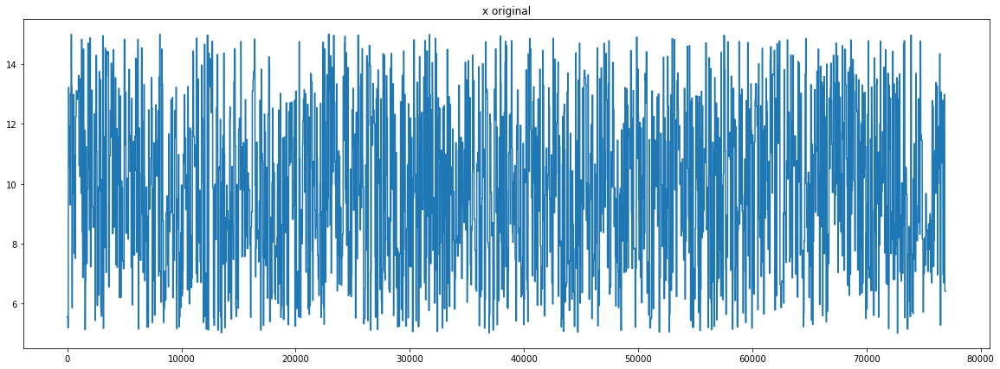

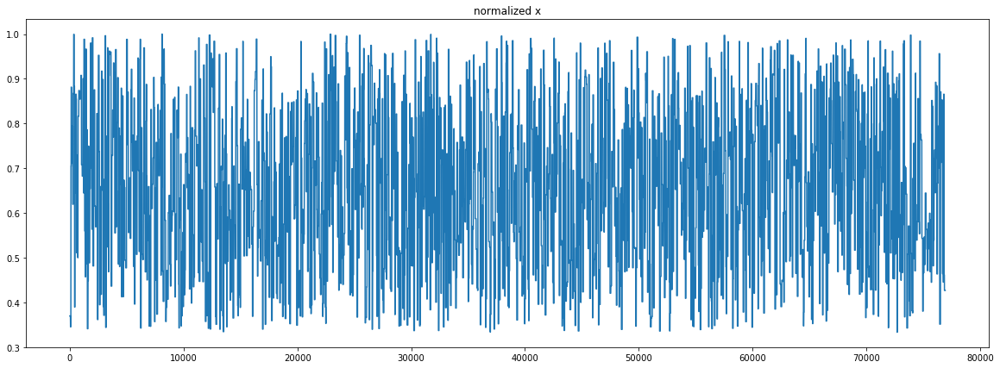

Y normalized, norms: [0.01324489]
input shape (76924, 1)
input partition shape (23078, 1)
output partition shape (23078, 1)
stacked Y shape  (23014, 1)
Y_tensor torch.Size([23014, 1])
X_tensor torch.Size([64, 23013, 1])
loading from [DC_motor_simulation/train_3_parameters.mat]
X normalized, norms: [14.99931682]
x shape (76924, 1)
x_normalized shape (76924, 1)


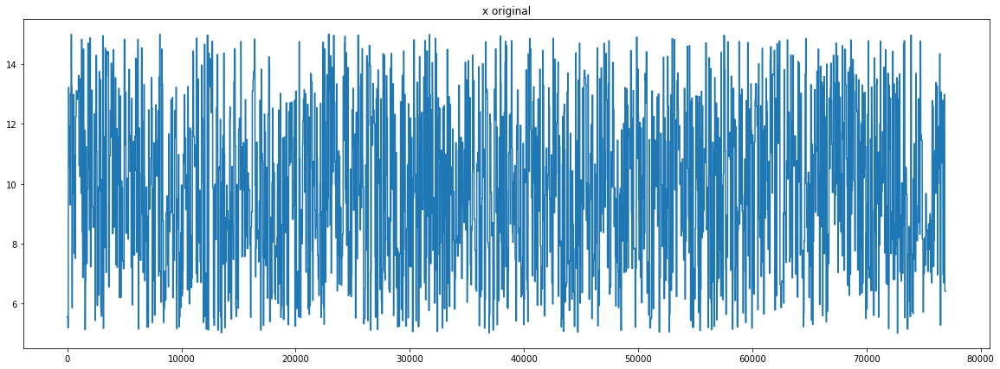

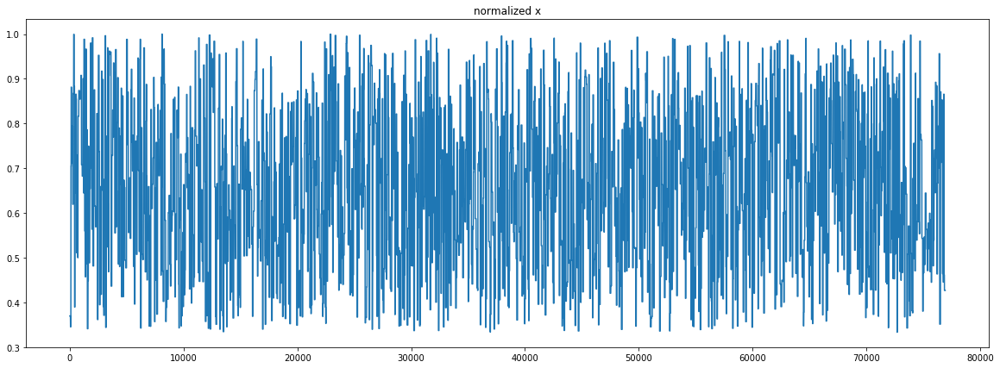

Y normalized, norms: [0.01324489]
input shape (76924, 1)
input partition shape (53846, 1)
output partition shape (53846, 1)
stacked Y shape  (53782, 1)
Y_tensor torch.Size([53782, 1])
X_tensor torch.Size([64, 53781, 1])
train set: [53782] batches
test set: [23014] batches
data_loading time 49.82928252220154 secs


In [13]:
# todo add time tracking for this cell
use_part = p_data['use_part_of_data']
print(f"using {use_part} of data")

t_tick = time.time()

test_ts_ds = TimeSeriesDataset(config=config,
                               partition=(use_part - use_part*p_data['test_size'], use_part),                        
                               logging=logging)

train_ts_ds = TimeSeriesDataset(config=config,
                                partition=(0, use_part - use_part*p_data['test_size']),
                                logging=logging)

print(f"train set: [{len(train_ts_ds)}] batches")
print(f"test set: [{len(test_ts_ds)}] batches")

if need_normalize:
    config['x_norm'] = train_ts_ds.x_norms[0]
    config['y_norm'] = train_ts_ds.y_norms[0]
    config['x_norm']
else:
    config['x_norm'] = 1
    config['y_norm'] = 1
    config['x_norm']

train_dl = DataLoader(dataset = train_ts_ds,
                      batch_sampler = BatchSampler(
                          sampler = SequentialSampler(train_ts_ds), 
                          batch_size = p_train['batch_size'],
                          drop_last = True)
                     )
test_dl = DataLoader(dataset = test_ts_ds,
                     batch_sampler = BatchSampler(
                     sampler = SequentialSampler(test_ts_ds), 
                     batch_size = p_train['batch_size'], 
                     drop_last = True)
                    )    
    
t_tock = time.time()
dataload_time = t_tock - t_tick
print(f"data_loading time {dataload_time} secs")

## Inspecting data we have, get several batches and look inside on pretty large scale to see individual iterations:

x [batch_size, retrospective_steps, channels] :torch.Size([1024, 64, 1])
y [batch_size, channels]: torch.Size([1024, 1])
y_last [slice_size]: (150,)


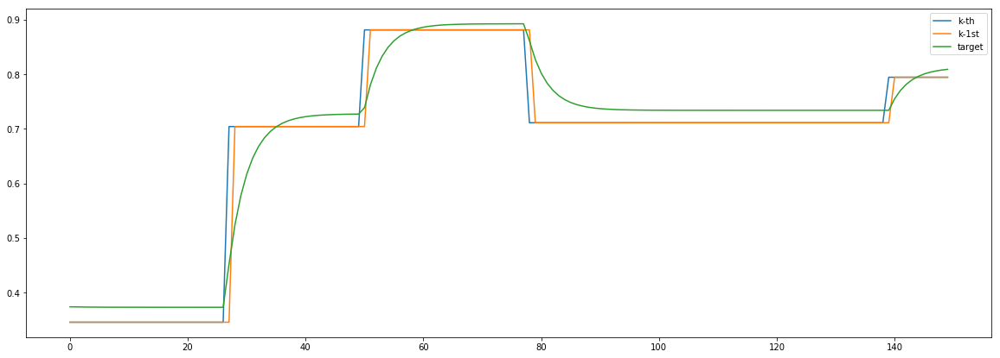

x [batch_size, retrospective_steps, channels] :torch.Size([1024, 64, 1])
y [batch_size, channels]: torch.Size([1024, 1])
y_last [slice_size]: (150,)


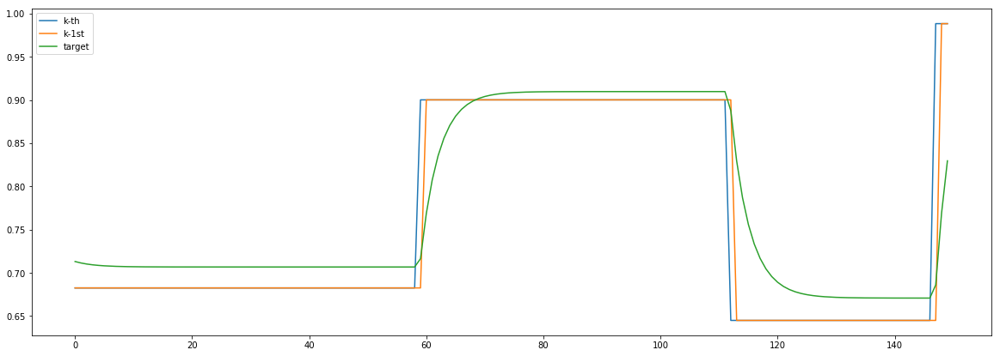

In [14]:
f, t = 0, 150
for i, batch in enumerate(train_dl):
    x, y, ind = batch
    print(f"x [batch_size, retrospective_steps, channels] :{x.shape}")
    print(f"y [batch_size, channels]: {y.shape}")
    y_kth = y.detach().numpy()[f:t, 0]
    print(f"y_last [slice_size]: {y_kth.shape}")
    x = x.transpose(0,1)
    plt.plot(x.detach().numpy()[-1][f:t], label='k-th')
    plt.plot(x.detach().numpy()[-2][f:t], label='k-1st')
    plt.plot(y_kth, label='target')
    plt.legend()
    plt.show()
    if i == 1:
        break

In [15]:
# #####################
# # 
# #####################
# from torch.nn import init
# for layer_p in a._all_weights:
#     for p in layer_p:
#         if 'weight' in p:
#             # print(p, a.__getattr__(p))
#             init.normal(a.__getattr__(p), 0.0, 0.02)

In [16]:
logging.info("History INITIALIZED")

hist = {
    
    "train":{
        "batches":{
            "main":np.zeros(len(train_dl)),
            "aux":np.zeros(len(train_dl)),
            "jordan":np.zeros(len(train_dl))
        },
        "epochs":{
            "main":np.zeros(num_epochs),
            "aux":np.zeros(num_epochs),
            "jordan":np.zeros(num_epochs)
        }
    },
    
    "eval_train":{
        "batches":{
            "main":np.zeros(len(train_dl)),
            "aux":np.zeros(len(train_dl)),
            "jordan":np.zeros(len(train_dl))
        },
        "epochs":{
            "main":np.zeros(num_epochs),
            "aux":np.zeros(num_epochs),
            "jordan":np.zeros(num_epochs)
        }
    },
    
    "eval_test":{
        "batches":{
            "main":np.zeros(len(test_dl)),
            "aux":np.zeros(len(test_dl)),
            "jordan":np.zeros(len(test_dl))
        },
        "epochs":{
            "main":np.zeros(num_epochs),
            "aux":np.zeros(num_epochs),
            "jordan":np.zeros(num_epochs)
        }
    },
    
    'mean_params_sample':
    {
        '1':np.zeros(num_epochs),
        '2':np.zeros(num_epochs),    
        '3':np.zeros(num_epochs)
    },
    'lr': np.zeros(num_epochs),
    'loss_rate': np.zeros(num_epochs),
    'weights_sum': np.zeros(num_epochs), 
    'weights_var': np.zeros(num_epochs),
    
    'grads':{
        'batches':{name: np.zeros(len(train_dl)) for name, parameter in model.named_parameters()},
        'epochs':{name: np.zeros(num_epochs) for name, parameter in model.named_parameters()}
    },
    'weights':{
        'batches':{name: np.zeros(len(train_dl)) for name, parameter in model.named_parameters()},
        'epochs':{name: np.zeros(num_epochs) for name, parameter in model.named_parameters()}
    },
    'vars':{
        'batches':{name: np.zeros(len(train_dl)) for name, parameter in model.named_parameters()},
        'epochs':{name: np.zeros(num_epochs) for name, parameter in model.named_parameters()}
    },
    'param_grads':{
        'batches':{"p1":np.zeros(len(train_dl)),
                   "p2":np.zeros(len(train_dl)),
                   "p3":np.zeros(len(train_dl))
                  },
        'epochs':{
            "p1":np.zeros(num_epochs), 
            "p2":np.zeros(num_epochs),
            "p3":np.zeros(num_epochs)
        }
    },
    'aux_global':[],
    'grad_global':{'p1':[], 'p2':[],'p3':[],'lstm':[], 'linear':[]}
}

In [17]:
def batch_iteration(iter_index, model, optimizer, batch_data, backprop, hist_part):
    
    x_batch, y_batch, indexes = batch_data
    x_batch.transpose_(0, 1) # todo get rid of it
    model.hidden = model.init_hidden()   
    
    
    if backprop:
        y_pred, jordan = model(x_batch)
        
        losses = loss_fn(y_pred, jordan.t(), y_batch, x_batch, config, 
                        jord_flag=False,
                        core_flag=False,
                      aux_flag=True,
                      perfect_params_flag=False )
        main_loss, aux_loss, aux_residuals, jordan_loss = losses
        
        optimizer.zero_grad()
        aux_loss *= 10**p_train['aux_loss']['scaling_order']
        hist_part["aux"][iter_index] = aux_loss.item()
        aux_loss.backward()
        optimizer.step()
        
        losses = loss_fn(y_pred, jordan.t(), y_batch, x_batch, config, 
                        jord_flag=True,
                        core_flag=False,
                      aux_flag=False,
                      perfect_params_flag=False )
        main_loss, aux_loss, aux_residuals, jordan_loss = losses
        
        optim_jord.zero_grad()
        jordan_loss *= 10**p_train['jordan_loss']['scaling_order'] # TODO change to special
        hist_part["jordan"][iter_index] = jordan_loss.item()    
        jordan_loss.backward()
        optim_jord.step()

        main_loss *= 0 #10*p_train['core_loss']['scaling_order']
        
        
        
    else:
        y_pred, jordan = model(x_batch)
        losses = loss_fn(y_pred, jordan.t(), y_batch, x_batch, config, 
                        jord_flag=True,
                        core_flag=True,
                      aux_flag=False,
                         blind_aux_flag=True,
                      perfect_params_flag=False )
        main_loss, aux_loss, aux_residuals, jordan_loss = losses
        
        
#         optimizer.zero_grad()
        
#         aux_loss.backward()
        
#         combined_loss.backward()
    # TODO or manually add weight decay here when grad is ready
    #         print(f"losses after scaling: m[{main_loss.item()}] a[{aux_loss.item()}] c[{const_loss.item()}]")
        for name, parameter in model.named_parameters():
            hist['grads']['batches'][name][iter_index] = parameter.grad.sum().item()
            hist['weights']['batches'][name][iter_index] = parameter.sum().item()
            hist['vars']['batches'][name][iter_index] = parameter.var().item()
        hist['param_grads']['batches']['p1'][iter_index] = model.jordan.grad[0][0].item()
        hist['param_grads']['batches']['p2'][iter_index] = model.jordan.grad[0][1].item()
        hist['param_grads']['batches']['p3'][iter_index] = model.jordan.grad[0][2].item()
        
        hist['grad_global']['p1'].append(model.jordan.grad[0][0].item())
        hist['grad_global']['p2'].append(model.jordan.grad[0][1].item())
        hist['grad_global']['p3'].append(model.jordan.grad[0][2].item())
        
        hist['grad_global']['lstm'].append(sum([p.grad.abs().sum() for p in model.lstm.parameters()]).item())
        hist['grad_global']['linear'].append(sum([p.grad.abs().sum() for p in model.linear.parameters()]).item())
        hist['aux_global'].append(aux_loss.item())
        
#         optimizer.step()
    
    hist_part["main"][iter_index] = main_loss.item()
    
    return y_pred, jordan

In [18]:
def update_long_term_hist(batches_hist, long_term_hist):
    mean_main = np.average(batches_hist["main"])
    mean_aux = np.average(batches_hist["aux"])
    mean_jord = np.average(batches_hist["jordan"])
    long_term_hist["main"][t] = mean_main
    long_term_hist["aux"][t] = mean_aux
    long_term_hist["jordan"][t] = mean_jord
    return mean_main, mean_aux, mean_jord

In [19]:
def slice_loss_sum(losses_dict, index):
    return sum([val[index] for val in losses_dict.values()])

In [20]:
for p in model.parameters():
    print(p)

Parameter containing:
tensor([[0., 0., 0.]], requires_grad=True)
Parameter containing:
tensor([[-0.2958,  0.1372, -0.4005,  0.2693],
        [ 0.6434,  0.4666, -0.3461,  0.6567],
        [ 0.2316, -0.3834,  0.1630, -0.3994],
        [ 0.3054,  0.3403, -0.2078, -0.1890],
        [-0.2021, -0.2226,  0.4199, -0.1315],
        [-0.0274, -0.5514,  0.3847, -0.1342],
        [-0.5645, -0.1765, -0.4501, -0.6618],
        [ 0.4908, -0.3188, -0.1642, -0.2010]], requires_grad=True)
Parameter containing:
tensor([[ 0.1723,  0.6252],
        [ 0.1462, -0.6317],
        [-0.2065, -0.4474],
        [ 0.5401, -0.5003],
        [-0.6542, -0.2617],
        [ 0.2678,  0.2277],
        [ 0.5699,  0.6861],
        [ 0.0404, -0.4446]], requires_grad=True)
Parameter containing:
tensor([-0.3223, -0.0477,  0.3737,  0.2032,  0.3801,  0.2675,  0.0535, -0.6752],
       requires_grad=True)
Parameter containing:
tensor([ 0.3179,  0.2635,  0.0940,  0.1236,  0.5515, -0.5637, -0.2181,  0.6453],
       requires_grad=Tru

## Train model


aux preds: 0.10853994637727737           0.3309052288532257           0.07446907460689545
main loss 0.0
aux loss 9728.243295522836
jord loss 999274.0396634615
combined loss 1009002.2829589844 



Parameter containing:
tensor([[0.1085, 0.3309, 0.0745]], requires_grad=True)


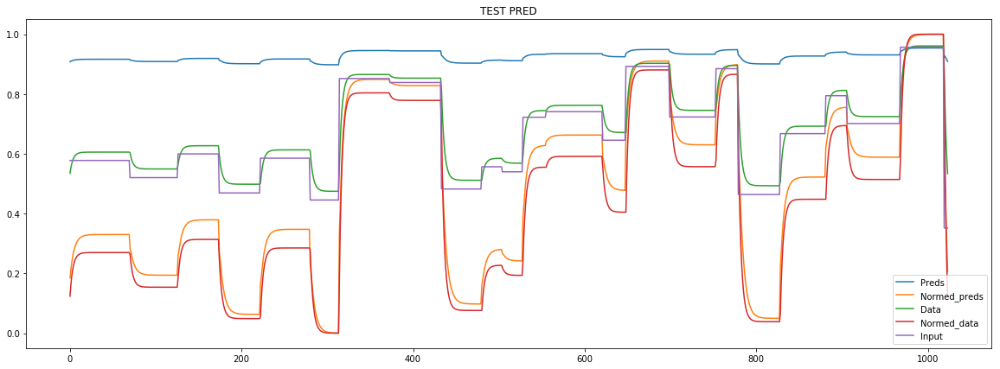

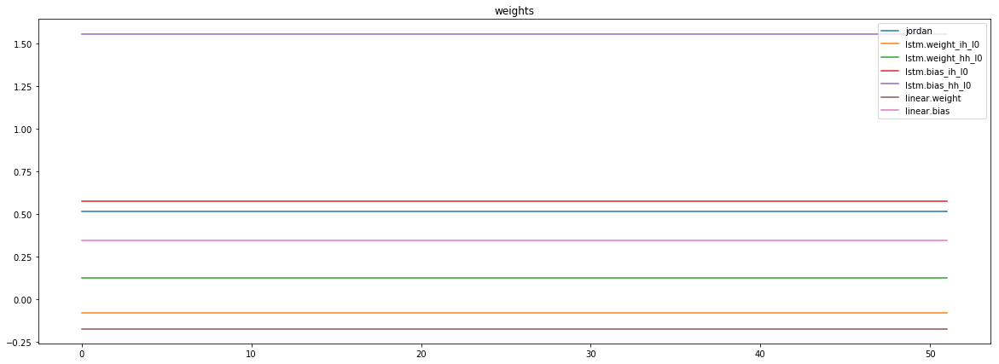

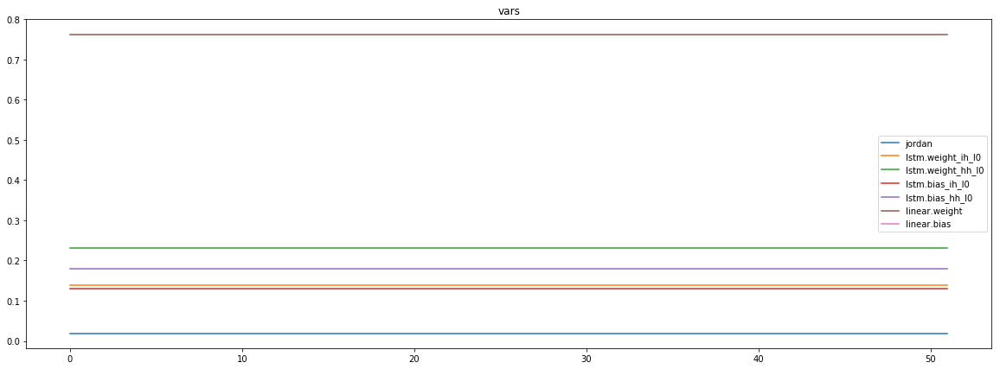

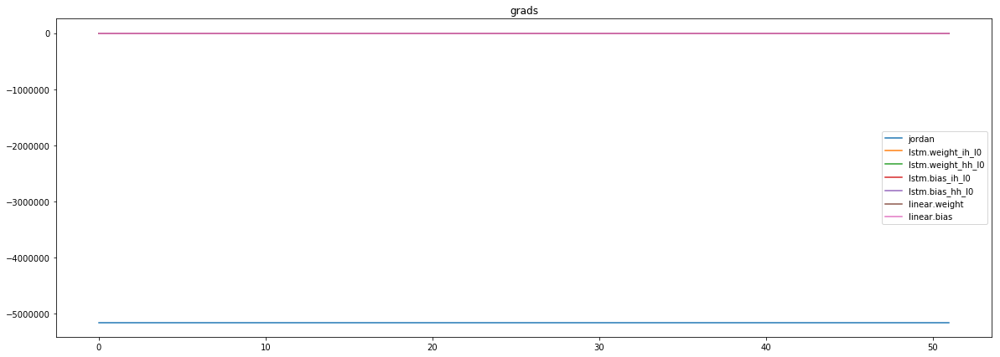

mean_p1 : -4520729.0
mean_p2 : -625535.0
mean_p3 : -6259.77783203125


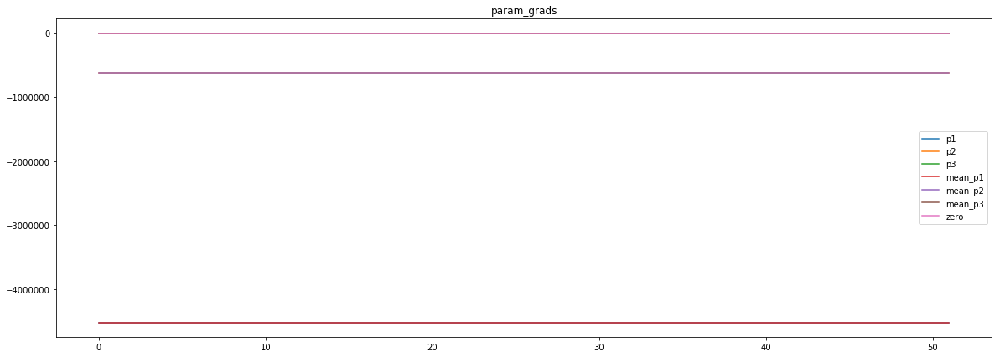

Epoch [0] 
     train_loss[1009002.2829589844] 
     eval_train[18.020298866125252] 
     eval_test[17.184719129042193]



aux preds: 0.1562952995300293           0.7340956926345825           0.15531320869922638
main loss 0.0
aux loss 1941.3606661283052
jord loss 286291.2548076923
combined loss 288232.6154738206 



Parameter containing:
tensor([[0.1563, 0.7341, 0.1553]], requires_grad=True)


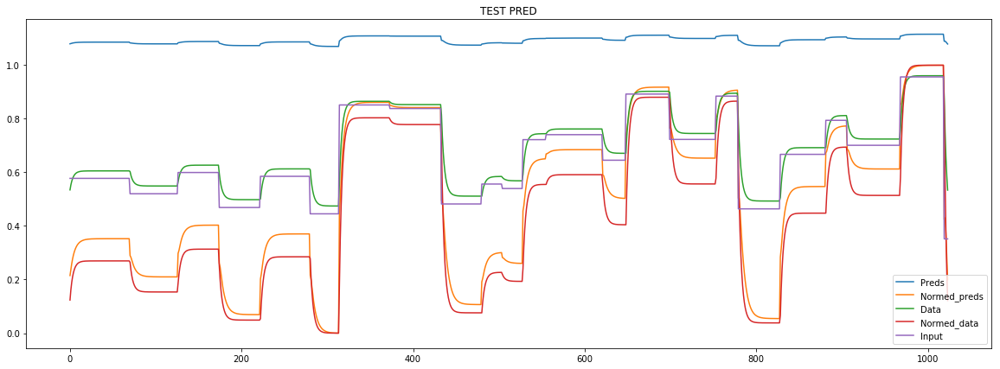

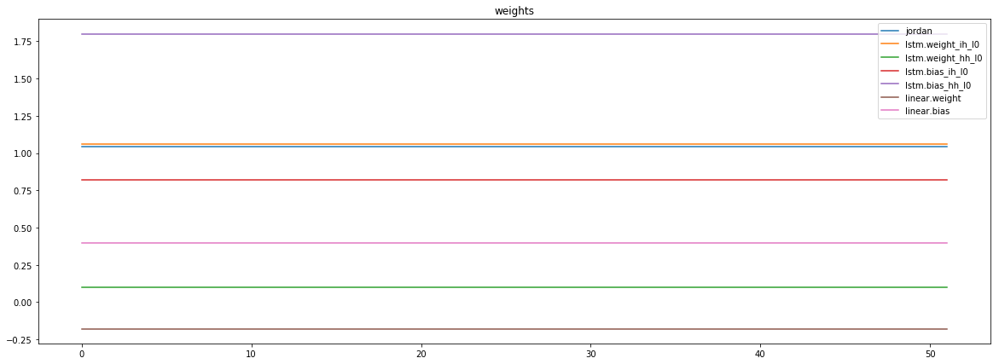

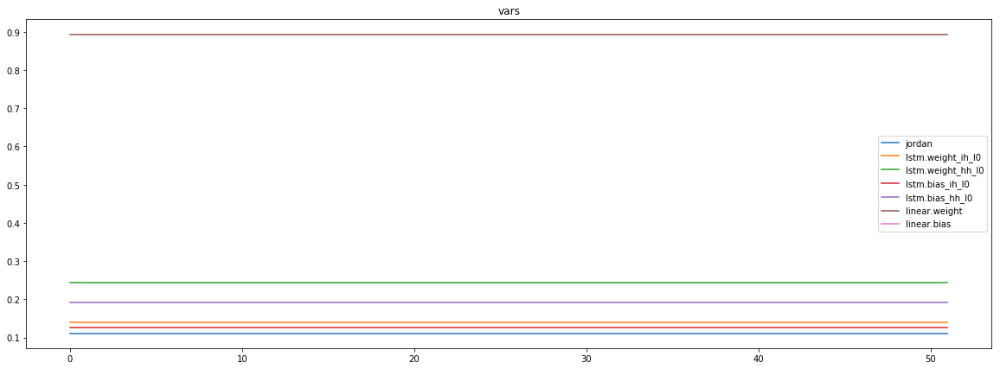

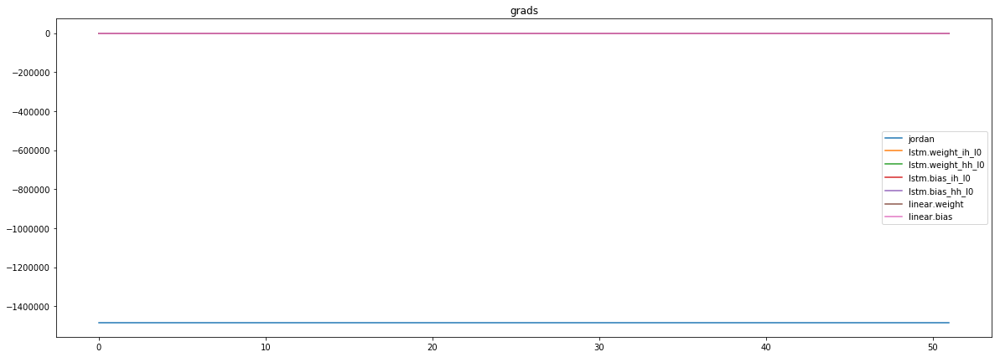

mean_p1 : -1048623.125
mean_p2 : -429895.25
mean_p3 : -4296.3203125


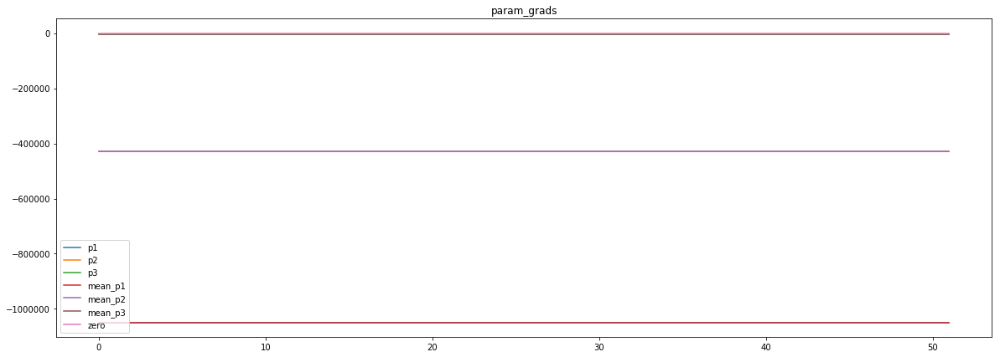

Epoch [1] 
     train_loss[288232.6154738206] 
     eval_train[29.875489638401913] 
     eval_test[29.029173590920188]



aux preds: 0.18581503629684448           1.1010124683380127           0.3134150505065918
main loss 0.0
aux loss 915.7225705660306
jord loss 61621.19146259014
combined loss 62536.91403315617 



Parameter containing:
tensor([[0.1858, 1.1010, 0.3134]], requires_grad=True)


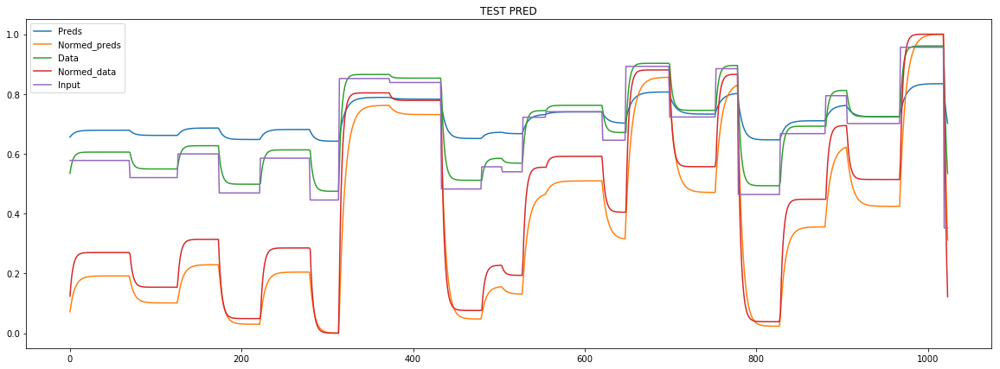

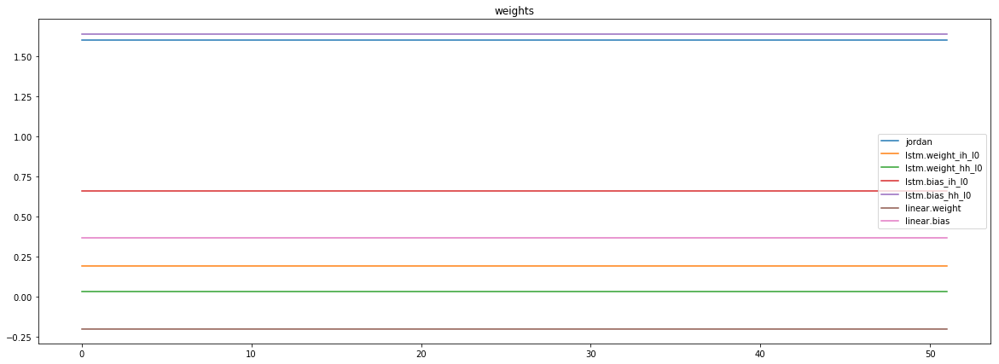

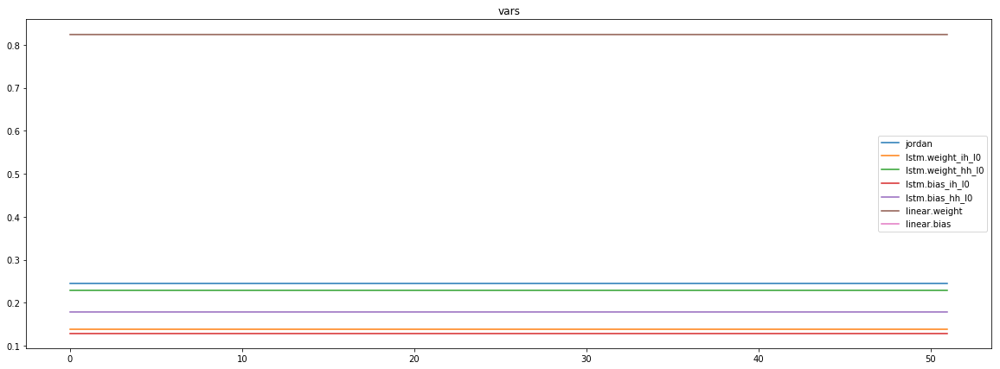

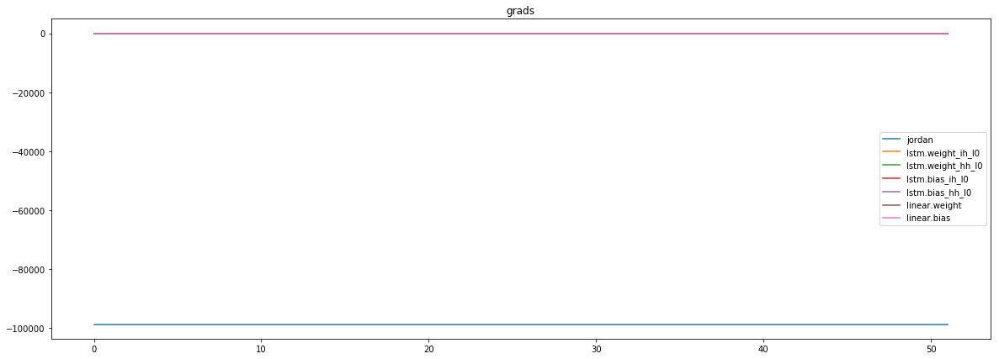

mean_p1 : -94480.6015625
mean_p2 : -3702.4990234375
mean_p3 : -566.489501953125


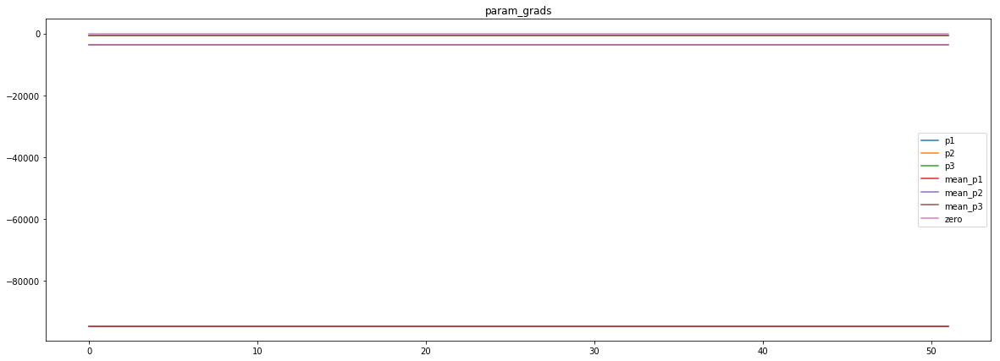

Epoch [2] 
     train_loss[62536.91403315617] 
     eval_train[7.172854781150818] 
     eval_test[6.919001947749745]



aux preds: 0.2111777514219284           1.0942449569702148           0.4232194125652313
main loss 0.0
aux loss 541.9717935415415
jord loss 11703.509202223559
combined loss 12245.4809957651 



Parameter containing:
tensor([[0.2112, 1.0942, 0.4232]], requires_grad=True)


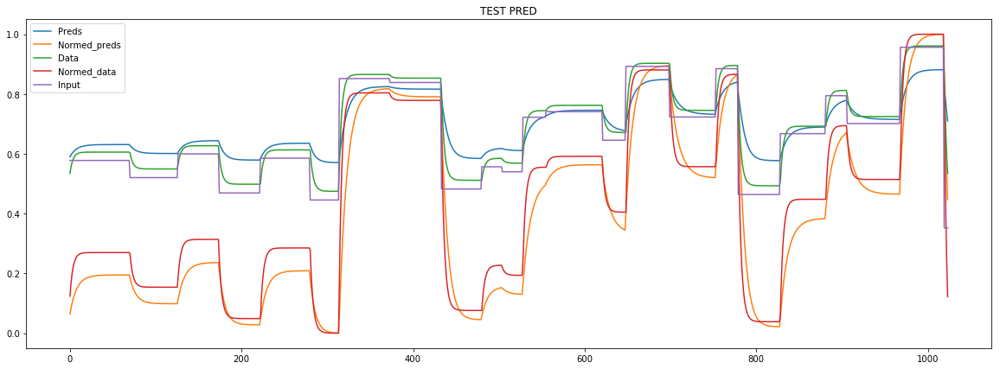

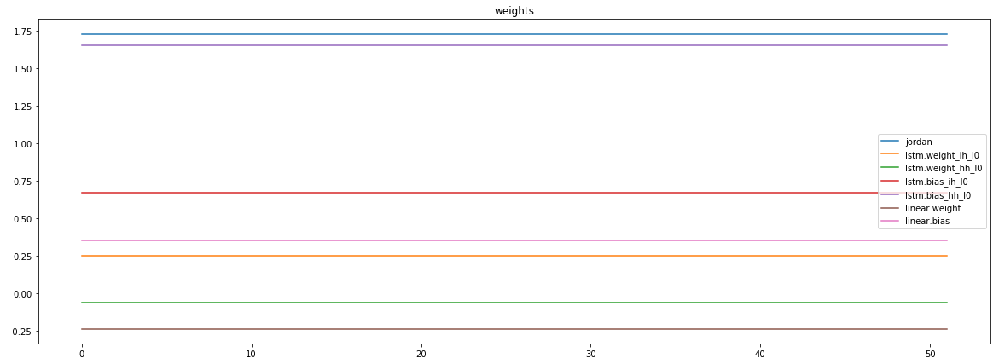

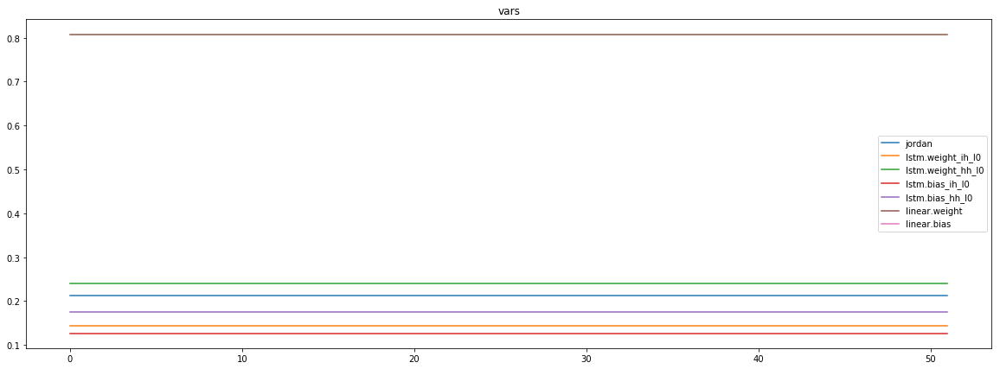

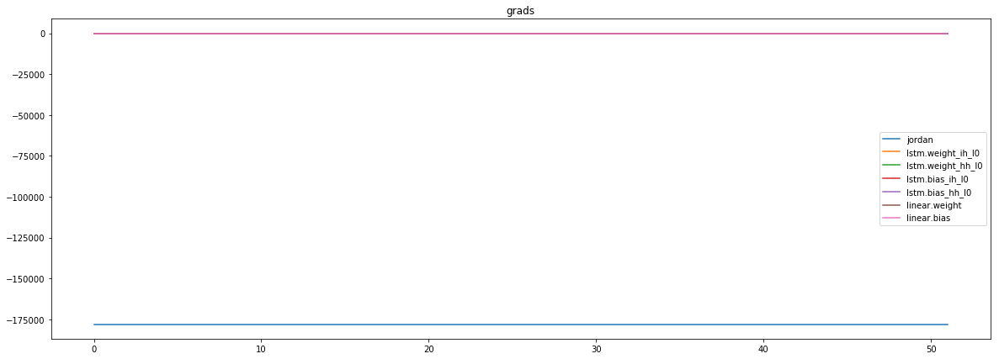

mean_p1 : -76174.53125
mean_p2 : -100297.1015625
mean_p3 : -1492.2923583984375


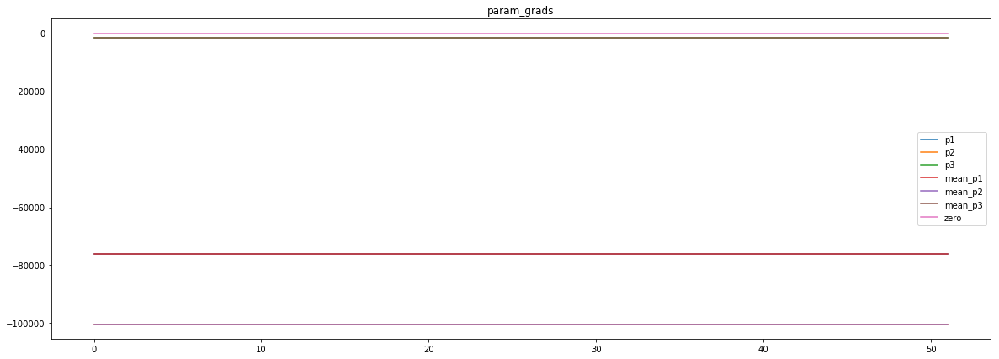

Epoch [3] 
     train_loss[12245.4809957651] 
     eval_train[4.56421186373784] 
     eval_test[4.405800960280678]



aux preds: 0.27541008591651917           1.091310739517212           0.6419892907142639
main loss 0.0
aux loss 293.4261703491211
jord loss 8993.304377629207
combined loss 9286.730547978328 



Parameter containing:
tensor([[0.2754, 1.0913, 0.6420]], requires_grad=True)


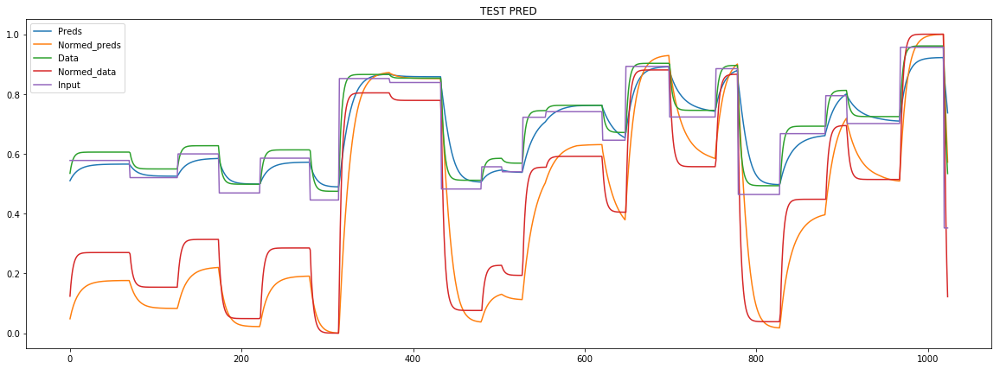

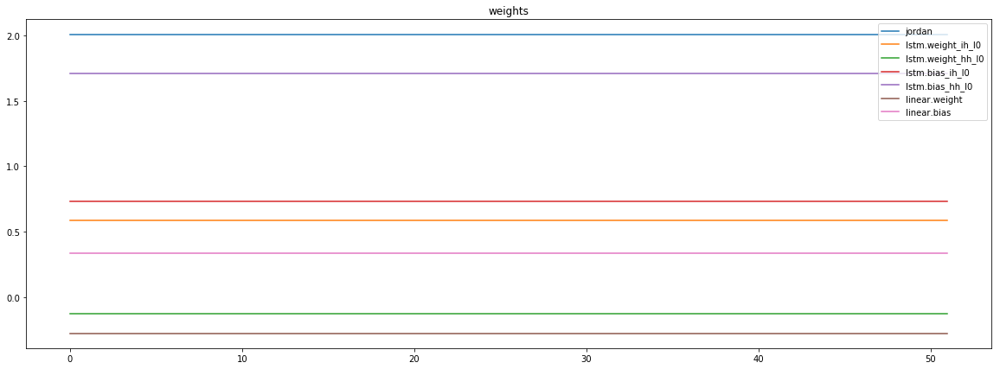

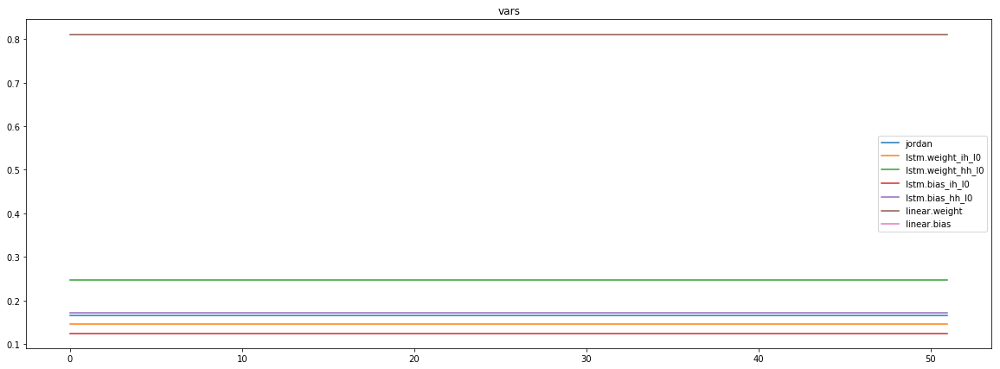

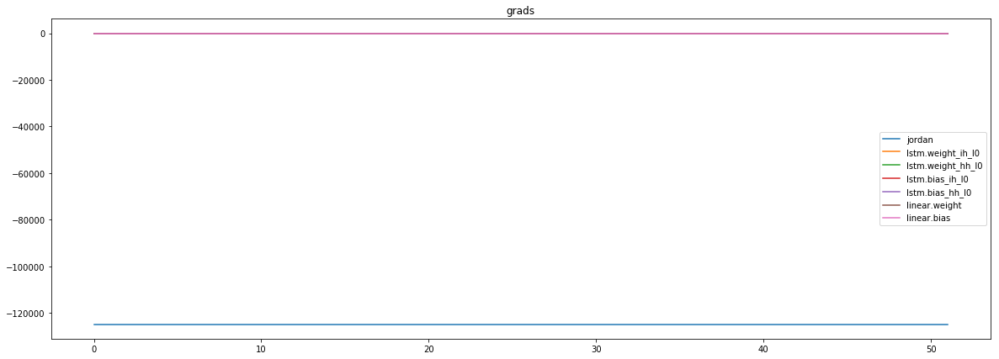

mean_p1 : -45077.57421875
mean_p2 : -78527.8203125
mean_p3 : -1164.3525390625


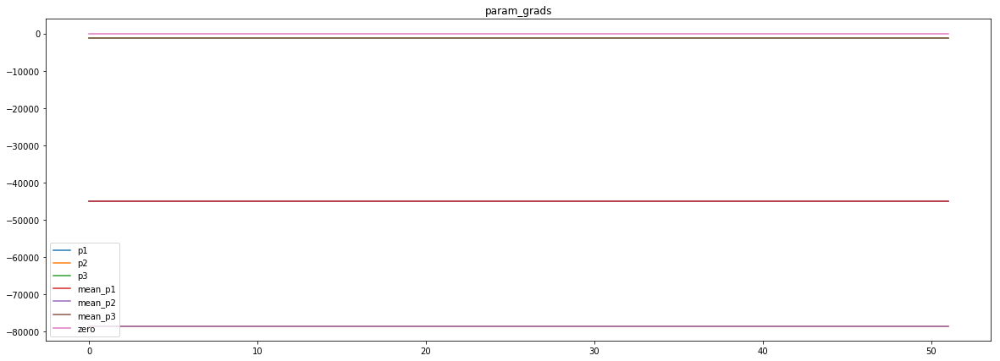

loss rate [0.7712066462253091]
Epoch [4] 
     train_loss[9286.730547978328] 
     eval_train[3.13027632694978] 
     eval_test[3.0775738737799903]



aux preds: 0.3964986205101013           1.088477373123169           0.8989535570144653
main loss 0.0
aux loss 172.58696746826172
jord loss 5416.864253117488
combined loss 5589.45122058575 



Parameter containing:
tensor([[0.3965, 1.0885, 0.8990]], requires_grad=True)


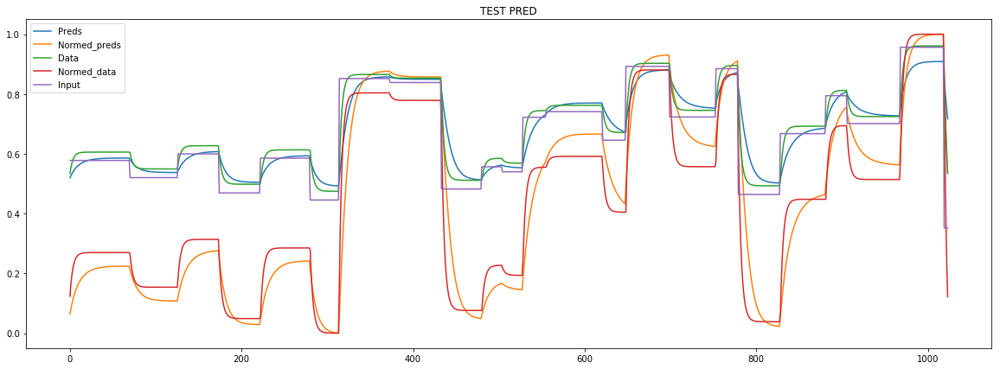

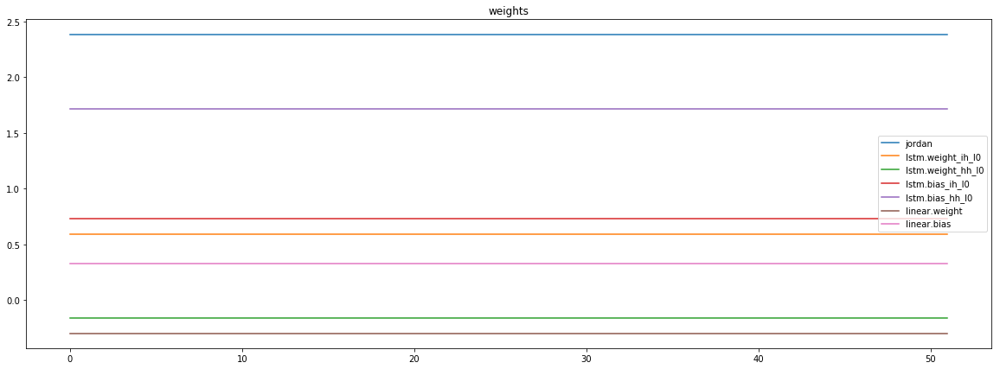

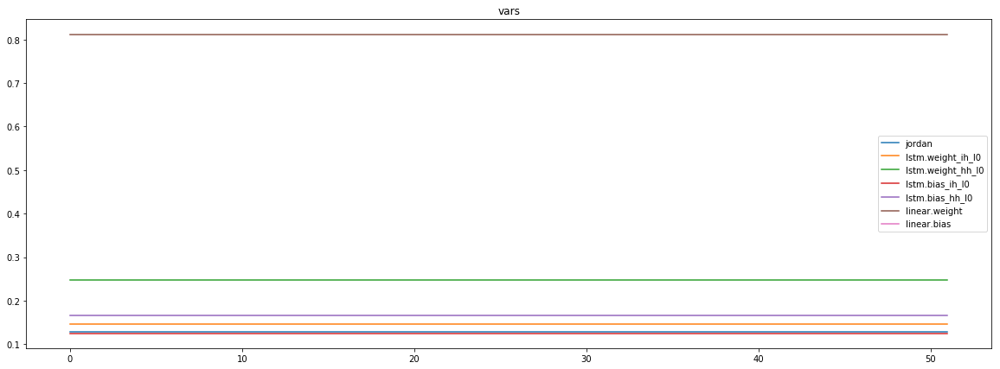

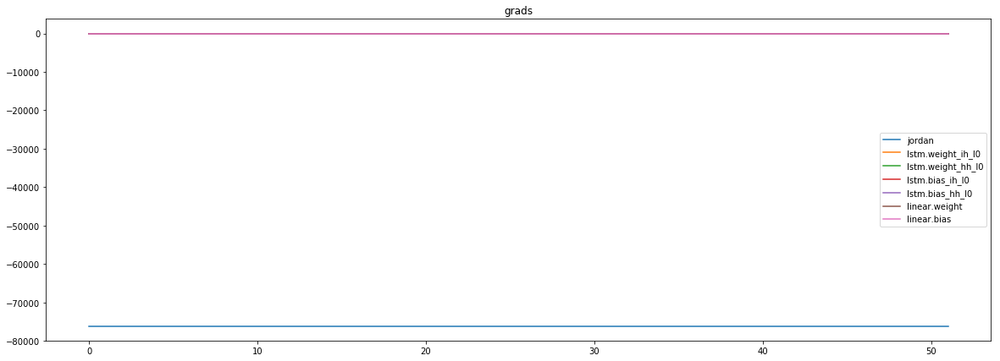

mean_p1 : -21019.3984375
mean_p2 : -54266.03515625
mean_p3 : -815.89697265625


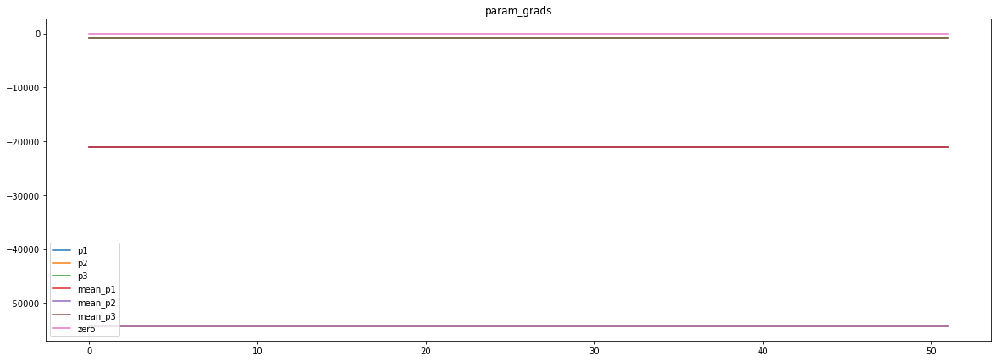

loss rate [0.4423072637529514]
Epoch [5] 
     train_loss[5589.45122058575] 
     eval_train[2.6863662096170278] 
     eval_test[2.6773669719696045]



aux preds: 0.5004305839538574           1.0874372720718384           1.1613184213638306
main loss 0.0
aux loss 107.5025433760423
jord loss 3041.603999211238
combined loss 3149.1065425872803 



Parameter containing:
tensor([[0.5004, 1.0874, 1.1613]], requires_grad=True)


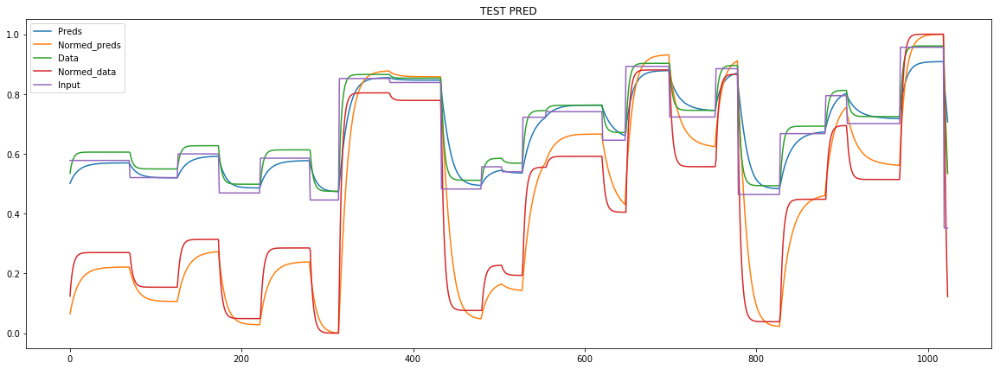

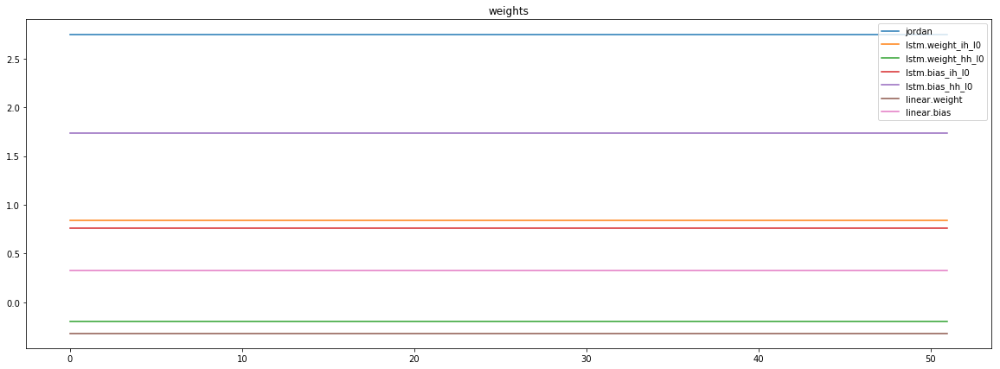

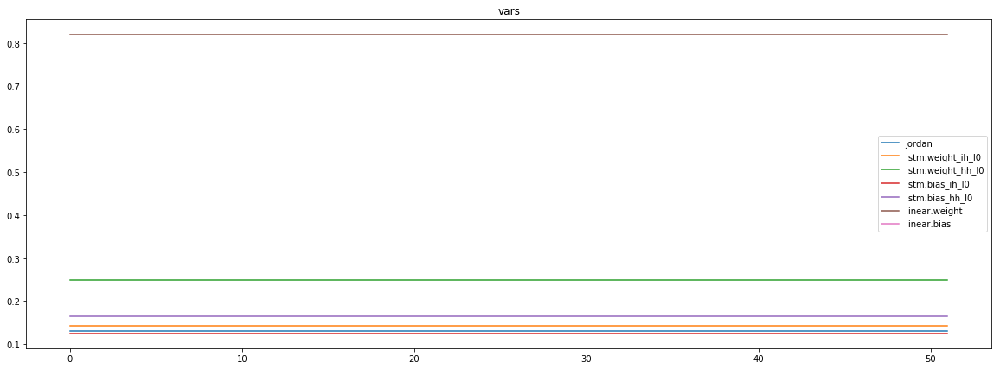

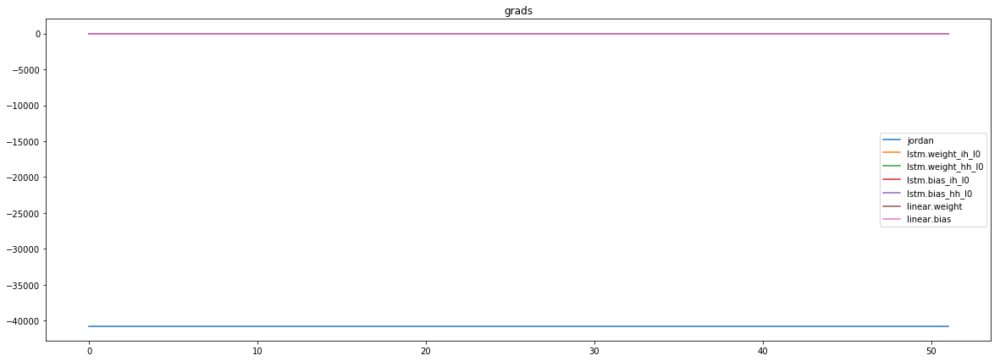

mean_p1 : -1212.775390625
mean_p2 : -38895.39453125
mean_p3 : -611.1649780273438


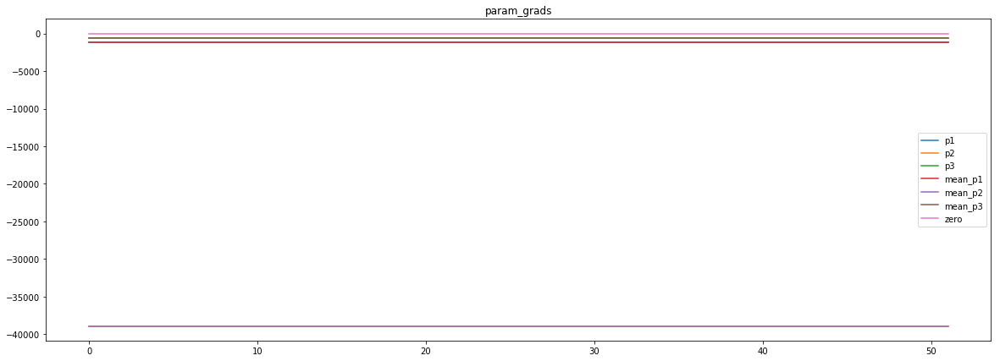

loss rate [0.19061228614181824]
Epoch [6] 
     train_loss[3149.1065425872803] 
     eval_train[2.7280380381987643] 
     eval_test[2.7413265271620317]



aux preds: 0.5535195469856262           1.0847969055175781           1.423903465270996
main loss 0.0
aux loss 84.9778198829064
jord loss 2714.270010141226
combined loss 2799.2478300241323 



Parameter containing:
tensor([[0.5535, 1.0848, 1.4239]], requires_grad=True)


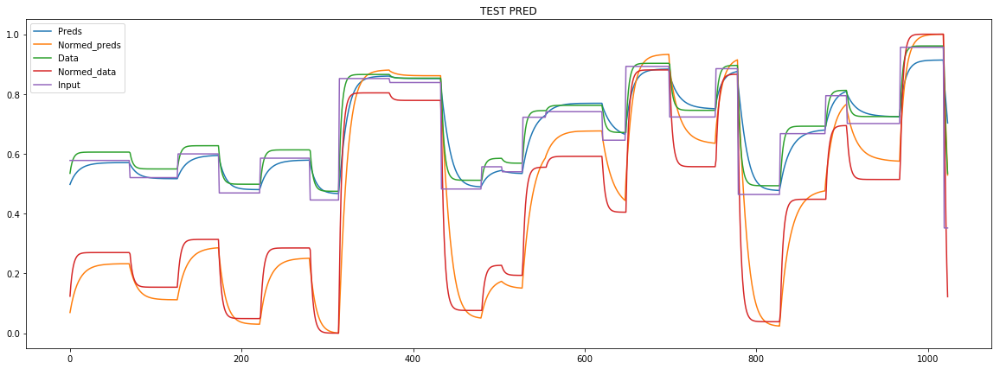

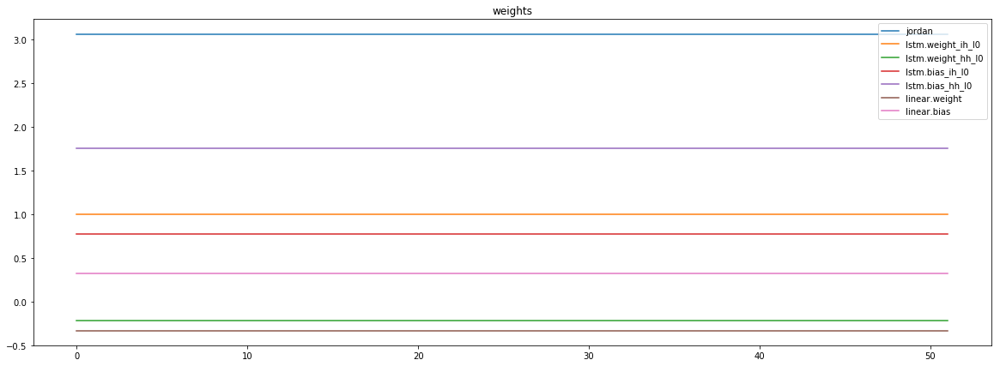

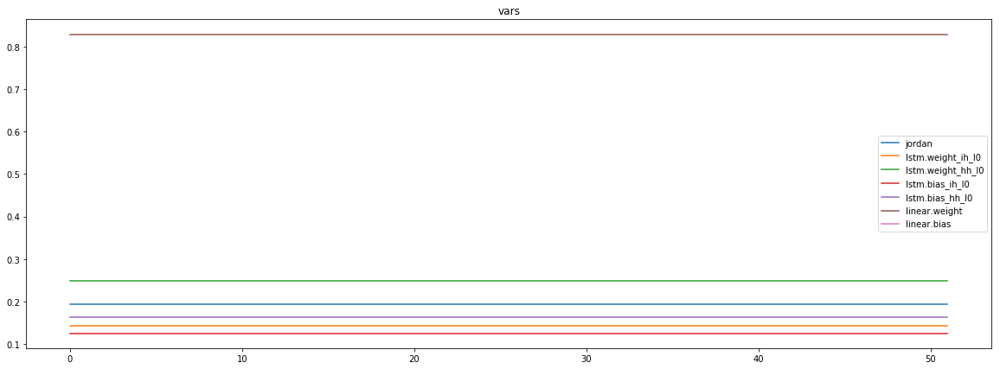

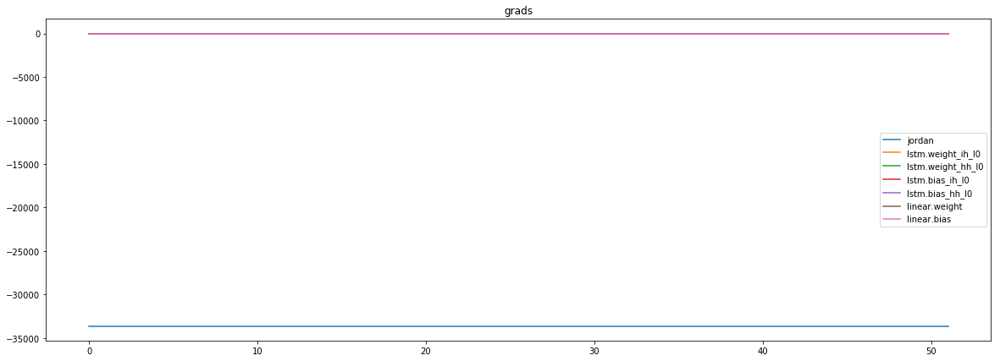

mean_p1 : 297.949951171875
mean_p2 : -33400.88671875
mean_p3 : -525.1348266601562


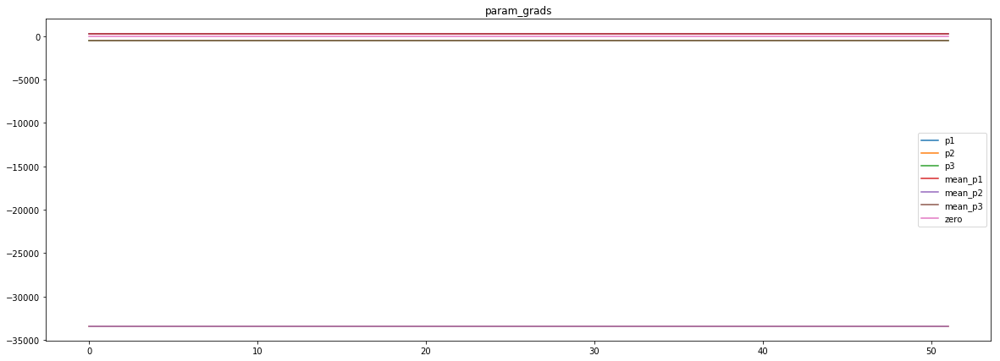

loss rate [0.09587232188899408]
Epoch [7] 
     train_loss[2799.2478300241323] 
     eval_train[2.50758879001324] 
     eval_test[2.560570164160295]



aux preds: 0.5681612491607666           1.0835051536560059           1.6953880786895752
main loss 0.0
aux loss 74.53855323791504
jord loss 2635.9986900916465
combined loss 2710.5372433295615 



Parameter containing:
tensor([[0.5682, 1.0835, 1.6954]], requires_grad=True)


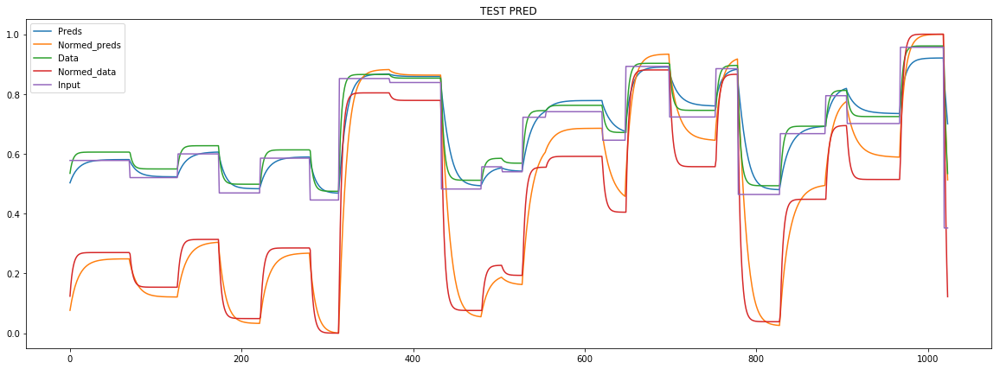

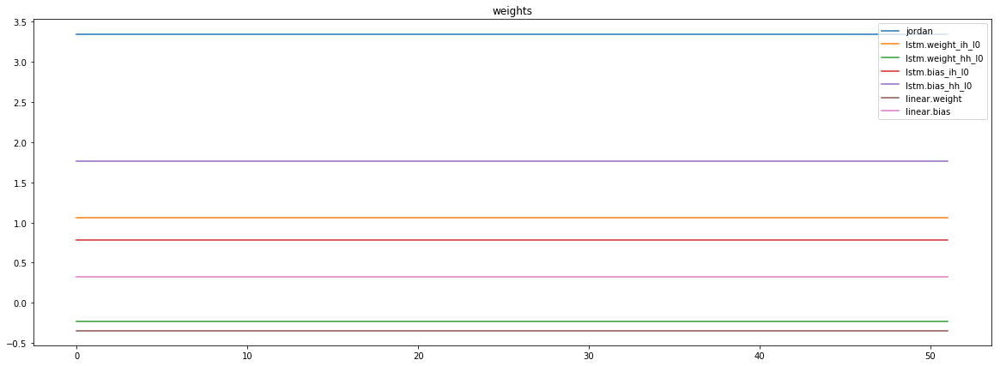

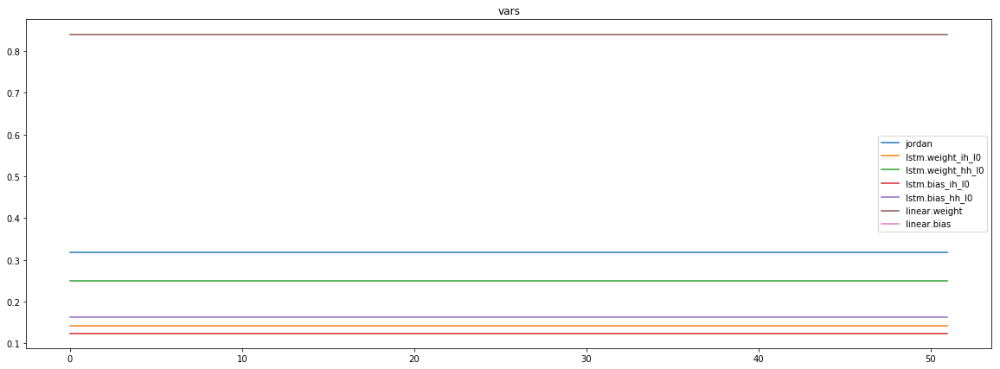

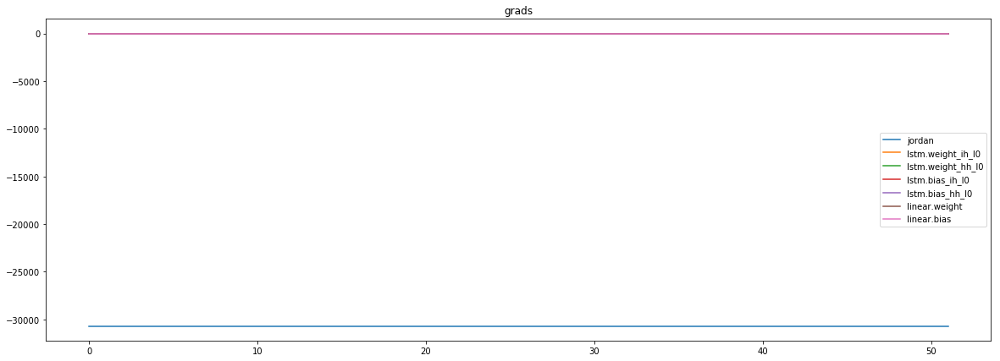

mean_p1 : 639.4107055664062
mean_p2 : -30823.5703125
mean_p3 : -492.1380310058594


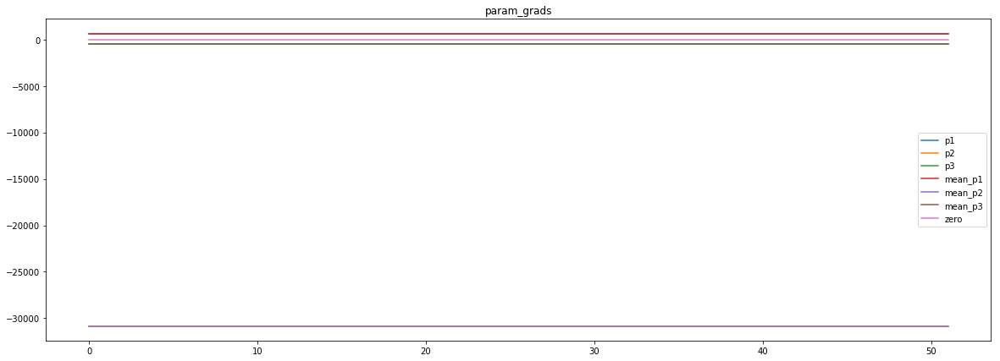

loss rate [0.14628186676836474]
Epoch [8] 
     train_loss[2710.5372433295615] 
     eval_train[2.1975401433614583] 
     eval_test[2.270680693062869]



aux preds: 0.5691700577735901           1.0823382139205933           1.9672620296478271
main loss 0.0
aux loss 70.9298361998338
jord loss 2585.7041461651143
combined loss 2656.633982364948 



Parameter containing:
tensor([[0.5692, 1.0823, 1.9673]], requires_grad=True)


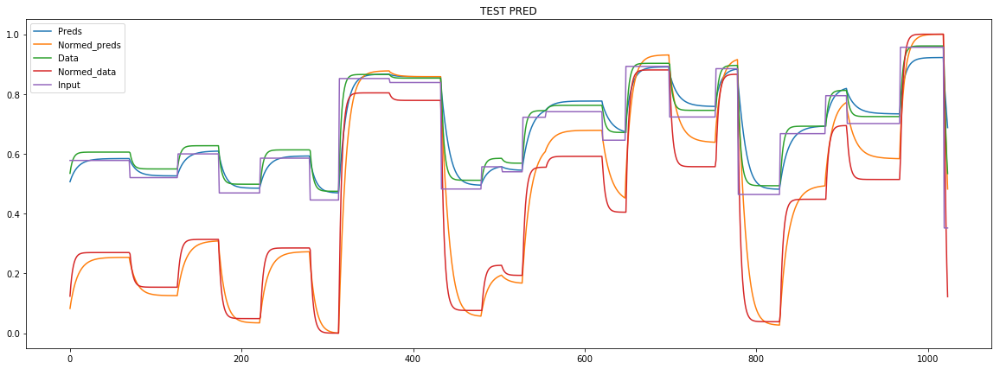

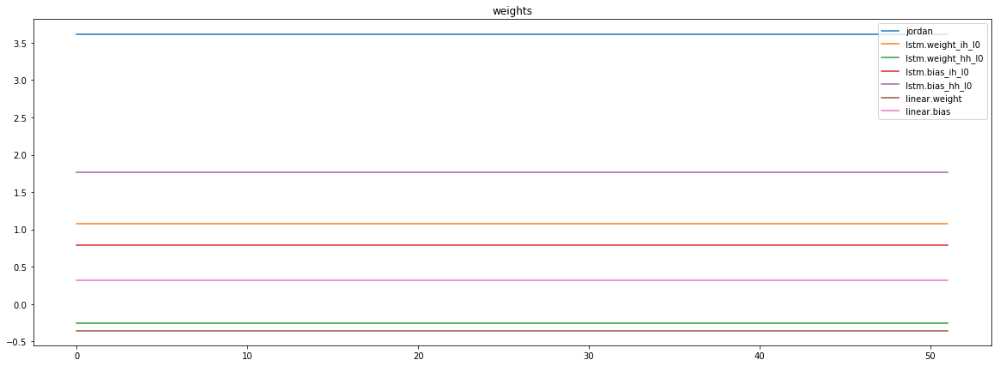

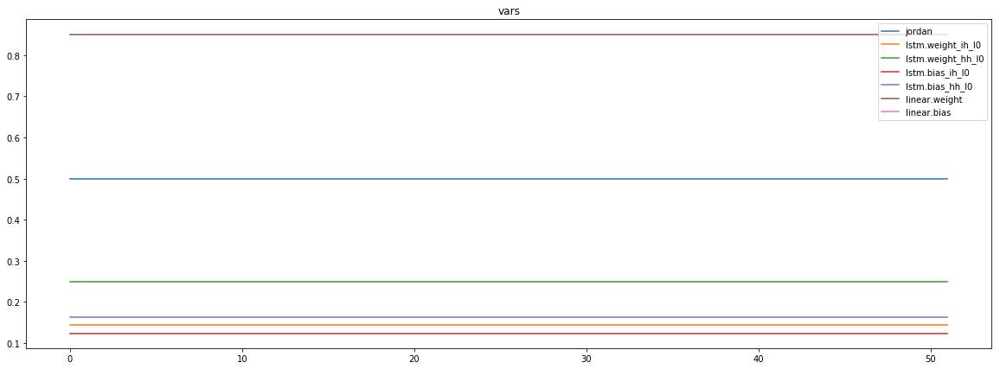

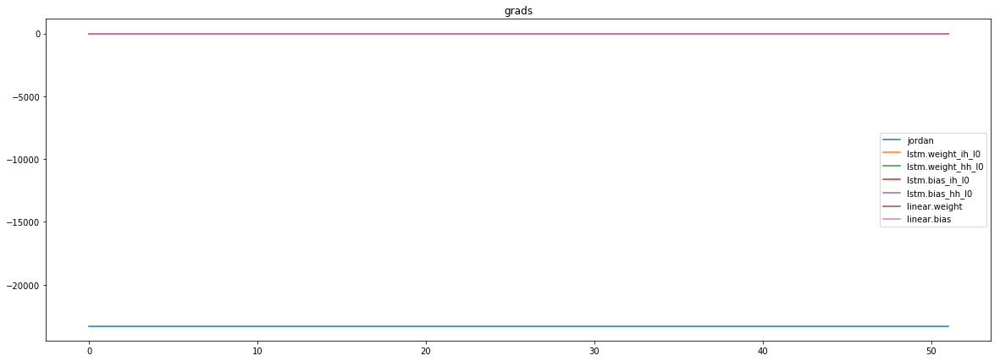

mean_p1 : 940.7037353515625
mean_p2 : -23810.48046875
mean_p3 : -420.9325866699219


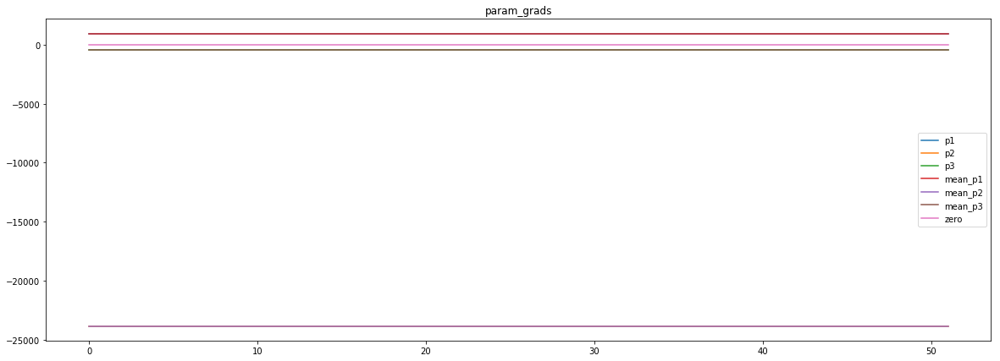

loss rate [0.18539224801750898]
Epoch [9] 
     train_loss[2656.633982364948] 
     eval_train[1.9920937900359814] 
     eval_test[2.056226746602492]



aux preds: 0.5662098526954651           1.0788413286209106           2.22379994392395
main loss 0.0
aux loss 63.22583037156325
jord loss 2539.1114220252402
combined loss 2602.3372523968037 



Parameter containing:
tensor([[0.5662, 1.0788, 2.2238]], requires_grad=True)


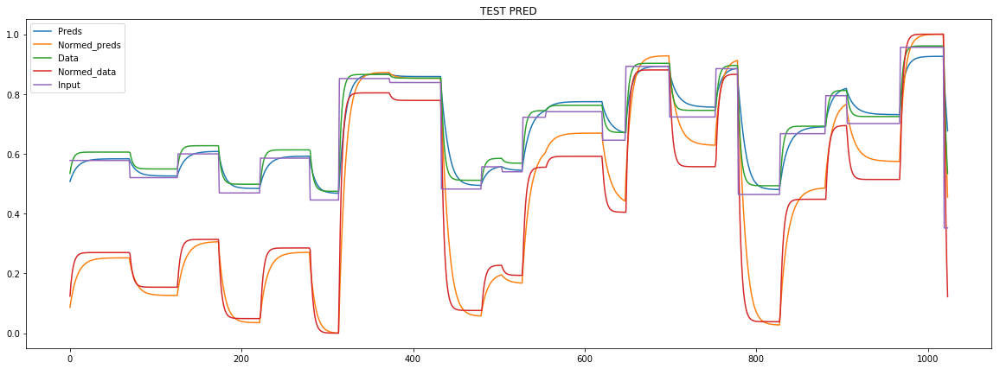

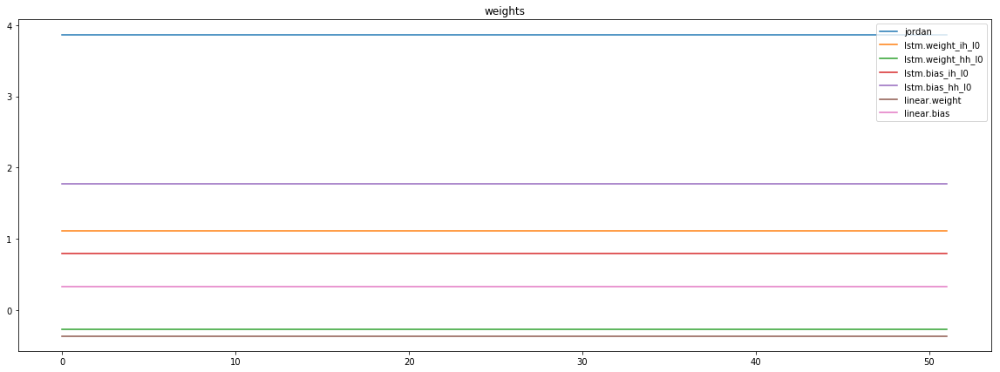

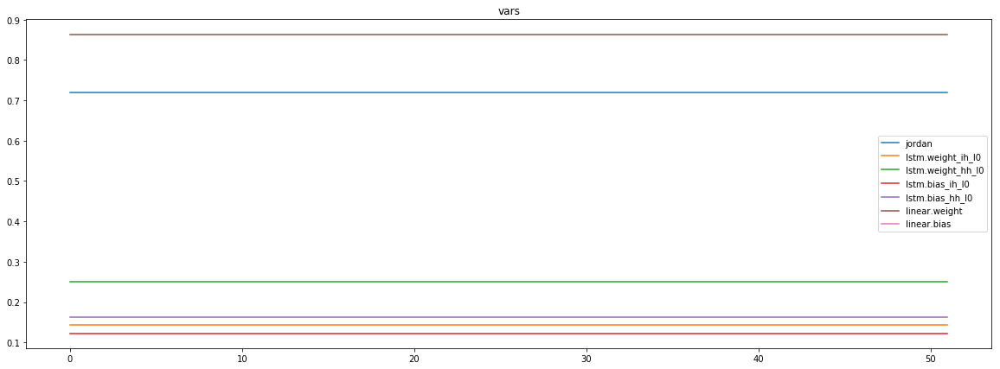

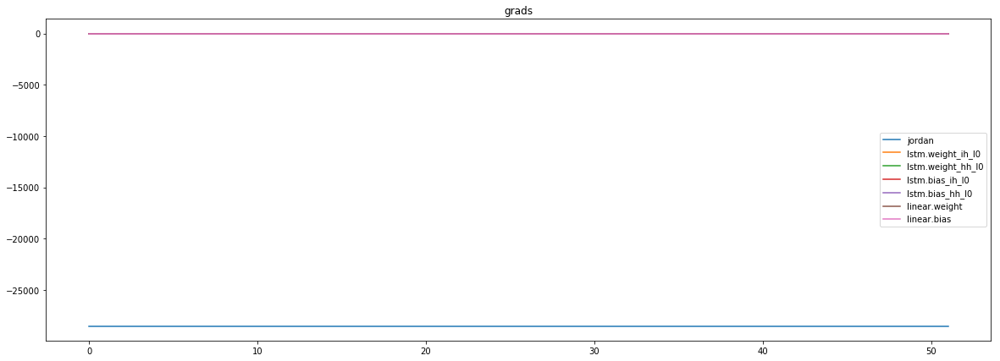

mean_p1 : 935.337646484375
mean_p2 : -28976.404296875
mean_p3 : -472.8063049316406


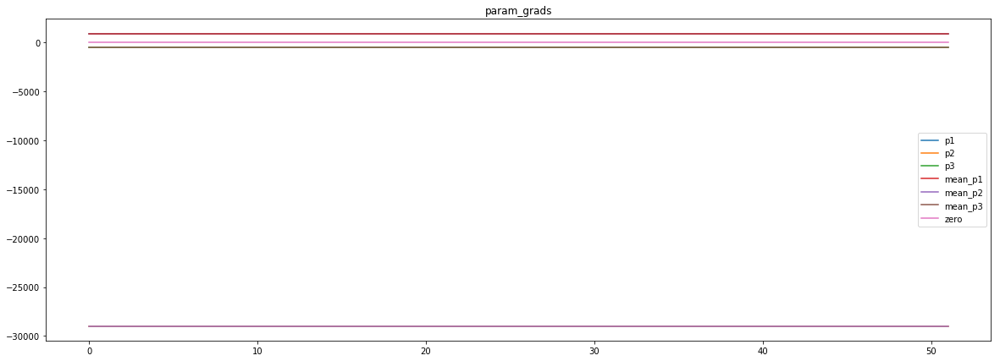

loss rate [0.17511367623185414]
Epoch [10] 
     train_loss[2602.3372523968037] 
     eval_train[1.836939195027718] 
     eval_test[1.8937953602183948]



aux preds: 0.5555692911148071           1.077066421508789           2.4854836463928223
main loss 0.0
aux loss 59.46187840975248
jord loss 2484.5855759840747
combined loss 2544.047454393827 



Parameter containing:
tensor([[0.5556, 1.0771, 2.4855]], requires_grad=True)


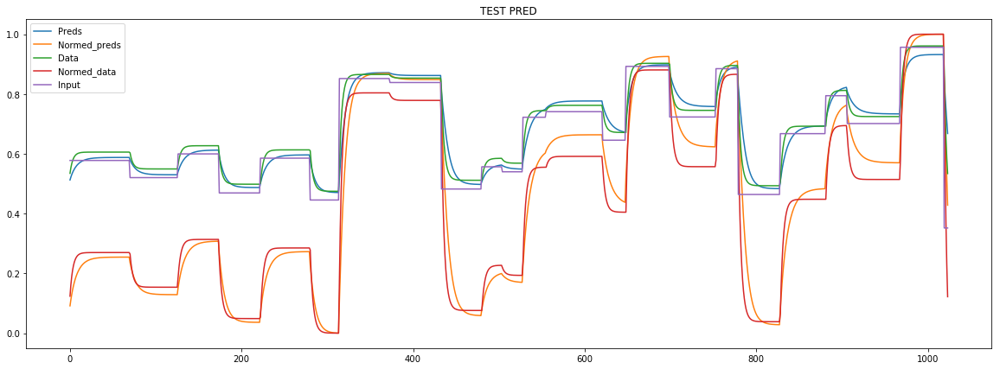

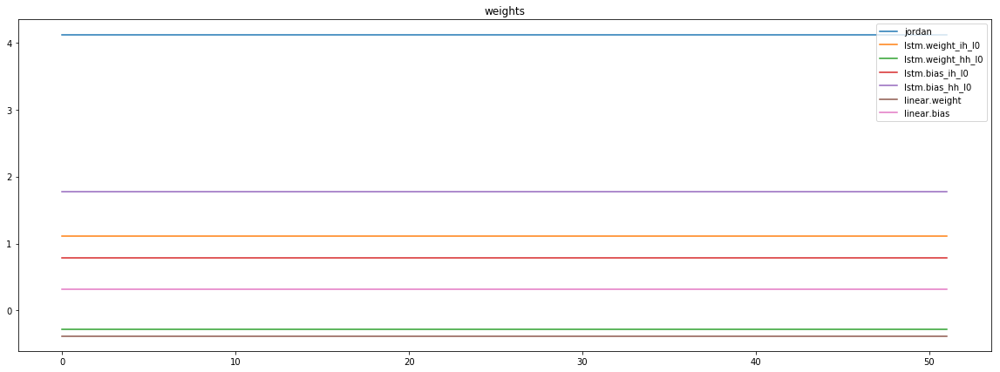

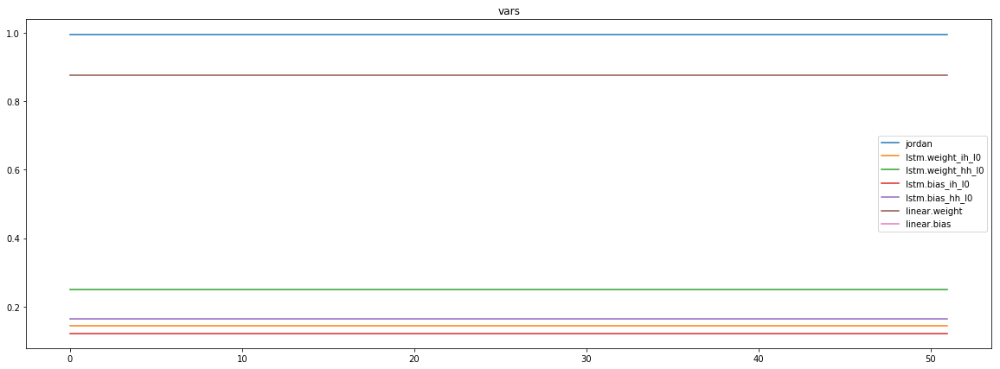

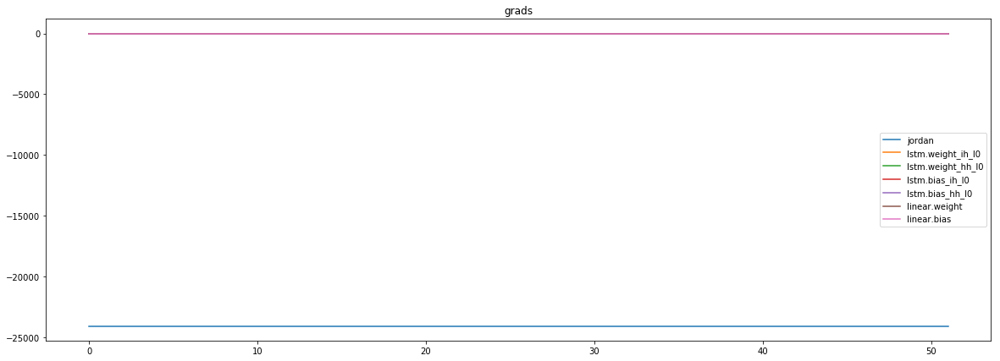

mean_p1 : 1051.688232421875
mean_p2 : -24699.857421875
mean_p3 : -435.04046630859375


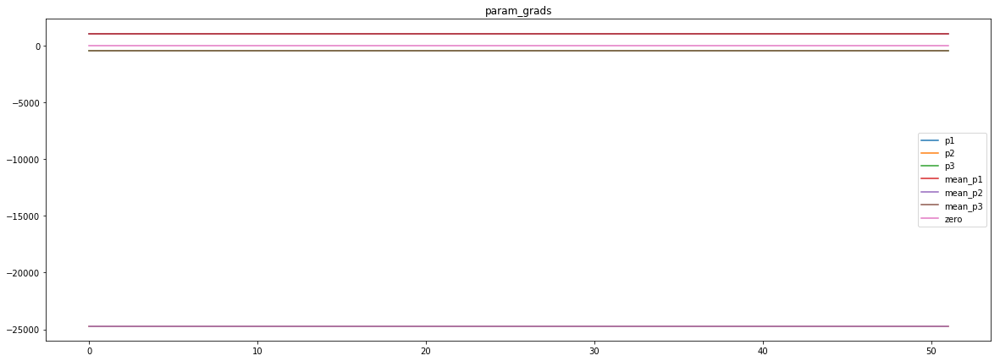

loss rate [0.18385222742444274]
Epoch [11] 
     train_loss[2544.047454393827] 
     eval_train[1.6449385789724498] 
     eval_test[1.6923375779932195]



aux preds: 0.5504874587059021           1.0754691362380981           2.734128713607788
main loss 0.0
aux loss 55.722730563237114
jord loss 2439.0999615009014
combined loss 2494.8226920641387 



Parameter containing:
tensor([[0.5505, 1.0755, 2.7341]], requires_grad=True)


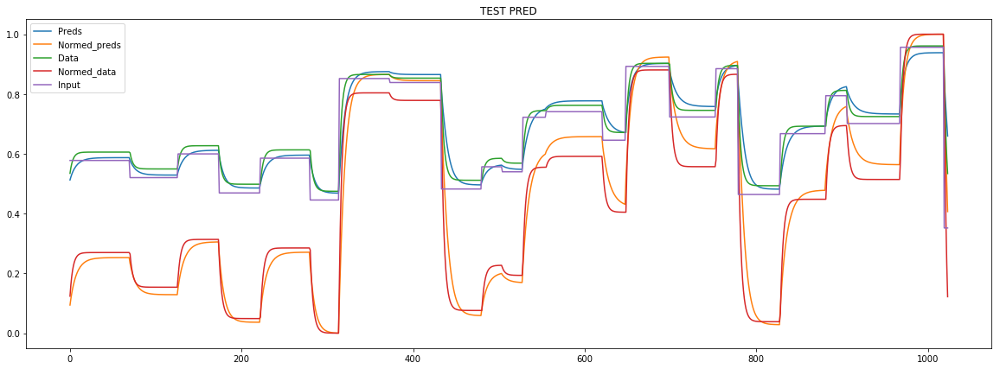

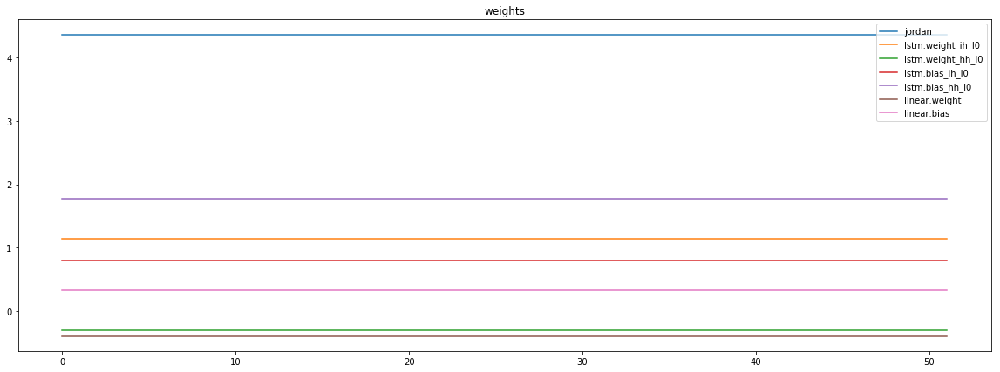

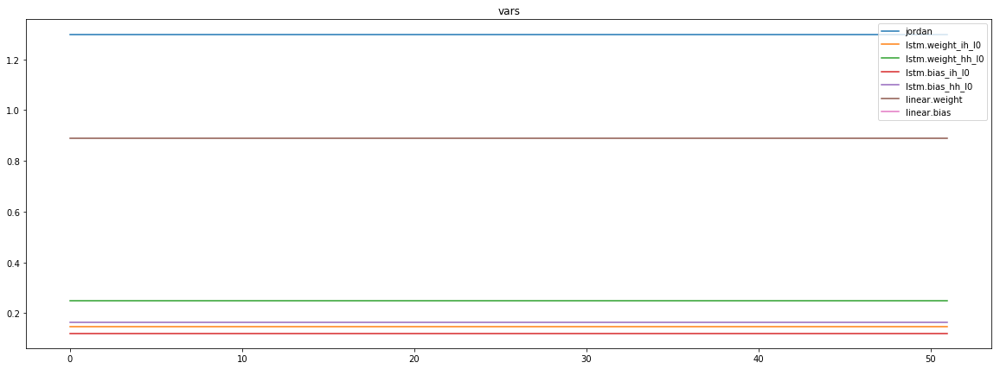

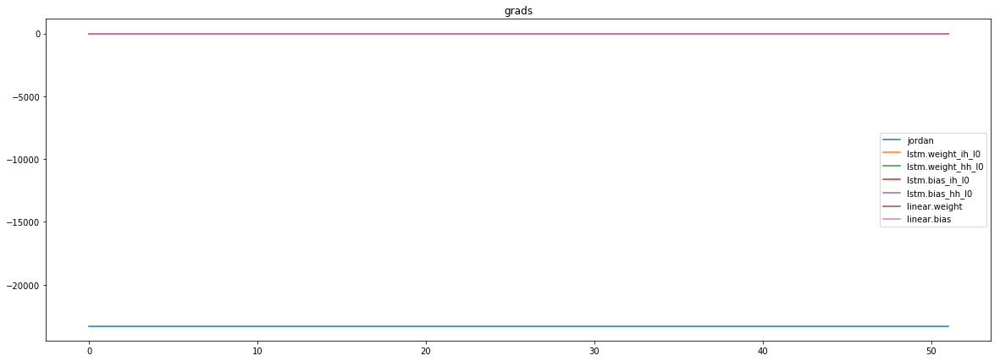

mean_p1 : 1236.1546630859375
mean_p2 : -24084.541015625
mean_p3 : -429.6673583984375


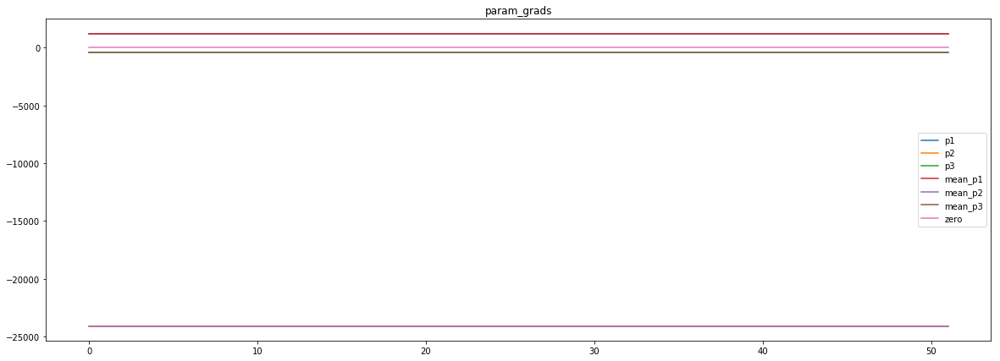

loss rate [0.16331149290764302]
Epoch [12] 
     train_loss[2494.8226920641387] 
     eval_train[1.530127818767841] 
     eval_test[1.5736325003884055]



aux preds: 0.5418233275413513           1.07252836227417           2.980241060256958
main loss 0.0
aux loss 55.02252703446608
jord loss 2382.843524639423
combined loss 2437.866051673889 



Parameter containing:
tensor([[0.5418, 1.0725, 2.9802]], requires_grad=True)


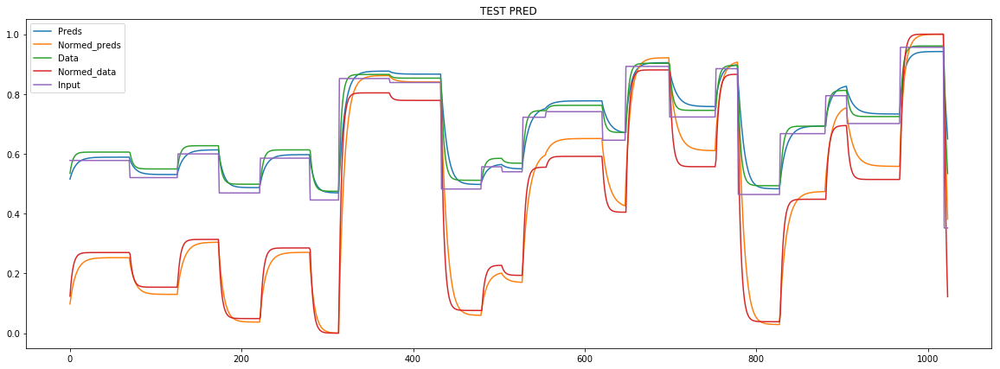

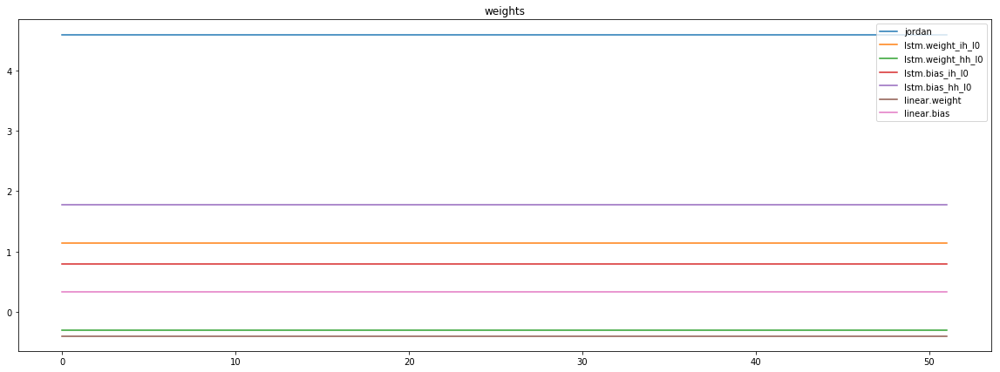

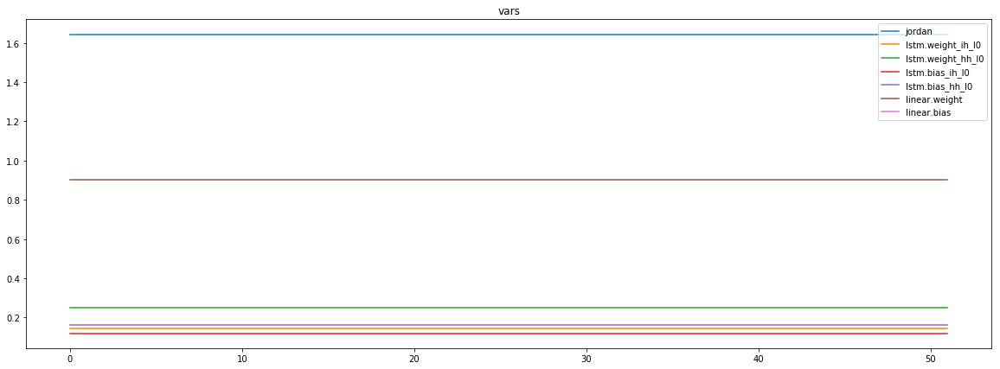

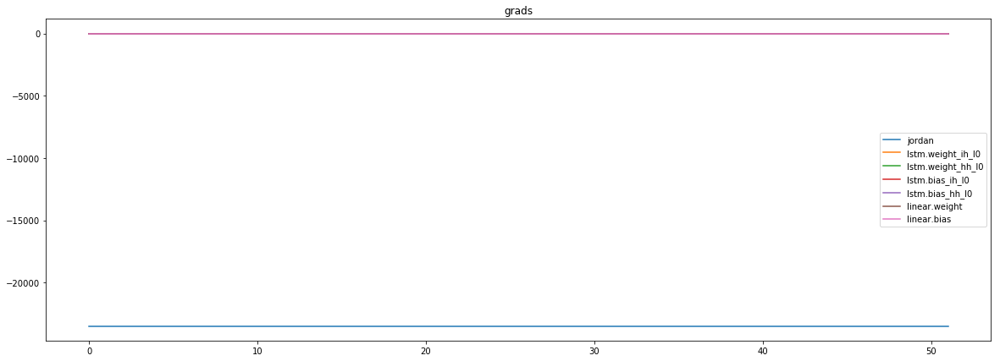

mean_p1 : 1288.7091064453125
mean_p2 : -24336.939453125
mean_p3 : -436.3272705078125


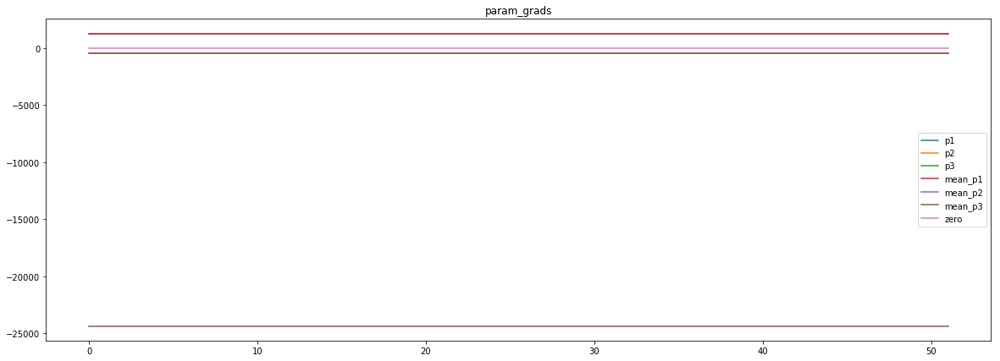

loss rate [0.16355172487826086]
Epoch [13] 
     train_loss[2437.866051673889] 
     eval_train[1.4046915356929486] 
     eval_test[1.4386256337165833]



aux preds: 0.5354495048522949           1.07027268409729           3.2290561199188232
main loss 0.0
aux loss 50.38290456625131
jord loss 2329.4993262657754
combined loss 2379.882230832027 



Parameter containing:
tensor([[0.5354, 1.0703, 3.2291]], requires_grad=True)


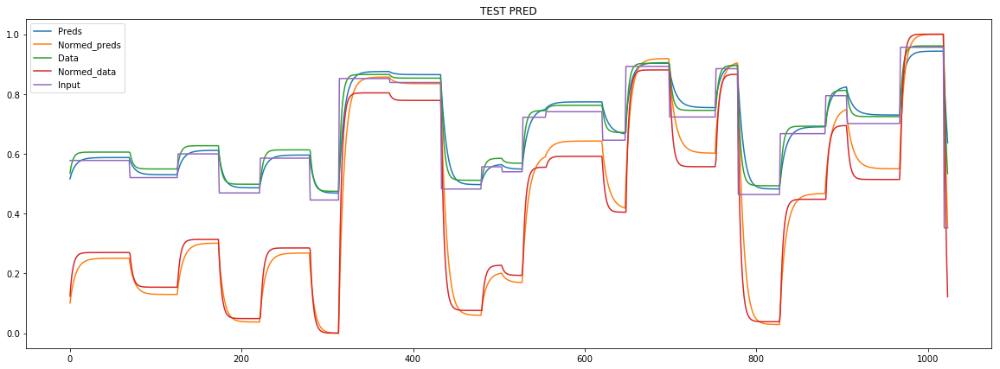

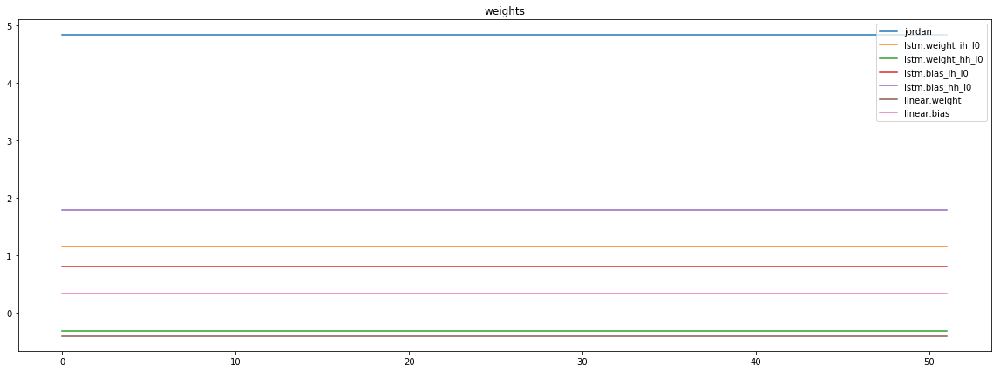

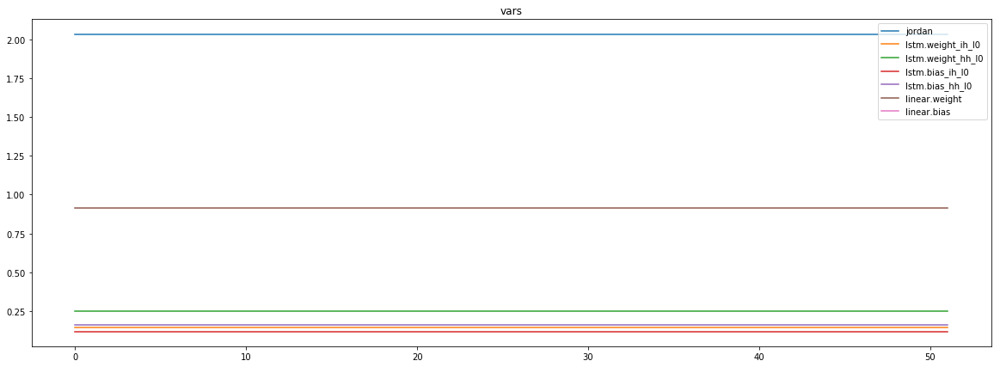

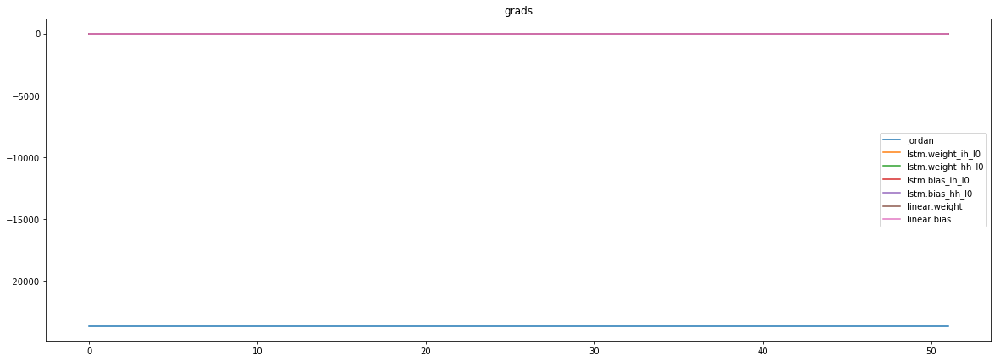

mean_p1 : 1420.057373046875
mean_p2 : -24609.232421875
mean_p3 : -441.209228515625


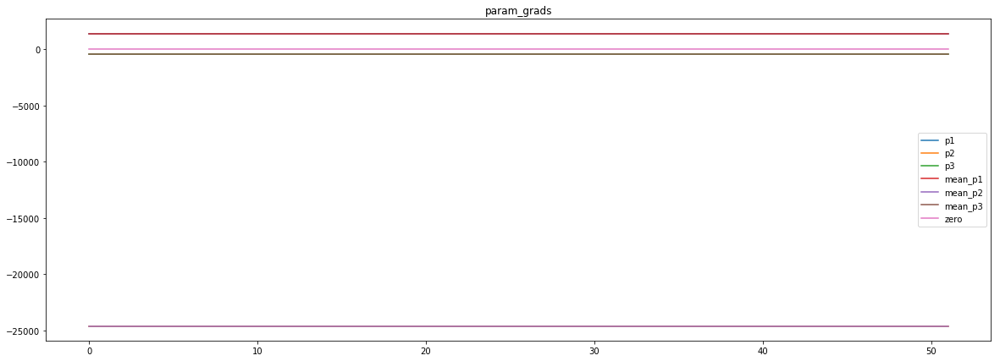

loss rate [0.1530771200319554]
Epoch [14] 
     train_loss[2379.882230832027] 
     eval_train[1.3017870141909673] 
     eval_test[1.3281432498585095]



aux preds: 0.5224207639694214           1.0675047636032104           3.482121467590332
main loss 0.0
aux loss 54.756091631375824
jord loss 2259.9180603027344
combined loss 2314.6741519341103 



Parameter containing:
tensor([[0.5224, 1.0675, 3.4821]], requires_grad=True)


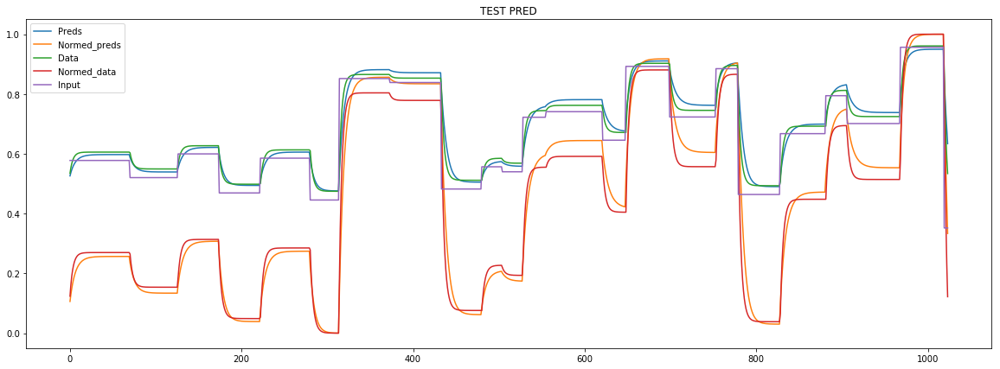

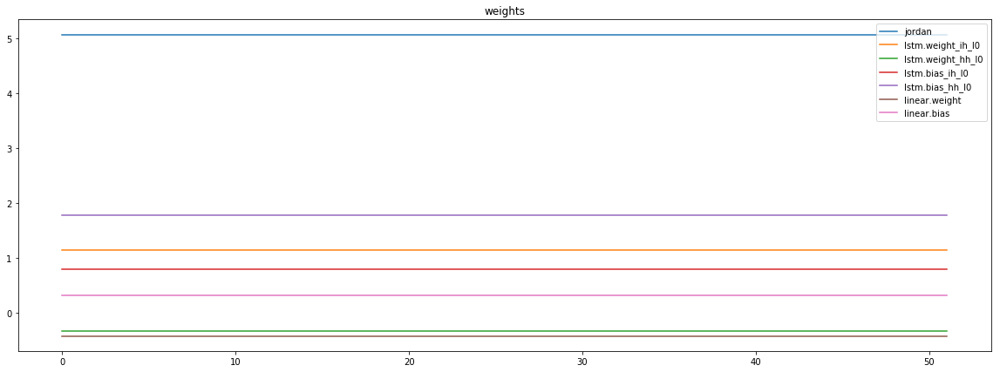

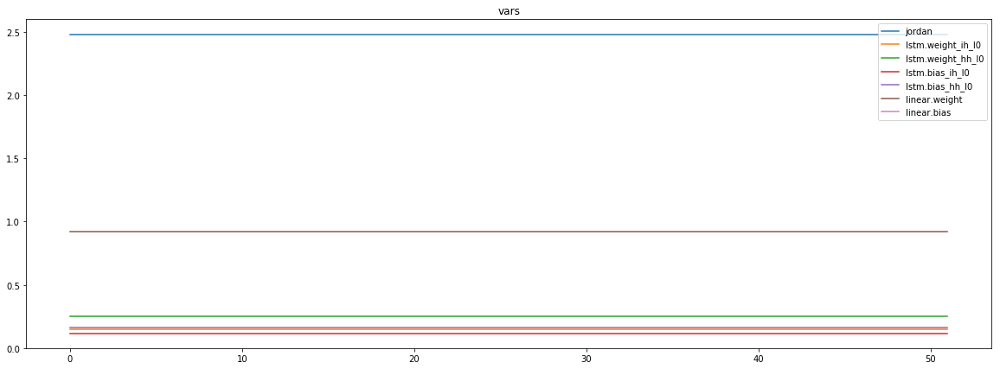

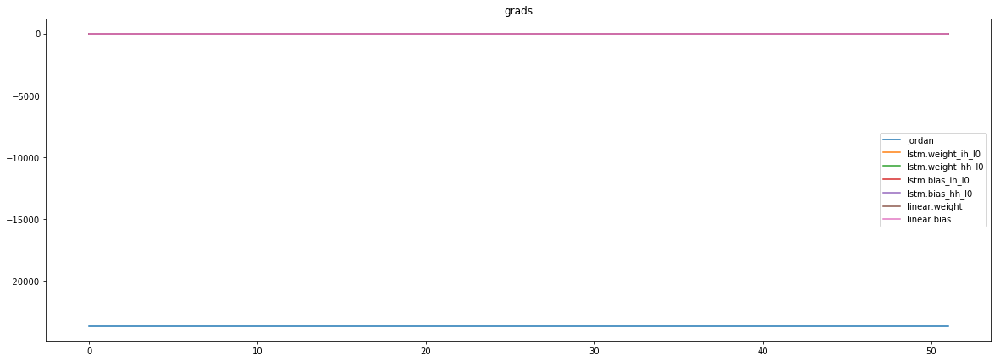

mean_p1 : 1459.0325927734375
mean_p2 : -24666.56640625
mean_p3 : -448.11761474609375


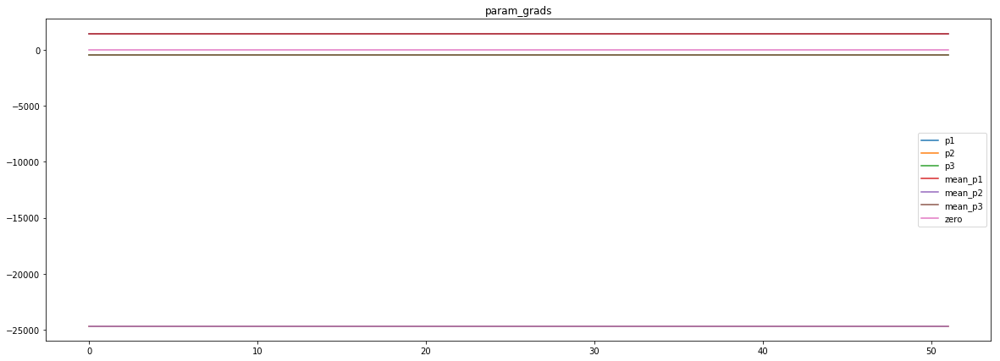

loss rate [0.1546893156321345]
Epoch [15] 
     train_loss[2314.6741519341103] 
     eval_train[1.2194118878016105] 
     eval_test[1.2229958881031384]



aux preds: 0.5126808881759644           1.0658601522445679           3.750713348388672
main loss 0.0
aux loss 52.9982056250939
jord loss 2195.458010160006
combined loss 2248.4562157850996 



Parameter containing:
tensor([[0.5127, 1.0659, 3.7507]], requires_grad=True)


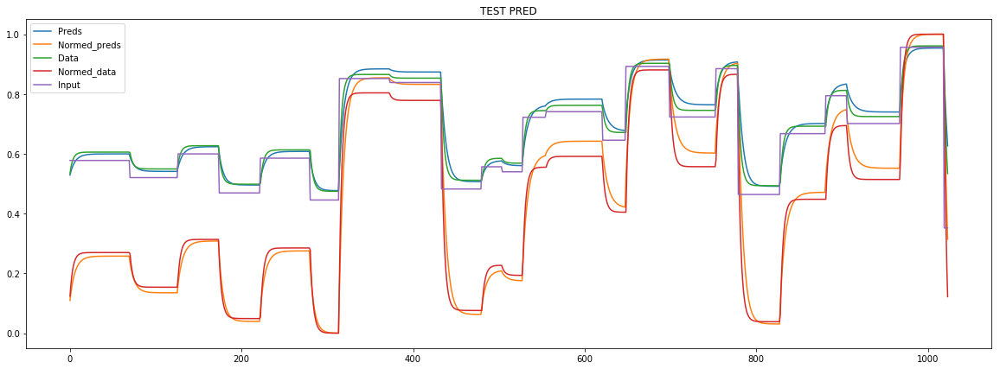

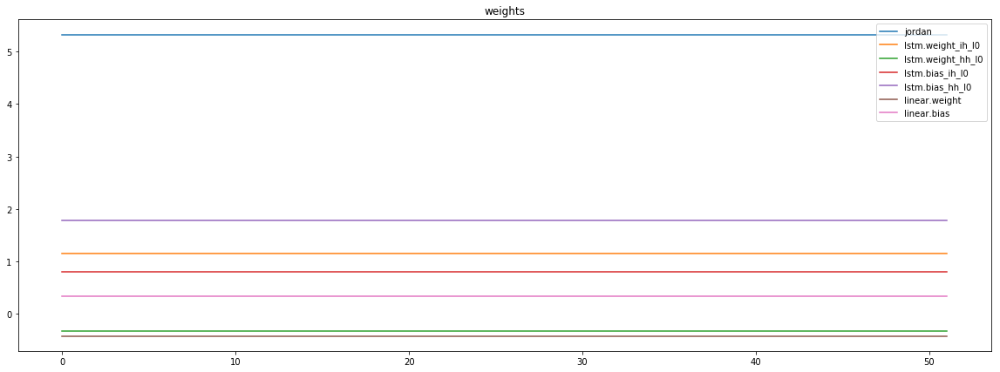

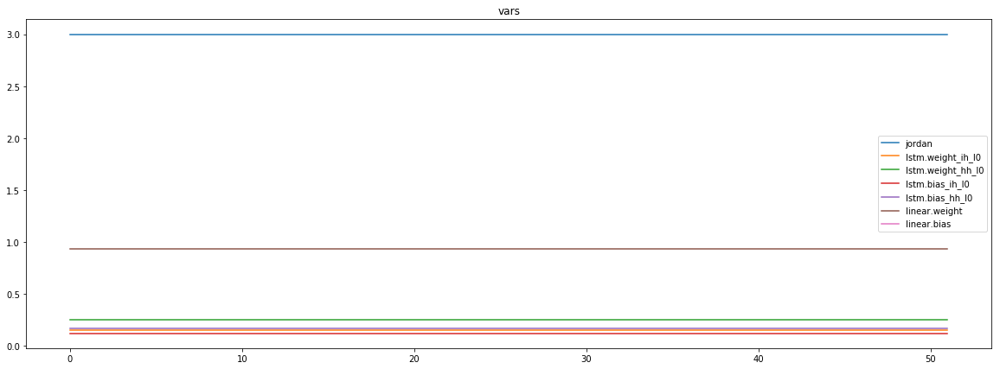

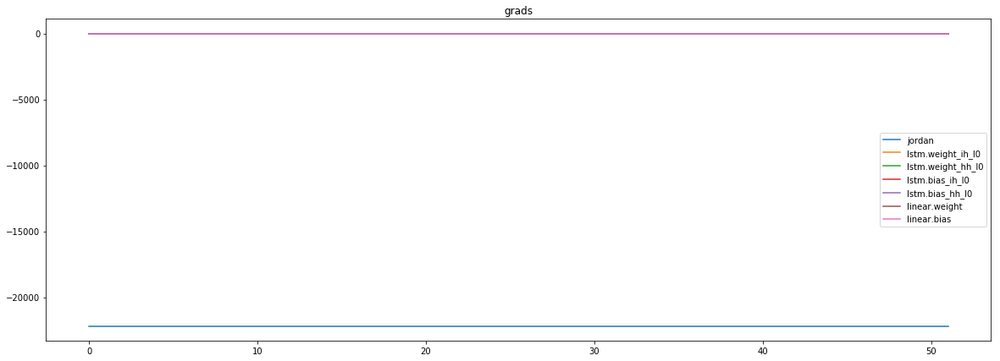

mean_p1 : 1581.573486328125
mean_p2 : -23318.794921875
mean_p3 : -438.8340759277344


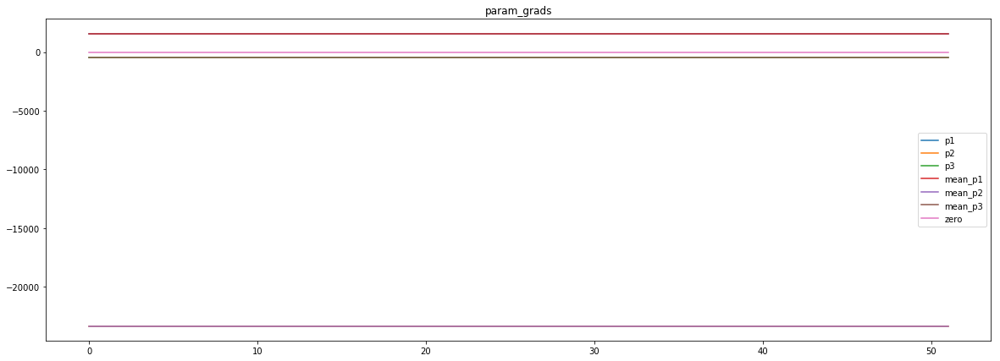

loss rate [0.11832649668675155]
Epoch [16] 
     train_loss[2248.4562157850996] 
     eval_train[1.1743078988332014] 
     eval_test[1.1725566278804431]



aux preds: 0.5013415813446045           1.0630308389663696           4.021399974822998
main loss 0.0
aux loss 54.32658932759212
jord loss 2135.1869459885816
combined loss 2189.5135353161736 



Parameter containing:
tensor([[0.5013, 1.0630, 4.0214]], requires_grad=True)


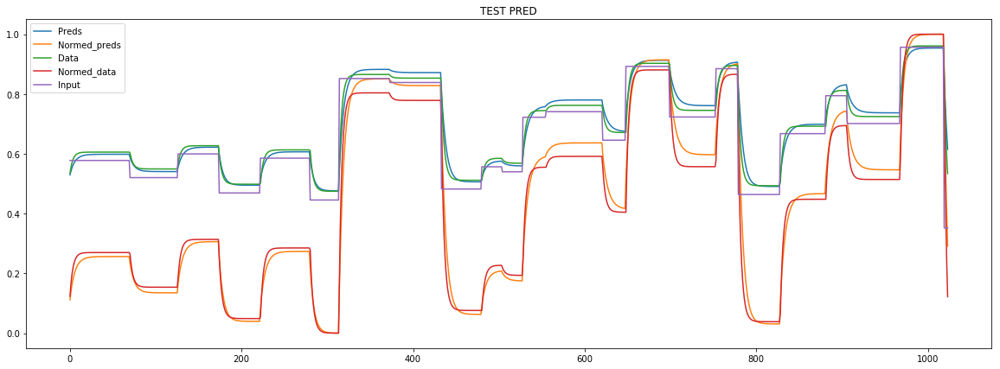

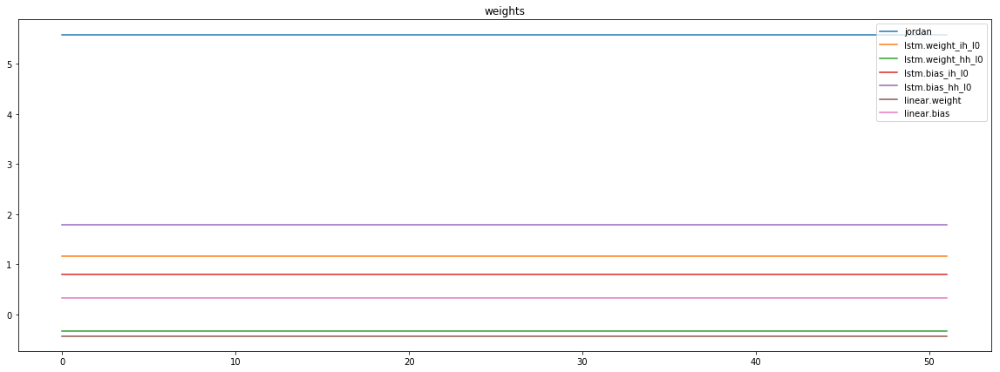

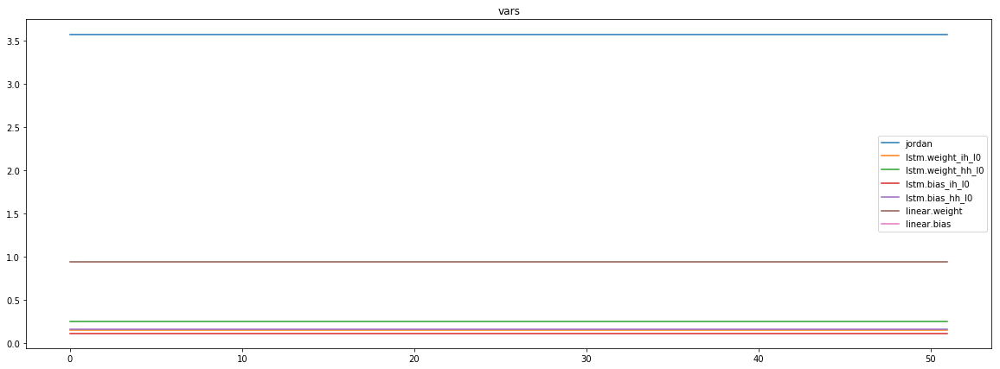

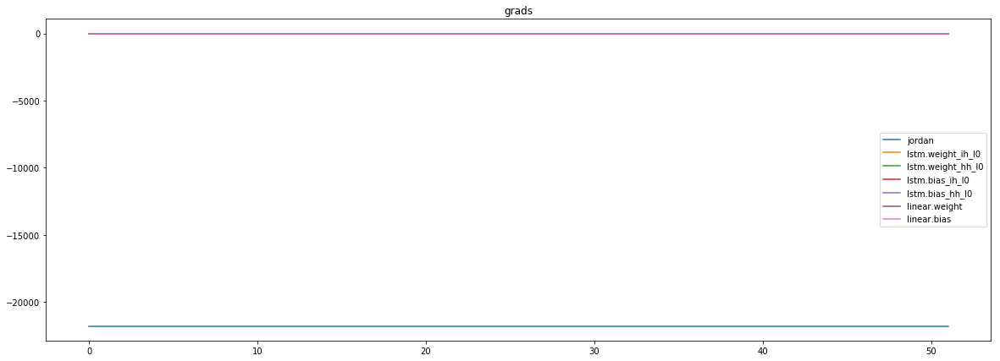

mean_p1 : 1580.1800537109375
mean_p2 : -22938.69921875
mean_p3 : -441.2606201171875


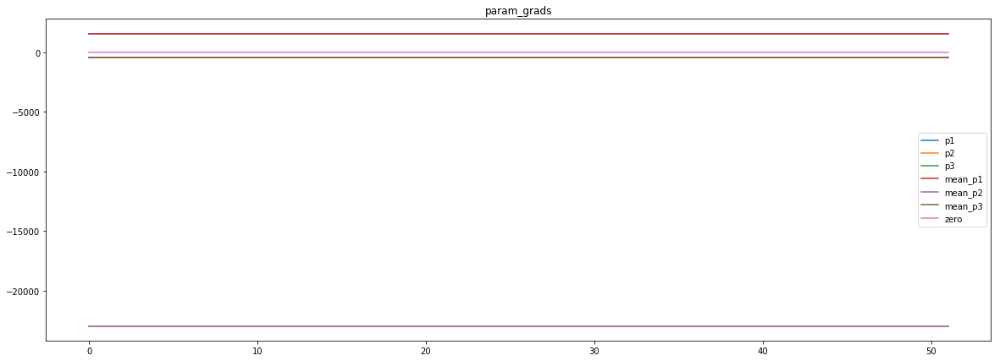

loss rate [0.13832772974695662]
Epoch [17] 
     train_loss[2189.5135353161736] 
     eval_train[1.0719112788255398] 
     eval_test[1.0695351280949332]



aux preds: 0.4914062023162842           1.0575883388519287           4.302376747131348
main loss 0.0
aux loss 59.053144014798676
jord loss 2064.3463369516226
combined loss 2123.3994809664214 



Parameter containing:
tensor([[0.4914, 1.0576, 4.3024]], requires_grad=True)


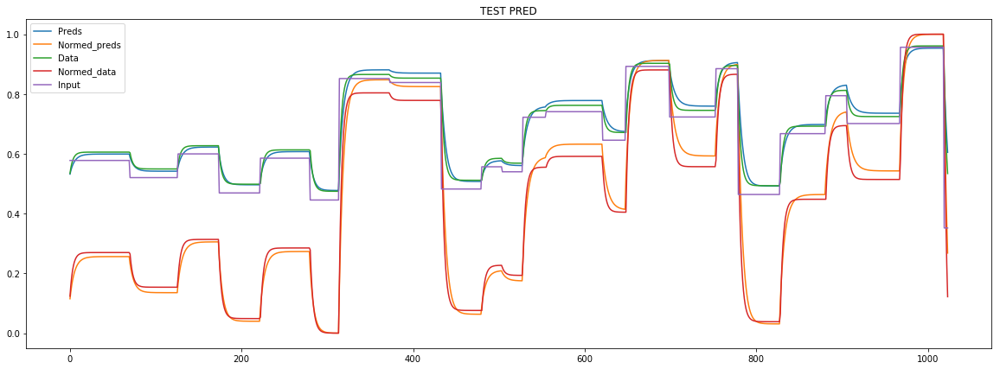

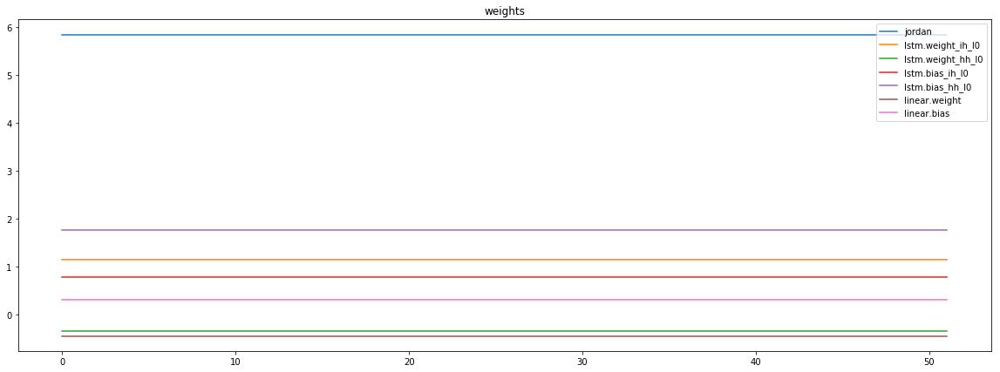

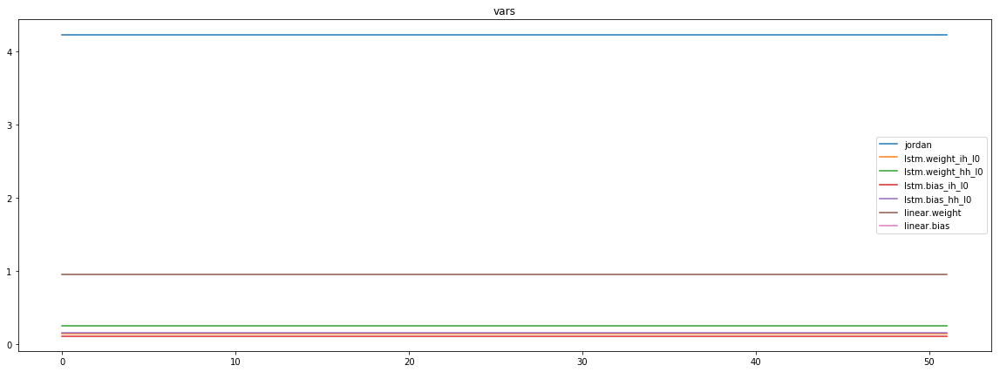

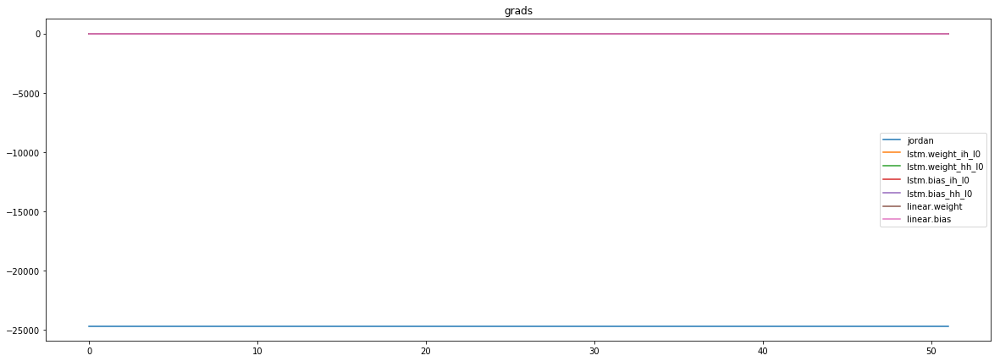

mean_p1 : 1392.208984375
mean_p2 : -25604.03515625
mean_p3 : -476.4701843261719


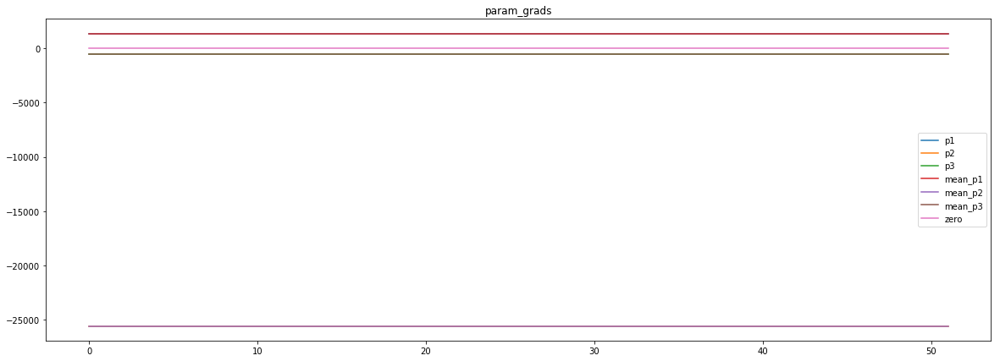

loss rate [0.14861751547610547]
Epoch [18] 
     train_loss[2123.3994809664214] 
     eval_train[0.9937335699796677] 
     eval_test[0.9833716425028715]



aux preds: 0.48726901412010193           1.0543181896209717           4.571841716766357
main loss 0.0
aux loss 62.42070374122033
jord loss 2001.7828110914963
combined loss 2064.203514832717 



Parameter containing:
tensor([[0.4873, 1.0543, 4.5718]], requires_grad=True)


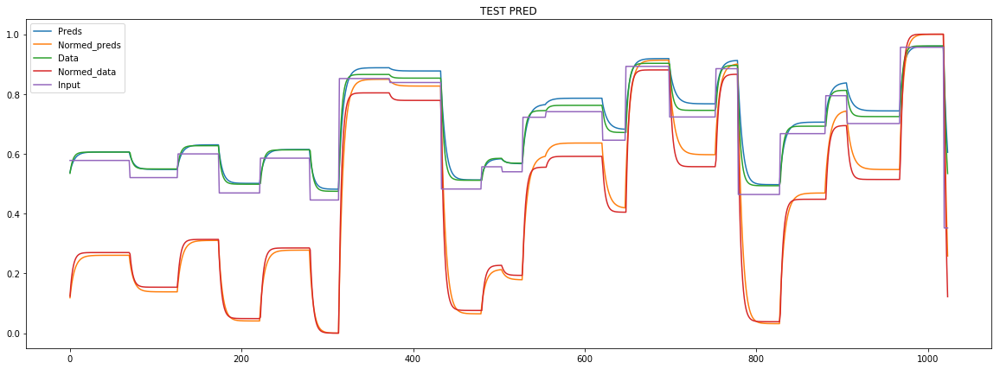

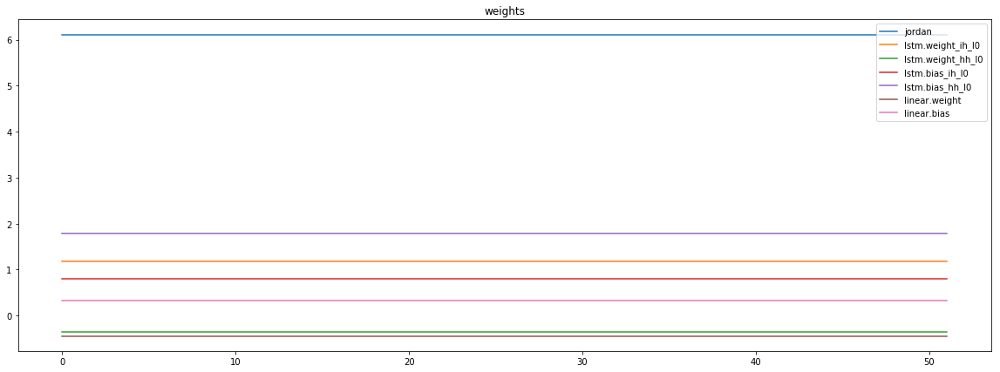

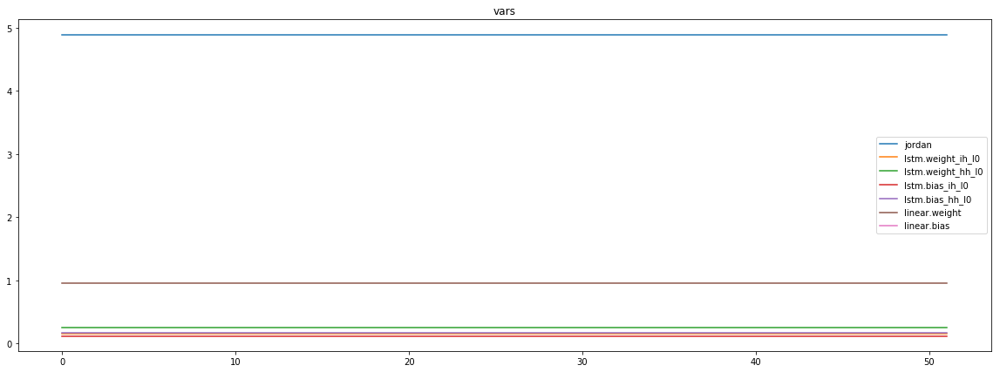

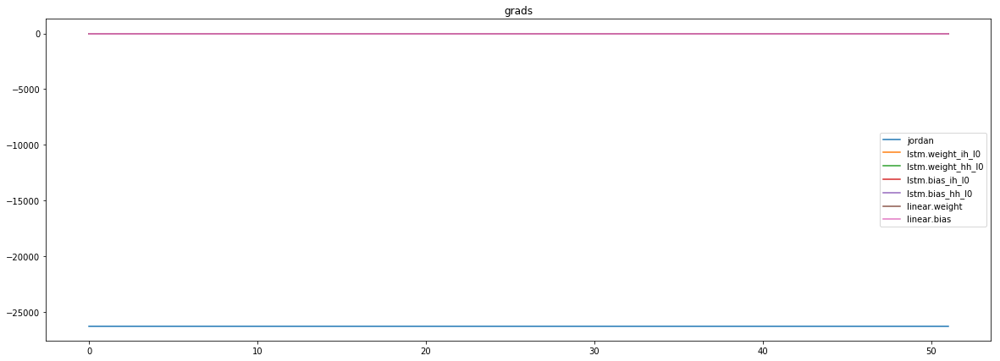

mean_p1 : 1376.45068359375
mean_p2 : -27135.900390625
mean_p3 : -495.48876953125


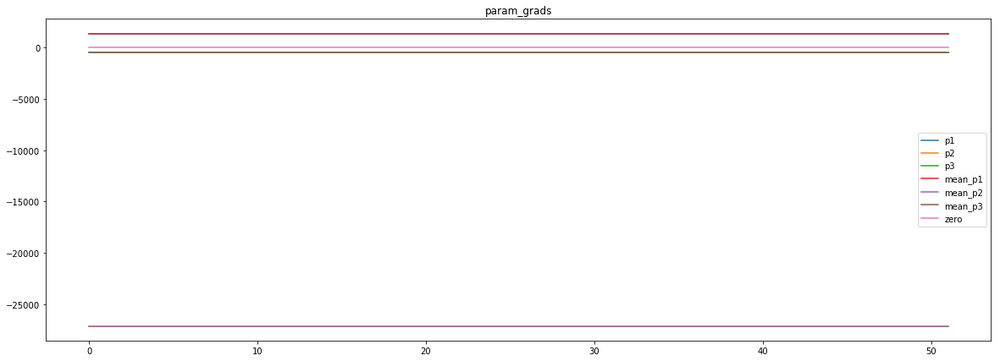

loss rate [-0.030225187972613865]
Epoch [19] 
     train_loss[2064.203514832717] 
     eval_train[1.1298922472275221] 
     eval_test[1.1076512119986794]



aux preds: 0.47989219427108765           1.0511292219161987           4.846319675445557
main loss 0.0
aux loss 62.56262955298791
jord loss 1935.833479661208
combined loss 1998.3961092141958 



Parameter containing:
tensor([[0.4799, 1.0511, 4.8463]], requires_grad=True)


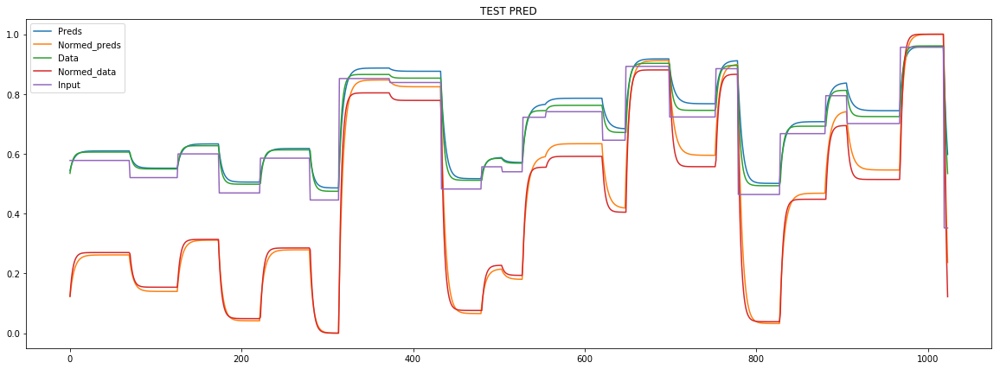

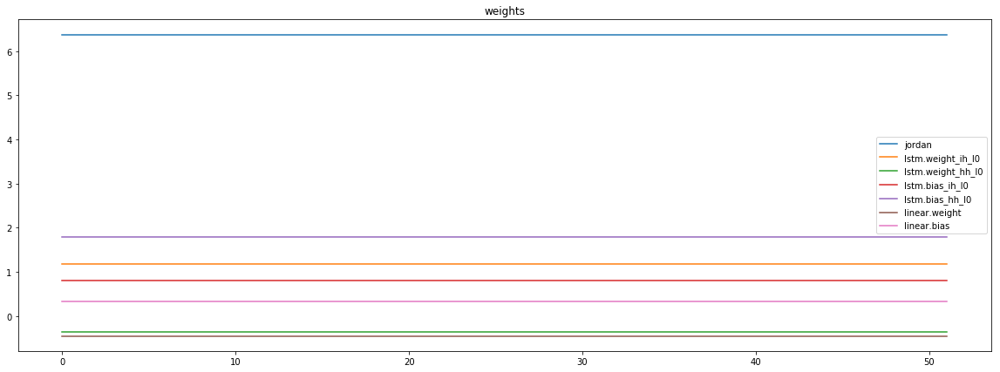

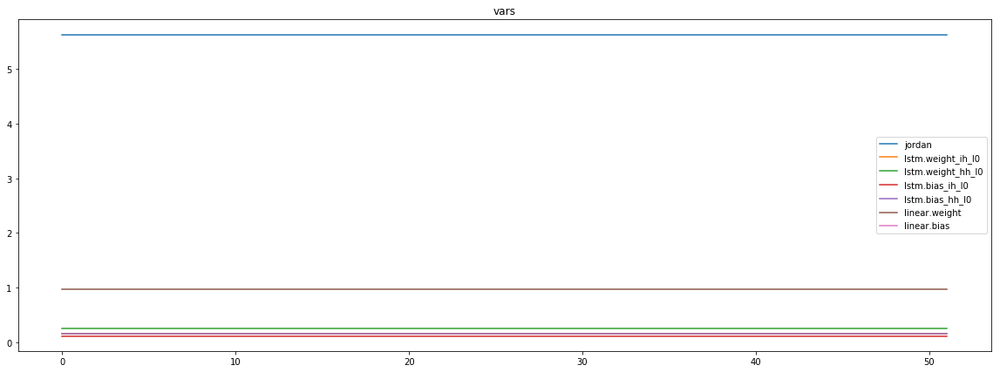

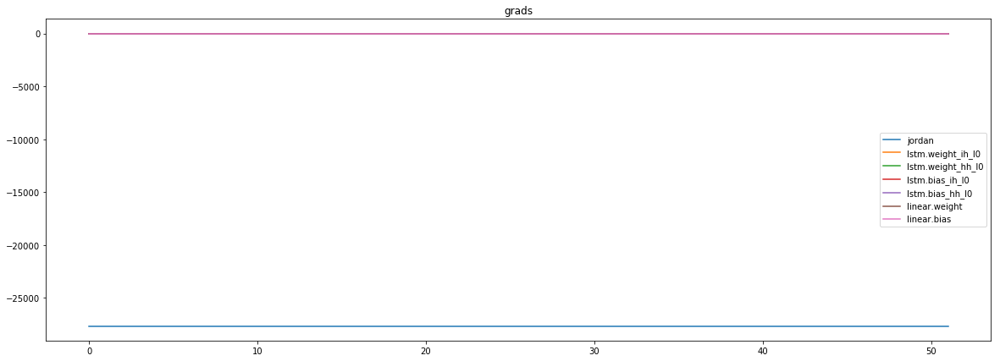

mean_p1 : 1043.2799072265625
mean_p2 : -28185.732421875
mean_p3 : -512.3521118164062


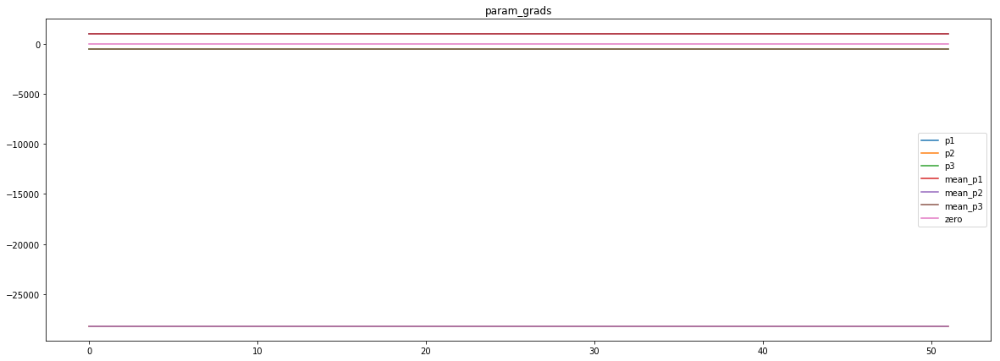

loss rate [-0.10453944704697404]
Epoch [20] 
     train_loss[1998.3961092141958] 
     eval_train[1.199502829175729] 
     eval_test[1.1636536554856733]



aux preds: 0.48004409670829773           1.0473530292510986           5.1200385093688965
main loss 0.0
aux loss 64.6455997320322
jord loss 1871.6878098707932
combined loss 1936.3334096028254 



Parameter containing:
tensor([[0.4800, 1.0474, 5.1200]], requires_grad=True)


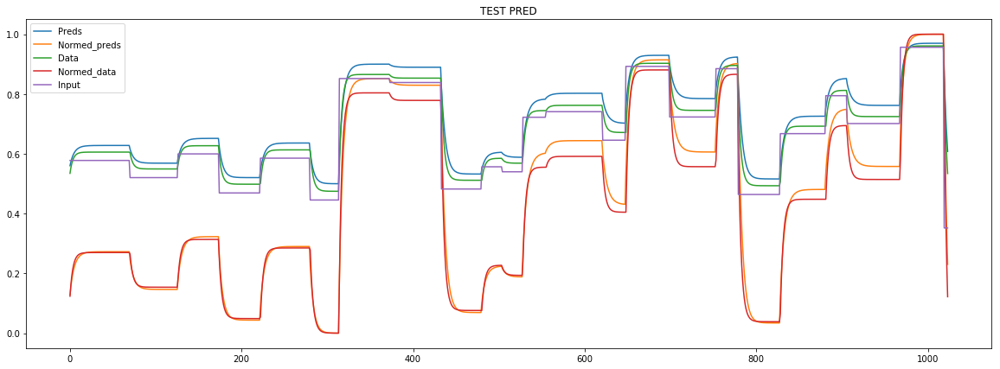

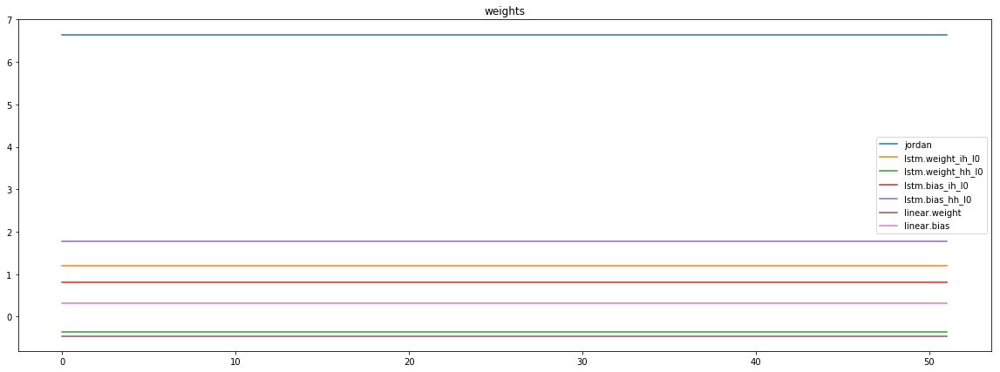

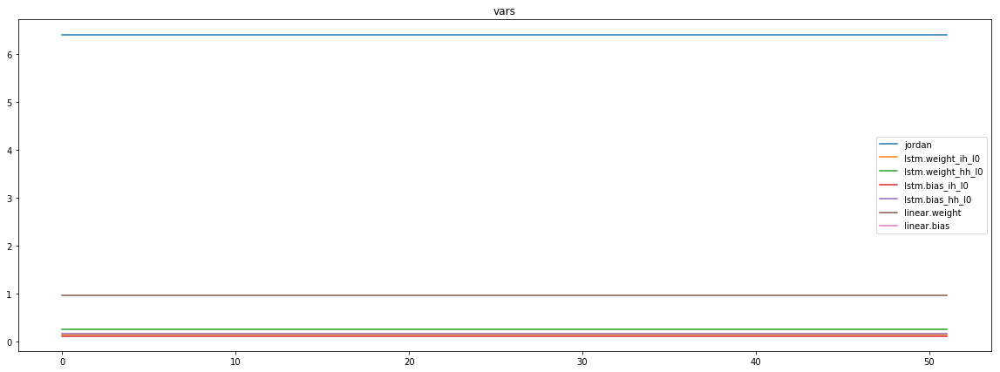

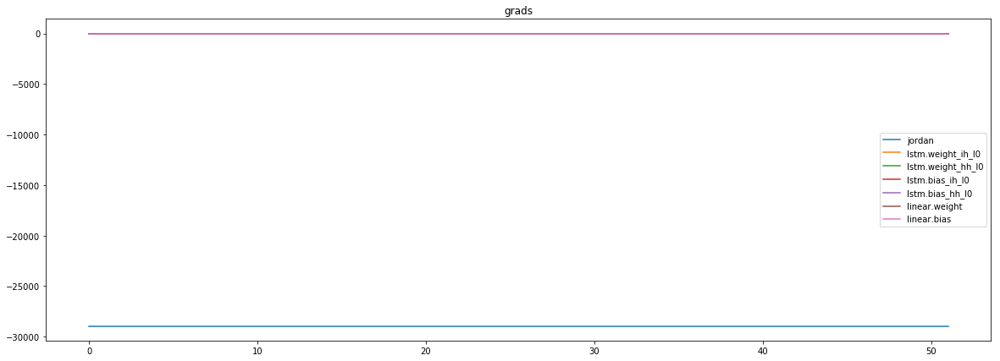

mean_p1 : 1180.1085205078125
mean_p2 : -29597.853515625
mean_p3 : -526.32177734375


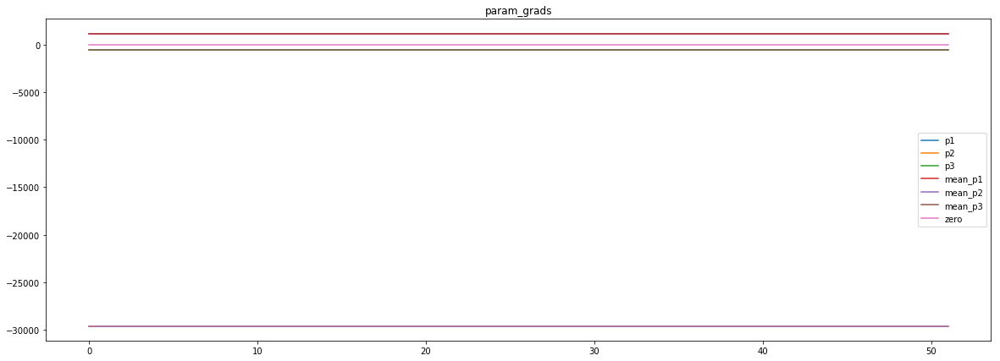

loss rate [-0.9072509142405794]
Epoch [21] 
     train_loss[1936.3334096028254] 
     eval_train[2.1187257995972266] 
     eval_test[2.069161583076824]



aux preds: 0.4811456799507141           1.0448273420333862           5.386615753173828
main loss 0.0
aux loss 56.03244986900916
jord loss 1810.3441889836238
combined loss 1866.376638852633 



Parameter containing:
tensor([[0.4811, 1.0448, 5.3866]], requires_grad=True)


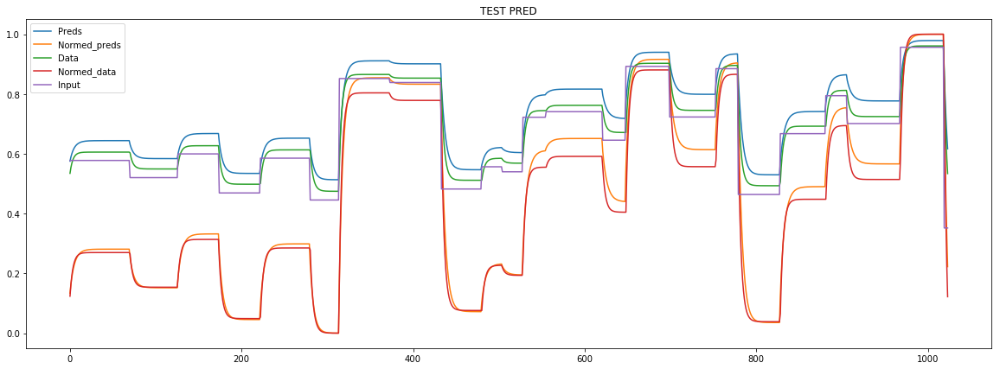

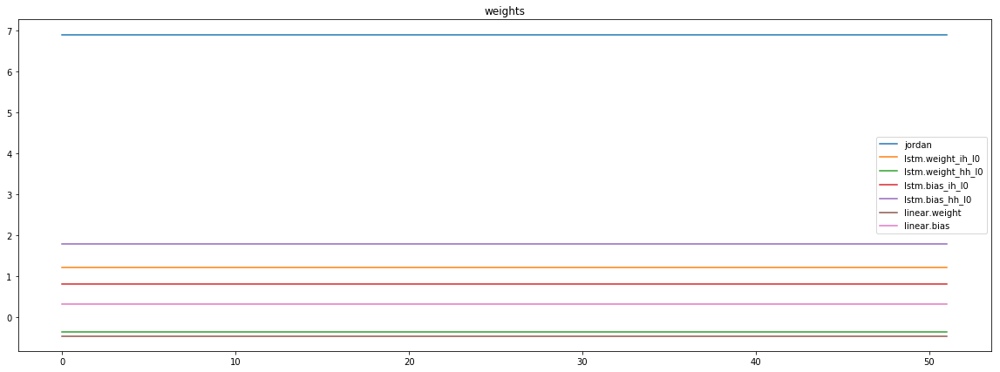

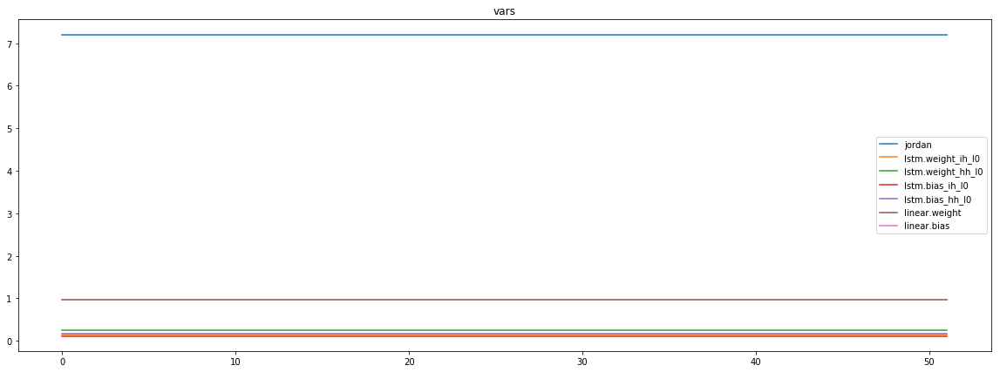

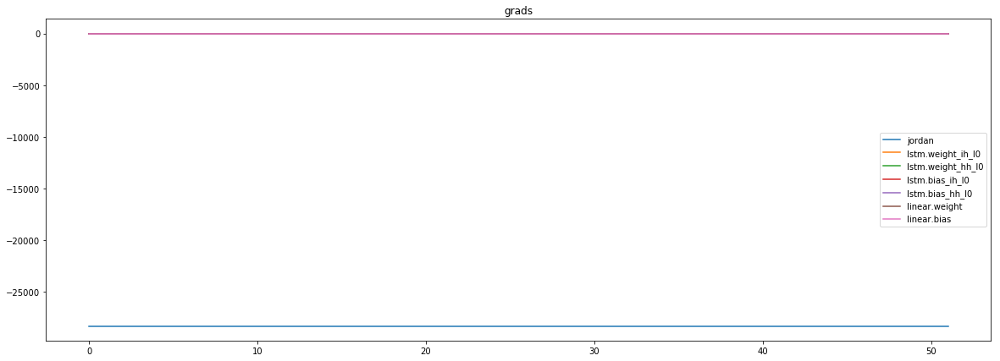

mean_p1 : 1427.139892578125
mean_p2 : -29180.11328125
mean_p3 : -521.0529174804688


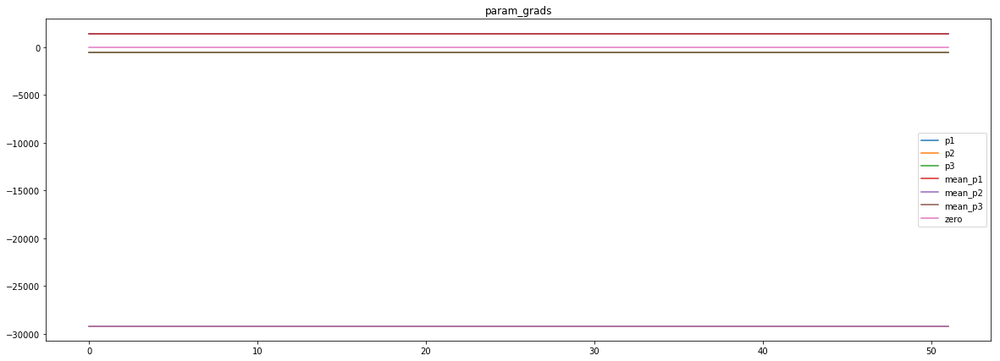

loss rate [-1.0656350241400019]
Epoch [22] 
     train_loss[1866.376638852633] 
     eval_train[3.0403186678886414] 
     eval_test[2.988606507127935]



aux preds: 0.4777876138687134           1.04209566116333           5.658498764038086
main loss 0.0
aux loss 55.229625738584076
jord loss 1739.9120624248799
combined loss 1795.1416881634639 



Parameter containing:
tensor([[0.4778, 1.0421, 5.6585]], requires_grad=True)


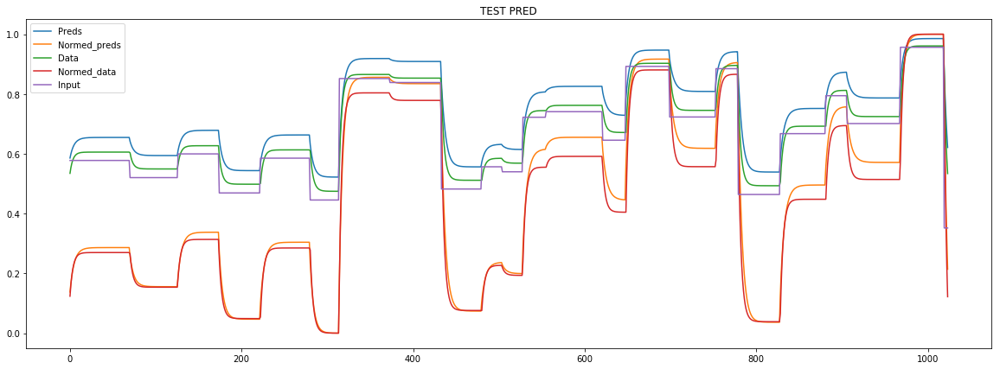

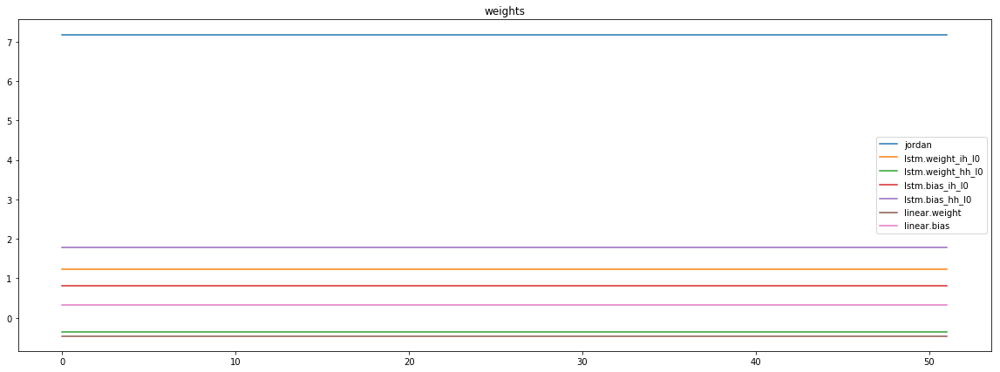

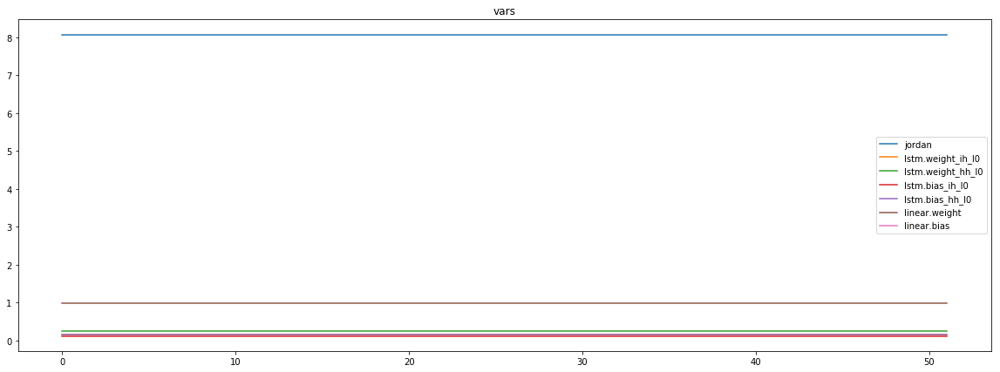

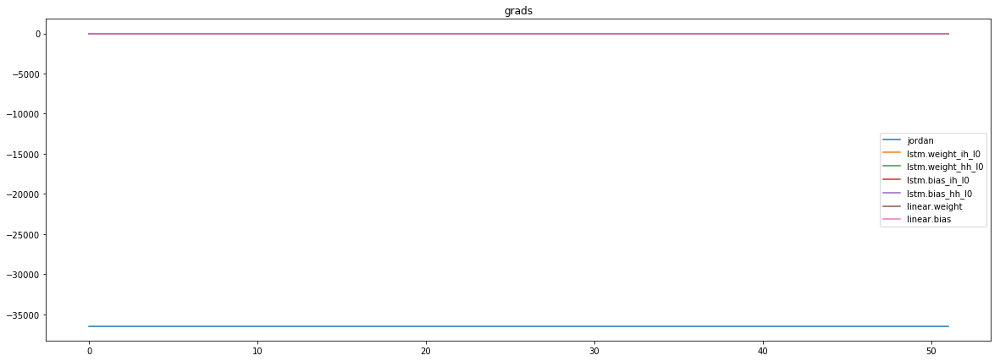

mean_p1 : 1016.2880859375
mean_p2 : -36870.625
mean_p3 : -600.9658813476562


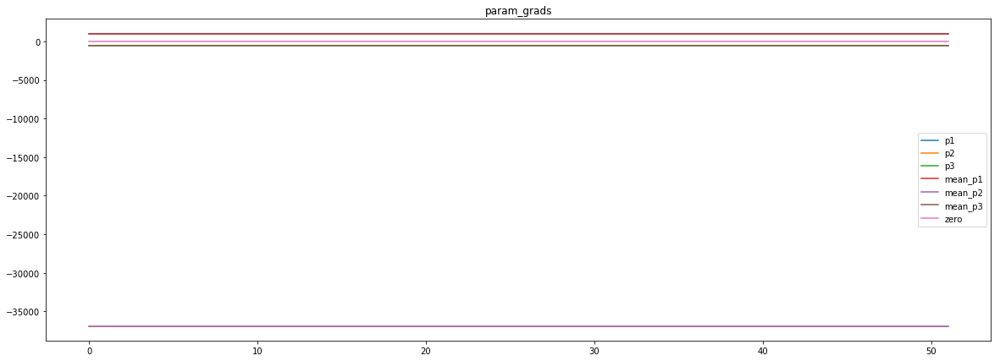

loss rate [-0.7499481633432046]
Epoch [23] 
     train_loss[1795.1416881634639] 
     eval_train[3.6786805299612193] 
     eval_test[3.6290551857514814]



aux preds: 0.475239634513855           1.0397441387176514           5.923711776733398
main loss 0.0
aux loss 60.41845893859863
jord loss 1685.0101975661057
combined loss 1745.4286565047043 



Parameter containing:
tensor([[0.4752, 1.0397, 5.9237]], requires_grad=True)


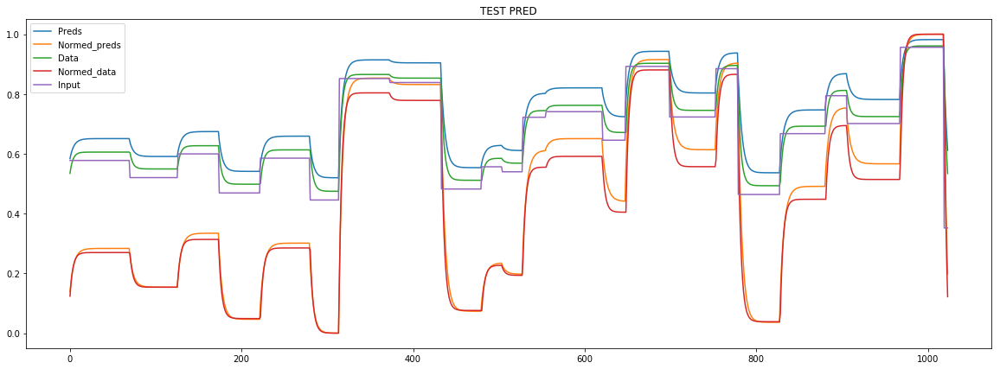

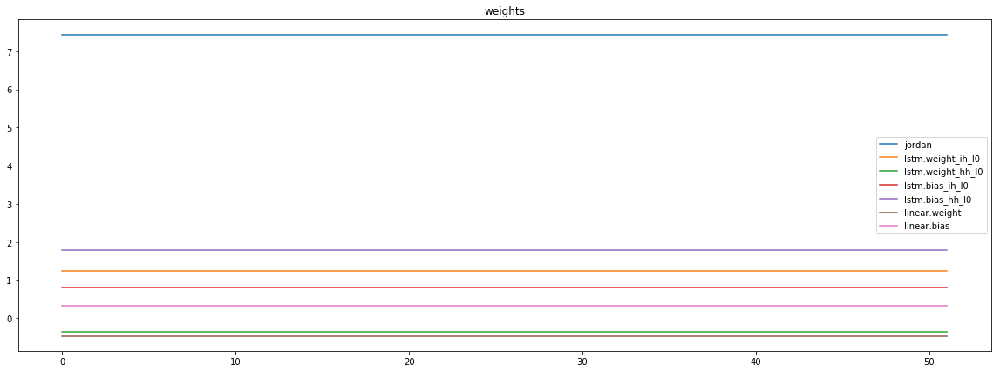

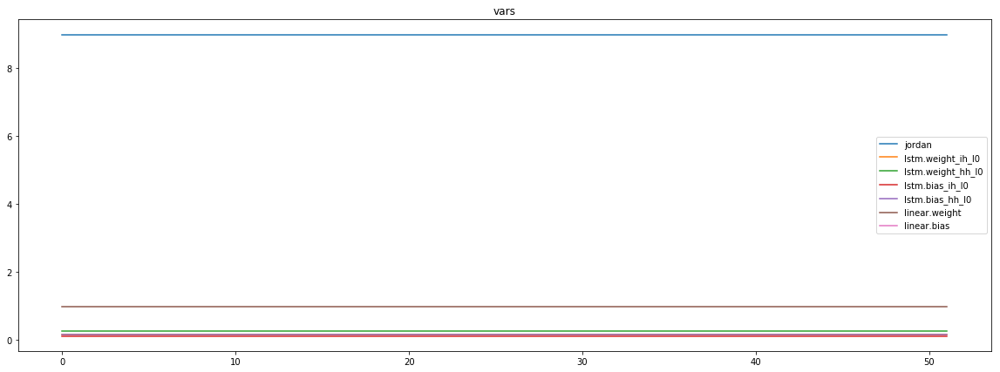

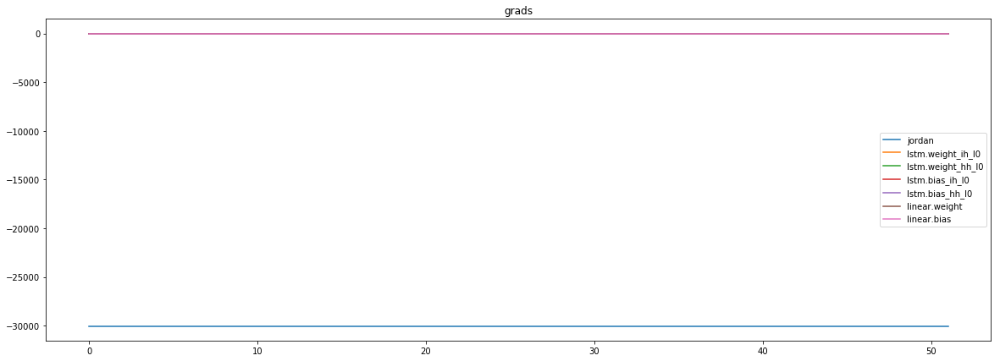

mean_p1 : 881.7183837890625
mean_p2 : -30375.017578125
mean_p3 : -537.8408203125


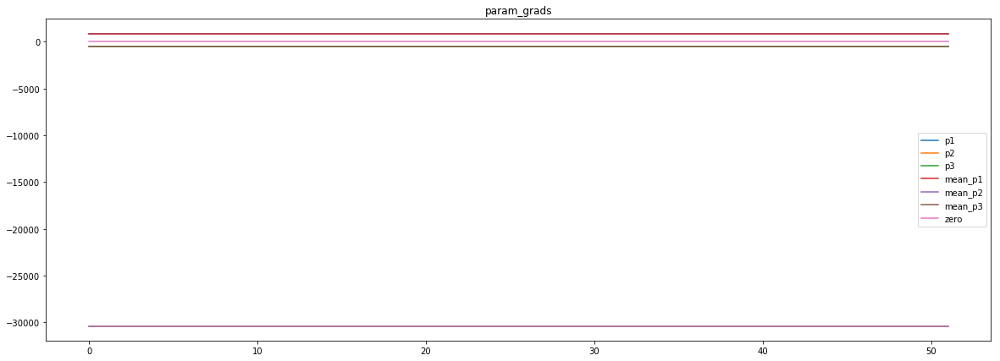

loss rate [-0.16197060718321854]
Epoch [24] 
     train_loss[1745.4286565047043] 
     eval_train[3.4185737784092245] 
     eval_test[3.364611105485396]



aux preds: 0.4731901288032532           1.0362050533294678           6.175355434417725
main loss 0.0
aux loss 56.757126368009125
jord loss 1626.5065448467549
combined loss 1683.263671214764 



Parameter containing:
tensor([[0.4732, 1.0362, 6.1754]], requires_grad=True)


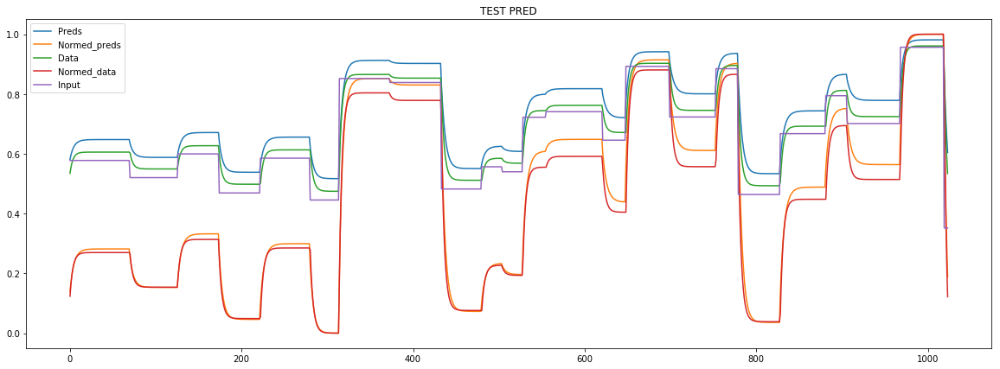

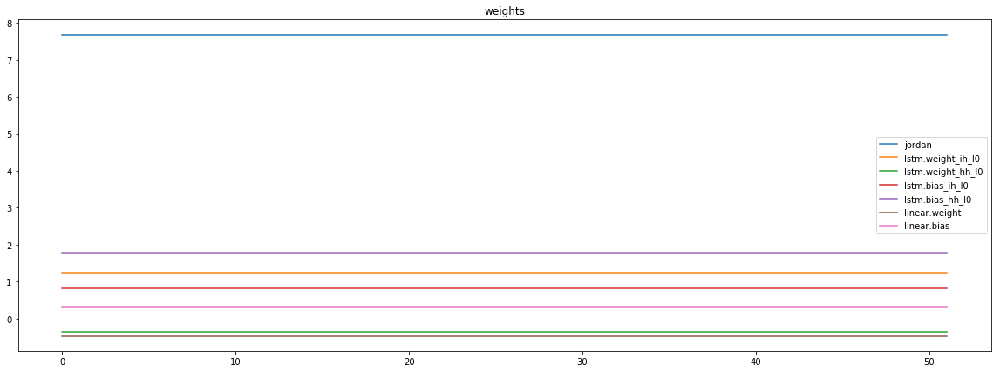

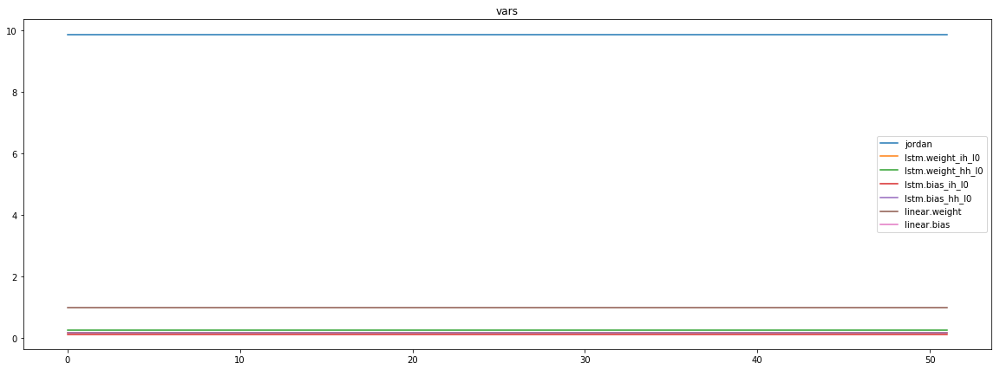

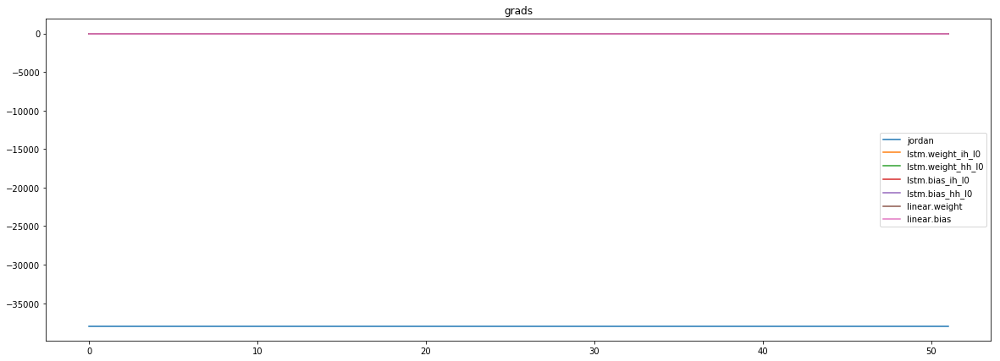

mean_p1 : 931.9634399414062
mean_p2 : -38262.8046875
mean_p3 : -615.8302612304688


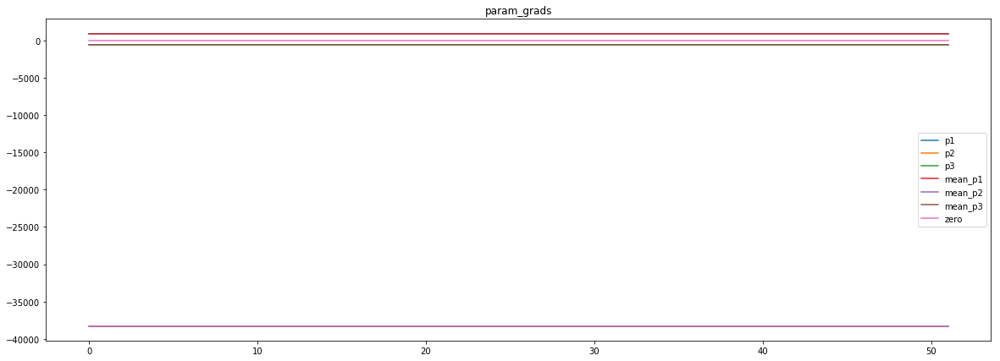

loss rate [0.04206035261492036]
Epoch [25] 
     train_loss[1683.263671214764] 
     eval_train[3.2389908524659963] 
     eval_test[3.187471628189087]



aux preds: 0.4727422595024109           1.0338836908340454           6.409926414489746
main loss 0.0
aux loss 51.10747036567101
jord loss 1572.7723247821514
combined loss 1623.8797951478223 



Parameter containing:
tensor([[0.4727, 1.0339, 6.4099]], requires_grad=True)


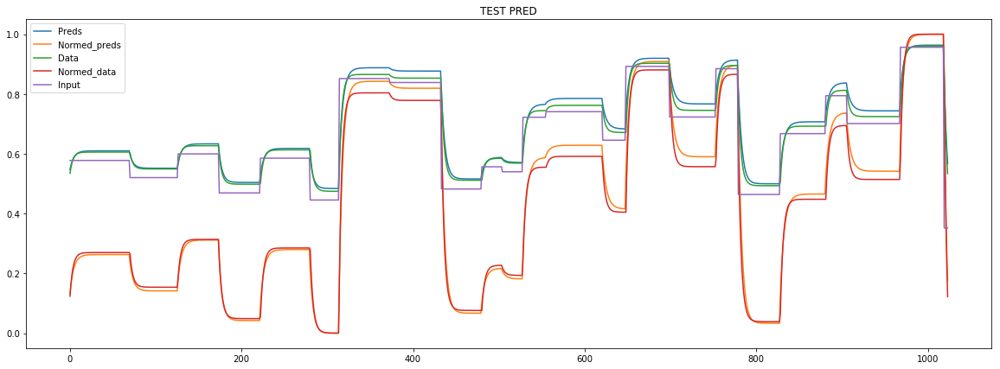

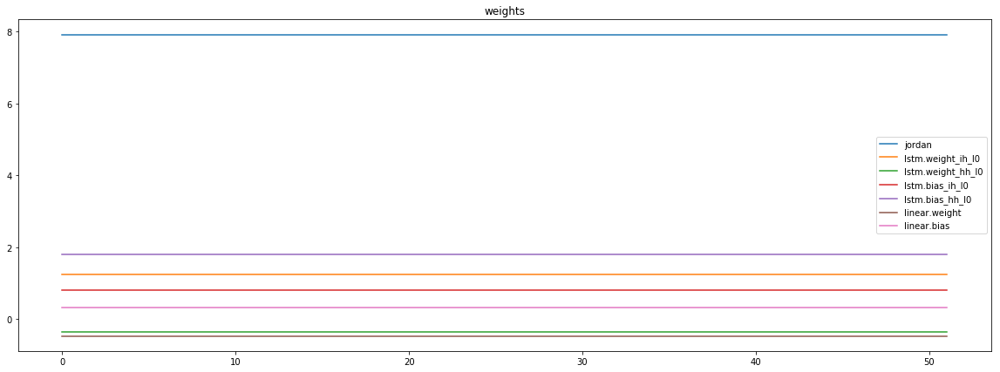

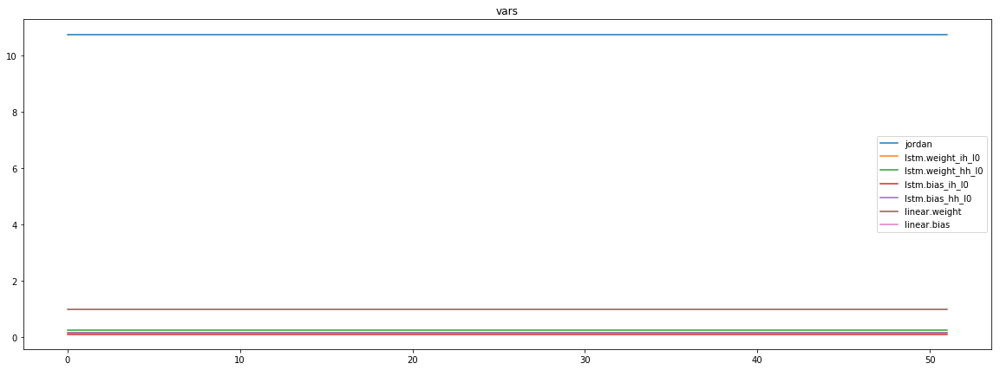

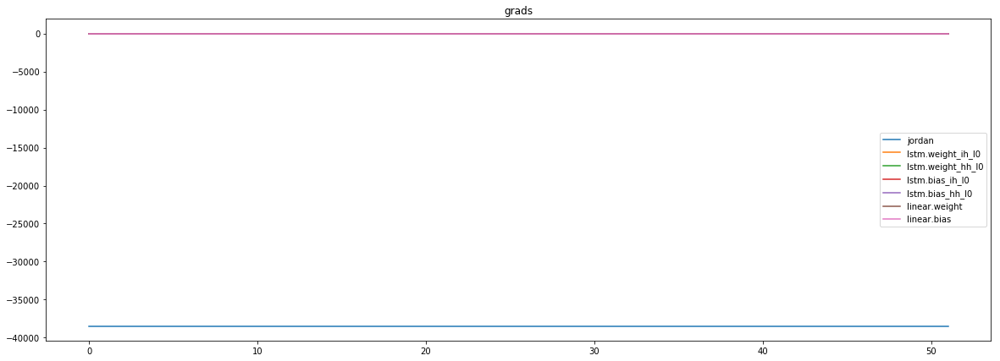

mean_p1 : 969.5463256835938
mean_p2 : -38798.984375
mean_p3 : -620.6639404296875


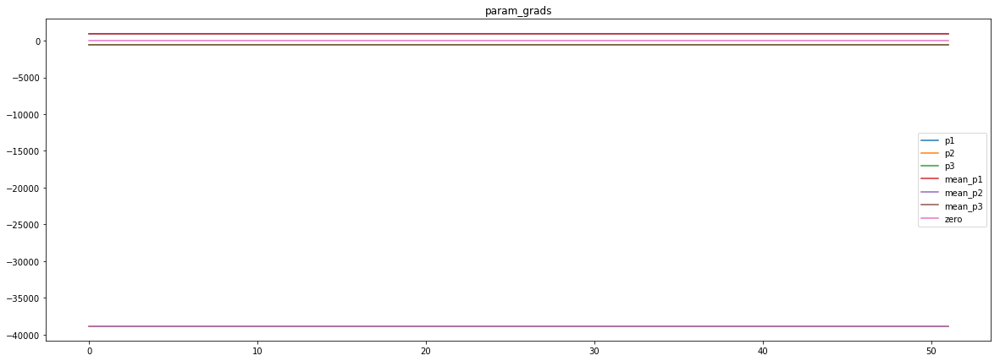

loss rate [0.6895543571205552]
Epoch [26] 
     train_loss[1623.8797951478223] 
     eval_train[1.0906901084459746] 
     eval_test[1.0535633022134954]



aux preds: 0.46830591559410095           1.0325572490692139           6.6640496253967285
main loss 0.0
aux loss 52.48629951477051
jord loss 1497.8392873910757
combined loss 1550.3255869058462 



Parameter containing:
tensor([[0.4683, 1.0326, 6.6640]], requires_grad=True)


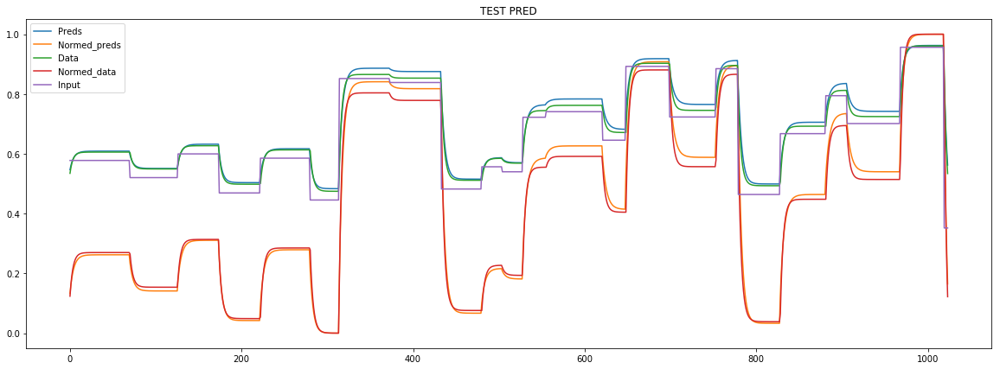

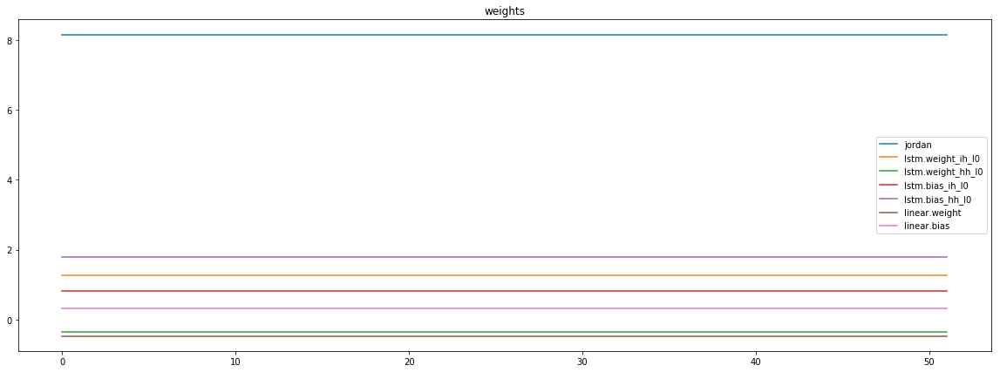

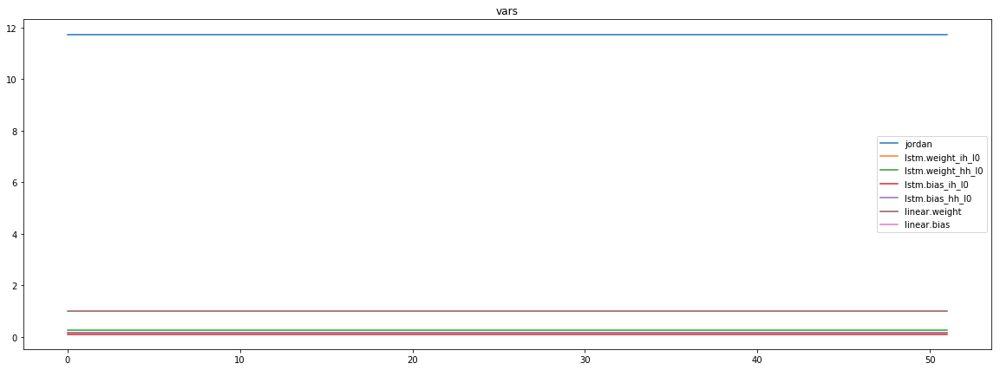

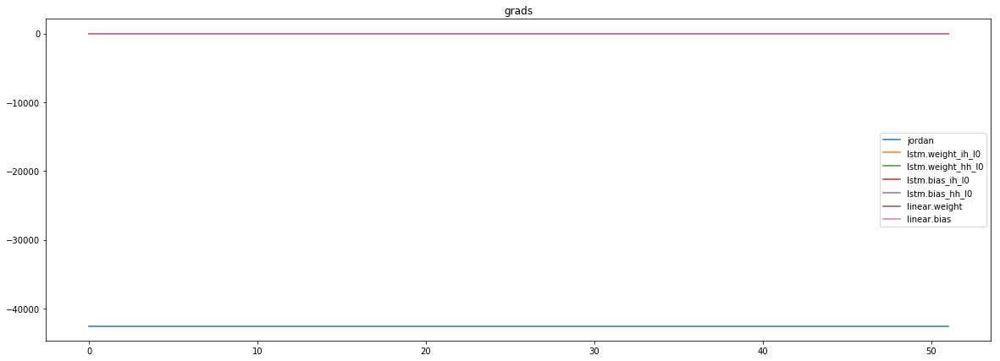

mean_p1 : 879.392578125
mean_p2 : -42763.39453125
mean_p3 : -660.844970703125


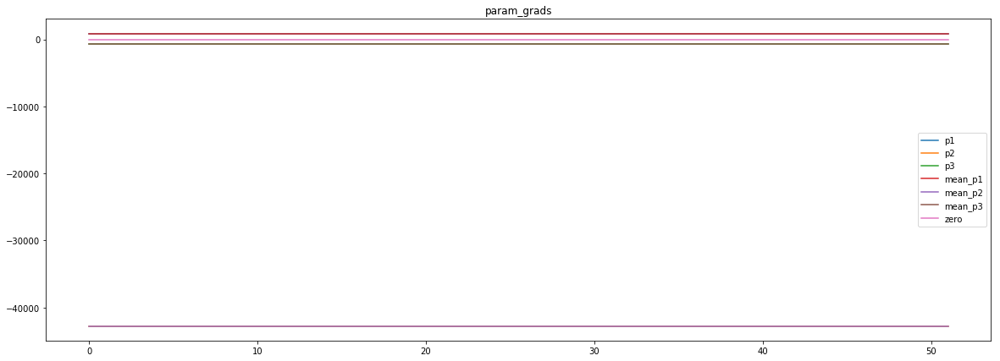

loss rate [0.614110827778881]
Epoch [27] 
     train_loss[1550.3255869058462] 
     eval_train[1.0166135590810041] 
     eval_test[0.9783121509985491]



aux preds: 0.46496233344078064           1.030158281326294           6.935176849365234
main loss 0.0
aux loss 44.44233289131751
jord loss 1427.7130385178787
combined loss 1472.1553714091963 



Parameter containing:
tensor([[0.4650, 1.0302, 6.9352]], requires_grad=True)


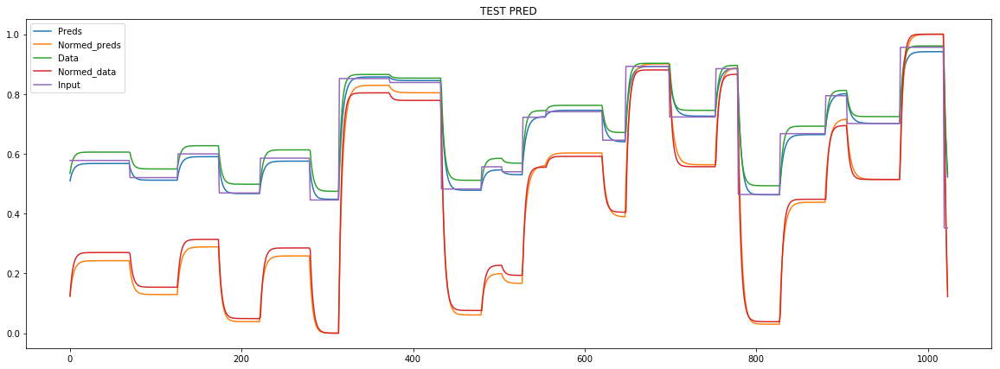

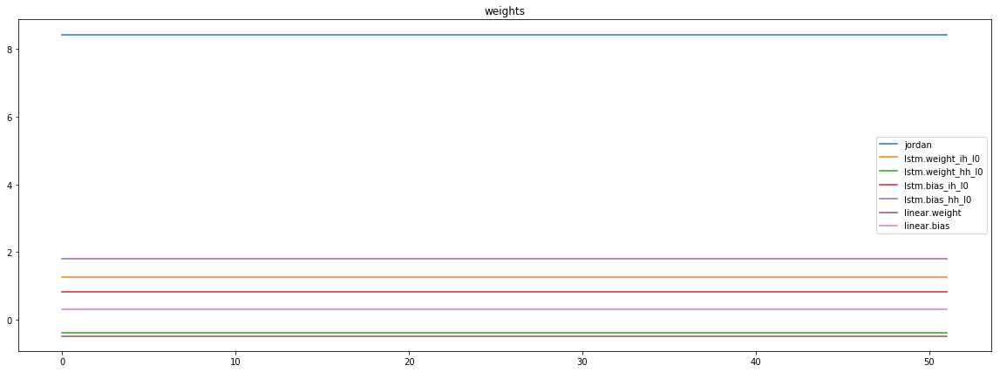

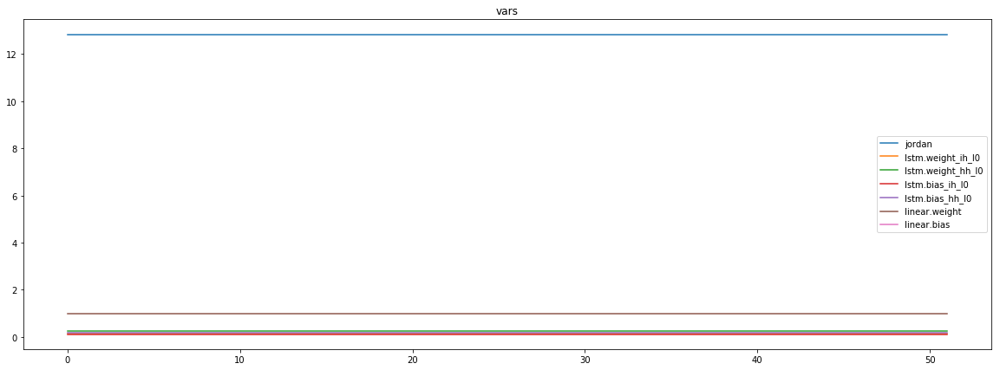

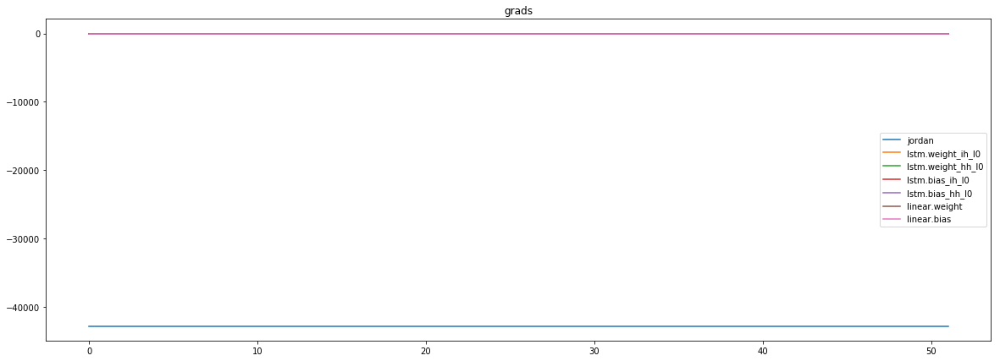

mean_p1 : 946.2847900390625
mean_p2 : -43089.87890625
mean_p3 : -666.0350341796875


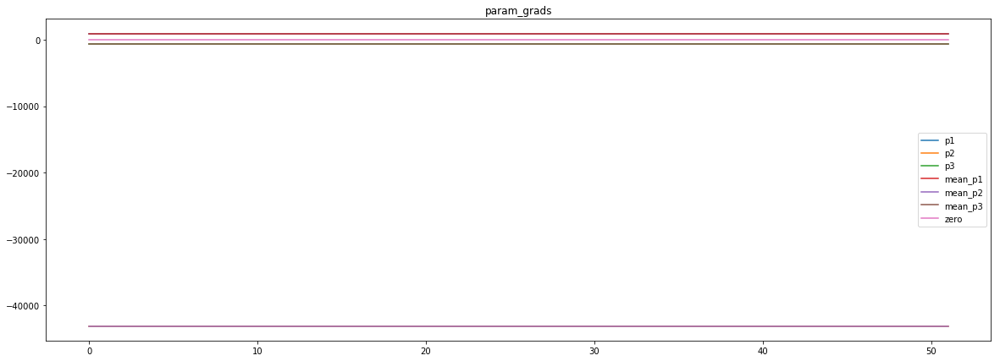

loss rate [0.053961291234113196]
Epoch [28] 
     train_loss[1472.1553714091963] 
     eval_train[1.6163387252734258] 
     eval_test[1.645901457829909]



aux preds: 0.46263107657432556           1.0267696380615234           7.217190742492676
main loss 0.0
aux loss 43.018868703108566
jord loss 1354.8263948880708
combined loss 1397.8452635911794 



Parameter containing:
tensor([[0.4626, 1.0268, 7.2172]], requires_grad=True)


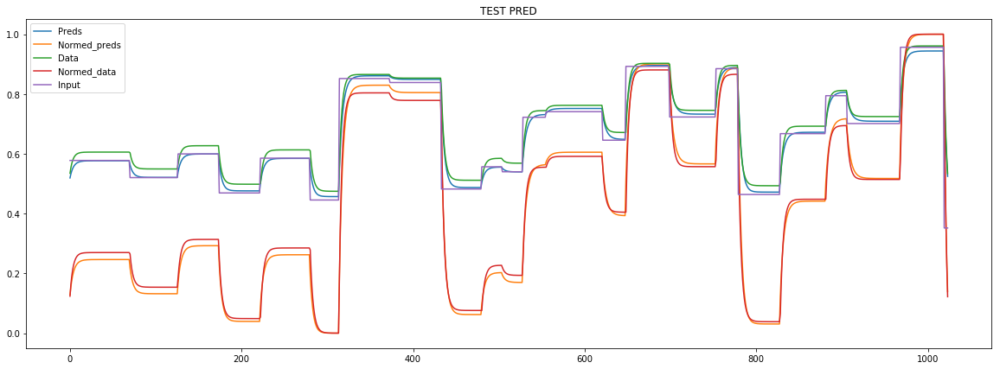

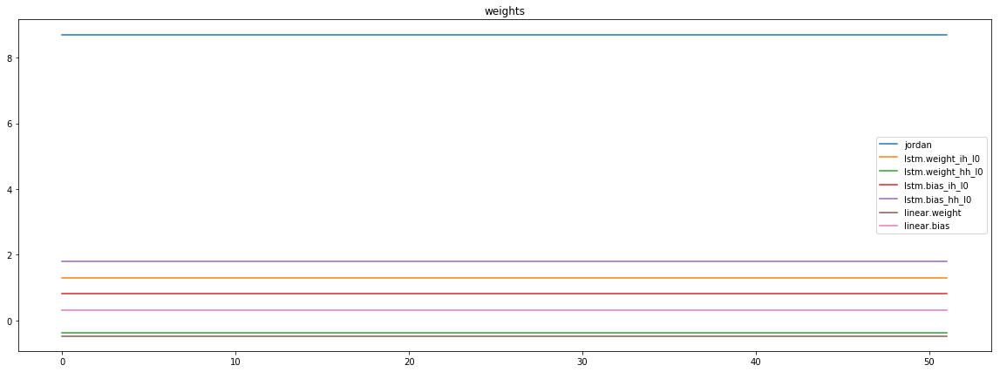

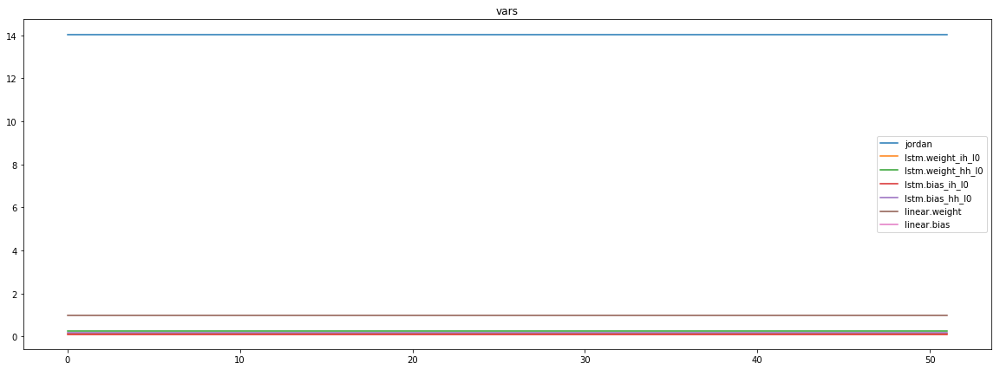

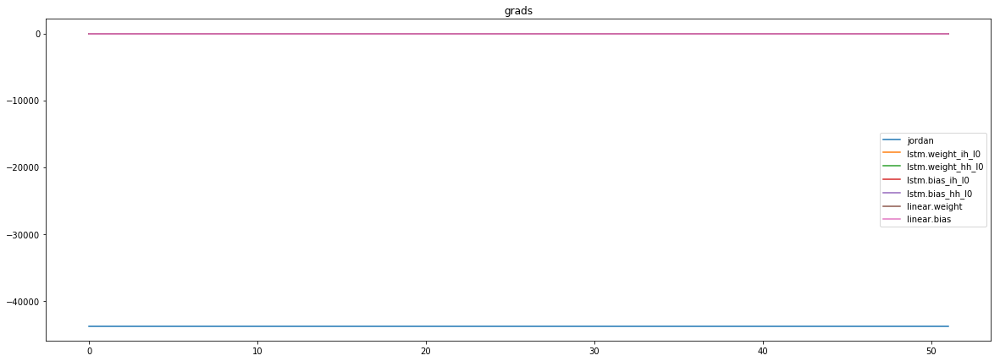

mean_p1 : 1035.3775634765625
mean_p2 : -44145.47265625
mean_p3 : -677.4461059570312


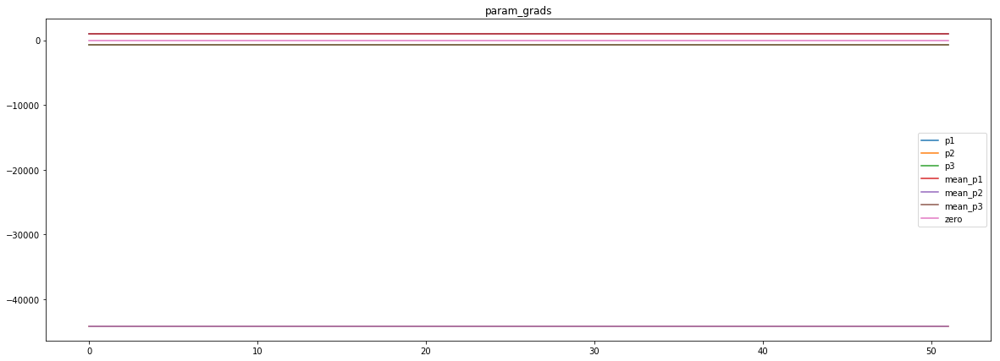

loss rate [0.011241146523943035]
Epoch [29] 
     train_loss[1397.8452635911794] 
     eval_train[1.1959685889574199] 
     eval_test[1.212144827300852]



aux preds: 0.4592428505420685           1.0238564014434814           7.486355781555176
main loss 0.0
aux loss 38.52807635527391
jord loss 1288.3194720928486
combined loss 1326.8475484481226 



Parameter containing:
tensor([[0.4592, 1.0239, 7.4864]], requires_grad=True)


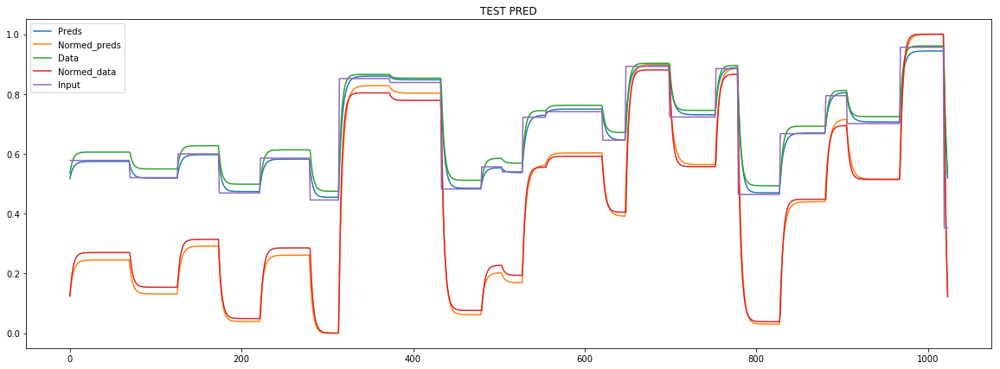

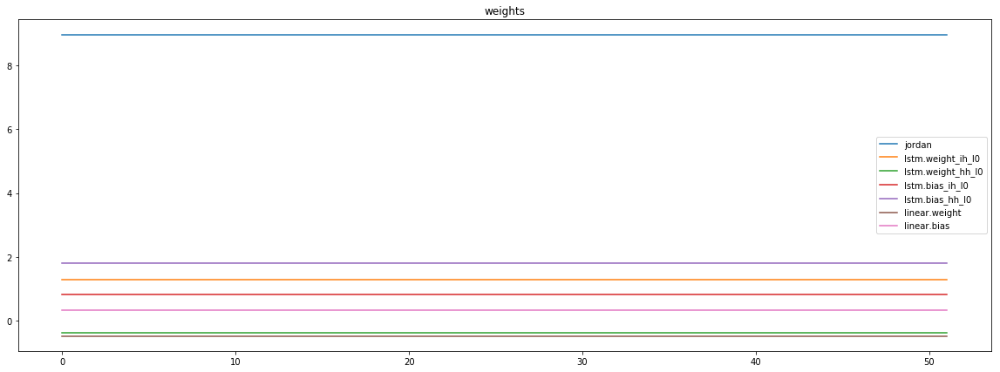

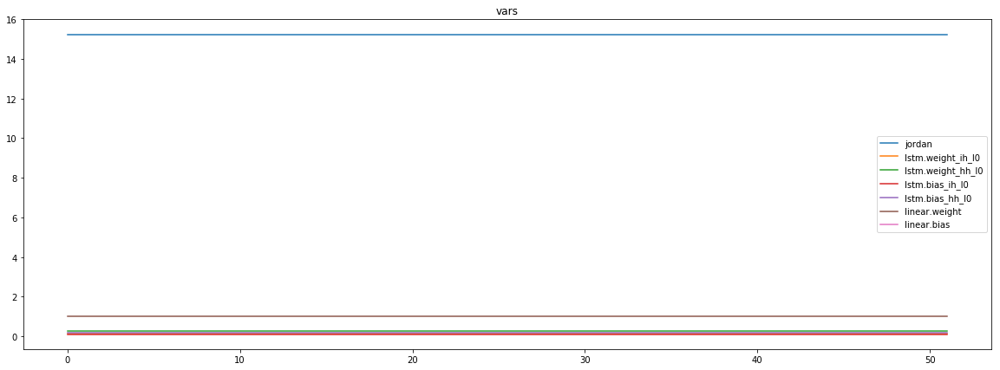

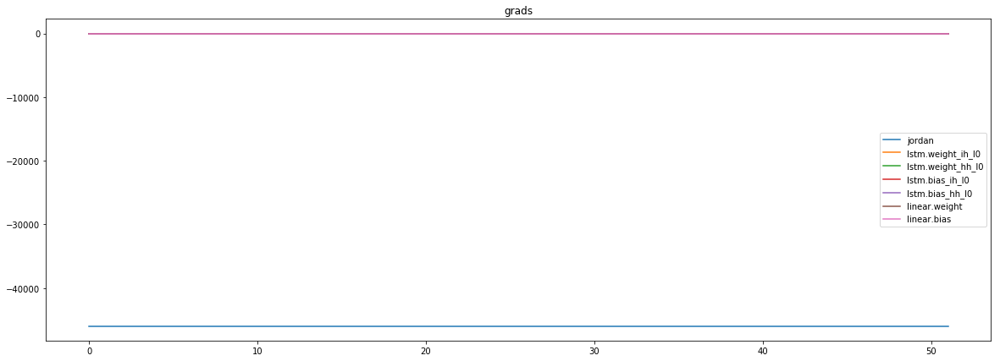

mean_p1 : 962.57373046875
mean_p2 : -46222.9609375
mean_p3 : -699.533203125


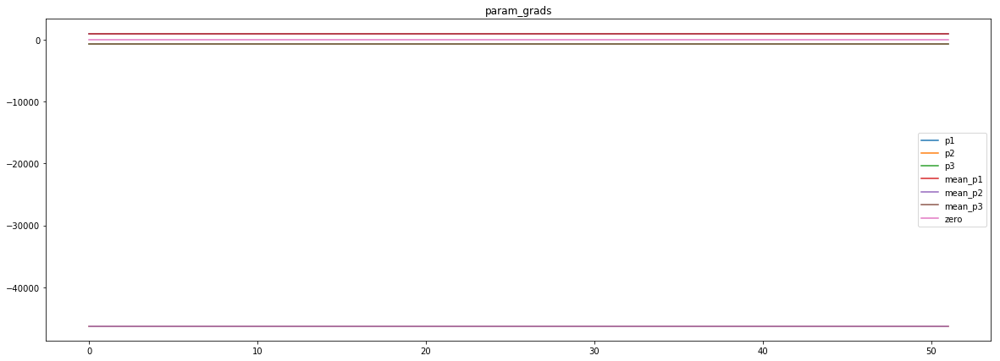

loss rate [-0.029787902989447446]
Epoch [30] 
     train_loss[1326.8475484481226] 
     eval_train[1.2978608528008828] 
     eval_test[1.3168785030191594]



aux preds: 0.4548434615135193           1.0227075815200806           7.748060703277588
main loss 0.0
aux loss 39.12309217453003
jord loss 1223.313461303711
combined loss 1262.436553478241 



Parameter containing:
tensor([[0.4548, 1.0227, 7.7481]], requires_grad=True)


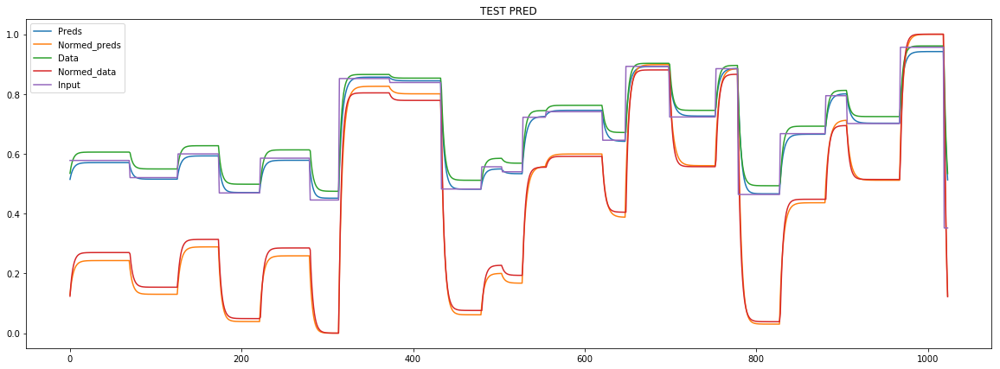

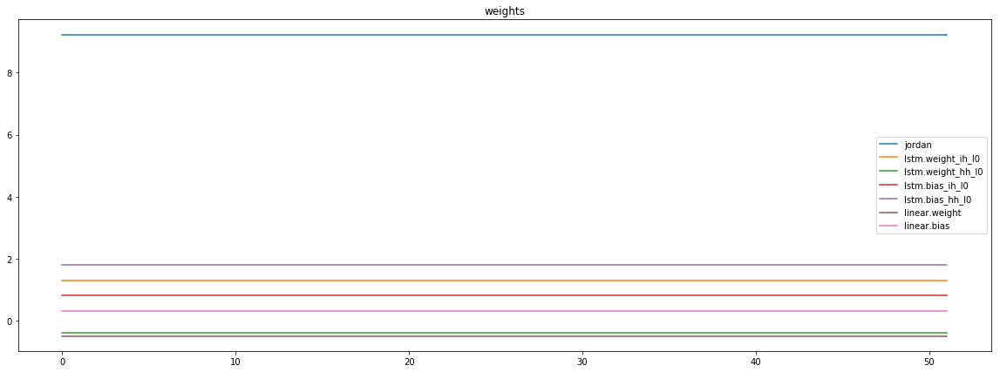

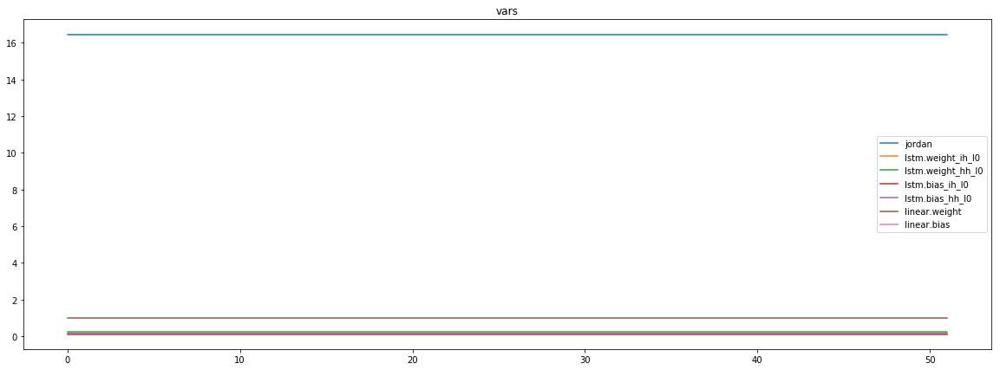

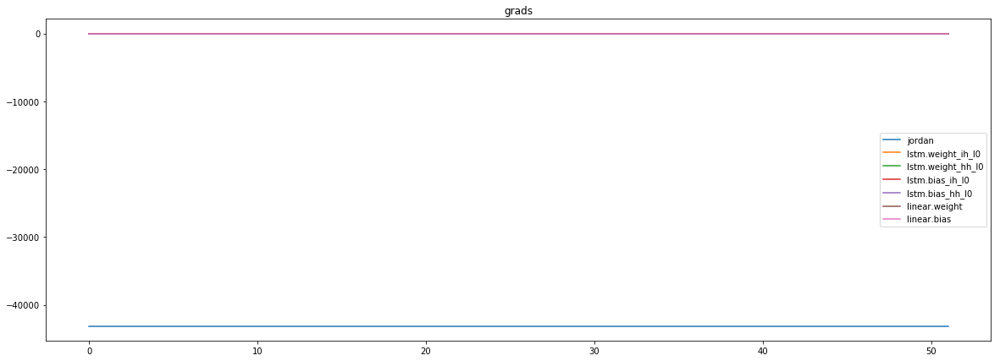

mean_p1 : 783.6390991210938
mean_p2 : -43217.07421875
mean_p3 : -675.8240966796875


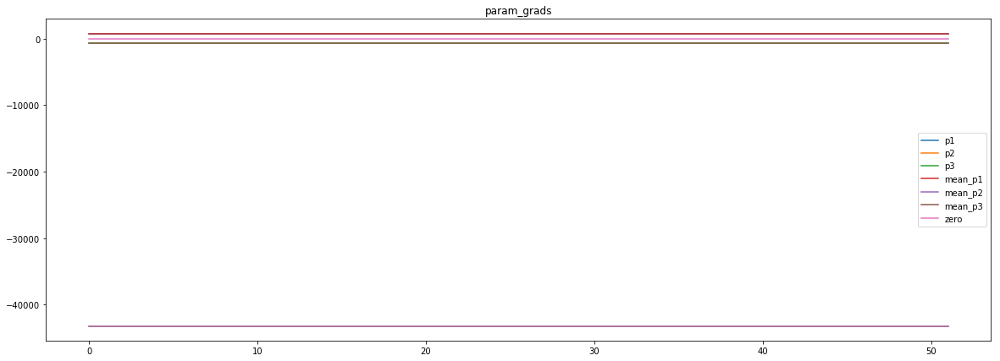

loss rate [-0.10626856832915577]
Epoch [31] 
     train_loss[1262.436553478241] 
     eval_train[1.5120965815507448] 
     eval_test[1.5395293560895054]



aux preds: 0.45349356532096863           1.0192172527313232           8.009195327758789
main loss 0.0
aux loss 33.78356060614953
jord loss 1153.0848905123198
combined loss 1186.8684511184692 



Parameter containing:
tensor([[0.4535, 1.0192, 8.0092]], requires_grad=True)


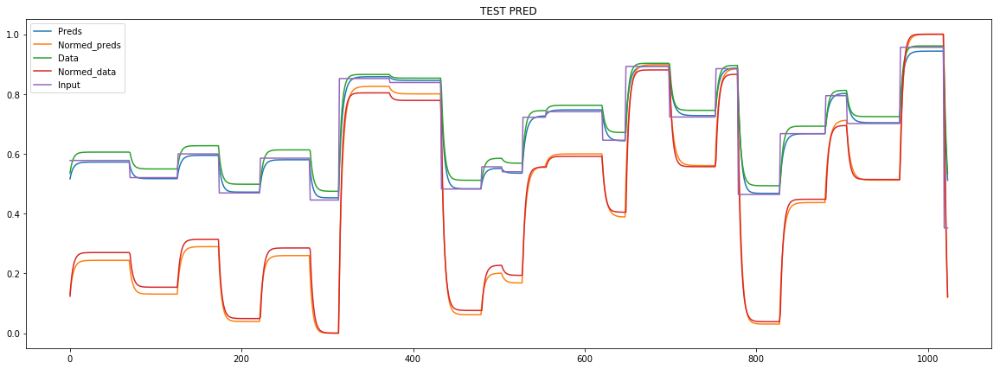

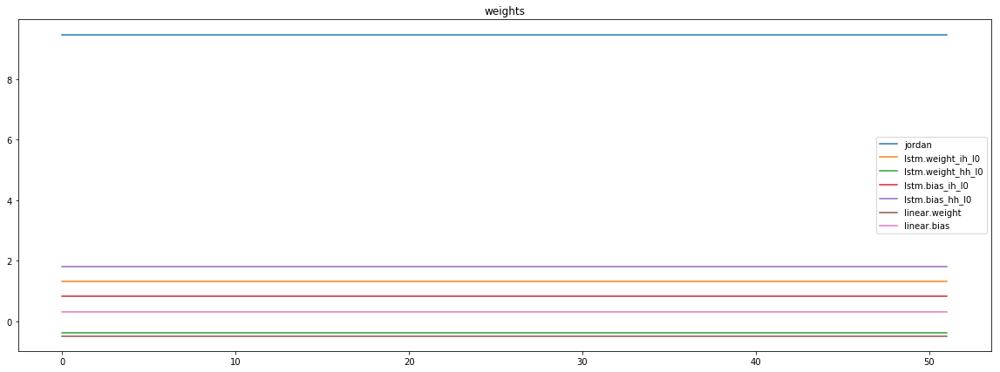

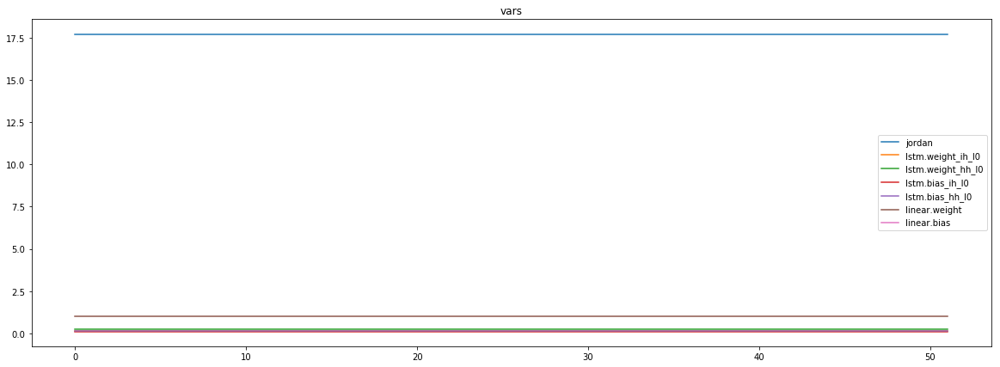

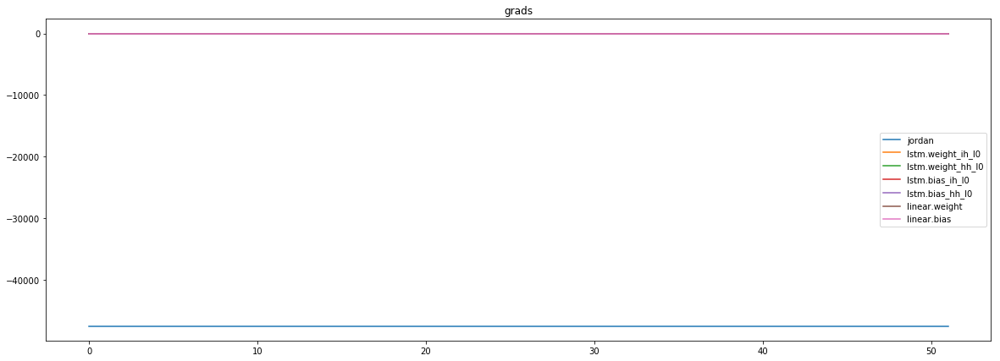

mean_p1 : 675.109130859375
mean_p2 : -47450.41015625
mean_p3 : -717.4971923828125


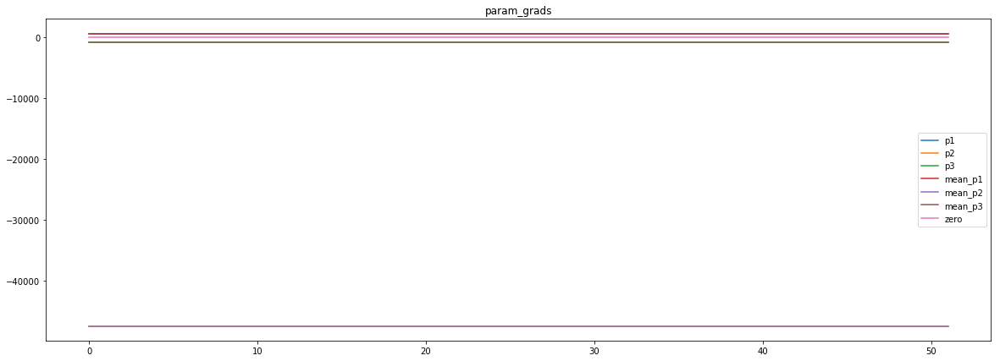

loss rate [-0.06128190769396791]
Epoch [32] 
     train_loss[1186.8684511184692] 
     eval_train[1.4153962479187892] 
     eval_test[1.4392937855287031]



aux preds: 0.45146259665489197           1.017606496810913           8.234704971313477
main loss 0.0
aux loss 38.92123101307796
jord loss 1105.059333214393
combined loss 1143.980564227471 



Parameter containing:
tensor([[0.4515, 1.0176, 8.2347]], requires_grad=True)


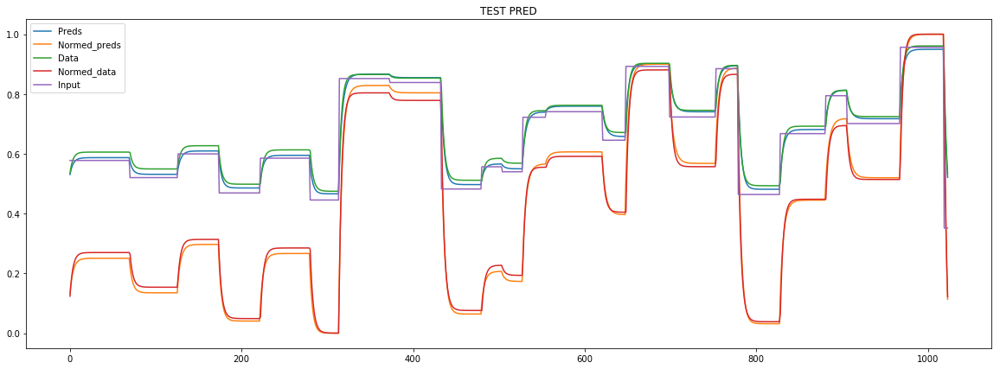

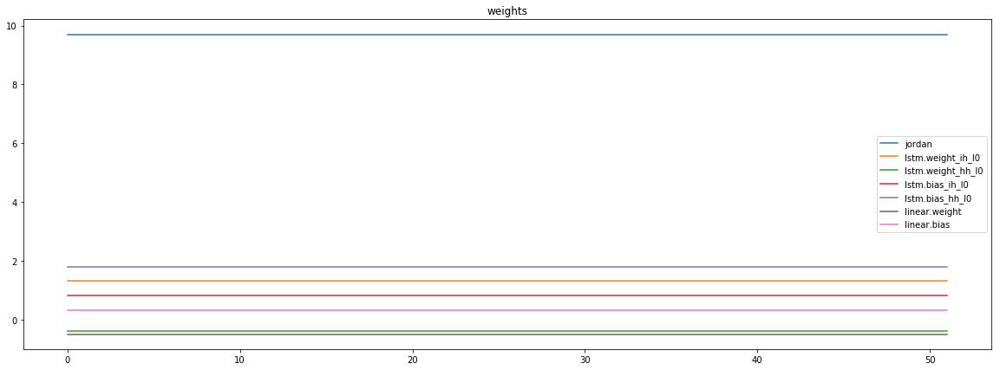

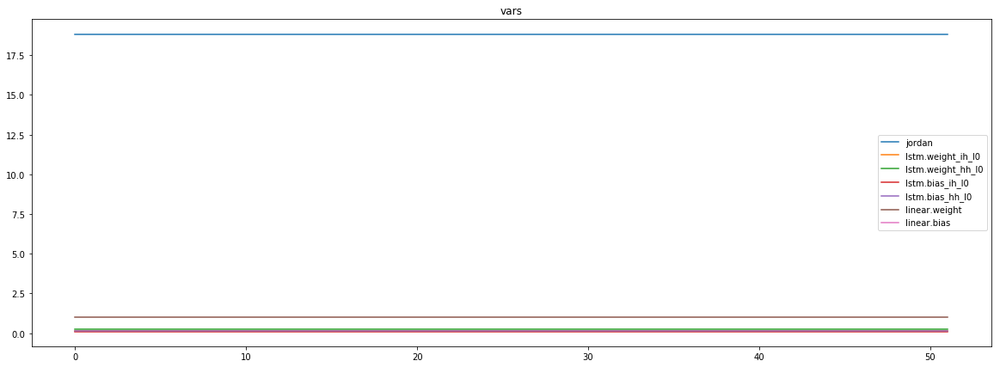

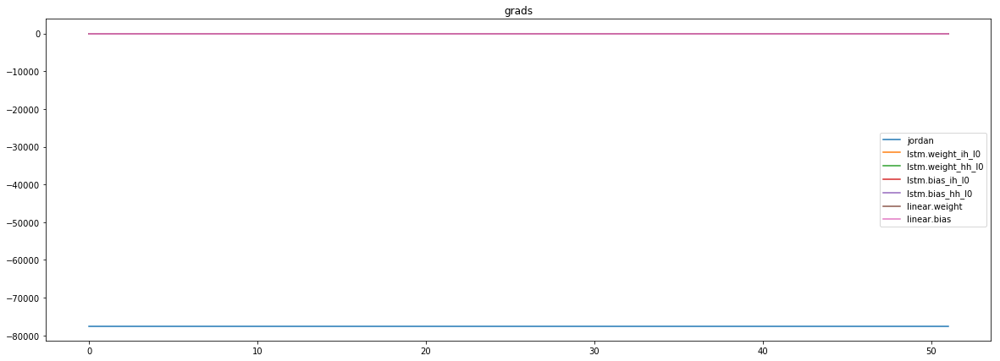

mean_p1 : 7.851815700531006
mean_p2 : -76514.828125
mean_p3 : -982.31103515625


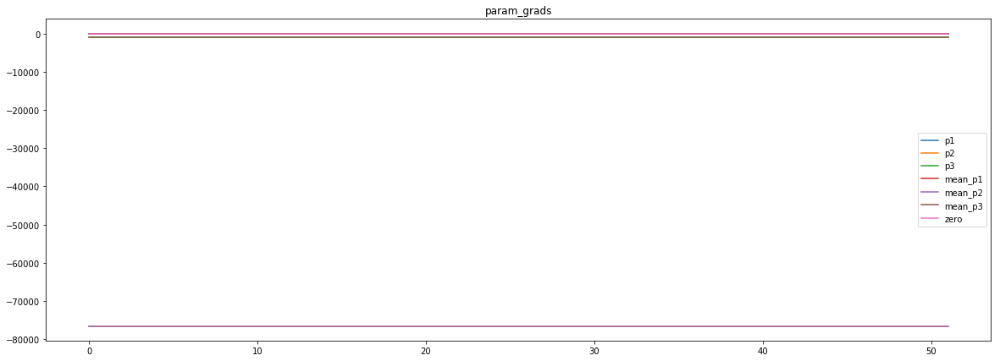

loss rate [0.4815516254671989]
Epoch [33] 
     train_loss[1143.980564227471] 
     eval_train[0.7456365605959525] 
     eval_test[0.7423665117133748]



aux preds: 0.45171043276786804           1.01560640335083           8.45114517211914
main loss 0.0
aux loss 39.942787463848404
jord loss 1052.0235173152043
combined loss 1091.9663047790527 



Parameter containing:
tensor([[0.4517, 1.0156, 8.4511]], requires_grad=True)


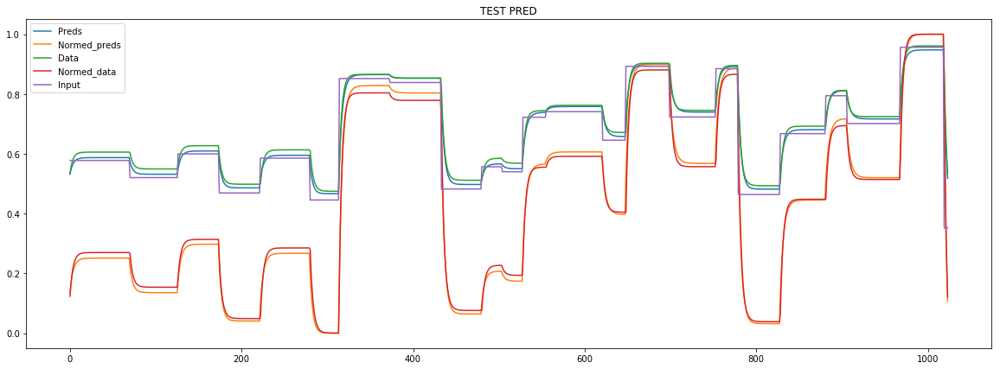

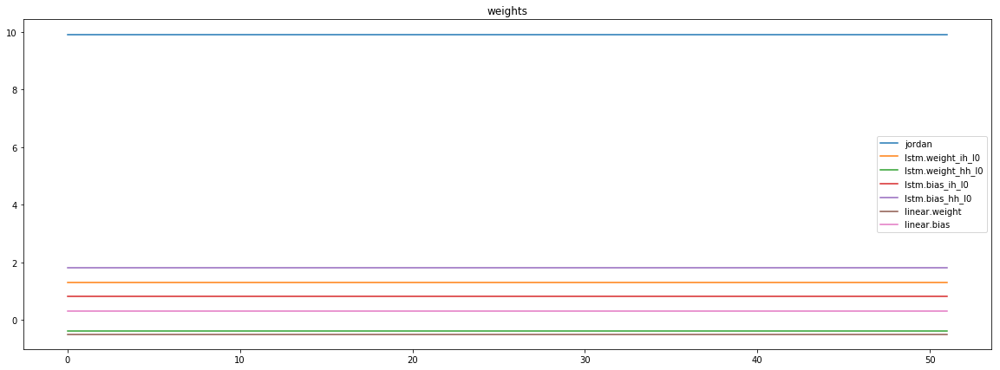

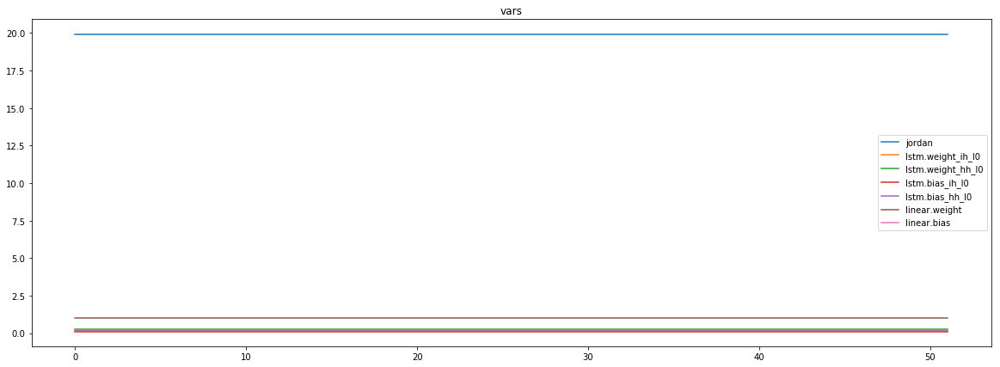

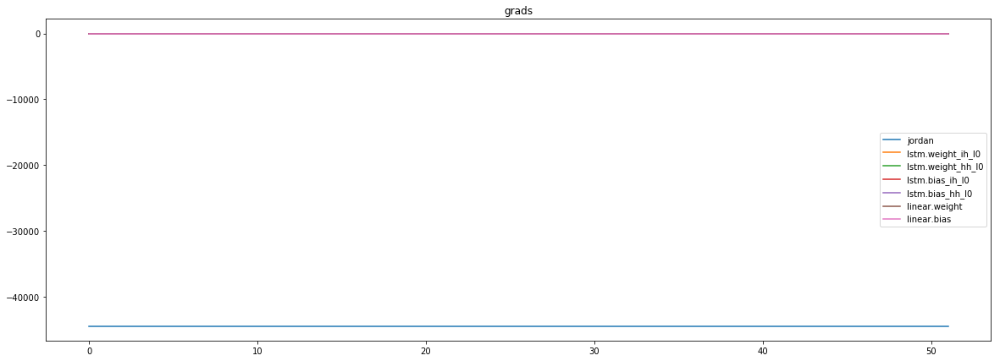

mean_p1 : 912.8817138671875
mean_p2 : -44633.6953125
mean_p3 : -693.0130615234375


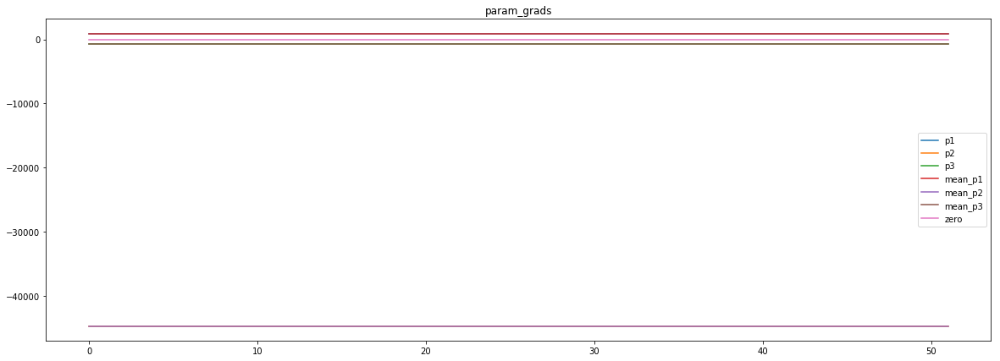

loss rate [0.37720223549317455]
Epoch [34] 
     train_loss[1091.9663047790527] 
     eval_train[0.7740367708297876] 
     eval_test[0.7725161991336129]



aux preds: 0.4493785500526428           1.0149818658828735           8.668594360351562
main loss 0.0
aux loss 29.41299401796781
jord loss 991.8426513671875
combined loss 1021.2556453851553 



Parameter containing:
tensor([[0.4494, 1.0150, 8.6686]], requires_grad=True)


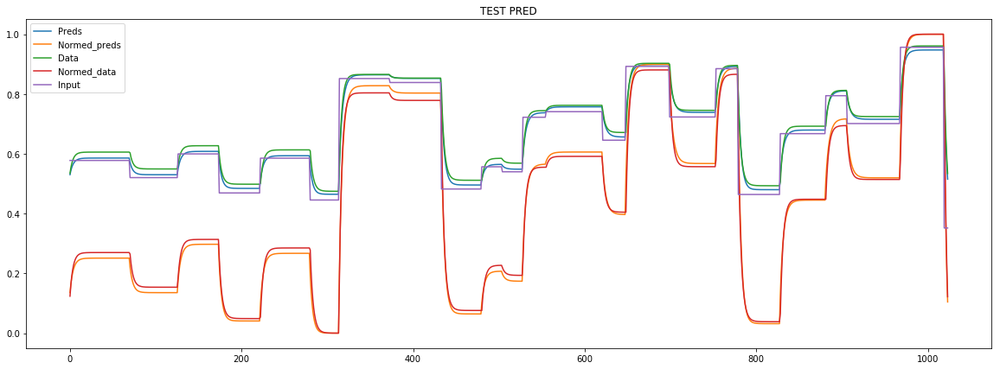

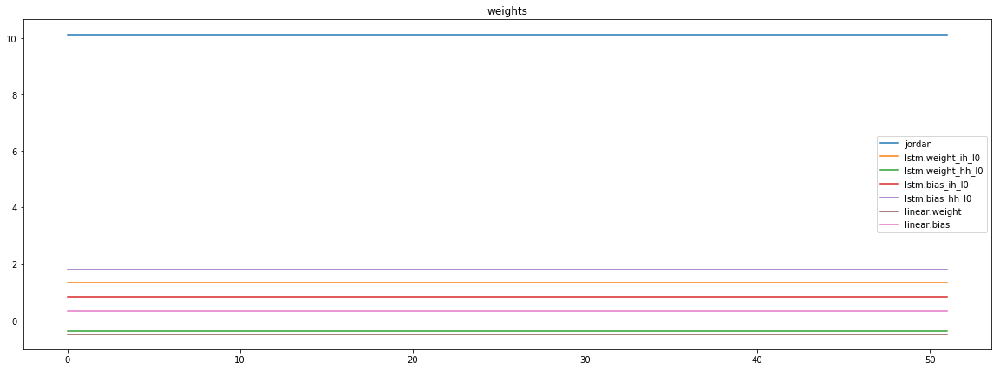

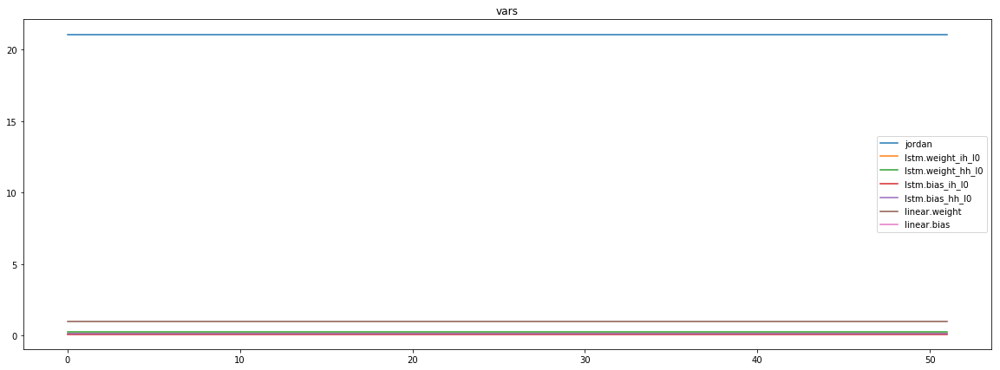

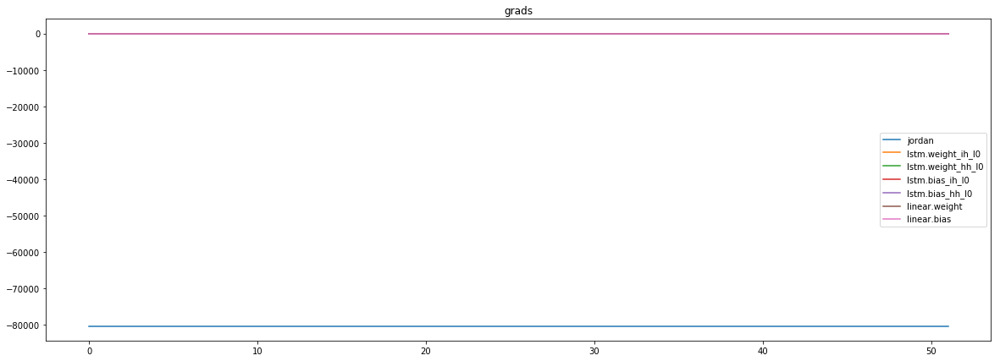

mean_p1 : -767.4718017578125
mean_p2 : -78648.109375
mean_p3 : -1006.6748046875


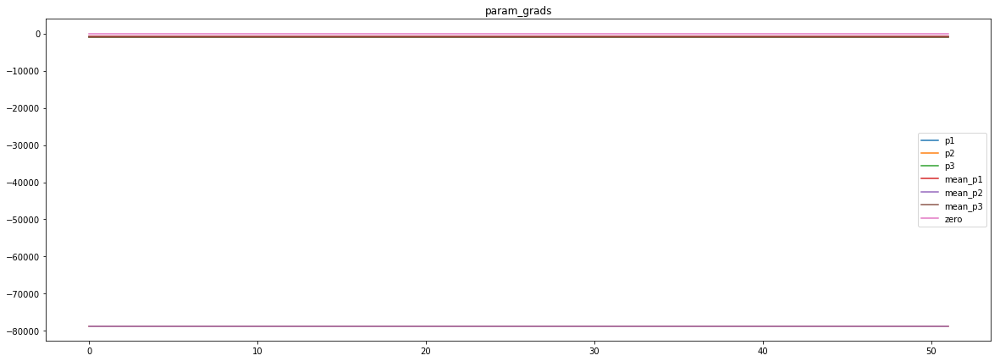

loss rate [0.16026660151328254]
Epoch [35] 
     train_loss[1021.2556453851553] 
     eval_train[0.8227940362233382] 
     eval_test[0.8269068896770477]



aux preds: 0.4495168924331665           1.0141545534133911           8.836944580078125
main loss 0.0
aux loss 36.35448697897104
jord loss 950.7030334472656
combined loss 987.0575204262367 



Parameter containing:
tensor([[0.4495, 1.0142, 8.8369]], requires_grad=True)


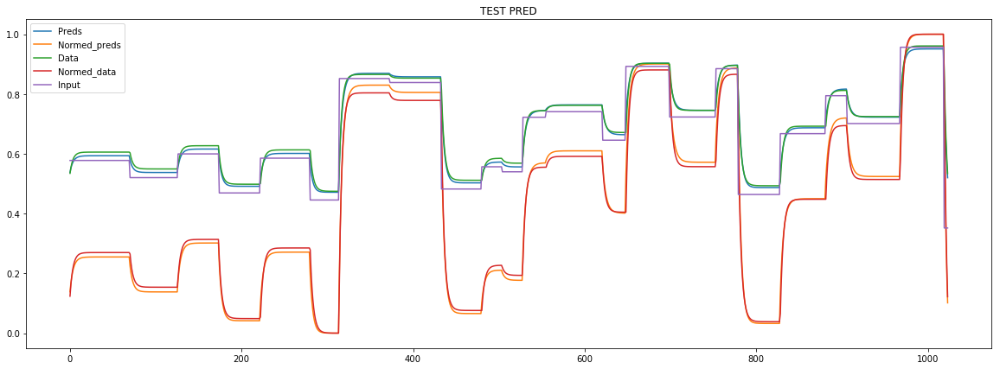

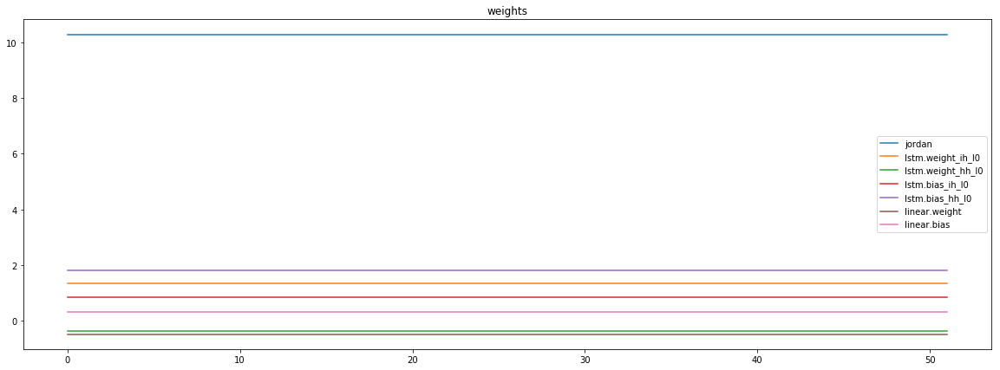

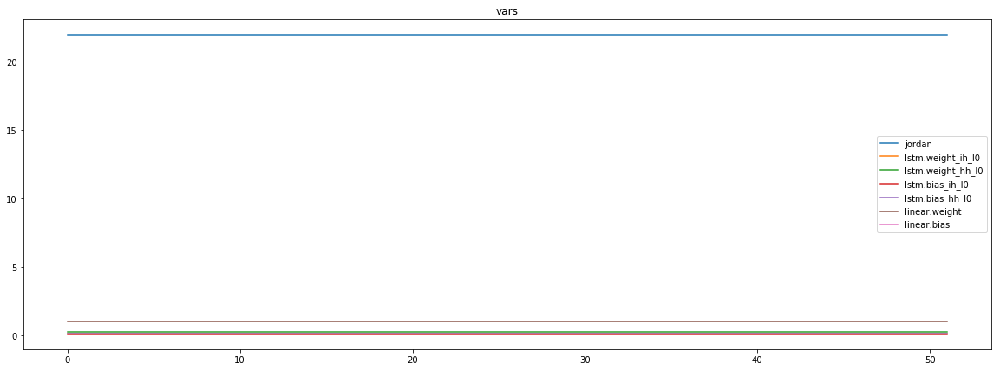

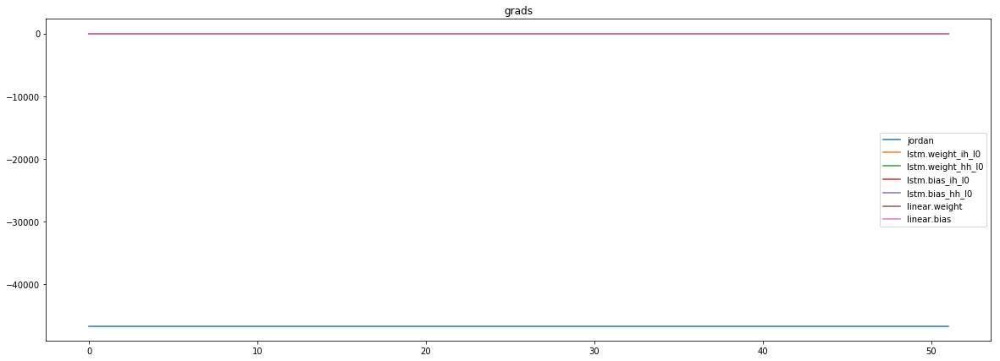

mean_p1 : -2869.006103515625
mean_p2 : -43147.71484375
mean_p3 : -688.8717041015625


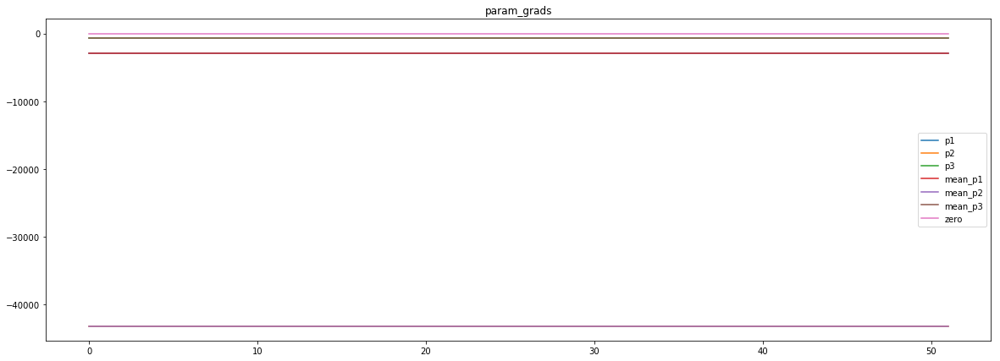

loss rate [0.2613207634889614]
Epoch [36] 
     train_loss[987.0575204262367] 
     eval_train[0.5979052598659809] 
     eval_test[0.5766104513948614]



aux preds: 0.4506625533103943           1.0114617347717285           9.00745964050293
main loss 0.0
aux loss 35.14192119011512
jord loss 891.380611713116
combined loss 926.5225329032311 



Parameter containing:
tensor([[0.4507, 1.0115, 9.0075]], requires_grad=True)


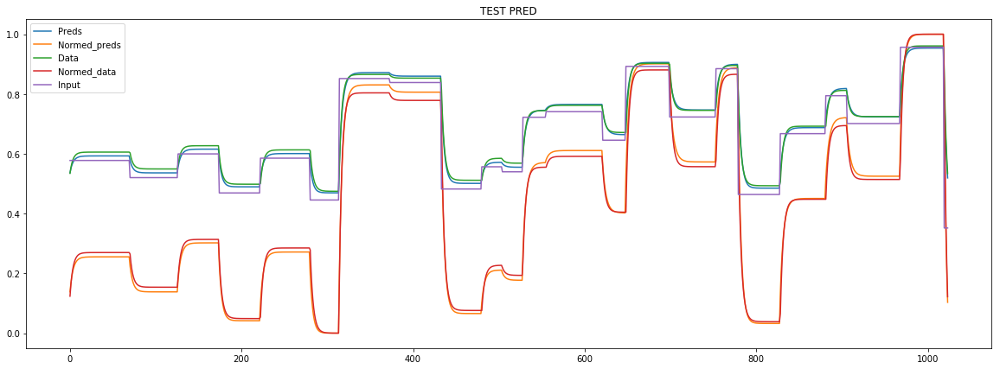

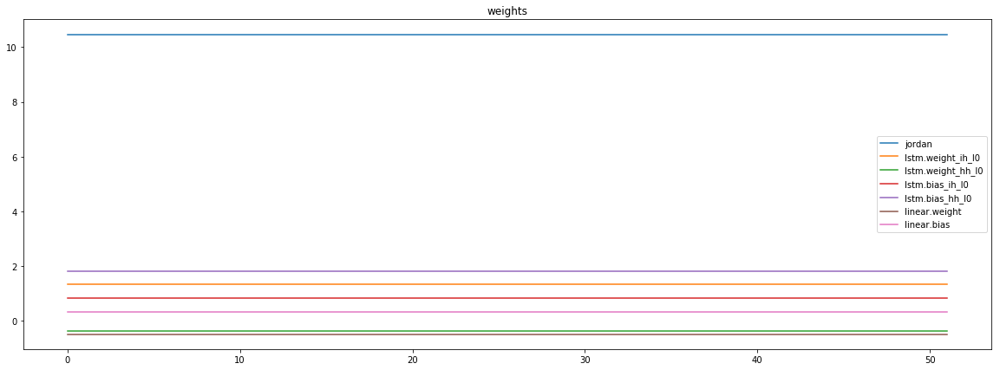

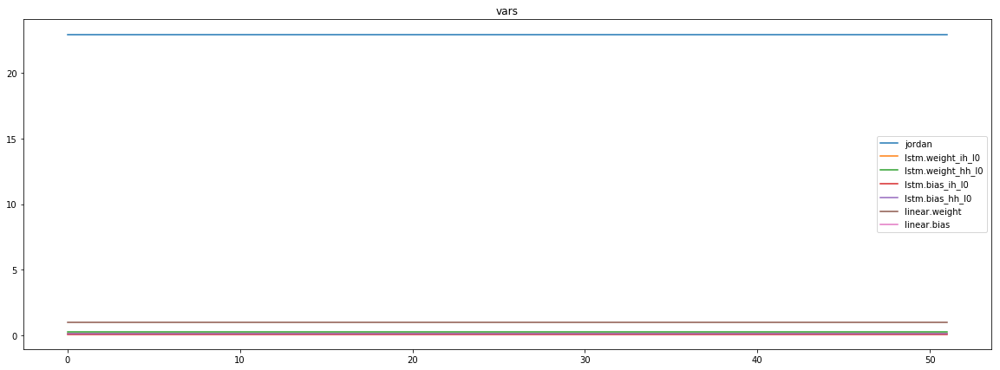

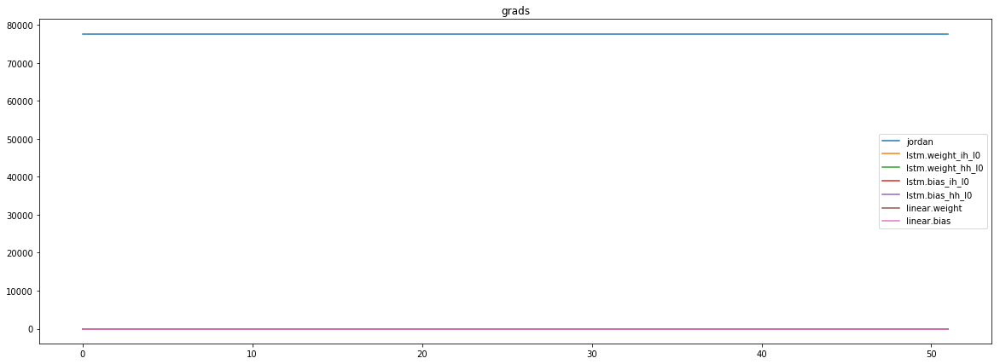

mean_p1 : -4613.3564453125
mean_p2 : 81691.6484375
mean_p3 : 649.2374267578125


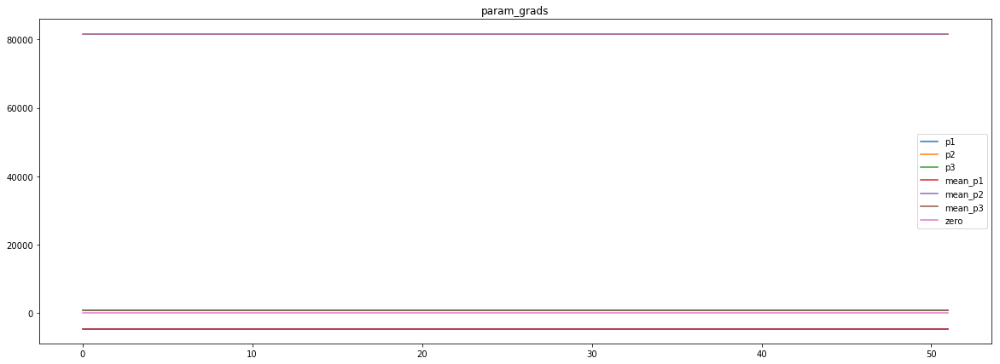

loss rate [0.18567389632107167]
Epoch [37] 
     train_loss[926.5225329032311] 
     eval_train[0.6043424331224881] 
     eval_test[0.5906669714234092]



aux preds: 0.44752123951911926           1.010797142982483           9.162168502807617
main loss 0.0
aux loss 37.09628061147836
jord loss 864.39012498122
combined loss 901.4864055926984 



Parameter containing:
tensor([[0.4475, 1.0108, 9.1622]], requires_grad=True)


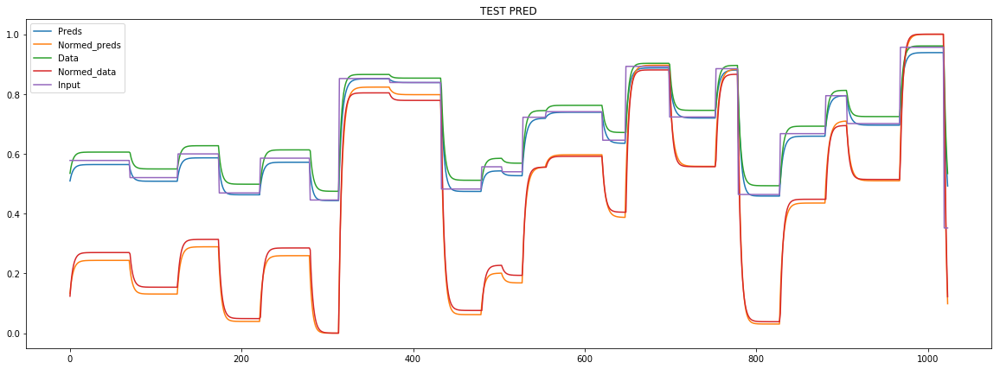

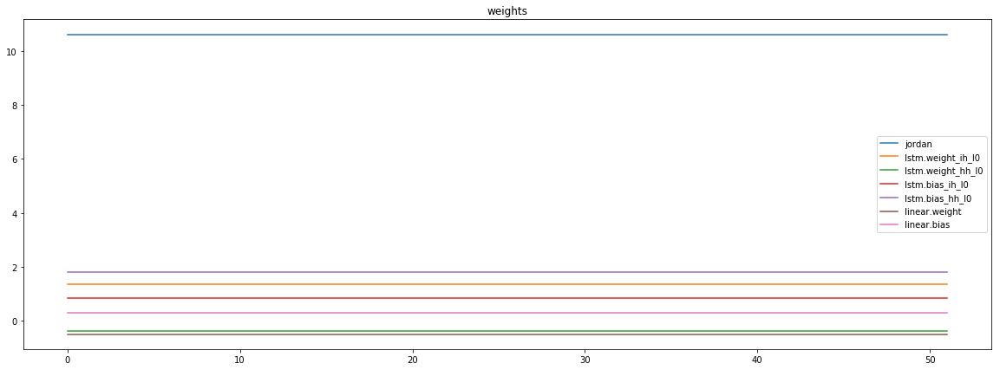

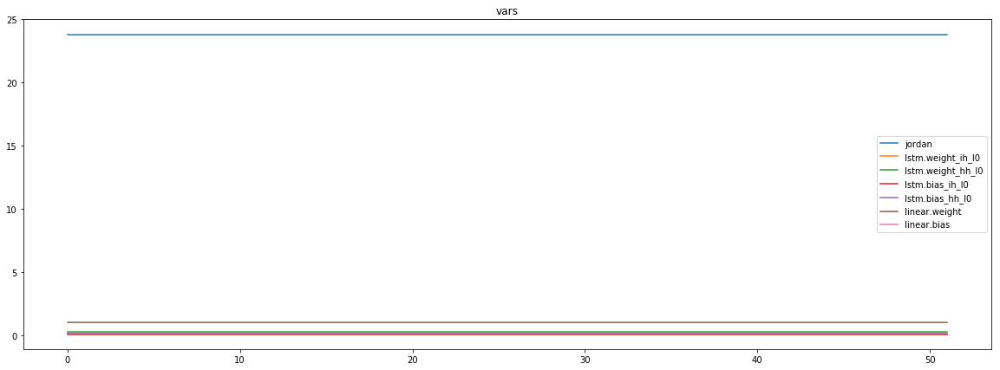

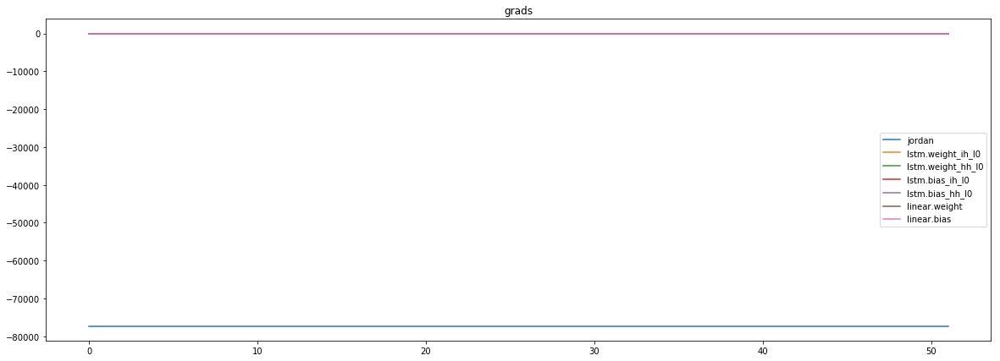

mean_p1 : 1500.1580810546875
mean_p2 : -77805.8203125
mean_p3 : -990.2308959960938


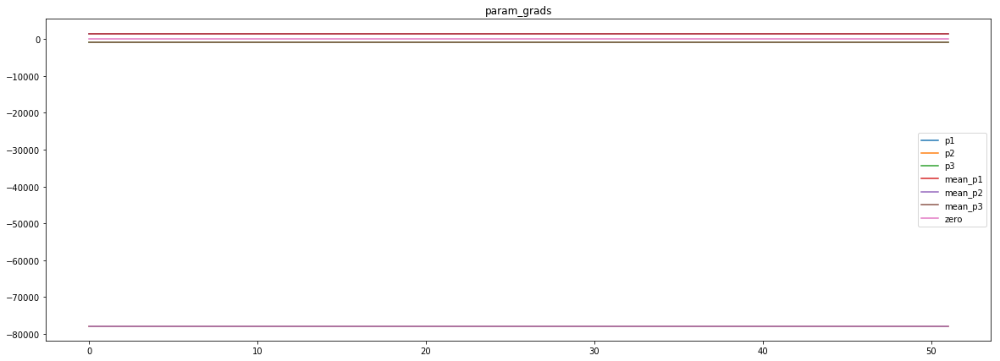

loss rate [-1.942016805328695]
Epoch [38] 
     train_loss[901.4864055926984] 
     eval_train[1.923075217467088] 
     eval_test[1.9556412534280256]



aux preds: 0.4479420483112335           1.0083177089691162           9.282916069030762
main loss 0.0
aux loss 36.12031412124634
jord loss 828.6717805128831
combined loss 864.7920946341294 



Parameter containing:
tensor([[0.4479, 1.0083, 9.2829]], requires_grad=True)


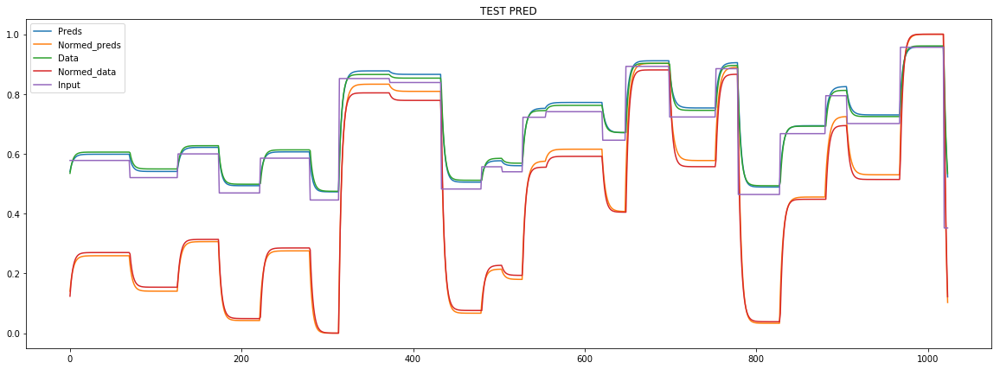

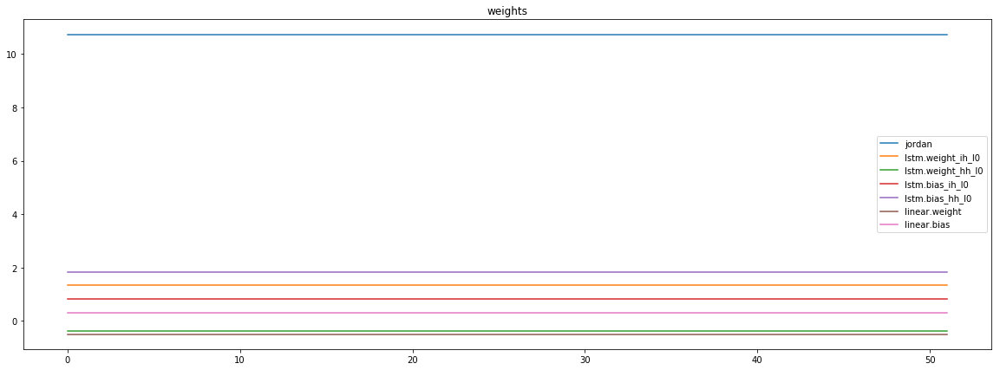

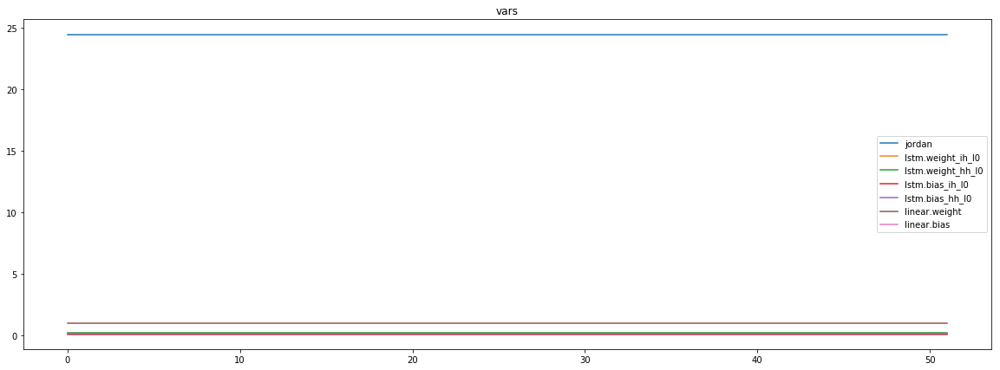

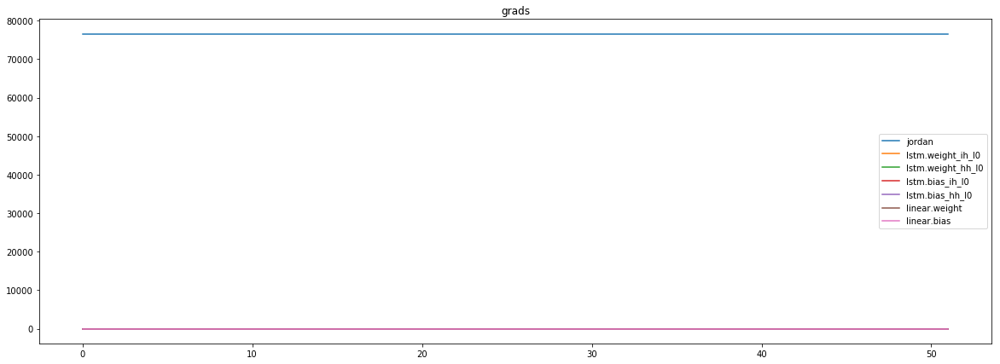

mean_p1 : -704.8685302734375
mean_p2 : 76697.7109375
mean_p3 : 597.07373046875


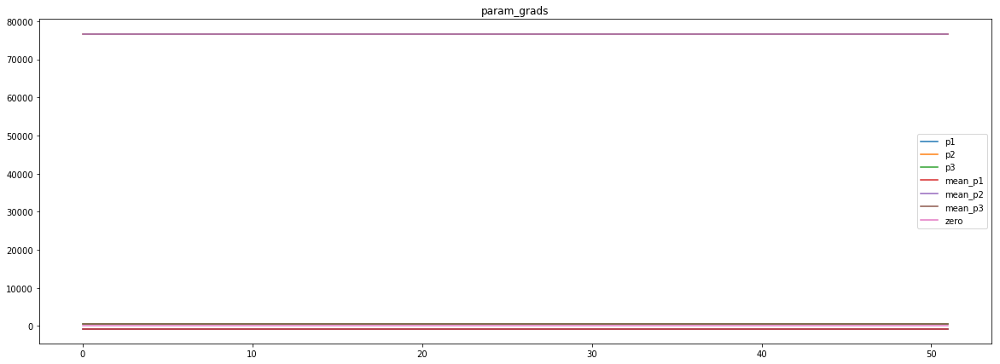

loss rate [0.4234748856247861]
Epoch [39] 
     train_loss[864.7920946341294] 
     eval_train[0.6115850227383467] 
     eval_test[0.6001470156691291]



aux preds: 0.4473358392715454           1.006347417831421           9.42378044128418
main loss 0.0
aux loss 33.45198891713069
jord loss 772.6817439152644
combined loss 806.1337328323951 



Parameter containing:
tensor([[0.4473, 1.0063, 9.4238]], requires_grad=True)


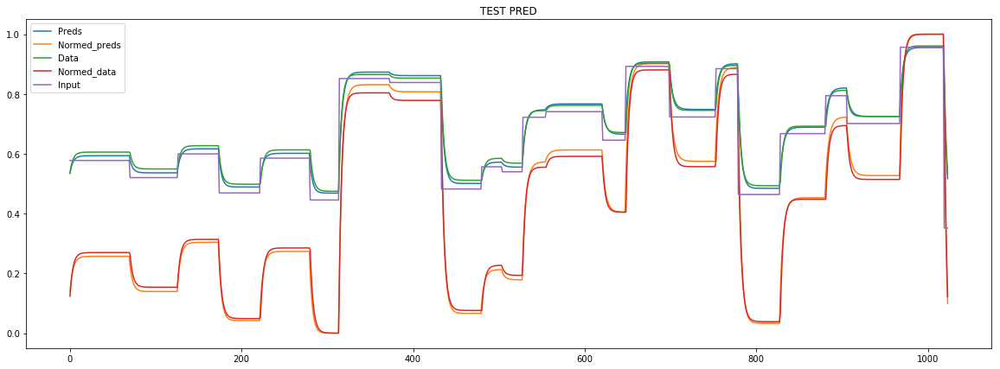

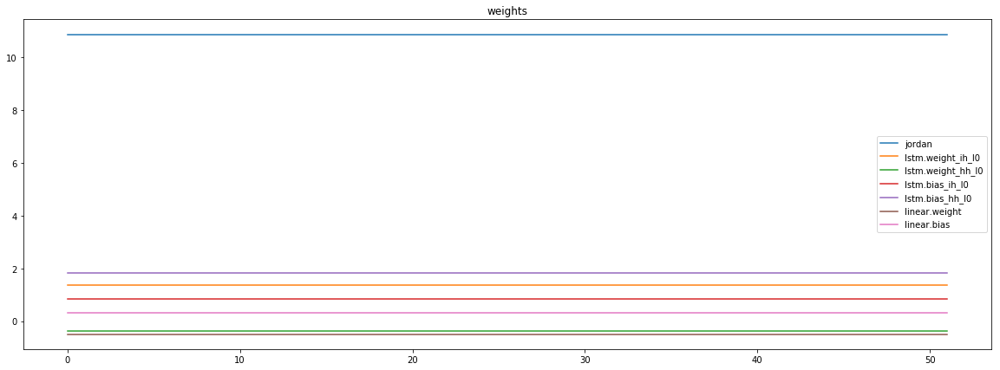

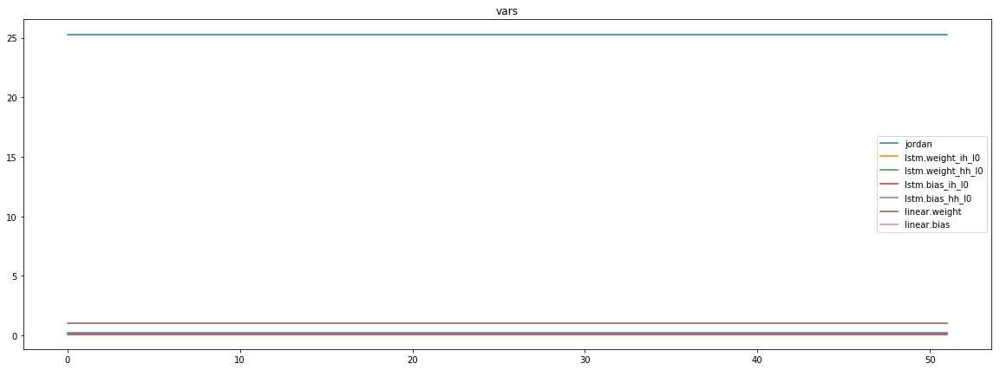

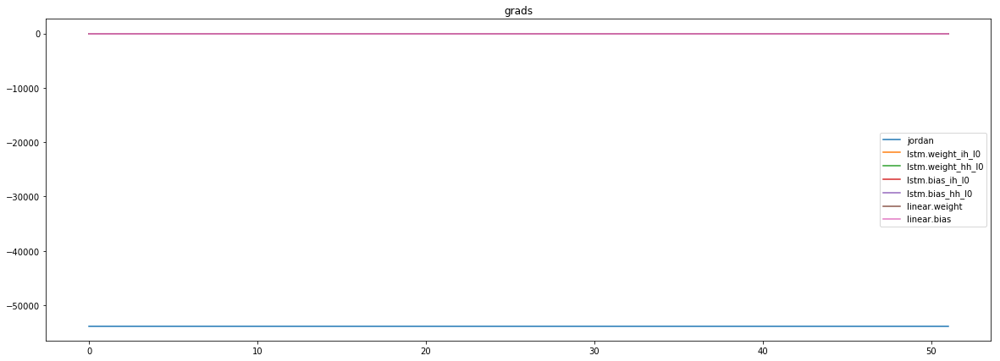

mean_p1 : -3350.455810546875
mean_p2 : -49715.25
mean_p3 : -742.952392578125


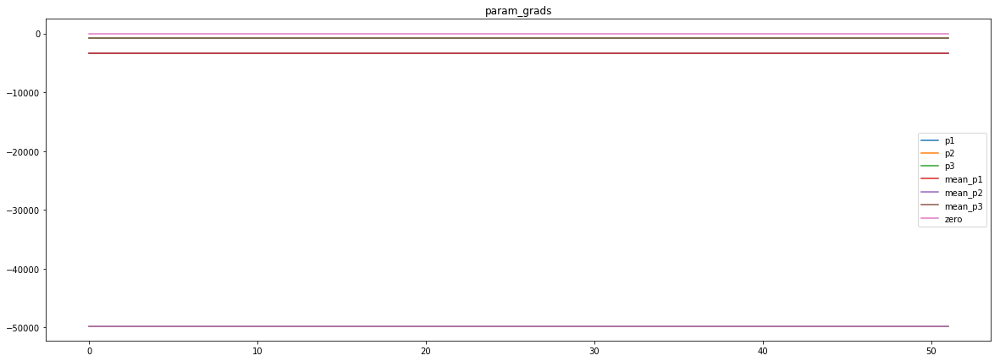

loss rate [0.43220437806661915]
Epoch [40] 
     train_loss[806.1337328323951] 
     eval_train[0.6024665482915365] 
     eval_test[0.5955145033923063]



aux preds: 0.4492212235927582           1.004187822341919           9.534719467163086
main loss 0.0
aux loss 31.768751804645245
jord loss 760.223276578463
combined loss 791.9920283831083 



Parameter containing:
tensor([[0.4492, 1.0042, 9.5347]], requires_grad=True)


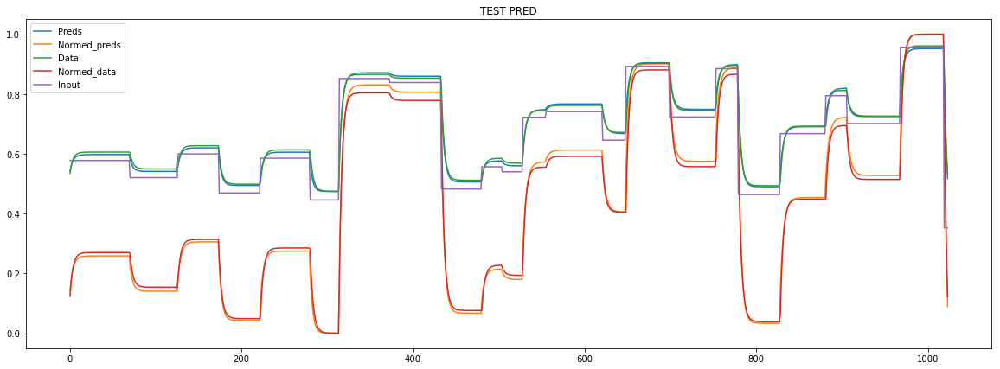

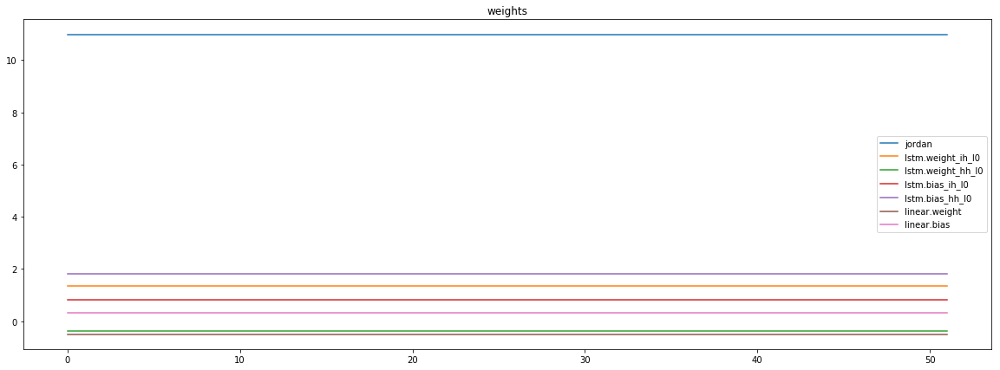

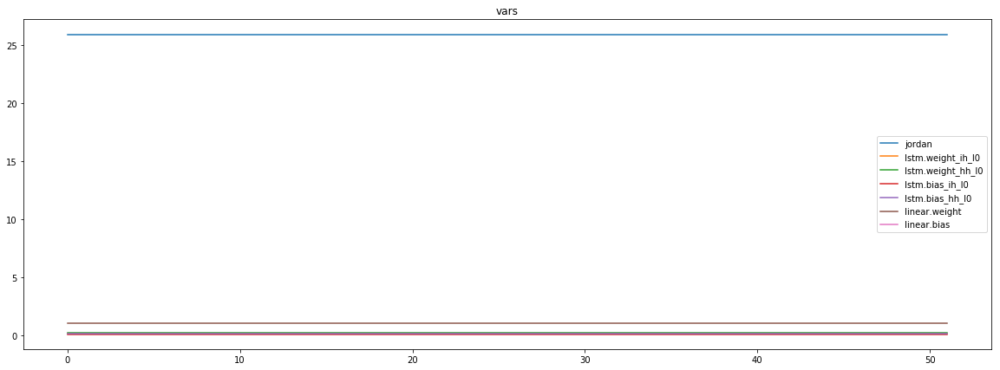

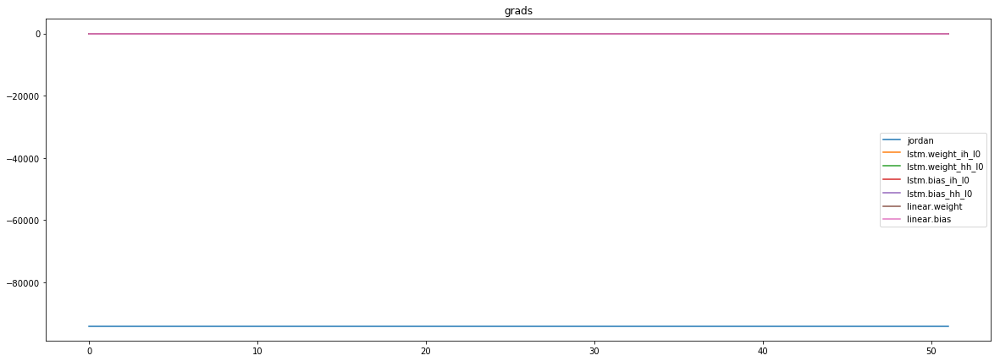

mean_p1 : 224.8946075439453
mean_p2 : -93124.2890625
mean_p3 : -1120.5950927734375


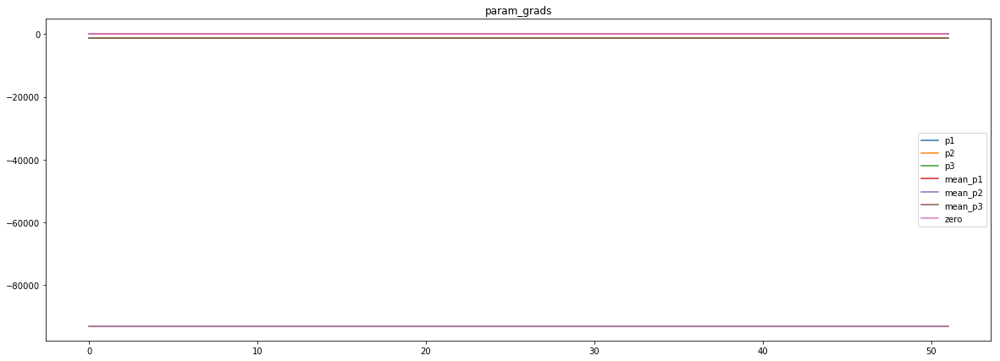

loss rate [0.4970126076717223]
Epoch [41] 
     train_loss[791.9920283831083] 
     eval_train[0.5551326492658029] 
     eval_test[0.5283551879904487]



aux preds: 0.4503367841243744           1.0039567947387695           9.63012409210205
main loss 0.0
aux loss 27.809775022359993
jord loss 732.6575546264648
combined loss 760.4673296488248 



Parameter containing:
tensor([[0.4503, 1.0040, 9.6301]], requires_grad=True)


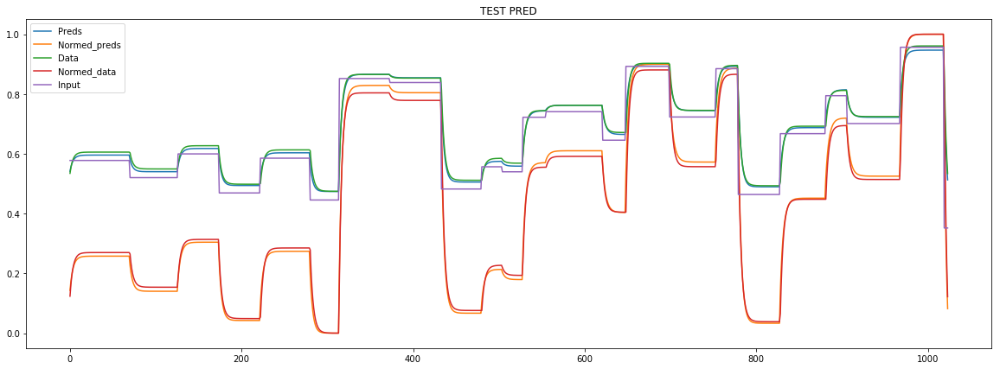

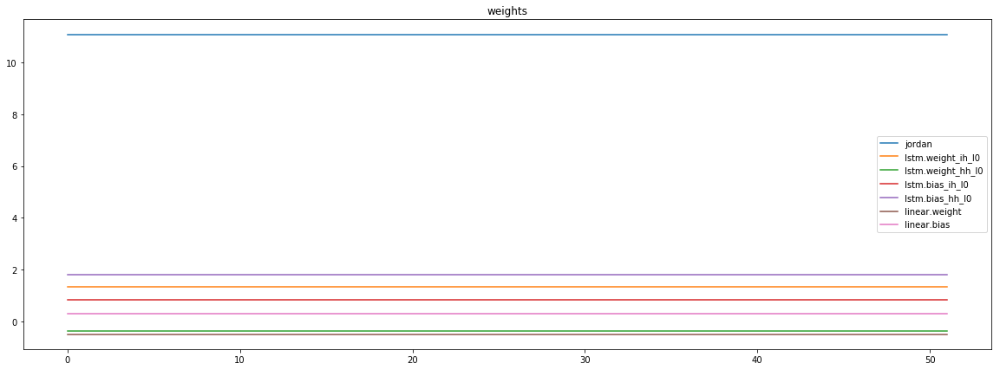

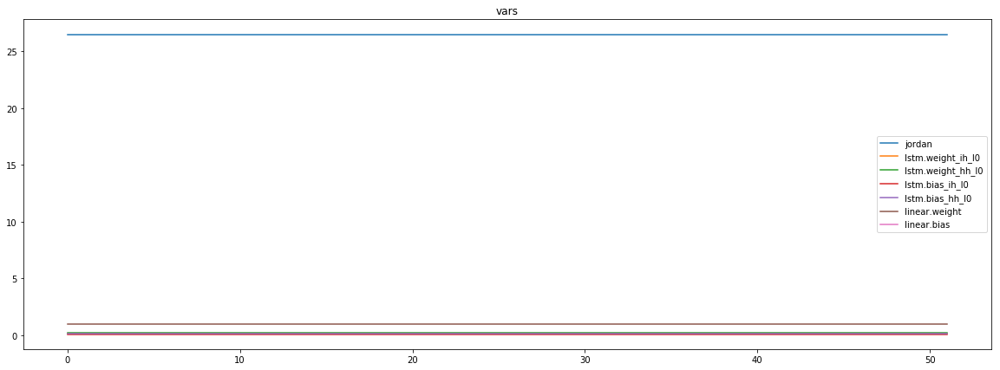

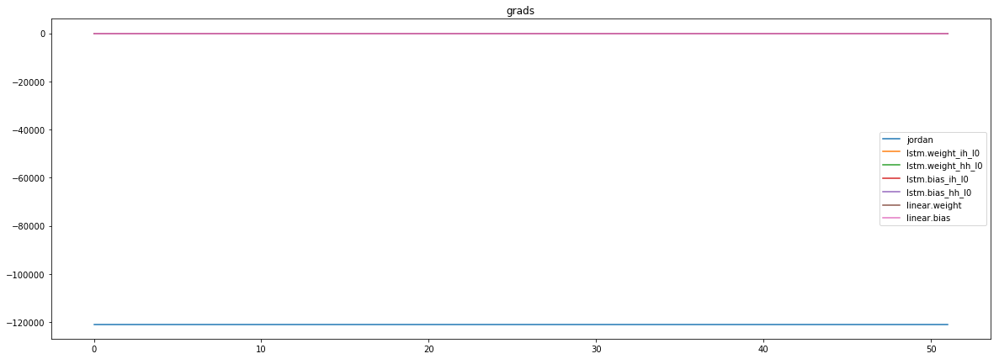

mean_p1 : 1641.615478515625
mean_p2 : -121188.296875
mean_p3 : -1302.245361328125


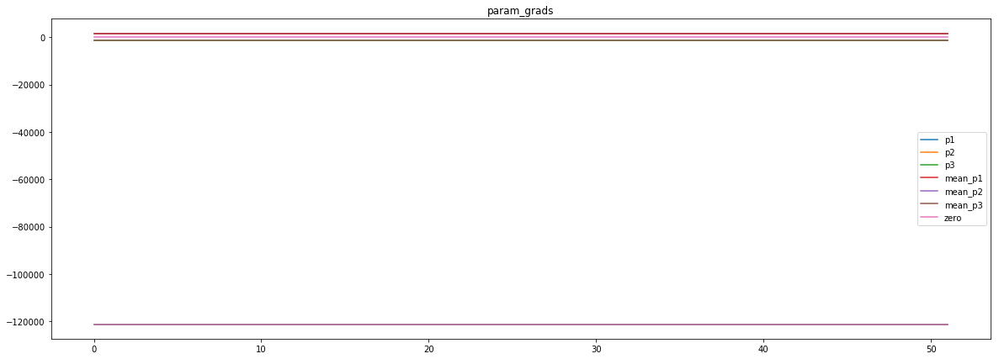

loss rate [0.025629113990680574]
Epoch [42] 
     train_loss[760.4673296488248] 
     eval_train[0.5860586349780743] 
     eval_test[0.5599438954483379]



aux preds: 0.44825032353401184           1.004705786705017           9.717672348022461
main loss 0.0
aux loss 28.857694405775803
jord loss 715.6905552790715
combined loss 744.5482496848473 



Parameter containing:
tensor([[0.4483, 1.0047, 9.7177]], requires_grad=True)


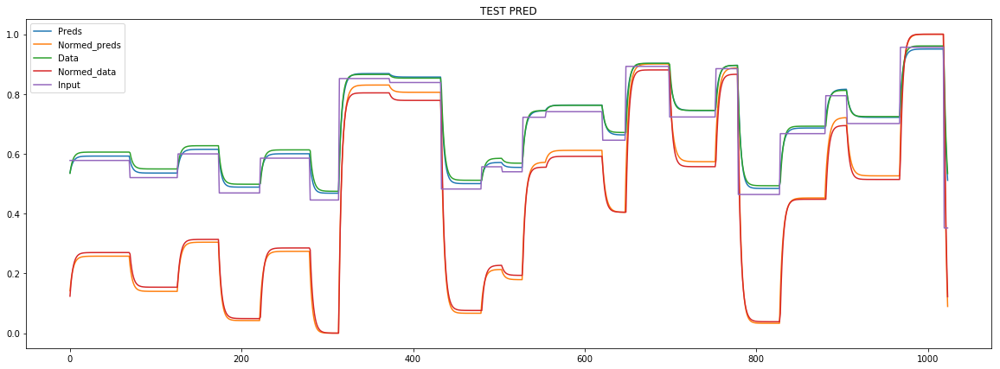

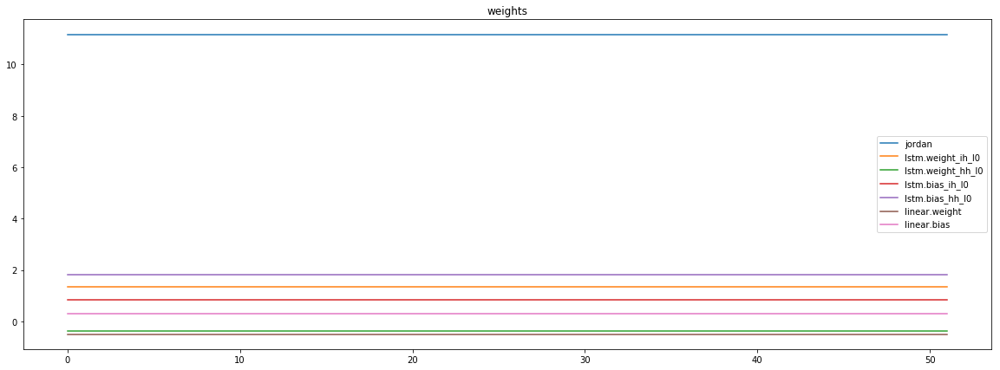

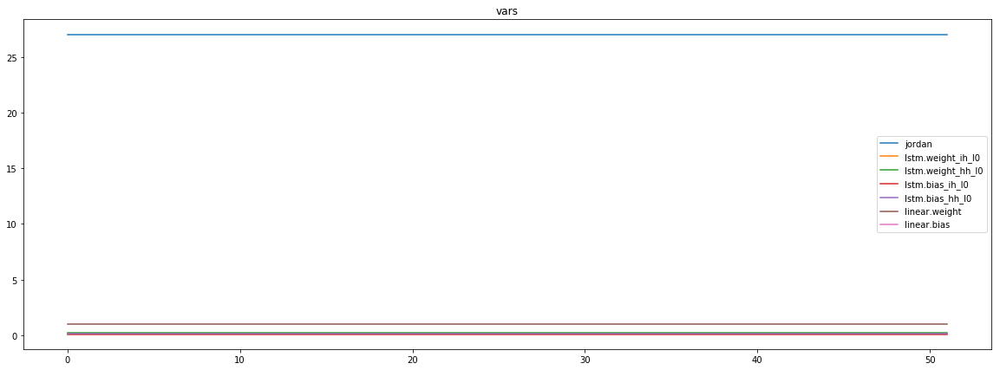

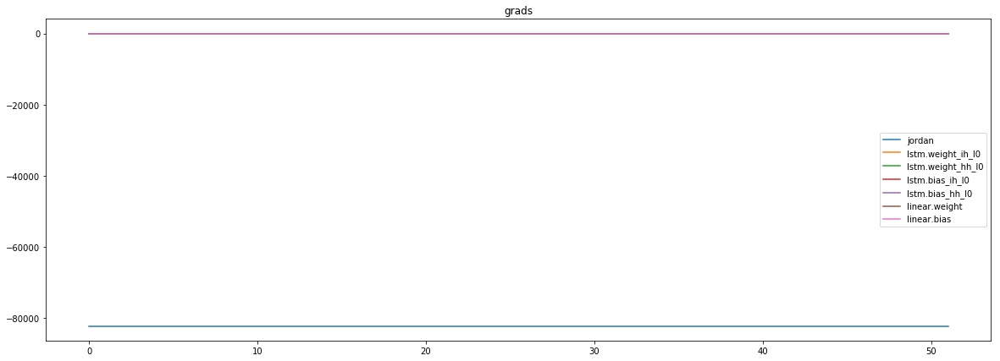

mean_p1 : -147.65951538085938
mean_p2 : -80981.0078125
mean_p3 : -1013.9498291015625


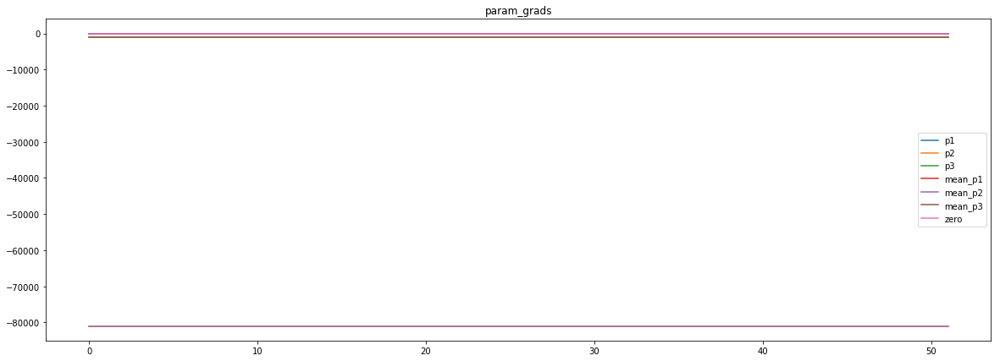

loss rate [-0.06134506056578681]
Epoch [43] 
     train_loss[744.5482496848473] 
     eval_train[0.6055921499545758] 
     eval_test[0.5957024110989138]



aux preds: 0.448501855134964           1.0019571781158447           9.761128425598145
main loss 0.0
aux loss 33.924295315375694
jord loss 731.1329198983999
combined loss 765.0572152137756 



Parameter containing:
tensor([[0.4485, 1.0020, 9.7611]], requires_grad=True)


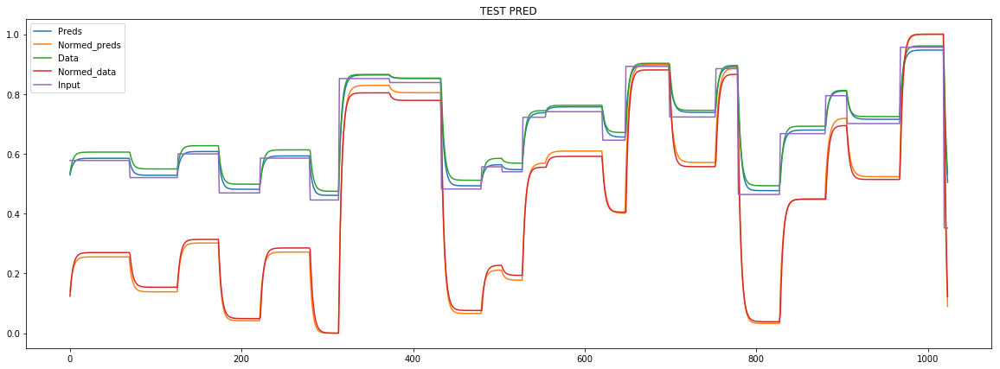

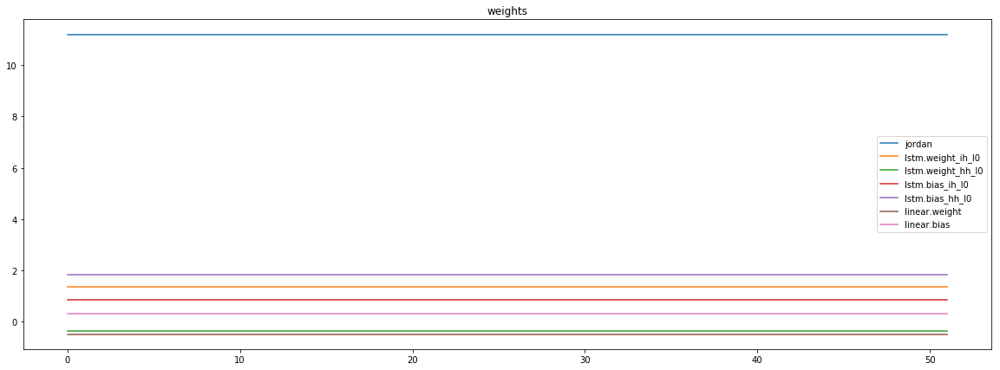

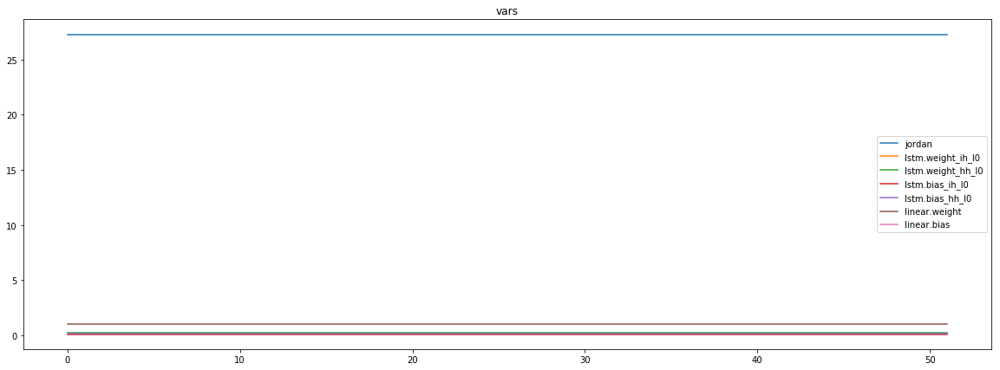

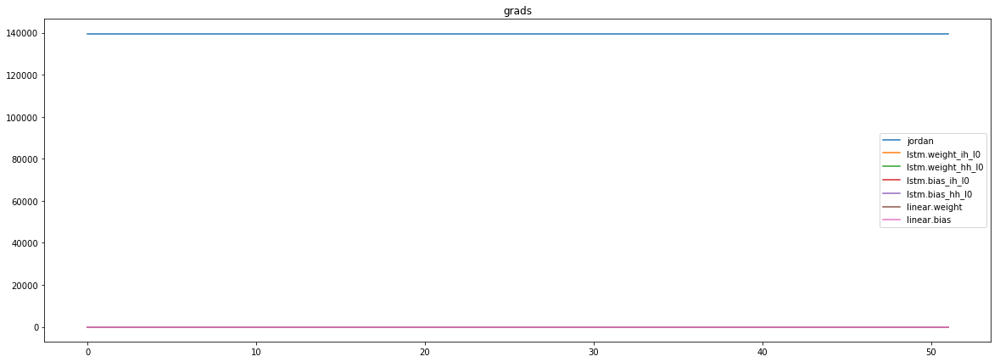

mean_p1 : -4312.94140625
mean_p2 : 142462.46875
mean_p3 : 1421.8411865234375


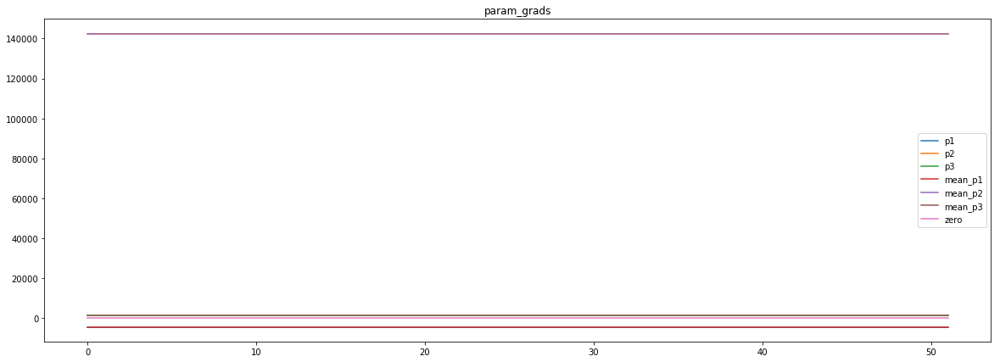

loss rate [-0.542624135274494]
Epoch [44] 
     train_loss[765.0572152137756] 
     eval_train[0.8567853478284982] 
     eval_test[0.8659271164373918]



aux preds: 0.4491422772407532           1.0040884017944336           9.807404518127441
main loss 0.0
aux loss 32.25219117678129
jord loss 724.1555469219501
combined loss 756.4077380987313 



Parameter containing:
tensor([[0.4491, 1.0041, 9.8074]], requires_grad=True)


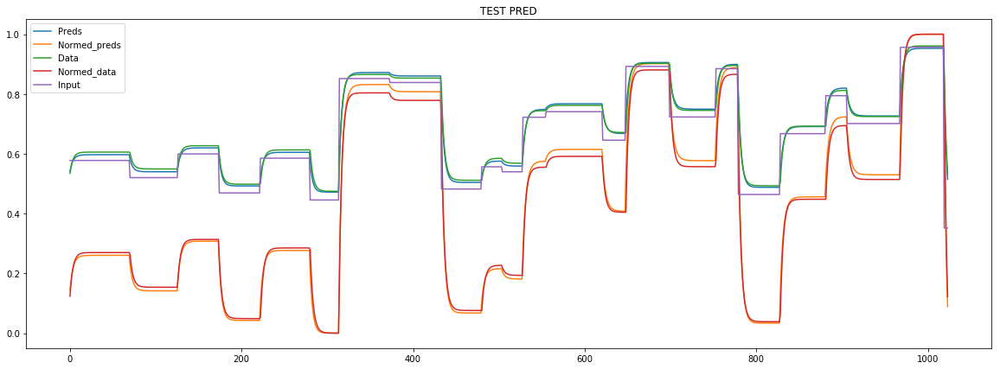

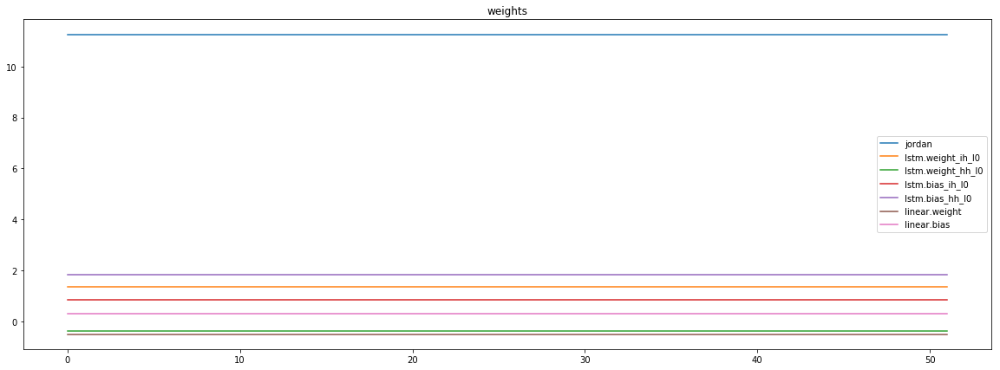

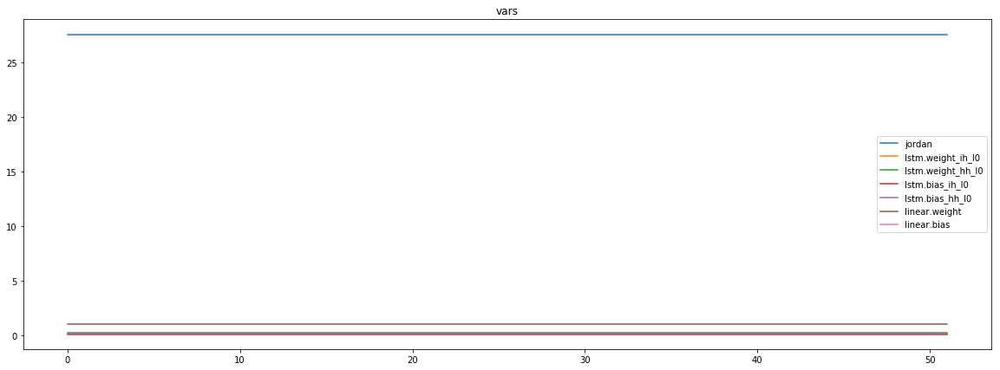

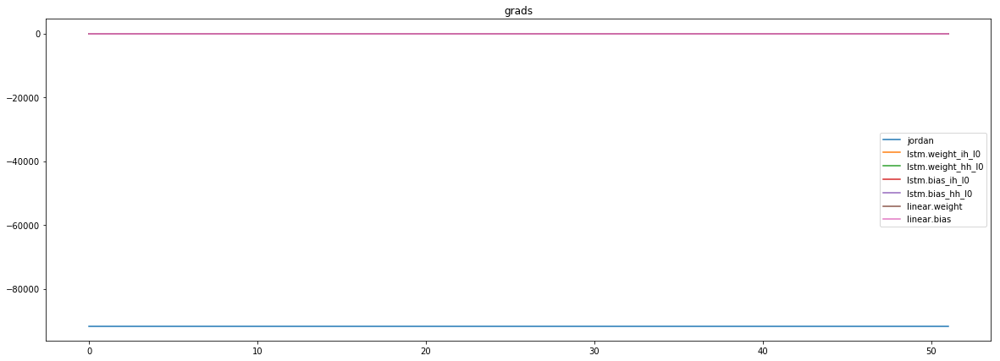

mean_p1 : -3098.87109375
mean_p2 : -87491.0859375
mean_p3 : -1063.7664794921875


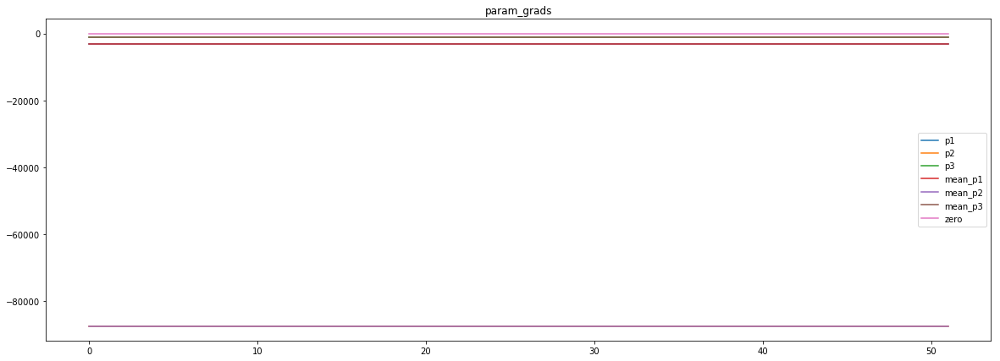

loss rate [0.1998396336395457]
Epoch [45] 
     train_loss[756.4077380987313] 
     eval_train[0.5560340250913913] 
     eval_test[0.5391943102533167]



aux preds: 0.45045891404151917           1.0004475116729736           9.841294288635254
main loss 0.0
aux loss 31.196112449352558
jord loss 729.5115509033203
combined loss 760.7076633526729 



Parameter containing:
tensor([[0.4505, 1.0004, 9.8413]], requires_grad=True)


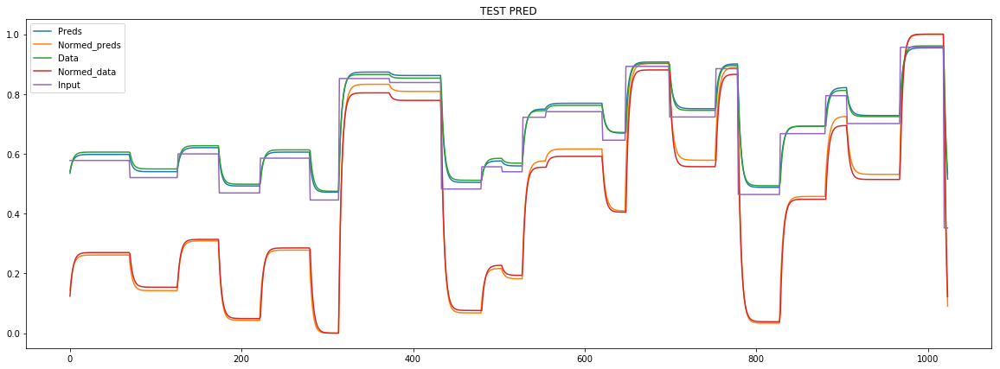

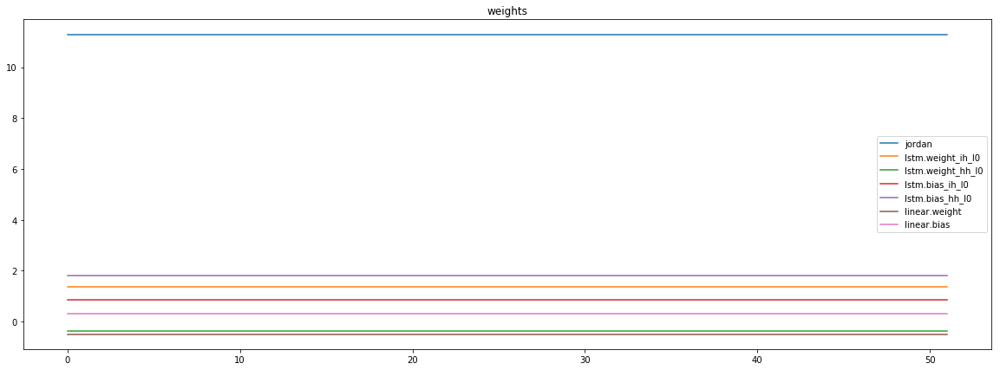

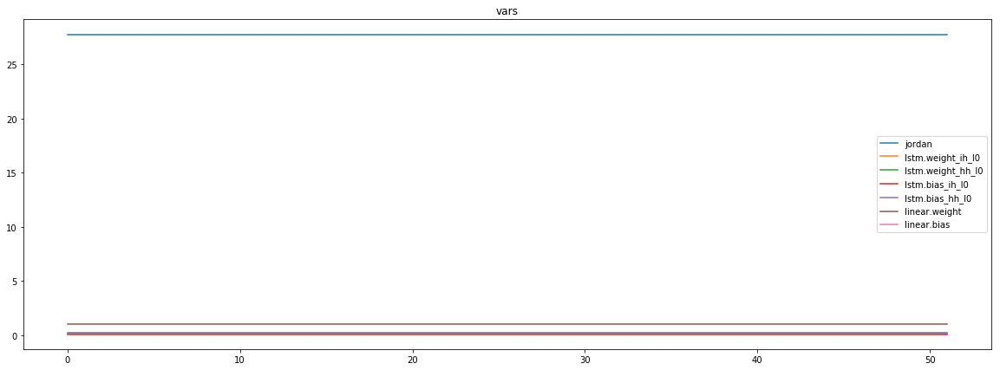

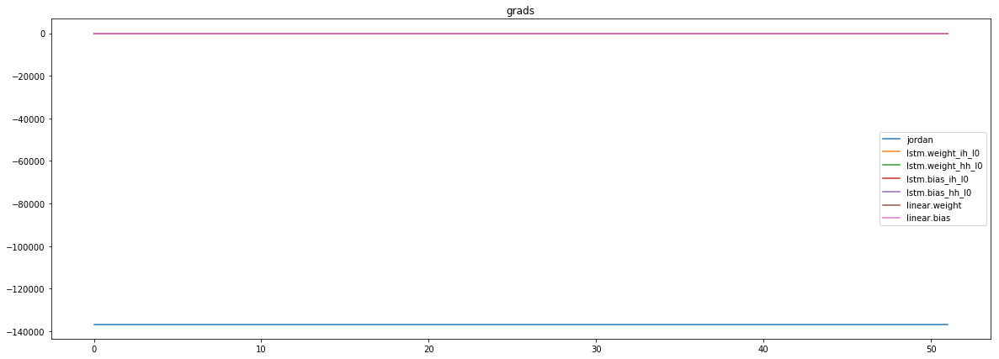

mean_p1 : 1975.3974609375
mean_p2 : -137219.28125
mean_p3 : -1386.884765625


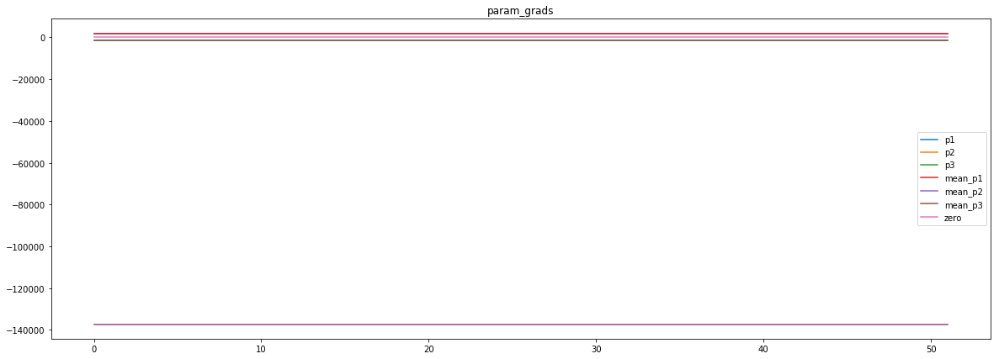

loss rate [0.1734283137753848]
Epoch [46] 
     train_loss[760.7076633526729] 
     eval_train[0.5642965029065425] 
     eval_test[0.5512747778133913]



aux preds: 0.4494032859802246           1.0007938146591187           9.858366966247559
main loss 0.0
aux loss 37.35426605664767
jord loss 742.0911483764648
combined loss 779.4454144331125 



Parameter containing:
tensor([[0.4494, 1.0008, 9.8584]], requires_grad=True)


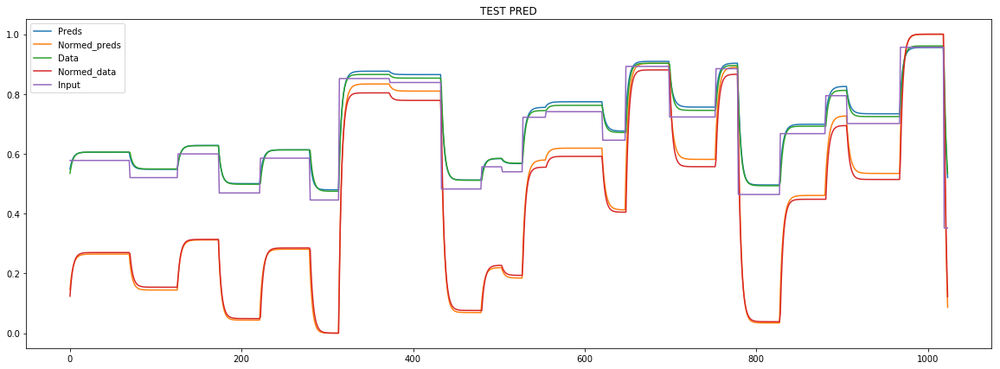

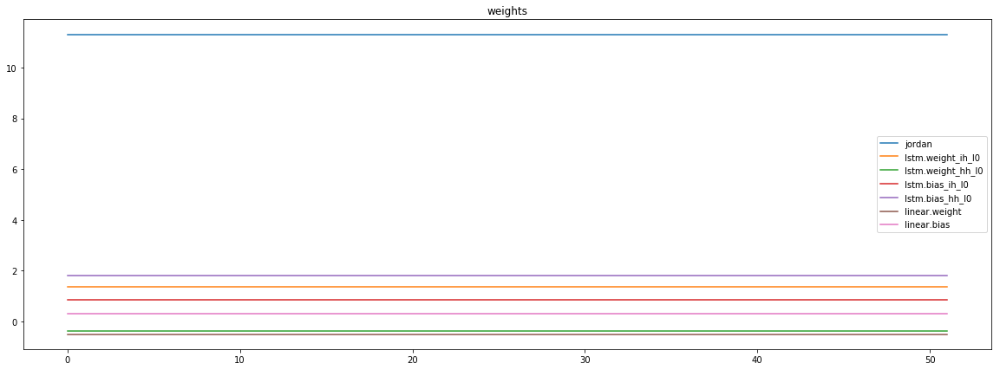

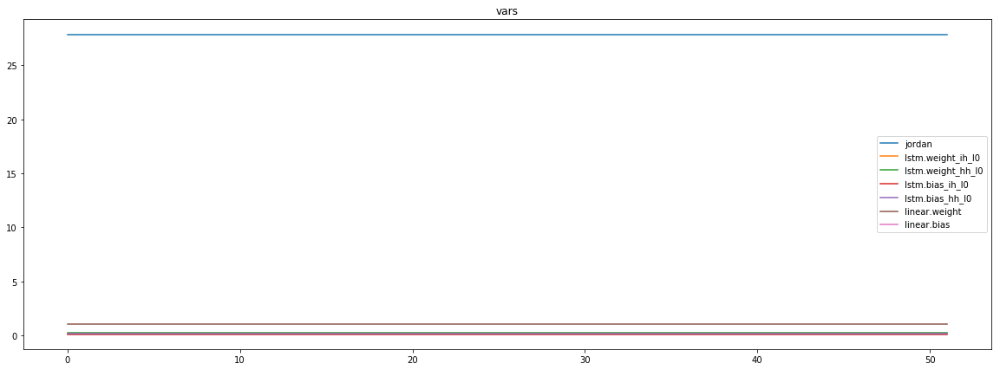

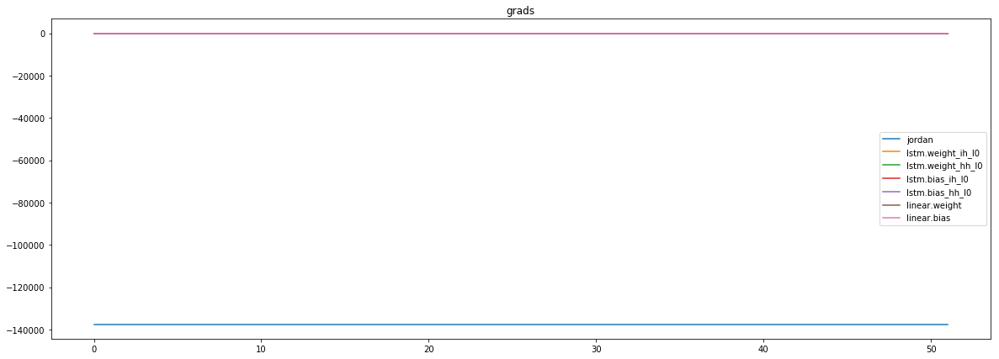

mean_p1 : 1783.665771484375
mean_p2 : -137869.75
mean_p3 : -1395.098876953125


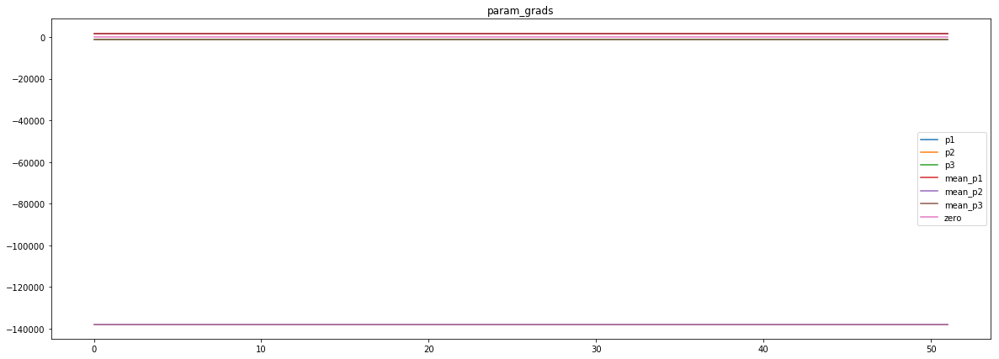

loss rate [0.04040833085818574]
Epoch [47] 
     train_loss[779.4454144331125] 
     eval_train[0.6684330959732716] 
     eval_test[0.6257804997942664]



aux preds: 0.44757604598999023           1.0002317428588867           9.875253677368164
main loss 0.0
aux loss 32.059599766364464
jord loss 708.3700602604792
combined loss 740.4296600268437 



Parameter containing:
tensor([[0.4476, 1.0002, 9.8753]], requires_grad=True)


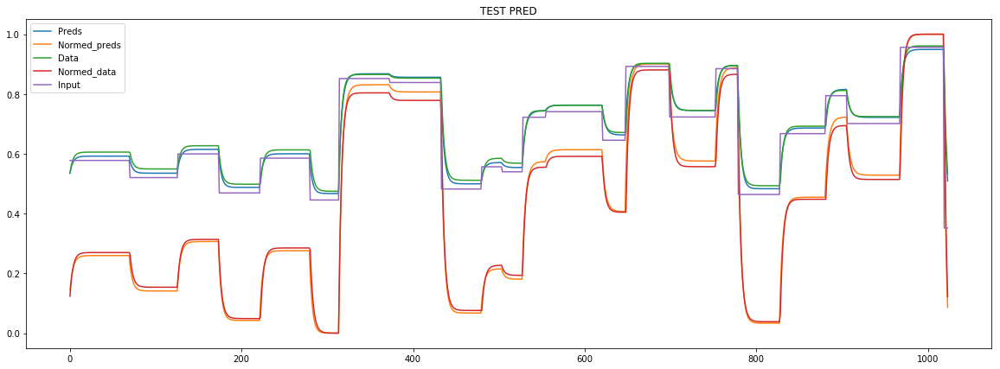

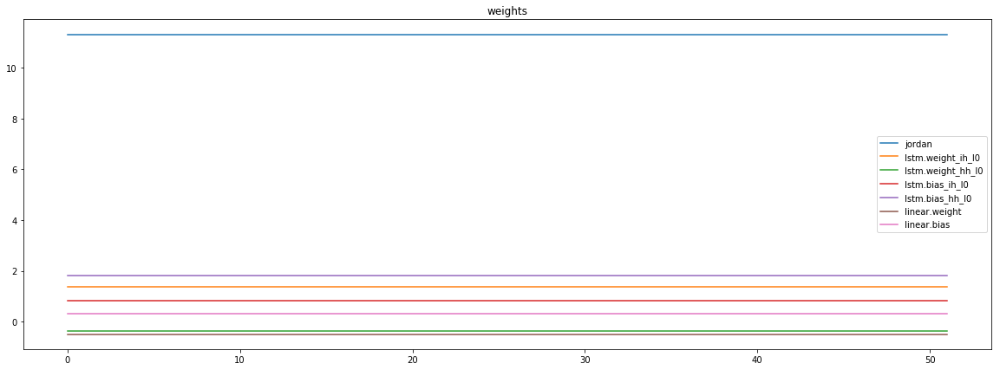

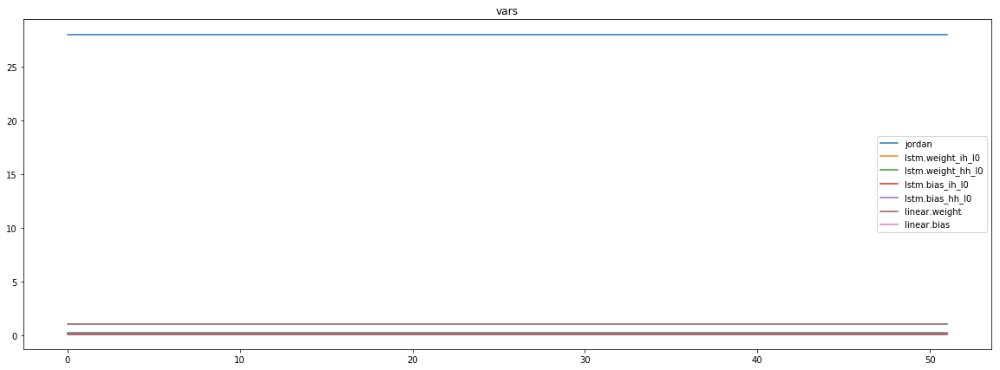

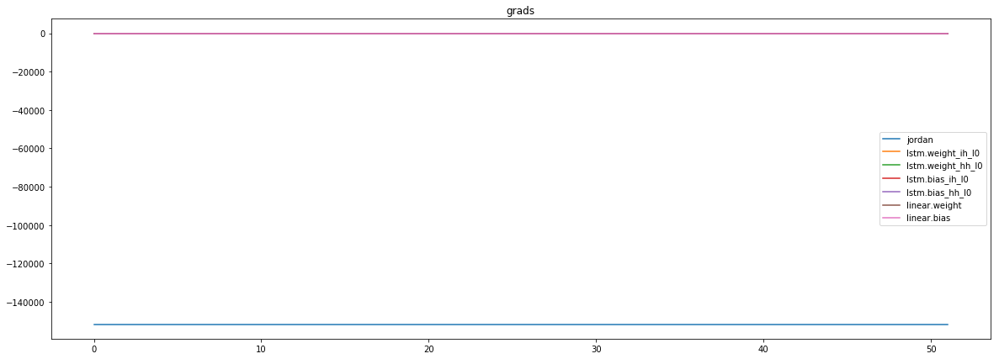

mean_p1 : -5651.7568359375
mean_p2 : -144622.359375
mean_p3 : -1441.41650390625


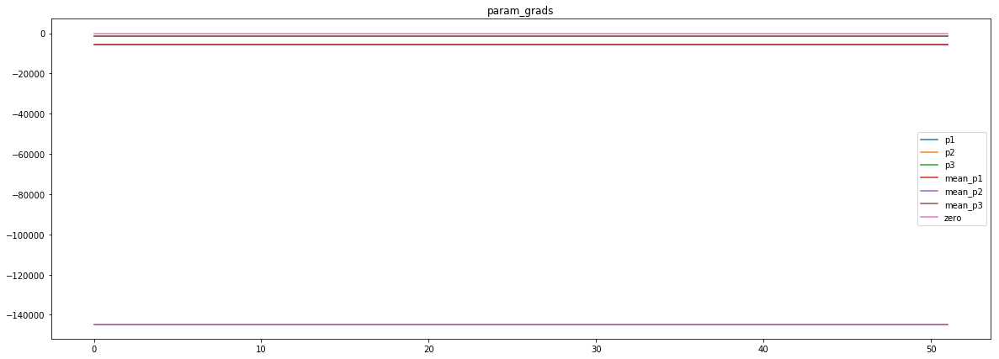

loss rate [-0.06382178244977132]
Epoch [48] 
     train_loss[740.4296600268437] 
     eval_train[0.6121136110562545] 
     eval_test[0.6085945652289824]



aux preds: 0.4496591091156006           1.0005077123641968           9.893528938293457
main loss 0.0
aux loss 27.640361345731296
jord loss 717.2474183302659
combined loss 744.8877796759972 



Parameter containing:
tensor([[0.4497, 1.0005, 9.8935]], requires_grad=True)


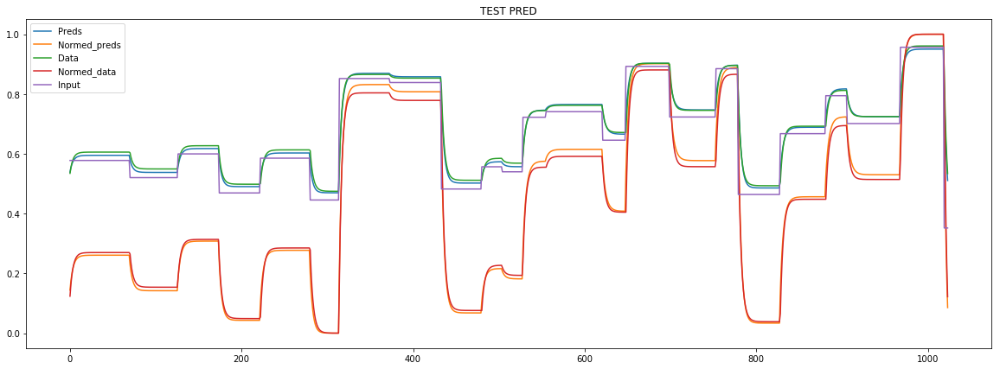

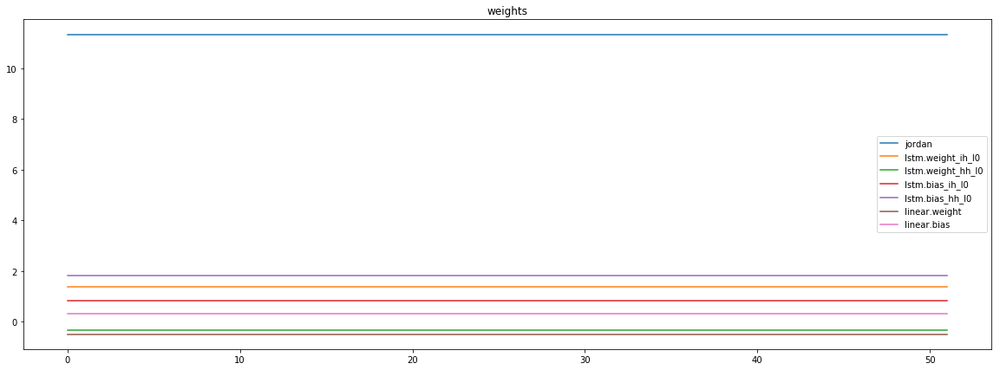

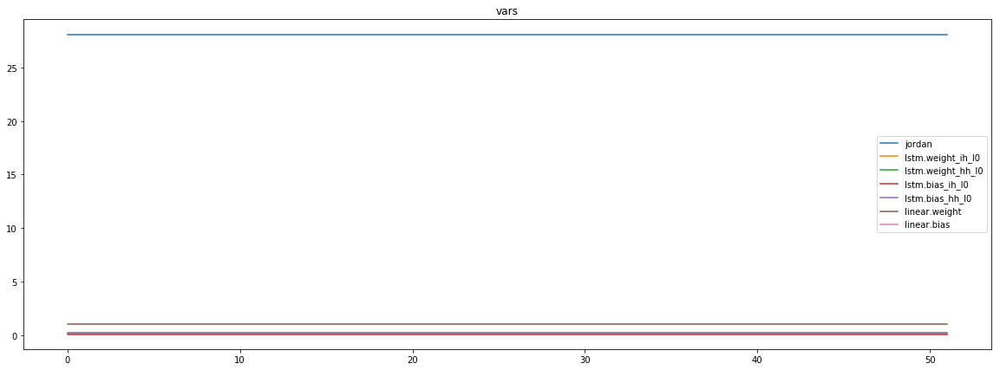

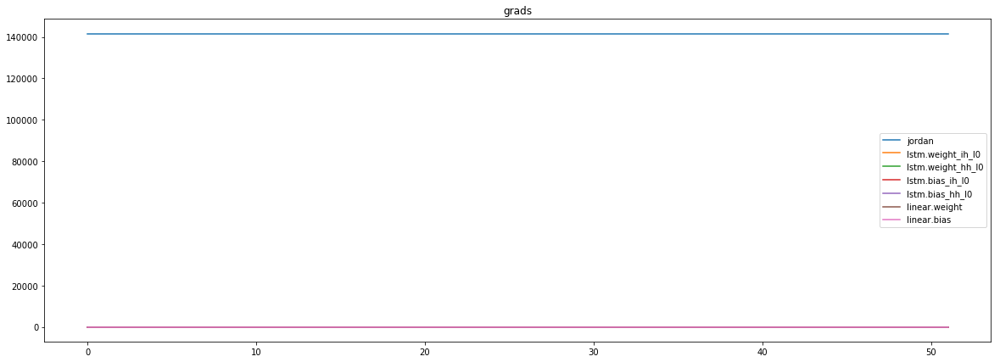

mean_p1 : -3784.5673828125
mean_p2 : 143956.546875
mean_p3 : 1442.83349609375


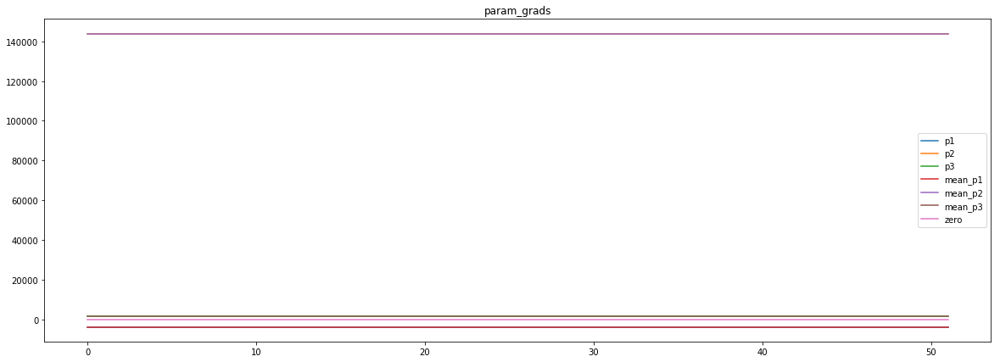

loss rate [0.06687439997001832]
Epoch [49] 
     train_loss[744.8877796759972] 
     eval_train[0.5662867191892403] 
     eval_test[0.5554118603467941]



aux preds: 0.4501752257347107           1.0024361610412598           9.913450241088867
main loss 0.0
aux loss 28.88421861941998
jord loss 758.6140306912936
combined loss 787.4982493107135 



Parameter containing:
tensor([[0.4502, 1.0024, 9.9135]], requires_grad=True)


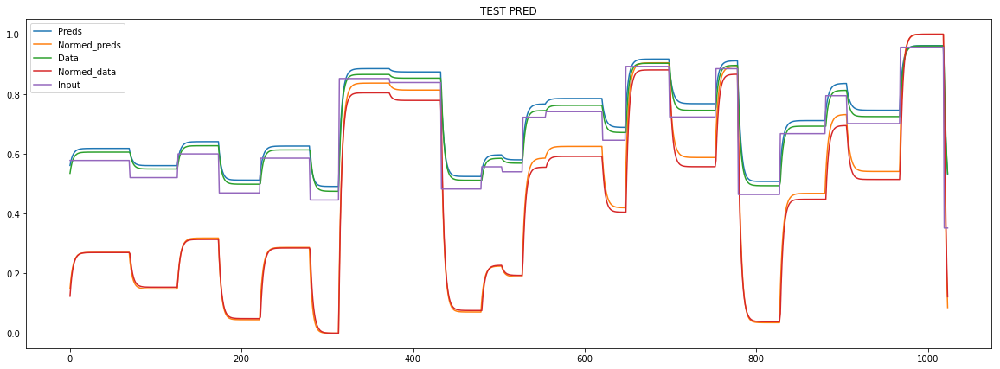

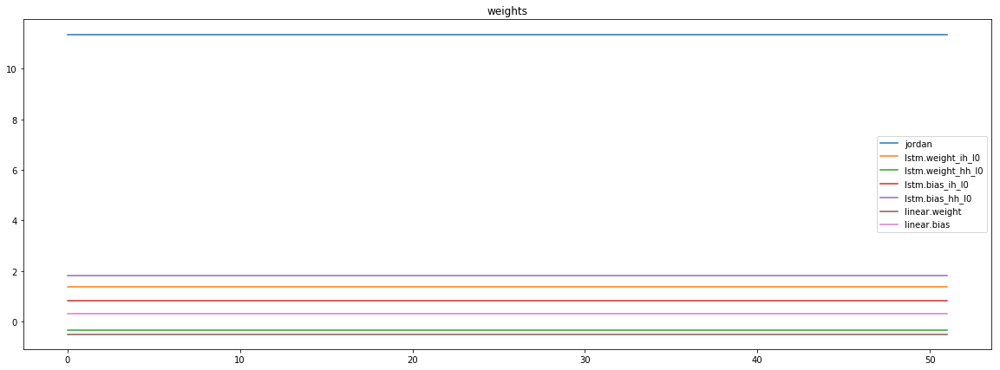

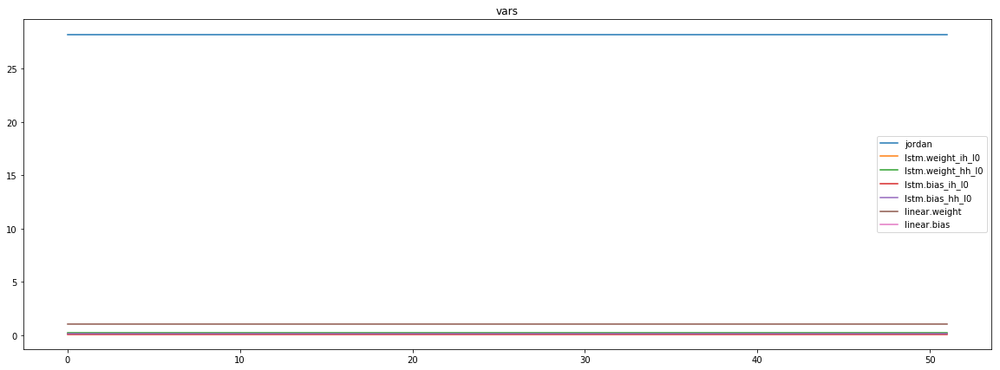

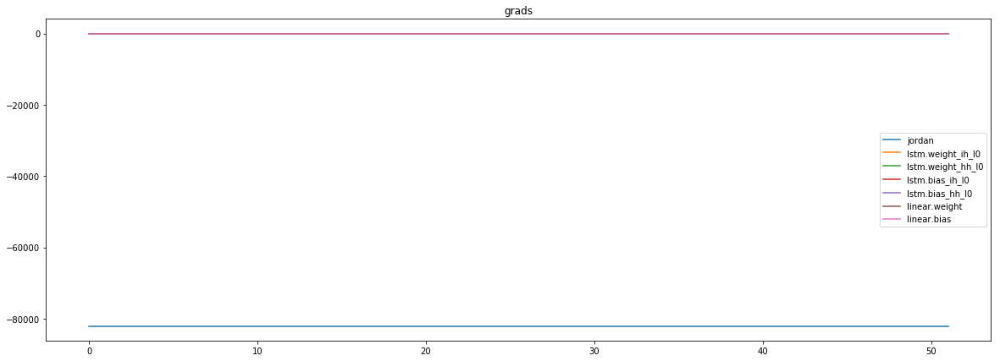

mean_p1 : 3092.068603515625
mean_p2 : -84115.3671875
mean_p3 : -1015.3046875


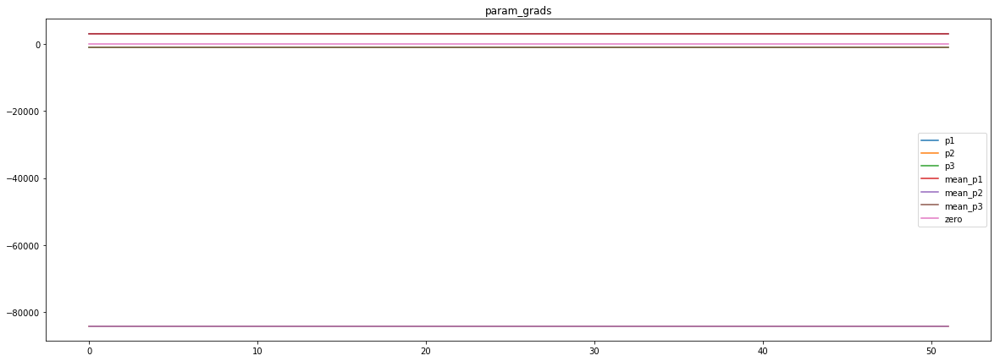

loss rate [-1.1565221373932535]
Epoch [50] 
     train_loss[787.4982493107135] 
     eval_train[1.334548993752553] 
     eval_test[1.2865717085925015]



aux preds: 0.4494691789150238           1.0021555423736572           9.917173385620117
main loss 0.0
aux loss 37.90731140283438
jord loss 842.830434359037
combined loss 880.7377457618713 



Parameter containing:
tensor([[0.4495, 1.0022, 9.9172]], requires_grad=True)


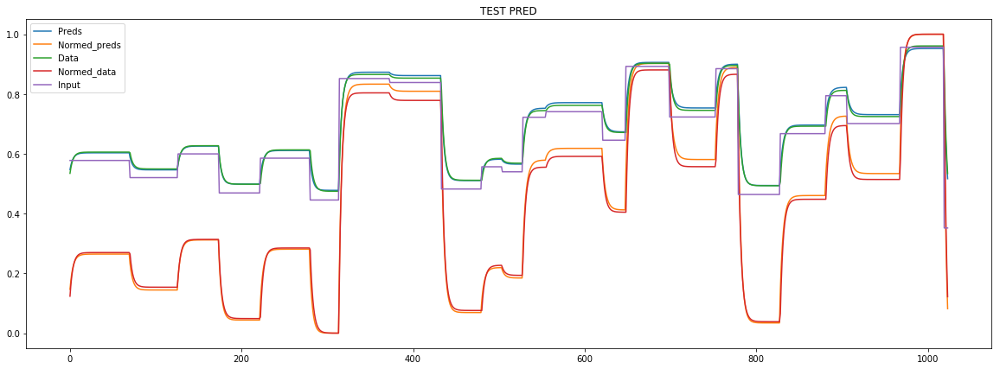

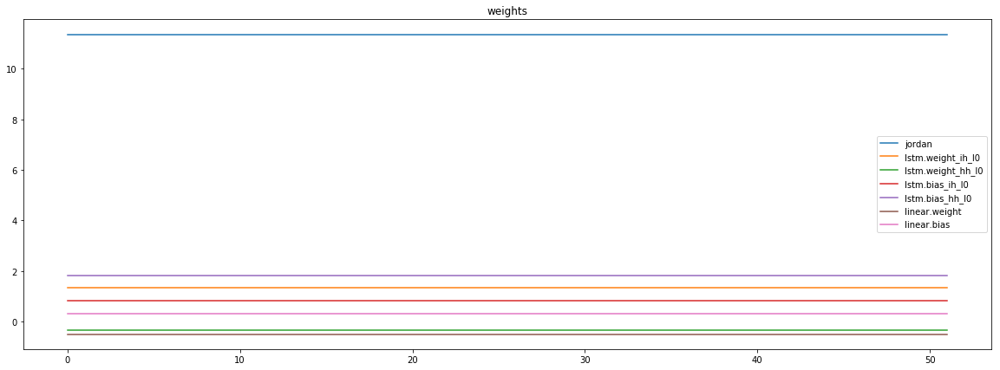

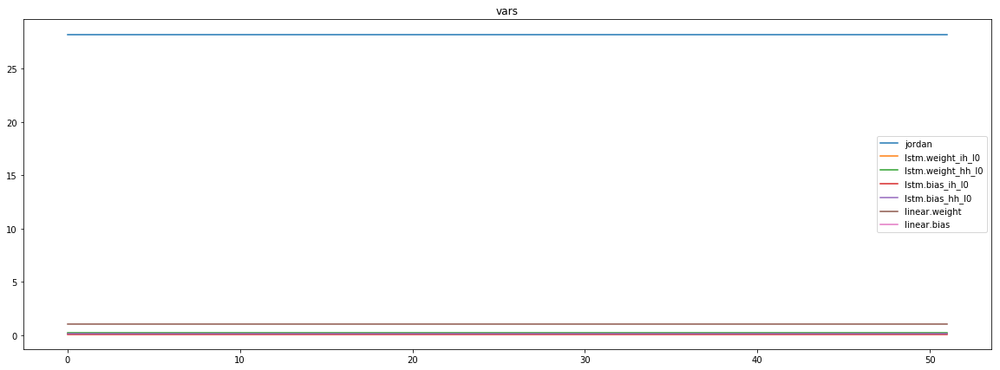

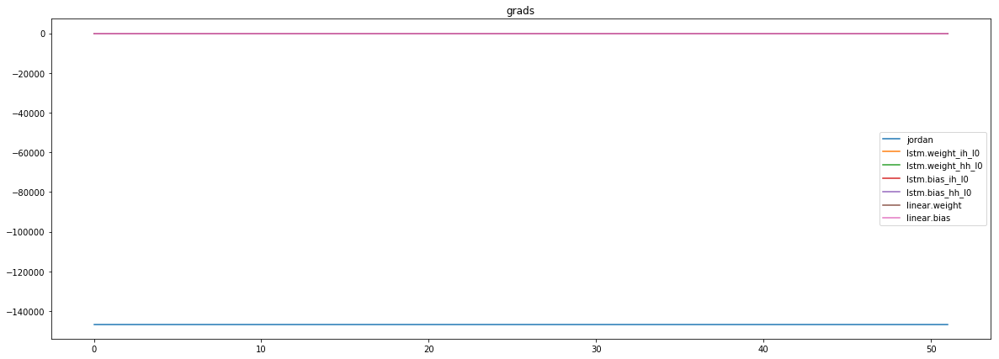

mean_p1 : -2246.67431640625
mean_p2 : -142898.890625
mean_p3 : -1431.677734375


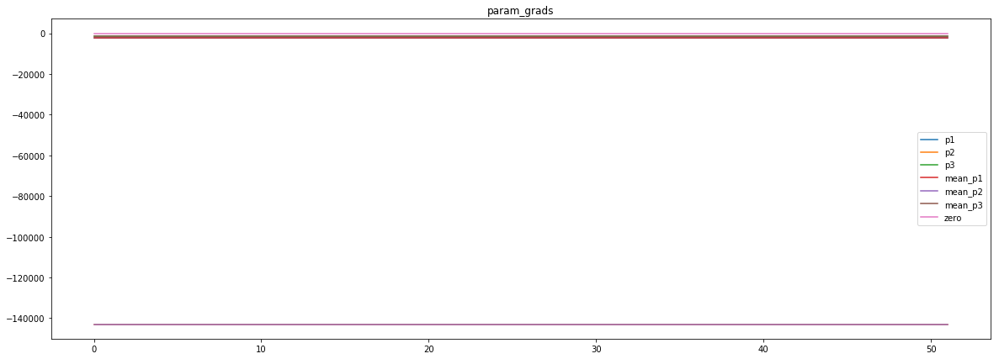

loss rate [0.32812389361141314]
Epoch [51] 
     train_loss[880.7377457618713] 
     eval_train[0.587263109592291] 
     eval_test[0.5488282983953302]



aux preds: 0.44996377825737           1.0014549493789673           9.919178009033203
main loss 0.0
aux loss 28.01275139588576
jord loss 729.7150714580829
combined loss 757.7278228539686 



Parameter containing:
tensor([[0.4500, 1.0015, 9.9192]], requires_grad=True)


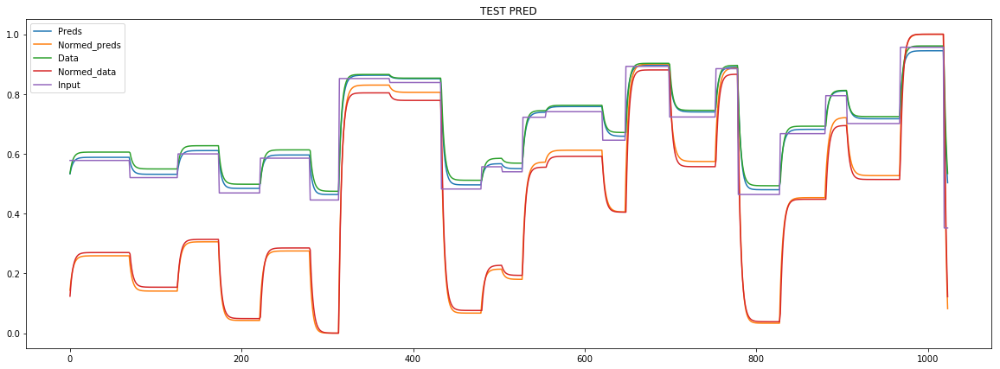

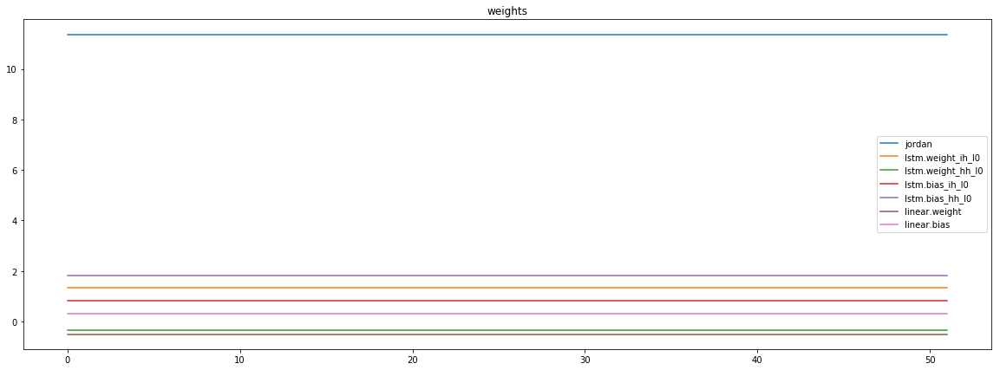

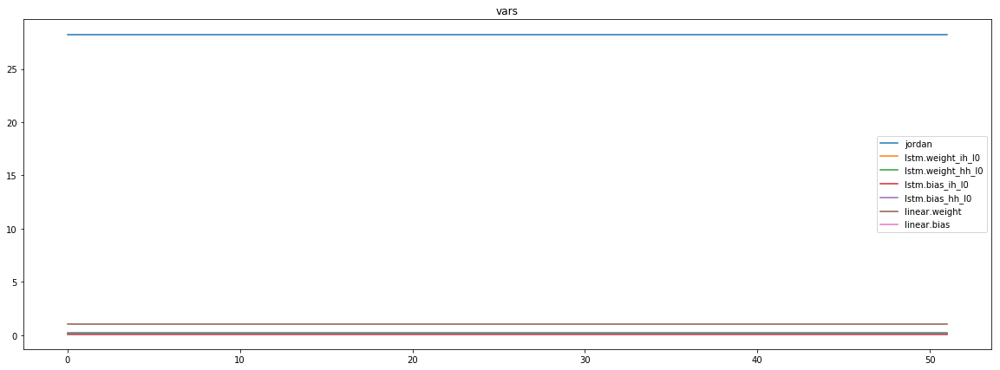

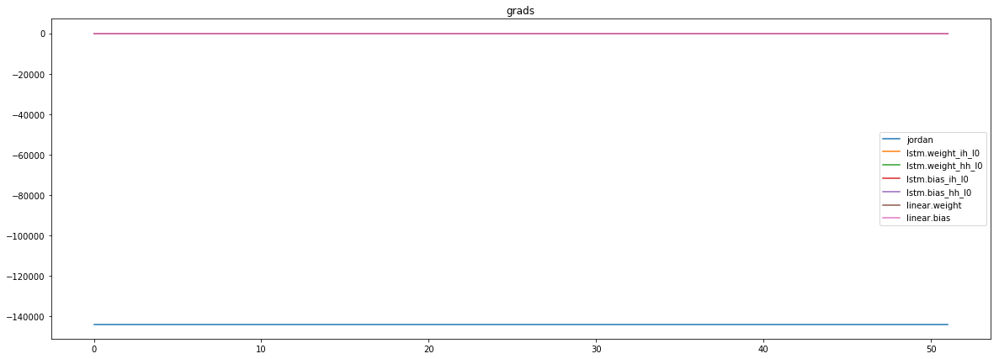

mean_p1 : -973.88427734375
mean_p2 : -141511.015625
mean_p3 : -1422.208984375


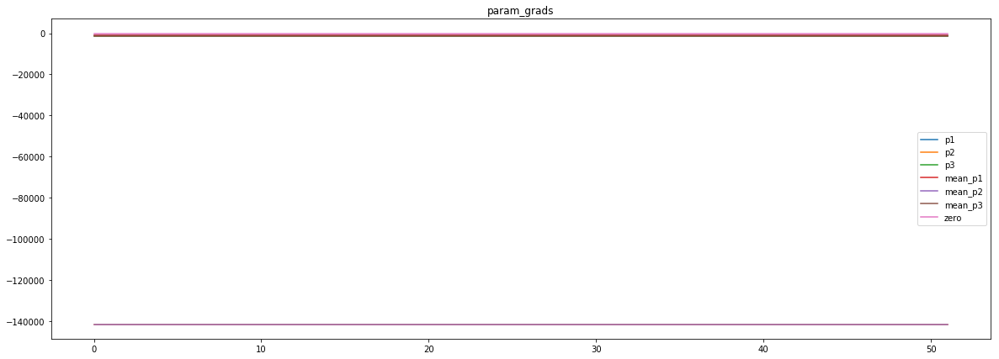

loss rate [-0.0015504382155586693]
Epoch [52] 
     train_loss[757.7278228539686] 
     eval_train[0.7872194326840914] 
     eval_test[0.7981728911399841]



aux preds: 0.4471939206123352           1.0039150714874268           9.92517375946045
main loss 0.0
aux loss 37.51594741527851
jord loss 782.783451960637
combined loss 820.2993993759155 



Parameter containing:
tensor([[0.4472, 1.0039, 9.9252]], requires_grad=True)


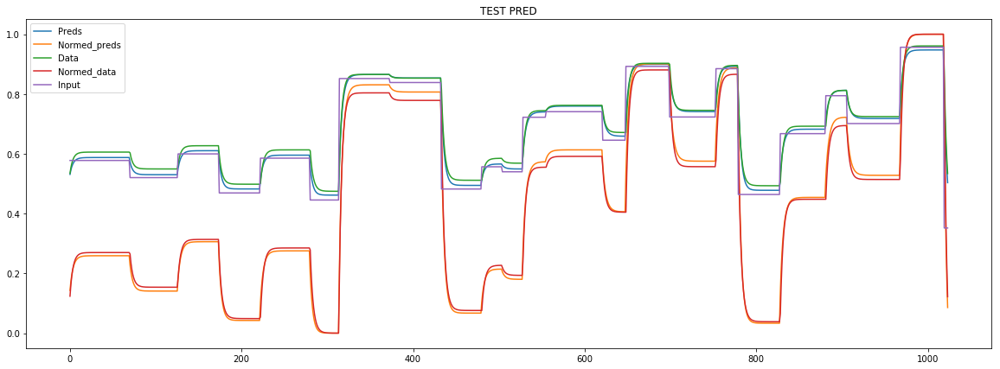

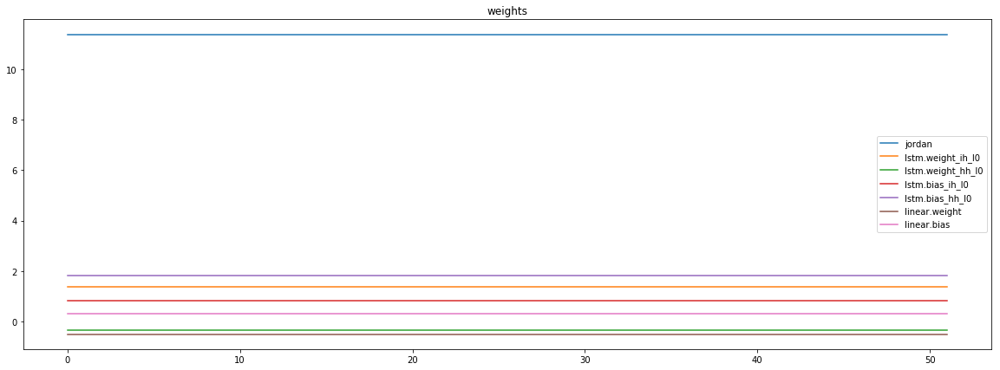

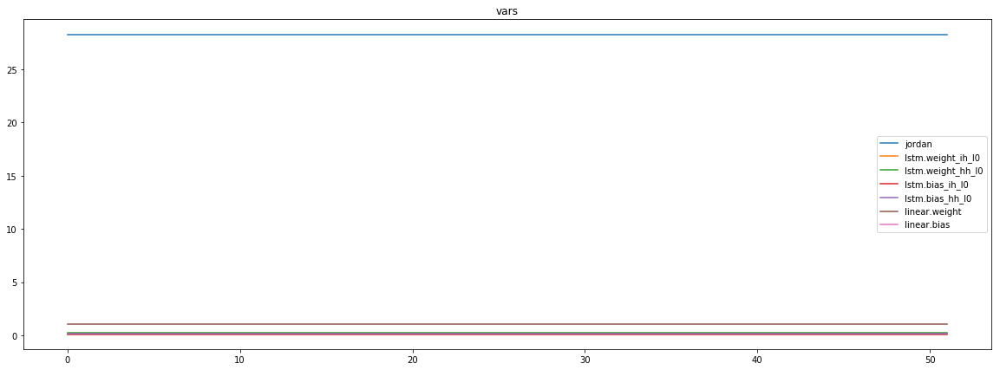

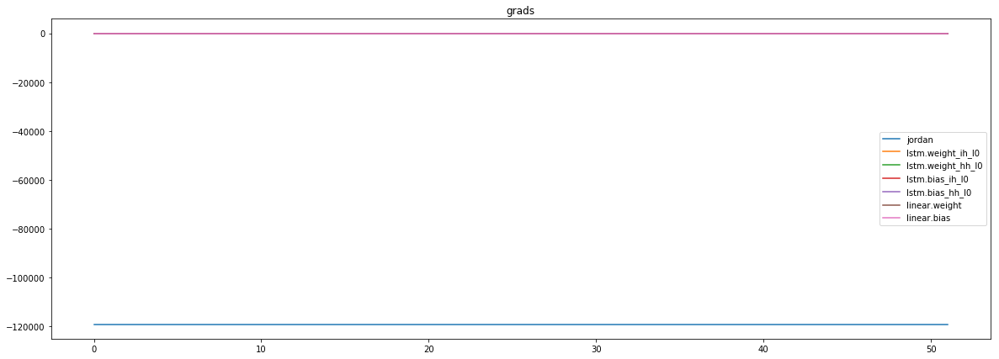

mean_p1 : 3649.35205078125
mean_p2 : -121390.9375
mean_p3 : -1278.630859375


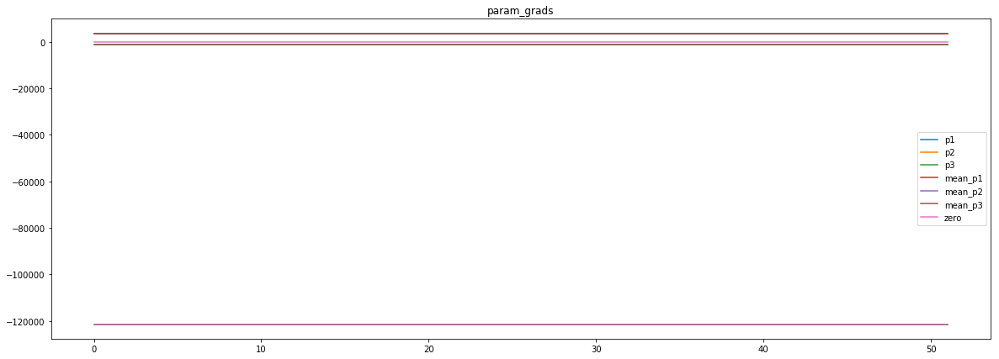

loss rate [0.13448643461164012]
Epoch [53] 
     train_loss[820.2993993759155] 
     eval_train[0.7525938623226606] 
     eval_test[0.7597976895895872]



aux preds: 0.4534650444984436           1.0027241706848145           9.936903953552246
main loss 0.0
aux loss 29.93366685280433
jord loss 746.3580697866587
combined loss 776.291736639463 



Parameter containing:
tensor([[0.4535, 1.0027, 9.9369]], requires_grad=True)


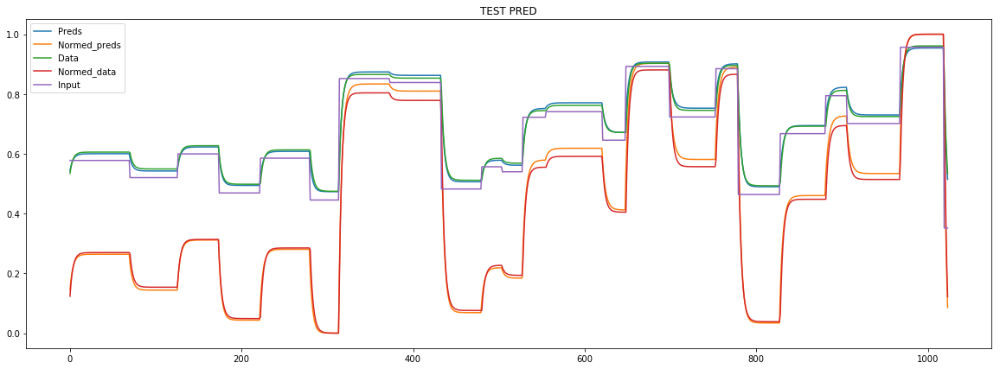

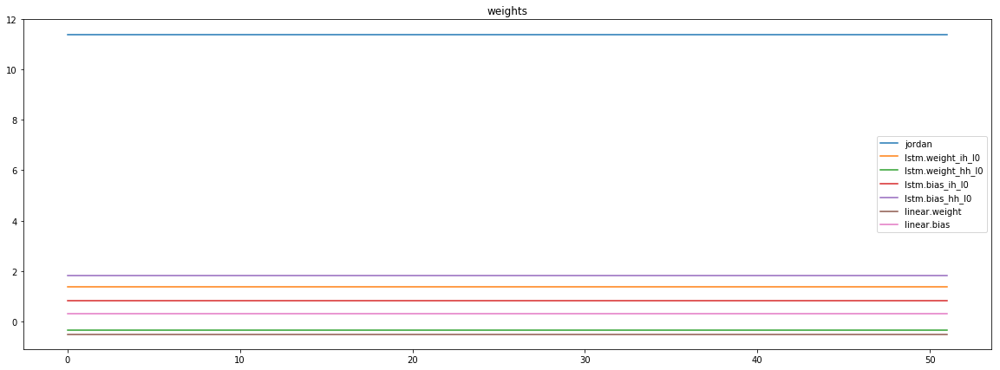

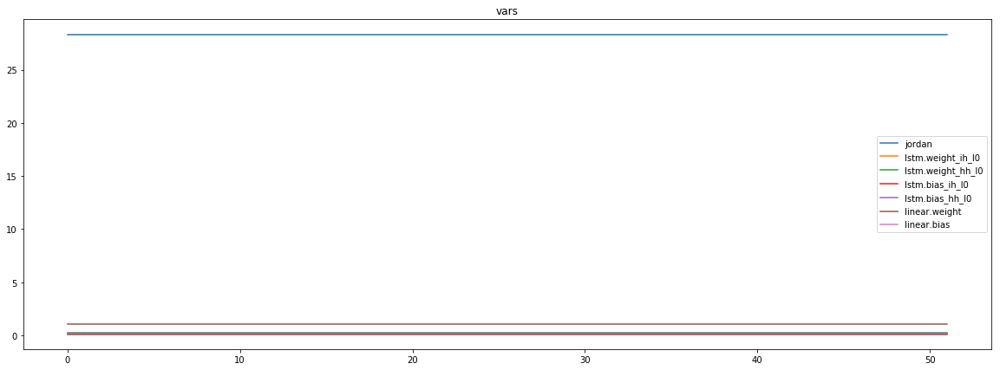

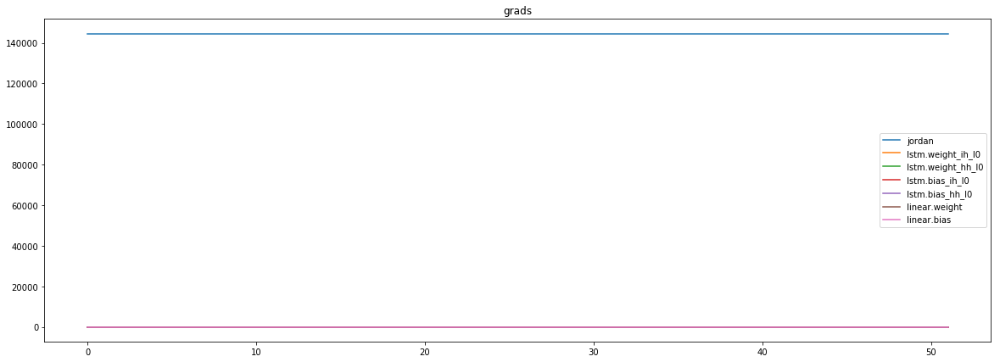

mean_p1 : -3393.636962890625
mean_p2 : 146495.4375
mean_p3 : 1471.41064453125


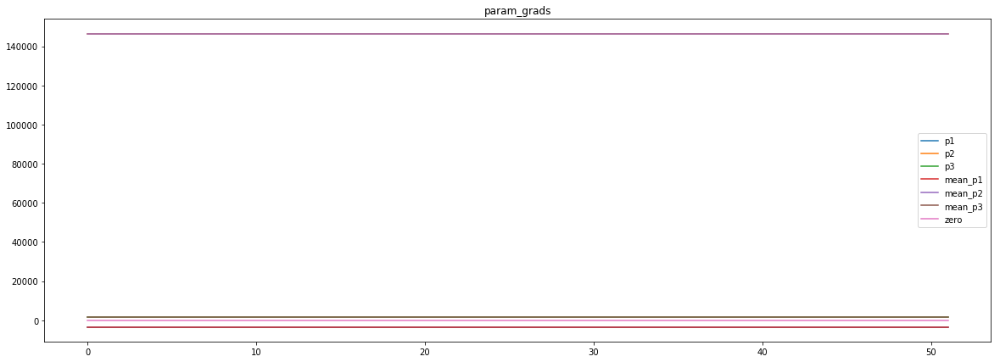

loss rate [0.2196004489290655]
Epoch [54] 
     train_loss[776.291736639463] 
     eval_train[0.5660237652751116] 
     eval_test[0.5480482998219404]



aux preds: 0.4465773403644562           1.0010266304016113           9.940093994140625
main loss 0.0
aux loss 41.58520573836107
jord loss 815.6623752300555
combined loss 857.2475809684166 



Parameter containing:
tensor([[0.4466, 1.0010, 9.9401]], requires_grad=True)


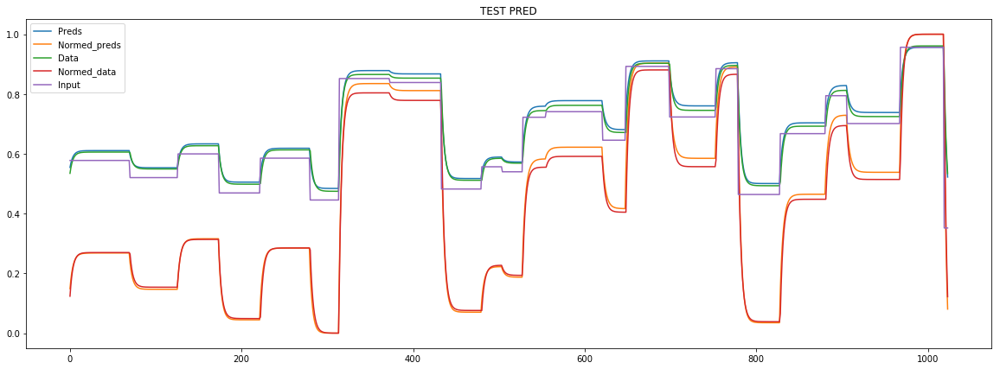

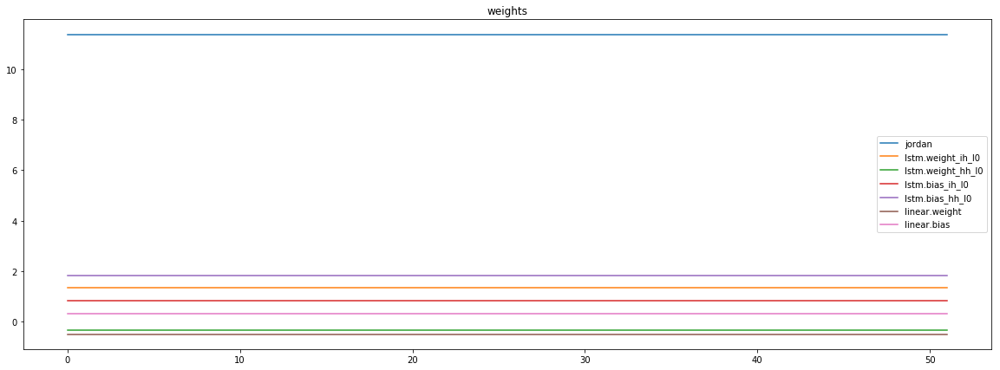

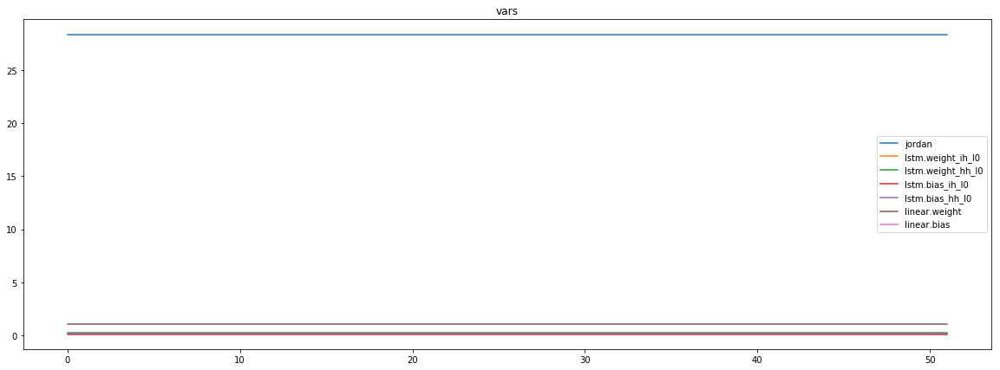

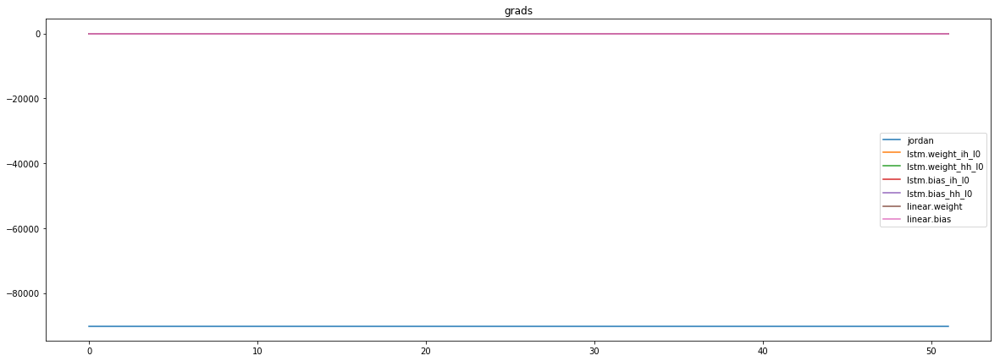

mean_p1 : 3413.125732421875
mean_p2 : -92494.09375
mean_p3 : -1073.09765625


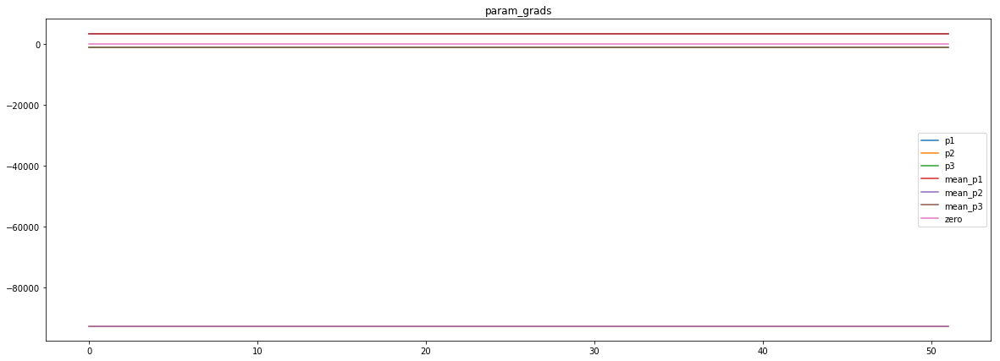

loss rate [-0.22386289308625074]
Epoch [55] 
     train_loss[857.2475809684166] 
     eval_train[0.9078081009479669] 
     eval_test[0.8591594533486799]



aux preds: 0.44994717836380005           0.9981746673583984           9.937766075134277
main loss 0.0
aux loss 29.295175919165978
jord loss 728.9052798931415
combined loss 758.2004558123075 



Parameter containing:
tensor([[0.4499, 0.9982, 9.9378]], requires_grad=True)


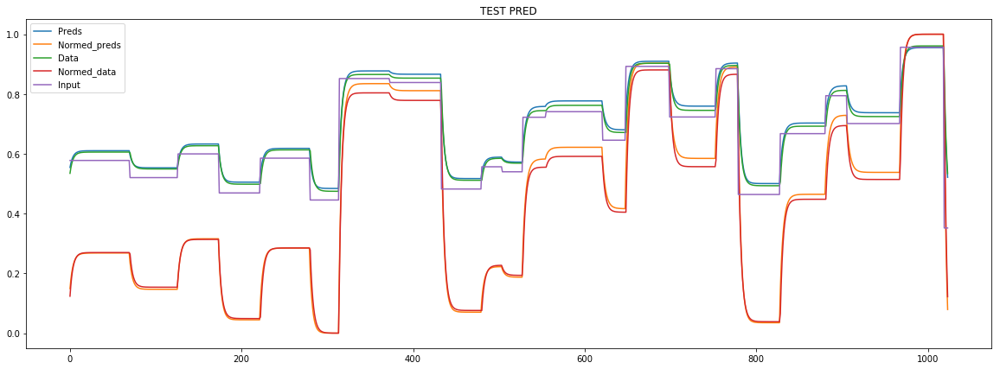

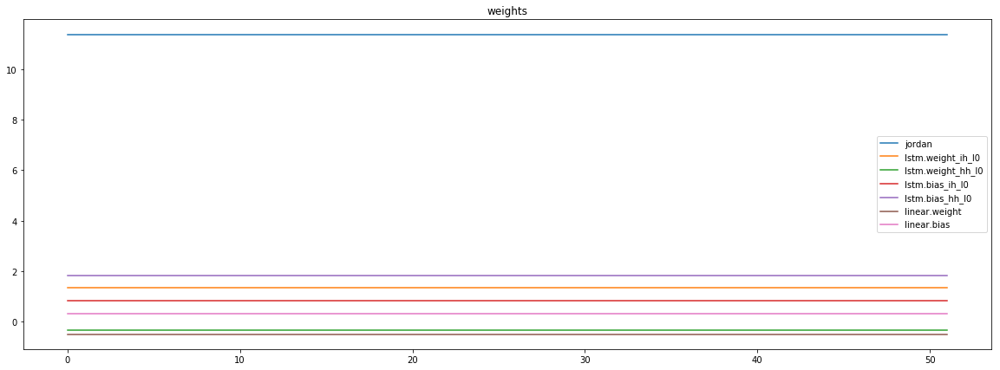

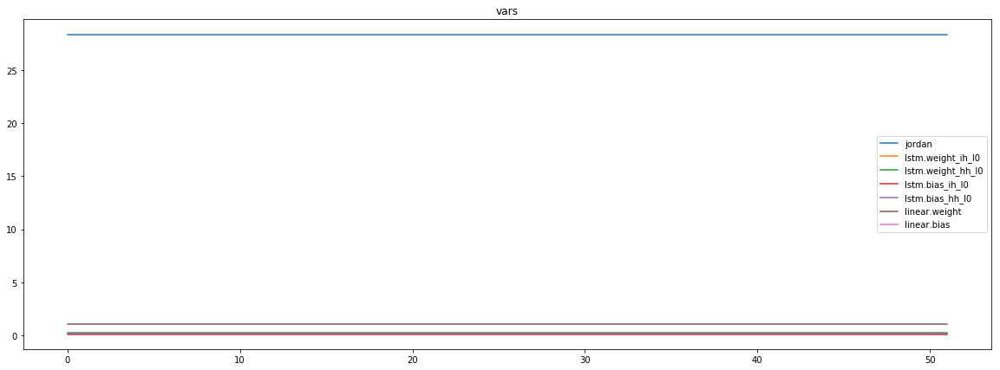

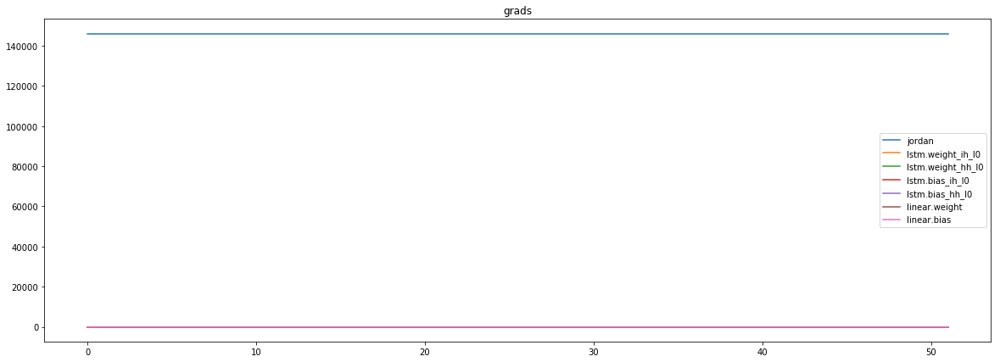

mean_p1 : -2356.556884765625
mean_p2 : 146995.0
mean_p3 : 1478.719970703125


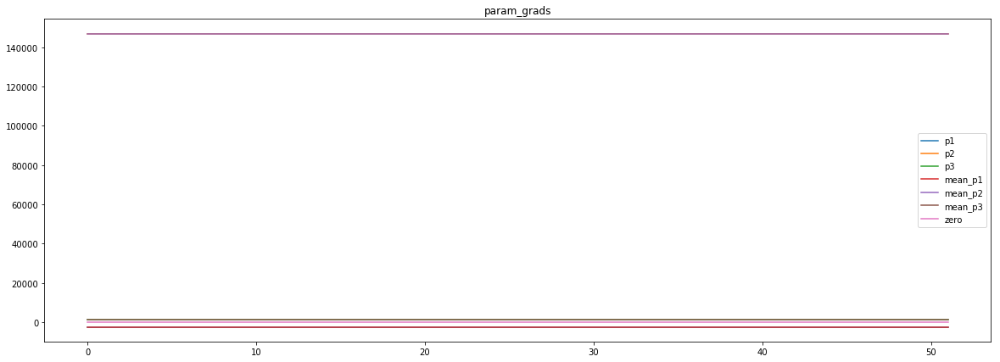

loss rate [-0.1489670168992112]
Epoch [56] 
     train_loss[758.2004558123075] 
     eval_train[0.8801199037295121] 
     eval_test[0.8299392597241835]



aux preds: 0.45191216468811035           1.001437783241272           9.94146728515625
main loss 0.0
aux loss 35.04395184150109
jord loss 865.1881068303035
combined loss 900.2320586718046 



Parameter containing:
tensor([[0.4519, 1.0014, 9.9415]], requires_grad=True)


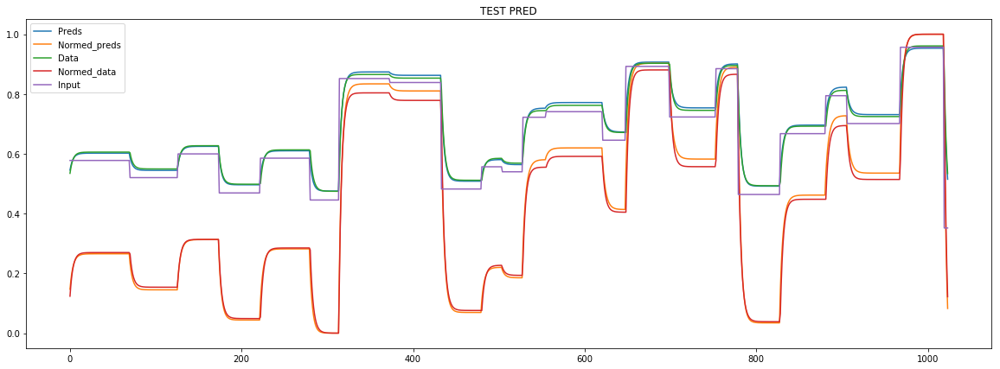

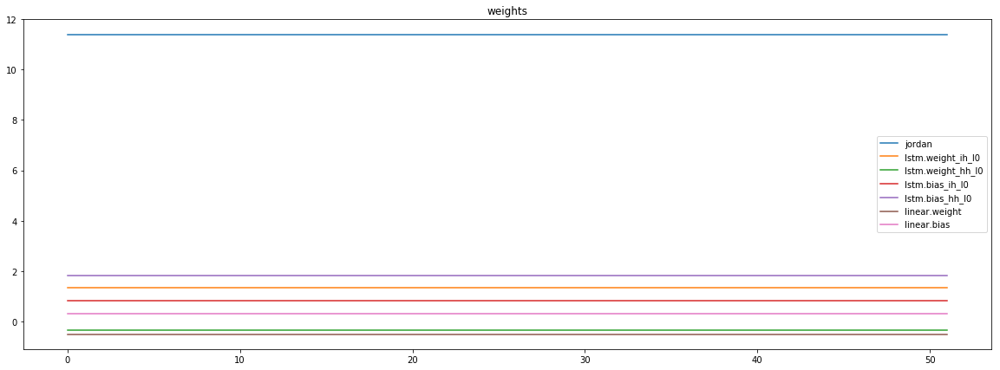

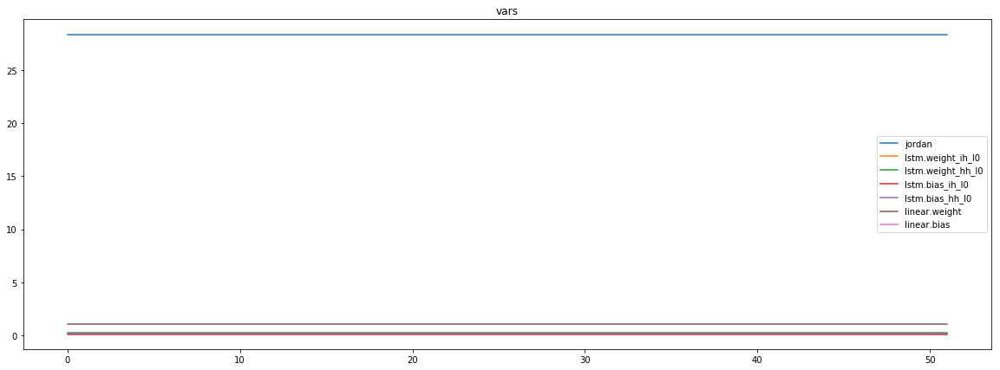

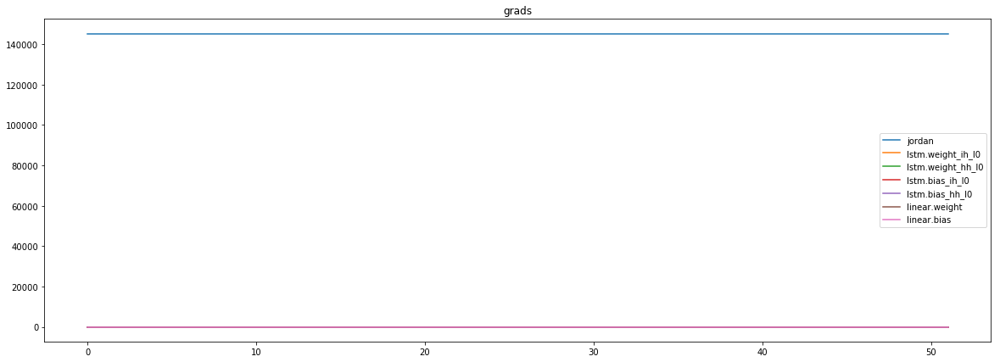

mean_p1 : -2958.721923828125
mean_p2 : 146757.984375
mean_p3 : 1474.791259765625


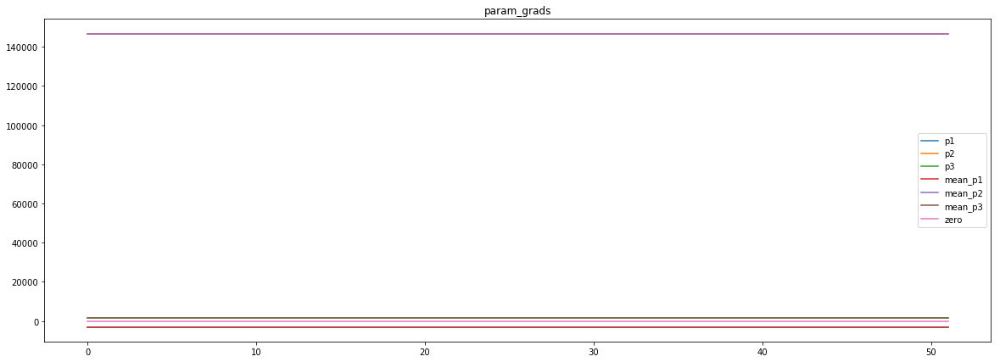

loss rate [0.2611234316608555]
Epoch [57] 
     train_loss[900.2320586718046] 
     eval_train[0.578459820495202] 
     eval_test[0.5509918359192935]



aux preds: 0.44883012771606445           1.0004521608352661           9.942574501037598
main loss 0.0
aux loss 36.83379892202524
jord loss 728.6704858633188
combined loss 765.5042847853441 



Parameter containing:
tensor([[0.4488, 1.0005, 9.9426]], requires_grad=True)


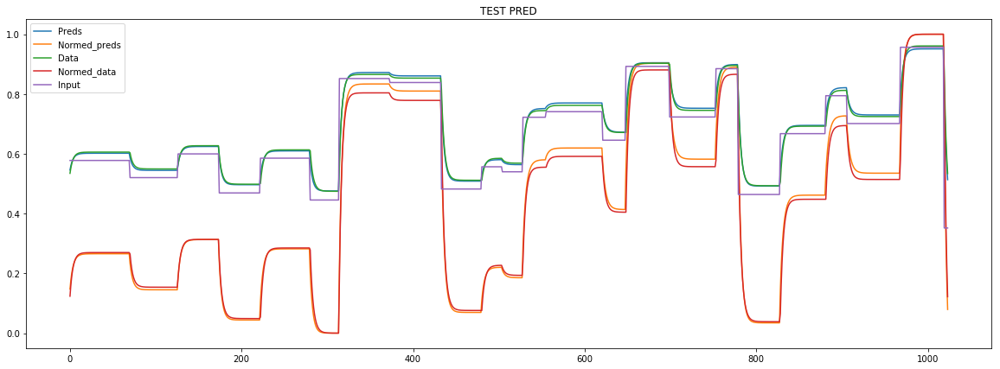

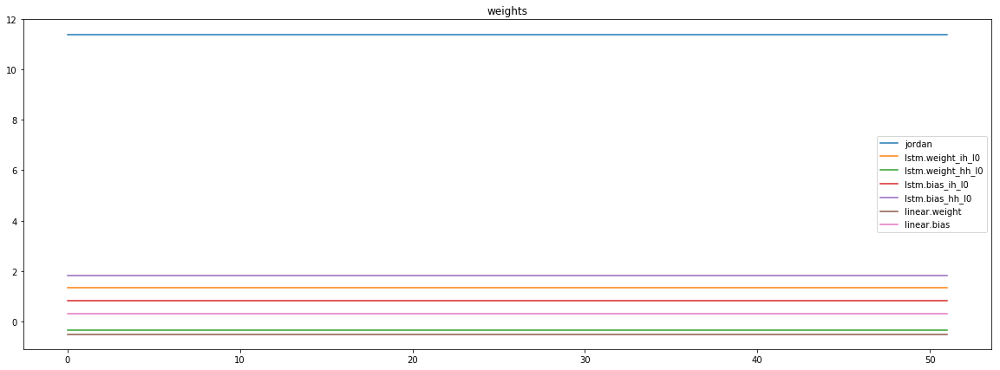

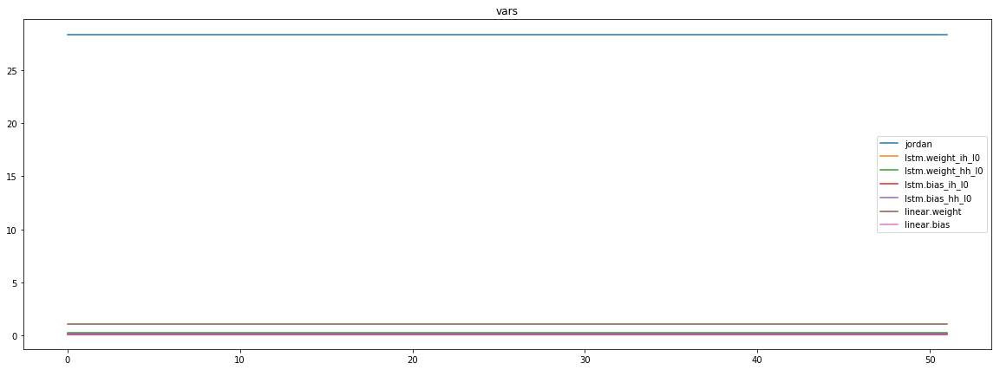

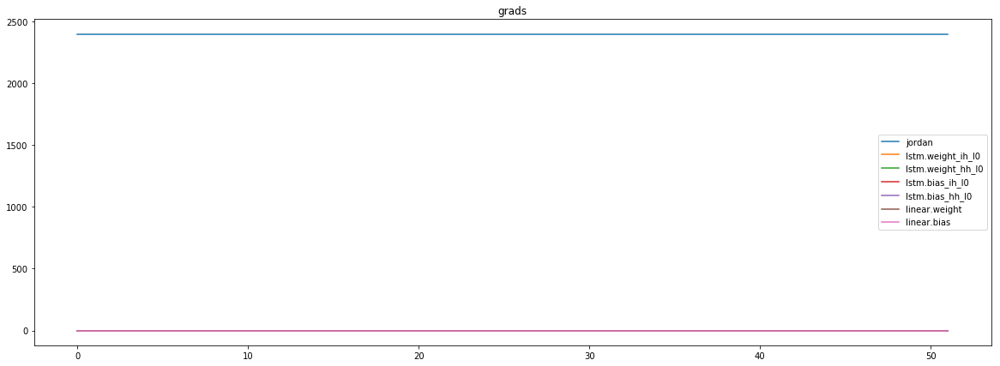

mean_p1 : 2789.0634765625
mean_p2 : -188.9121551513672
mean_p3 : -198.32156372070312


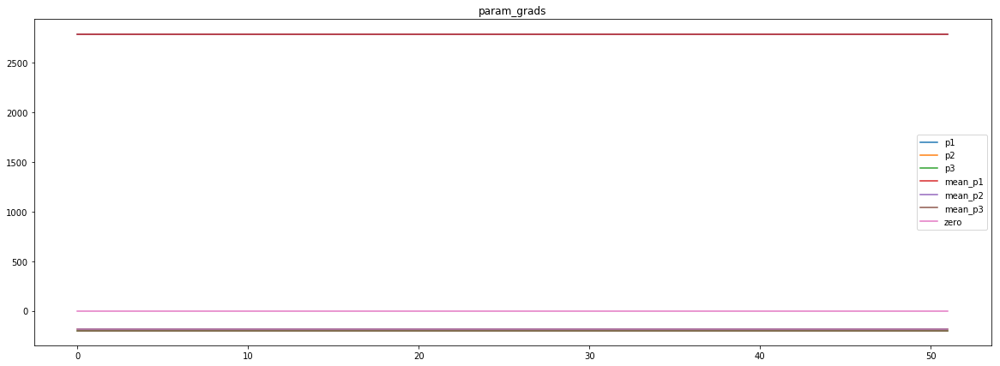

loss rate [0.2886968100150662]
Epoch [58] 
     train_loss[765.5042847853441] 
     eval_train[0.5594206526875496] 
     eval_test[0.531127851117741]



aux preds: 0.4493759572505951           1.0013772249221802           9.958062171936035
main loss 0.0
aux loss 28.74404786183284
jord loss 763.6594625619741
combined loss 792.403510423807 



Parameter containing:
tensor([[0.4494, 1.0014, 9.9581]], requires_grad=True)


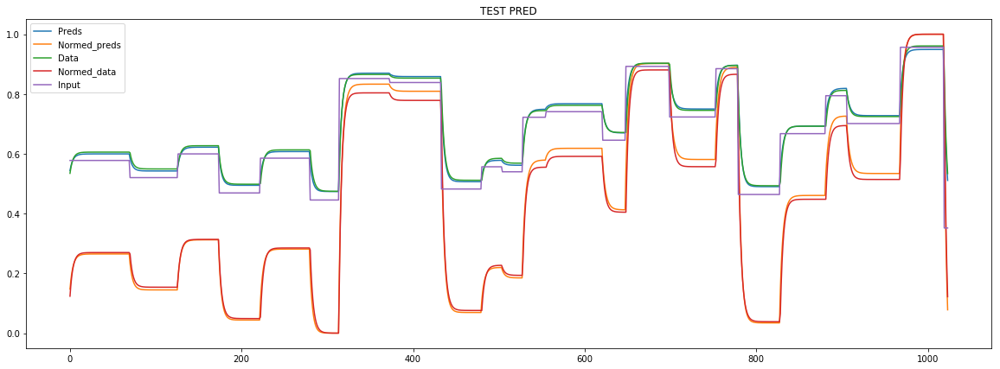

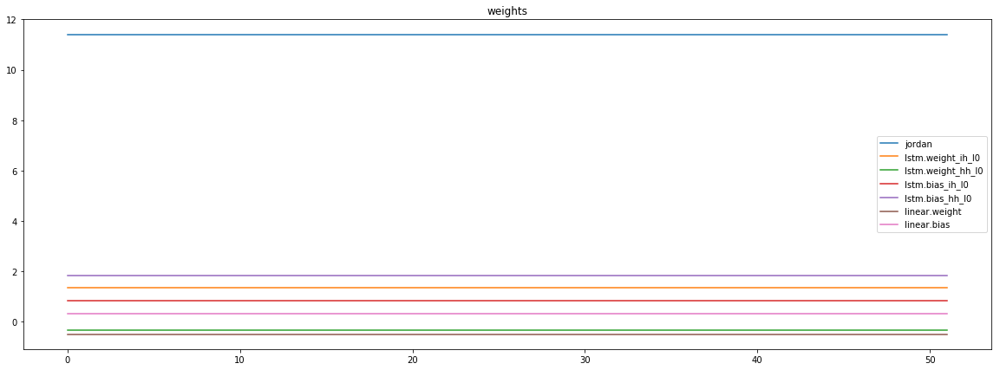

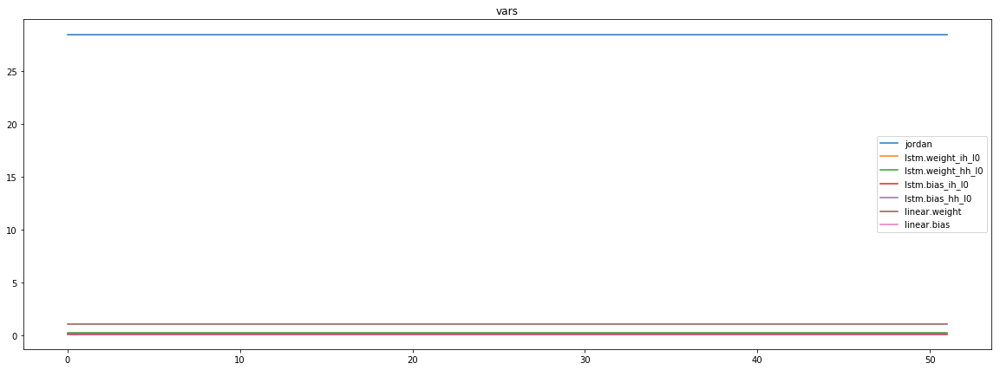

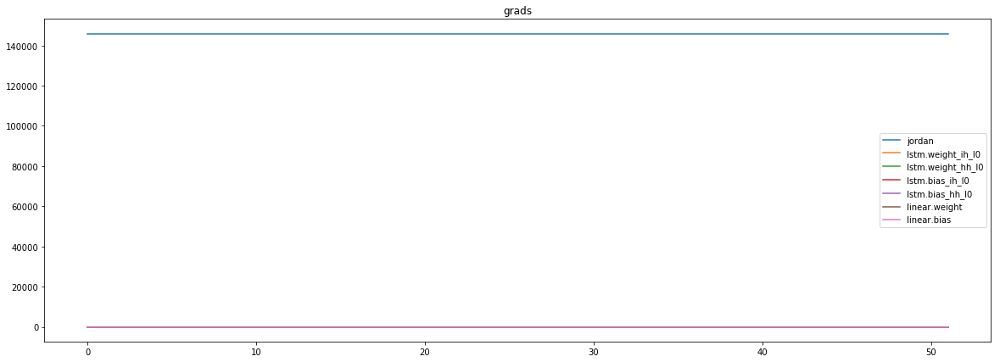

mean_p1 : -2578.1337890625
mean_p2 : 147051.578125
mean_p3 : 1478.5089111328125


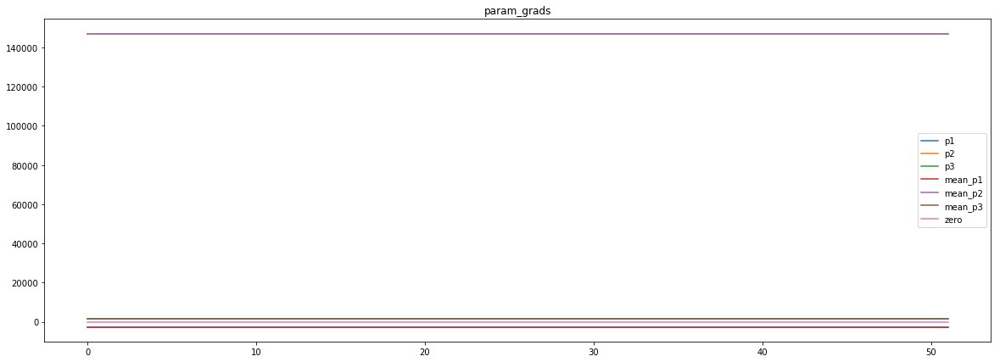

loss rate [0.19108616921548405]
Epoch [59] 
     train_loss[792.403510423807] 
     eval_train[0.5360032910337815] 
     eval_test[0.5155636424368079]



aux preds: 0.44993385672569275           1.0011885166168213           9.95825481414795
main loss 0.0
aux loss 37.53062725067139
jord loss 796.6072628314679
combined loss 834.1378900821393 



Parameter containing:
tensor([[0.4499, 1.0012, 9.9583]], requires_grad=True)


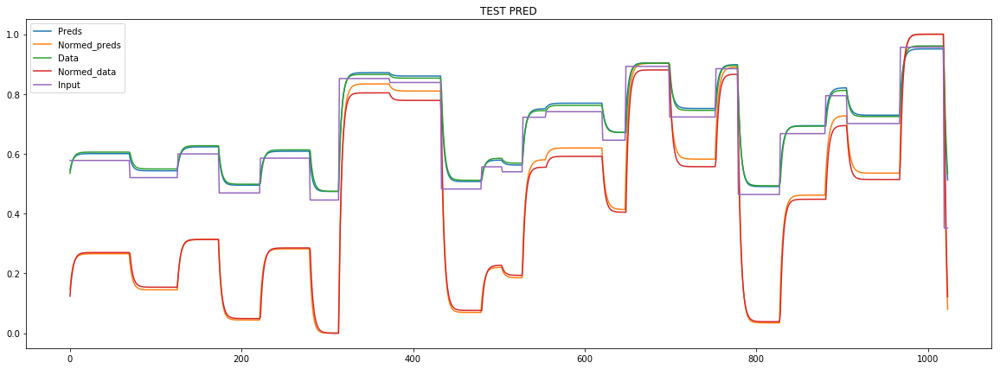

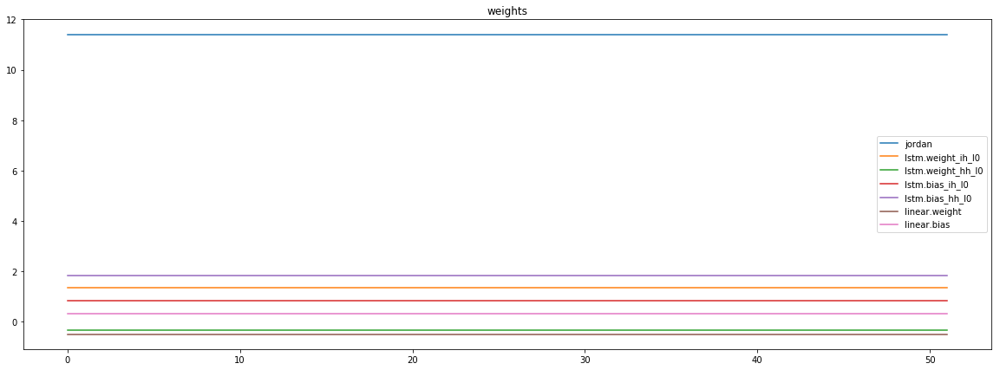

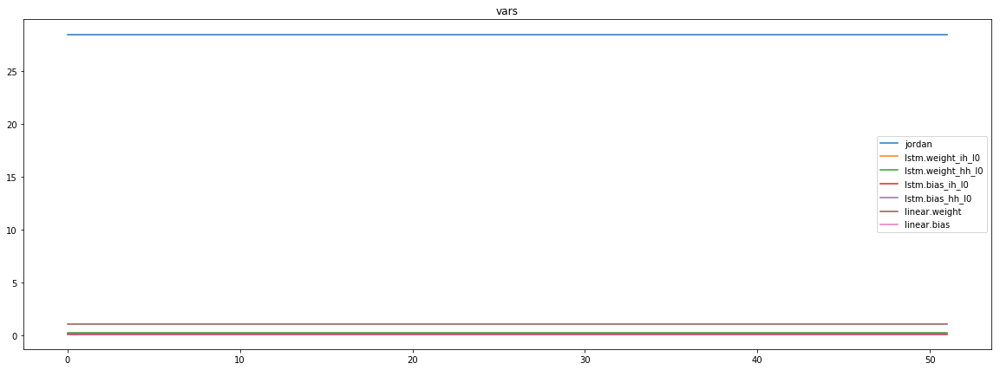

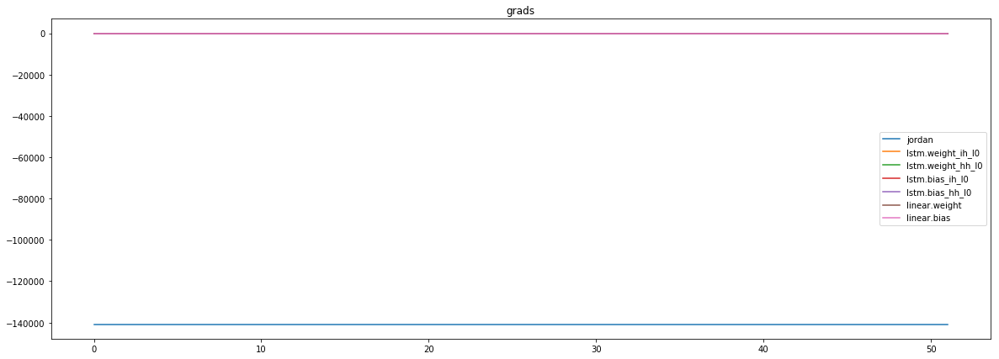

mean_p1 : 299.78631591796875
mean_p2 : -139649.0625
mean_p3 : -1406.77587890625


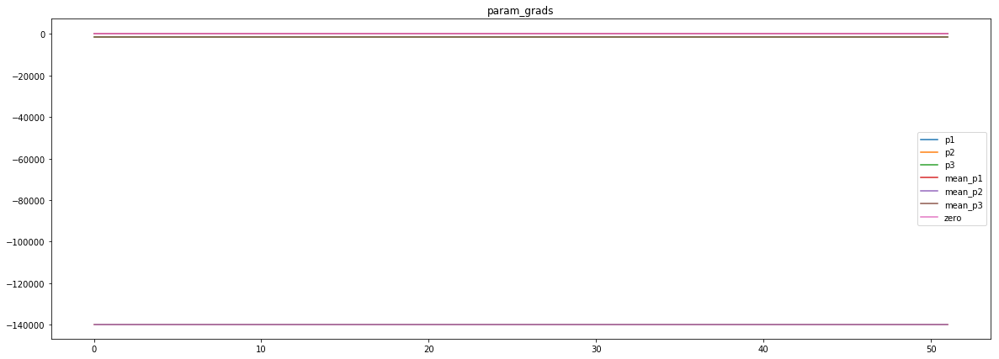

loss rate [0.011263097469842442]
Epoch [60] 
     train_loss[834.1378900821393] 
     eval_train[0.5477257342292712] 
     eval_test[0.526562822136012]



aux preds: 0.4458543658256531           1.0011518001556396           9.962909698486328
main loss 0.0
aux loss 29.23288345336914
jord loss 711.9925719041091
combined loss 741.2254553574783 



Parameter containing:
tensor([[0.4459, 1.0012, 9.9629]], requires_grad=True)


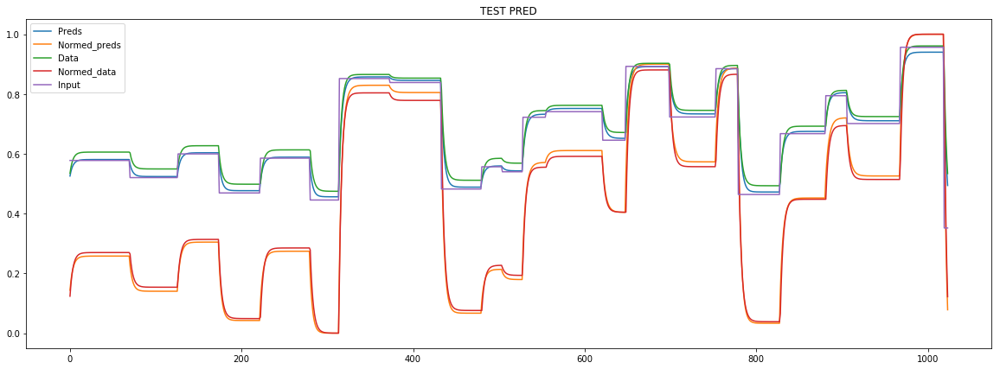

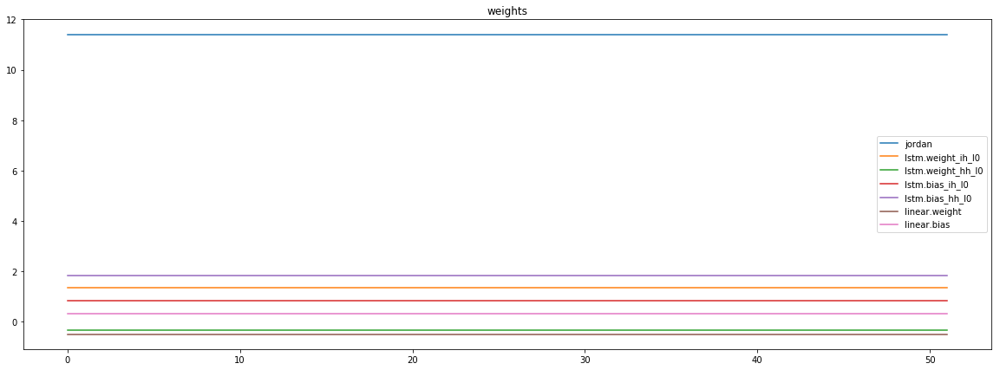

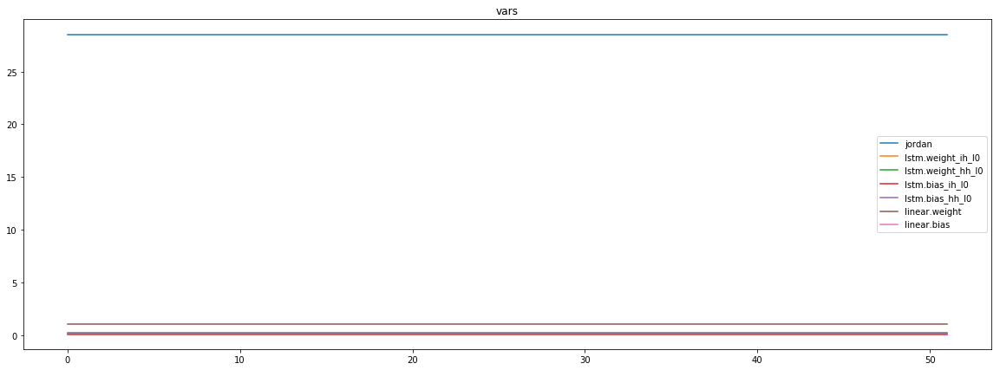

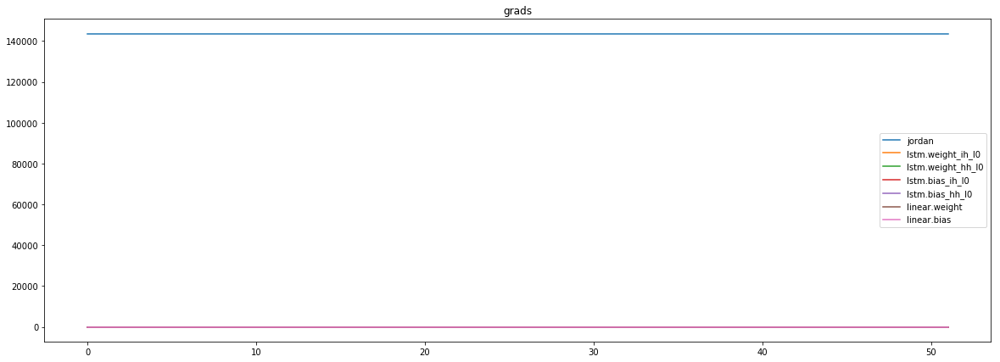

mean_p1 : 1240.495361328125
mean_p2 : 141000.015625
mean_p3 : 1426.470703125


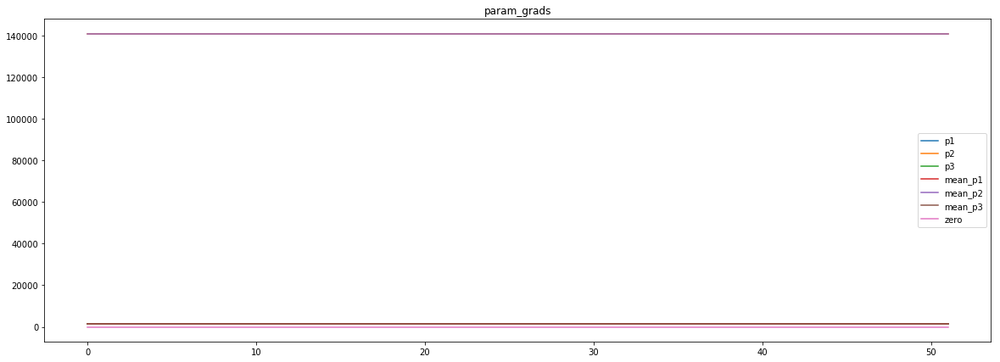

loss rate [-1.2796801986019974]
Epoch [61] 
     train_loss[741.2254553574783] 
     eval_train[1.168649924489168] 
     eval_test[1.1955055702816357]



aux preds: 0.44817566871643066           1.0036910772323608           9.963106155395508
main loss 0.0
aux loss 33.147298702826866
jord loss 714.7452873816857
combined loss 747.8925860845126 



Parameter containing:
tensor([[0.4482, 1.0037, 9.9631]], requires_grad=True)


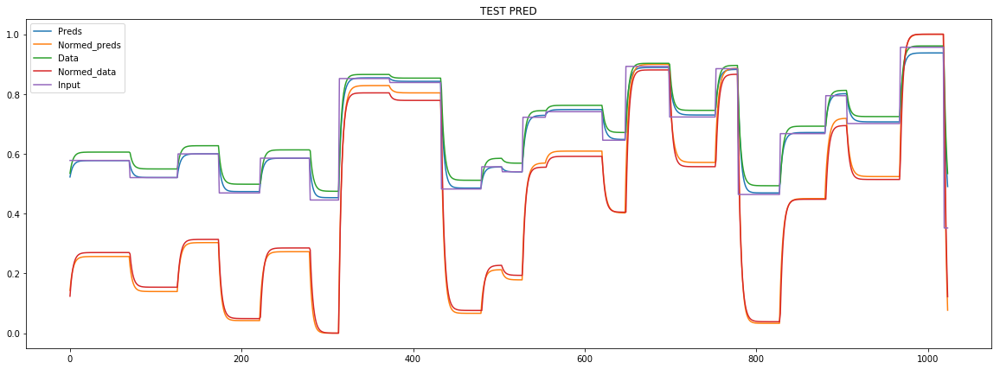

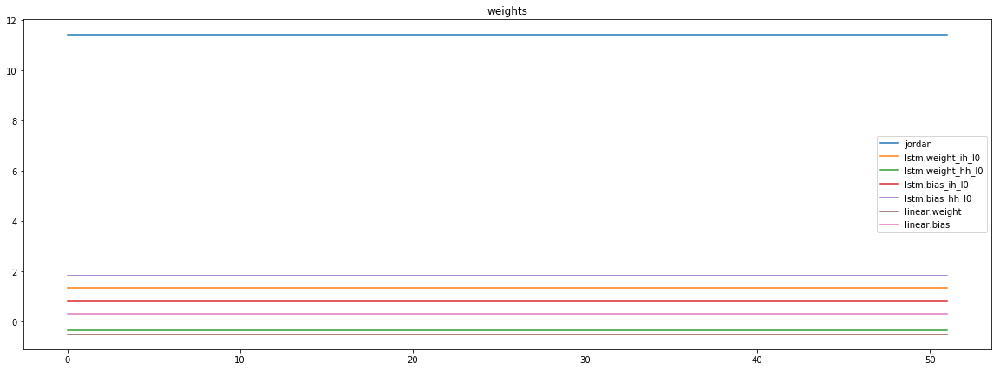

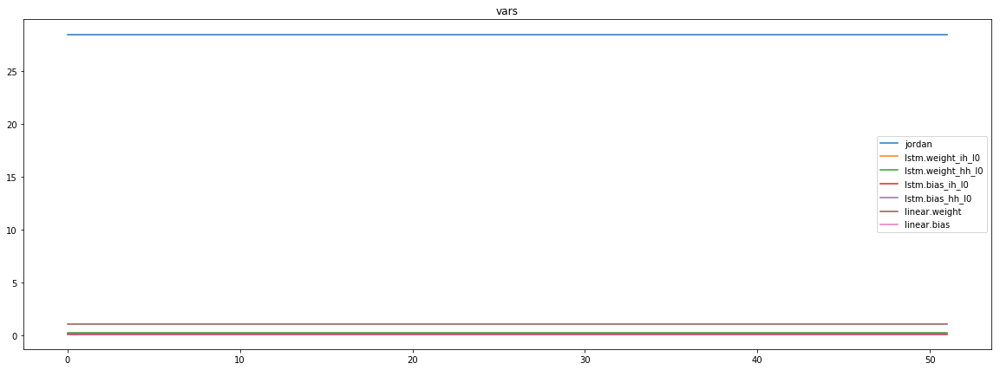

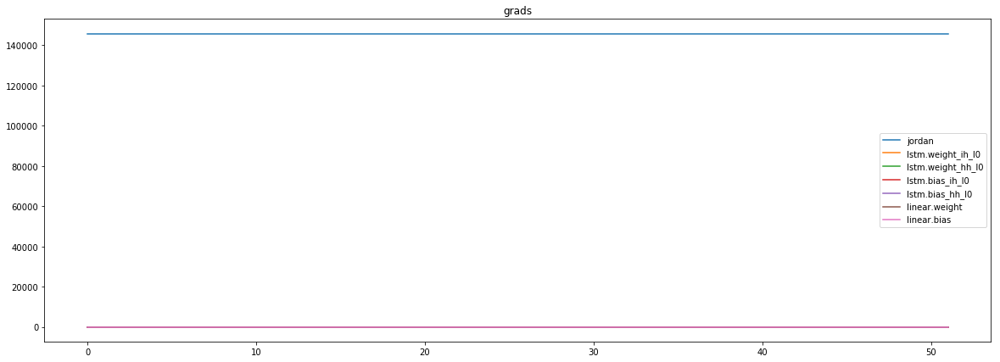

mean_p1 : -3185.257568359375
mean_p2 : 147496.1875
mean_p3 : 1481.461669921875


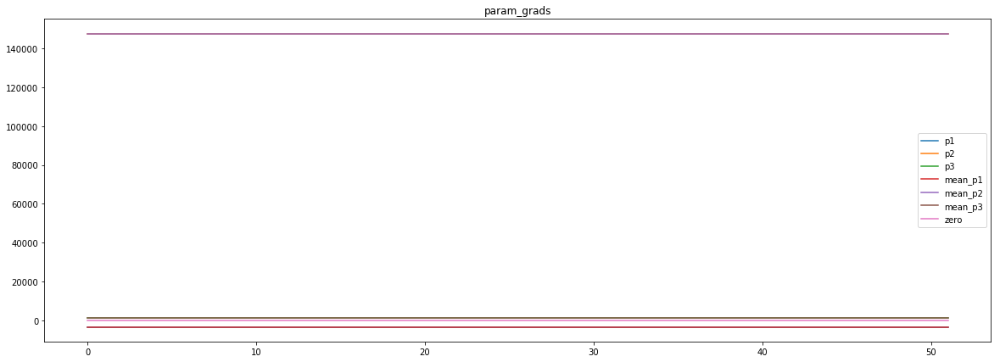

loss rate [-0.8837471134915038]
Epoch [62] 
     train_loss[747.8925860845126] 
     eval_train[1.3726537686127882] 
     eval_test[1.4050442955710671]



aux preds: 0.44677284359931946           1.0009249448776245           9.960943222045898
main loss 0.0
aux loss 30.289914167844334
jord loss 774.9220287616437
combined loss 805.211942929488 



Parameter containing:
tensor([[0.4468, 1.0009, 9.9609]], requires_grad=True)


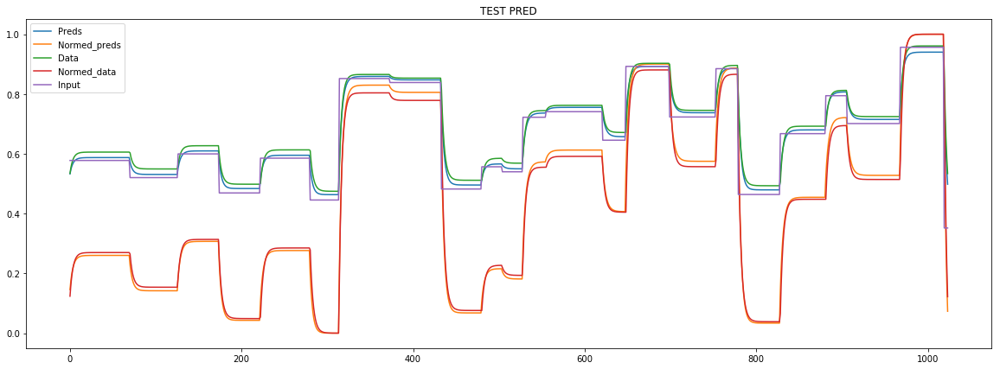

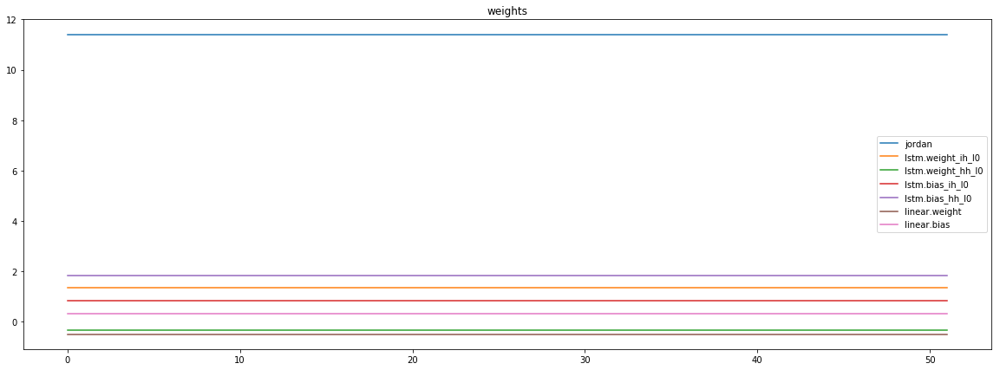

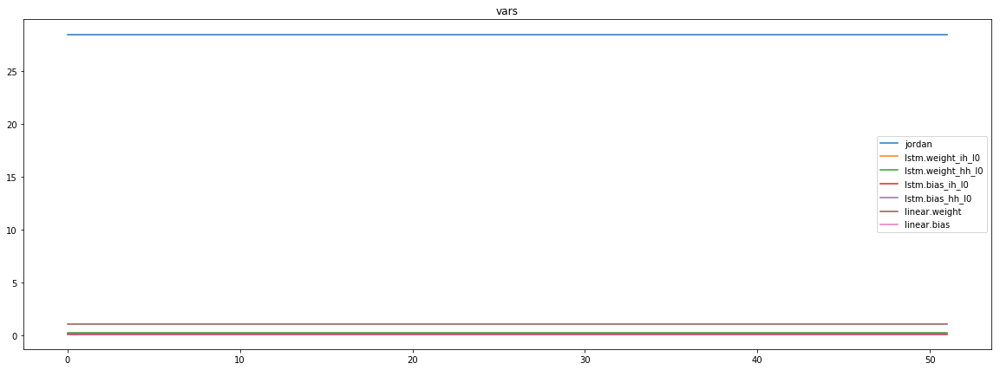

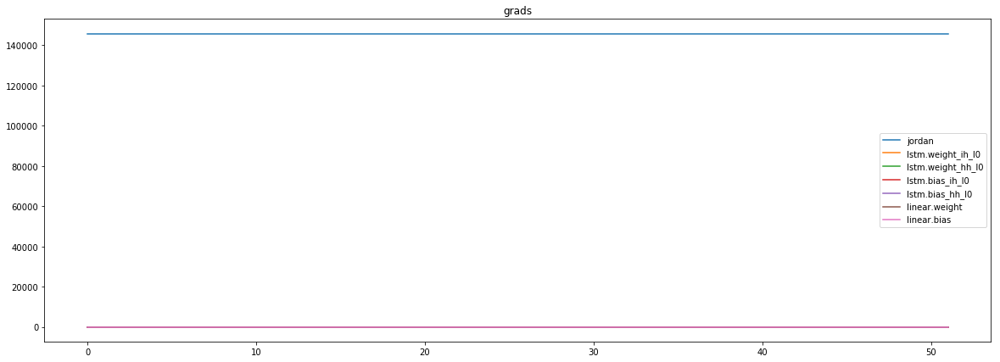

mean_p1 : -2086.9423828125
mean_p2 : 146454.40625
mean_p3 : 1474.380126953125


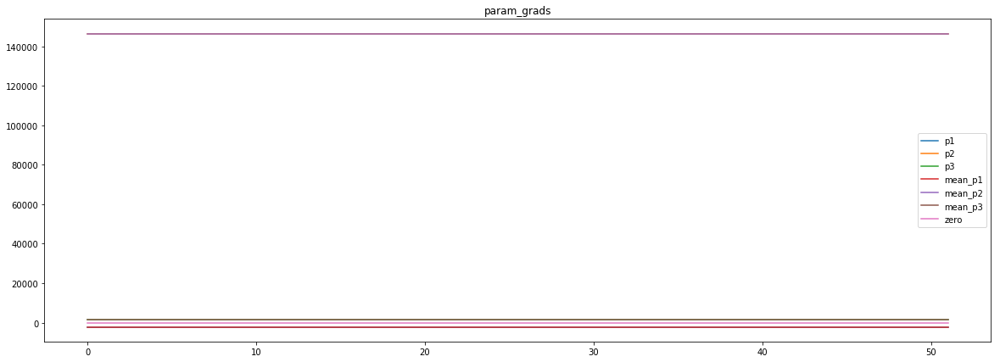

loss rate [0.09861329493906967]
Epoch [63] 
     train_loss[805.211942929488] 
     eval_train[0.921060446363229] 
     eval_test[0.939579267393459]



aux preds: 0.4505385160446167           1.001170039176941           9.961725234985352
main loss 0.0
aux loss 29.865275309636043
jord loss 766.0401670015775
combined loss 795.9054423112135 



Parameter containing:
tensor([[0.4505, 1.0012, 9.9617]], requires_grad=True)


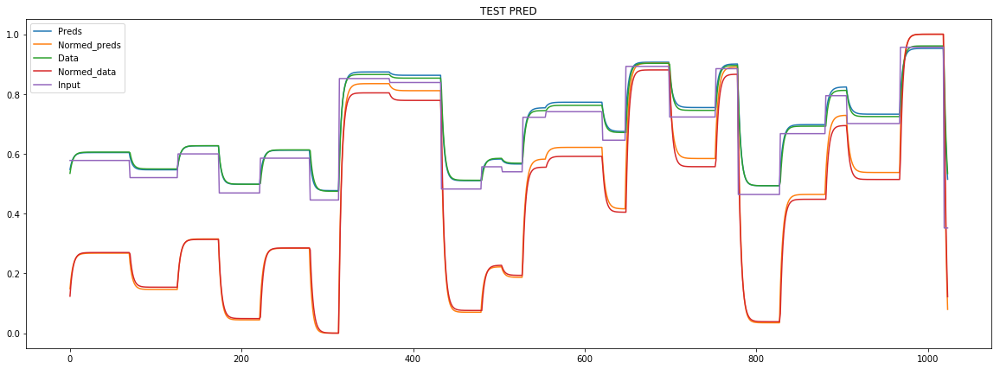

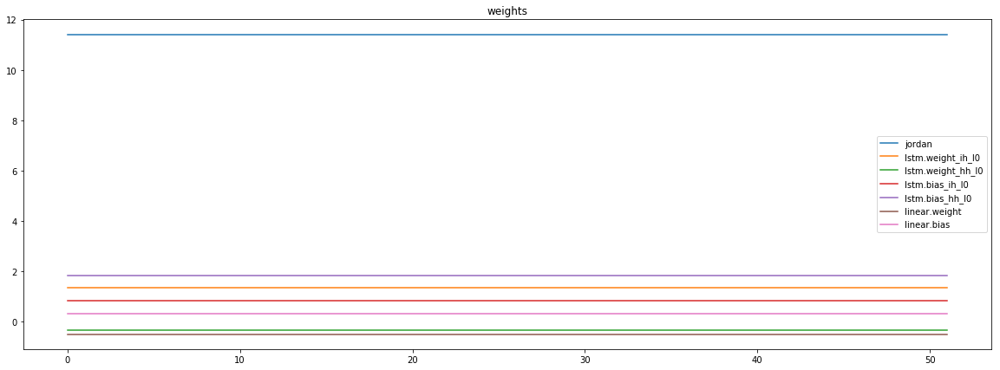

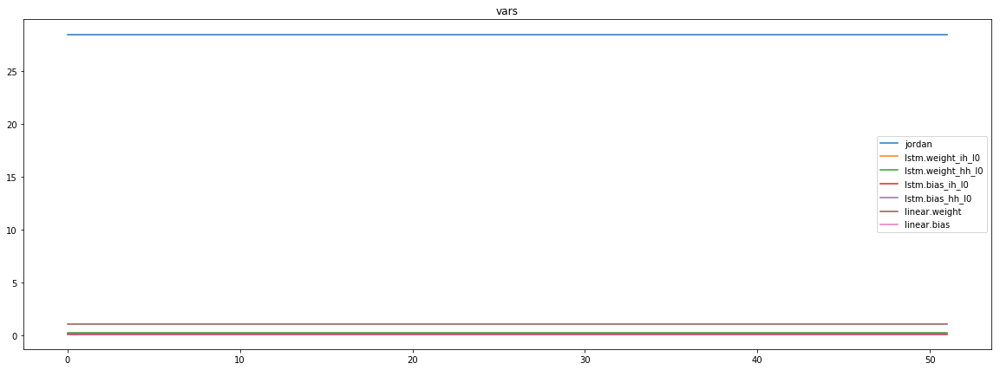

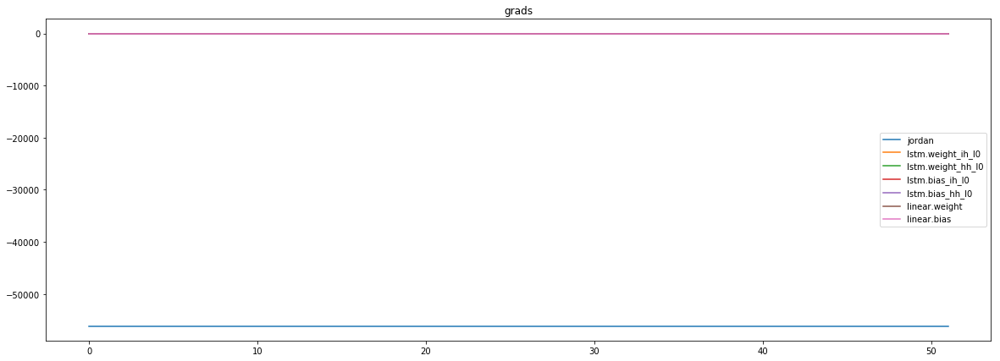

mean_p1 : -7804.12744140625
mean_p2 : -47633.4453125
mean_p3 : -692.6447143554688


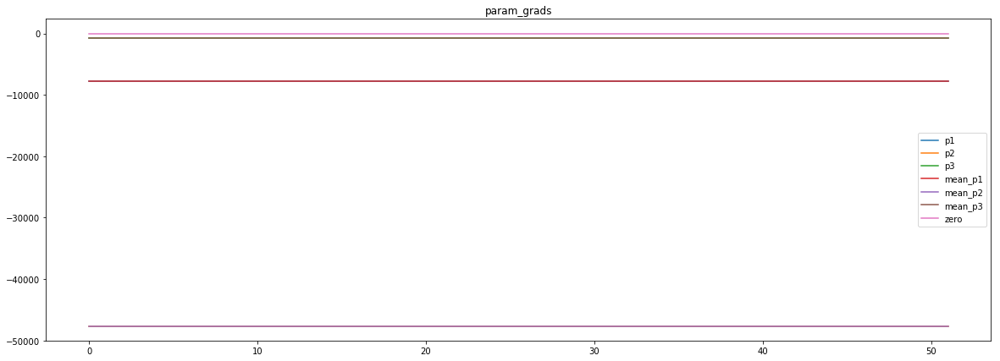

loss rate [0.520639747801651]
Epoch [64] 
     train_loss[795.9054423112135] 
     eval_train[0.6023187064207517] 
     eval_test[0.5656657313758676]



aux preds: 0.44911471009254456           0.9997974634170532           9.963841438293457
main loss 0.0
aux loss 35.95637020697961
jord loss 748.7230752798228
combined loss 784.6794454868024 



Parameter containing:
tensor([[0.4491, 0.9998, 9.9638]], requires_grad=True)


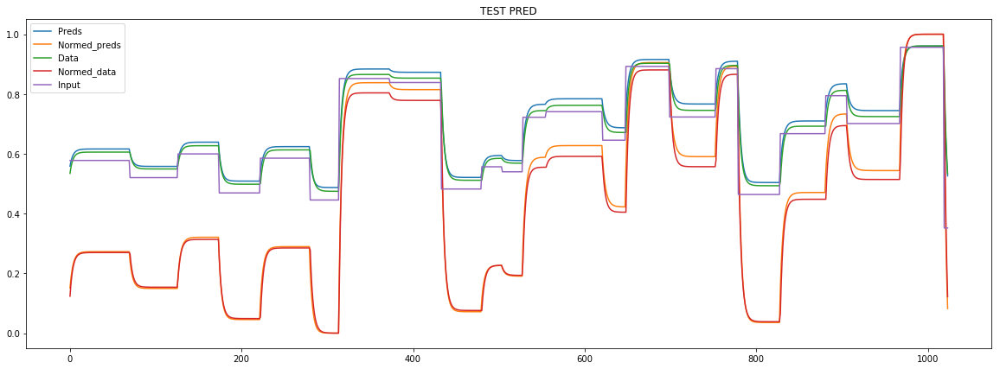

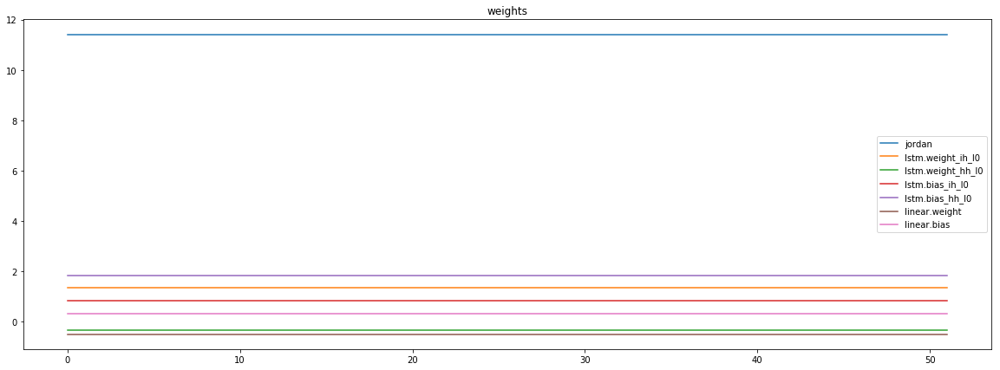

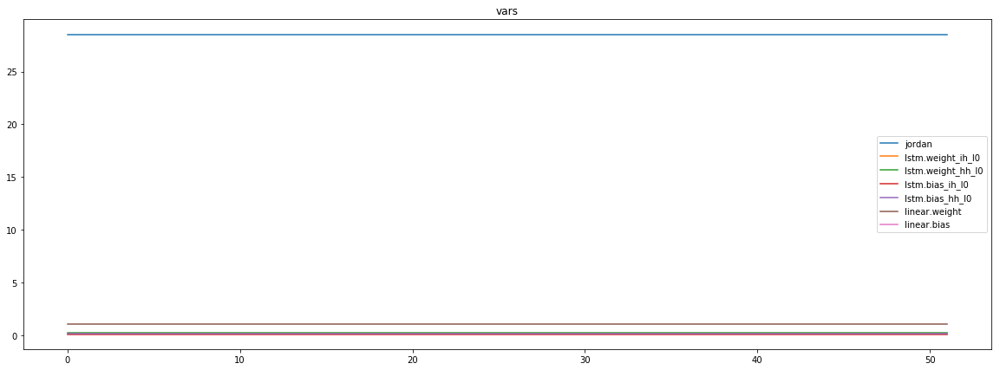

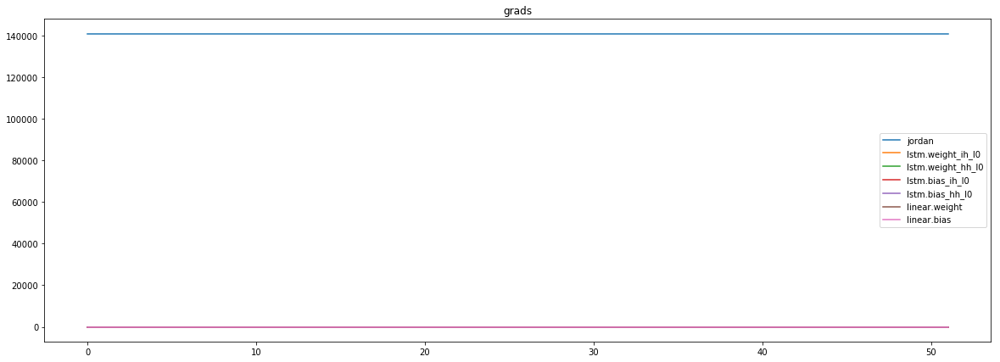

mean_p1 : 3142.60302734375
mean_p2 : 136600.3125
mean_p3 : 1392.60791015625


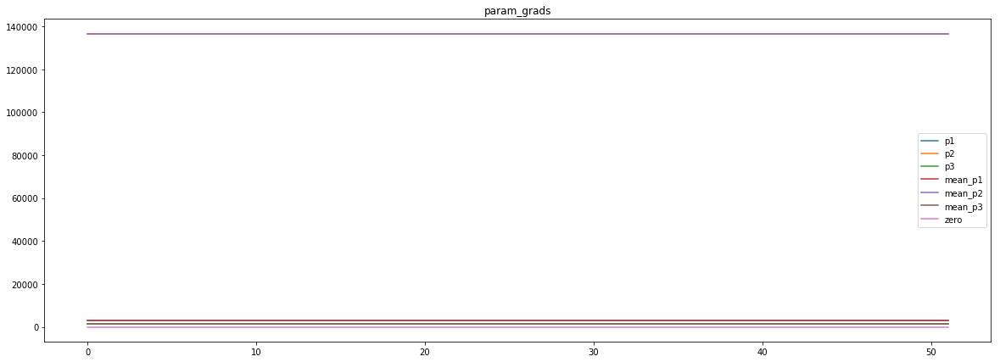

loss rate [-0.18944866777551161]
Epoch [65] 
     train_loss[784.6794454868024] 
     eval_train[1.195431371147816] 
     eval_test[1.1538799079981716]



aux preds: 0.44462084770202637           1.0014855861663818           9.96745491027832
main loss 0.0
aux loss 32.04840652759258
jord loss 710.9590483445388
combined loss 743.0074548721313 



Parameter containing:
tensor([[0.4446, 1.0015, 9.9675]], requires_grad=True)


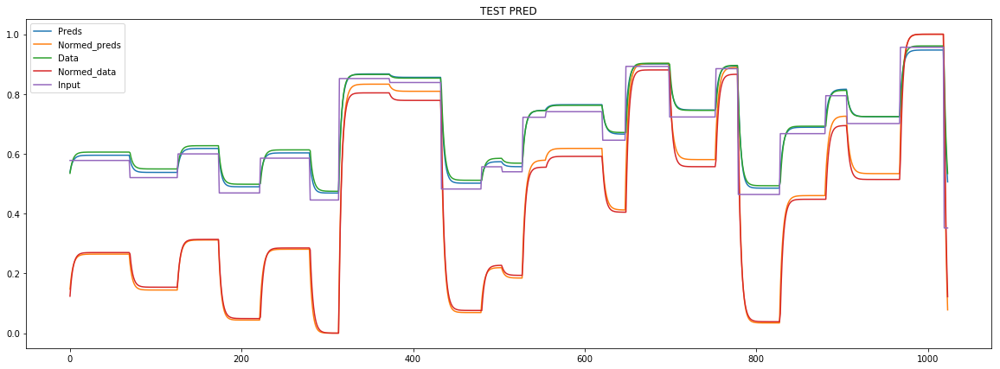

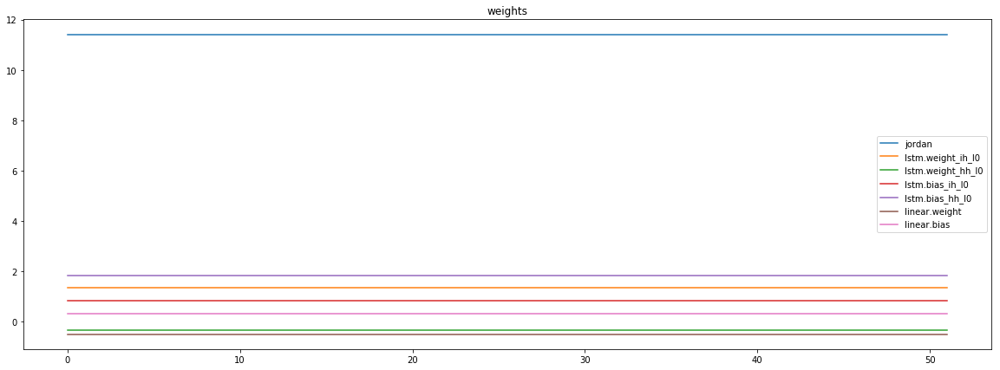

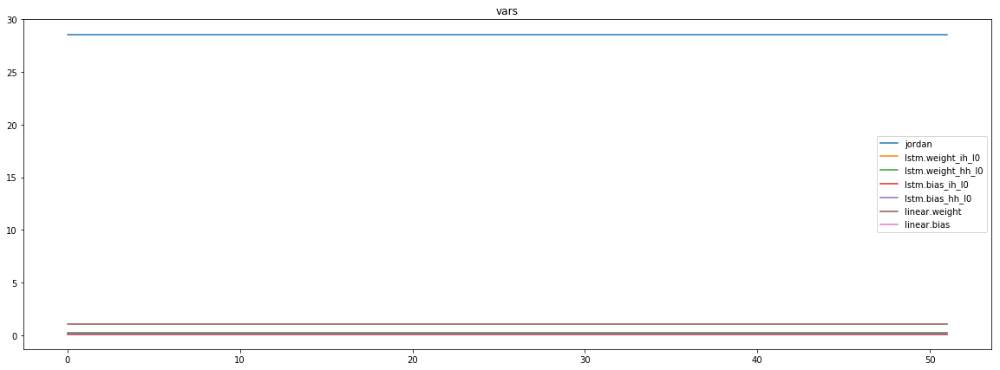

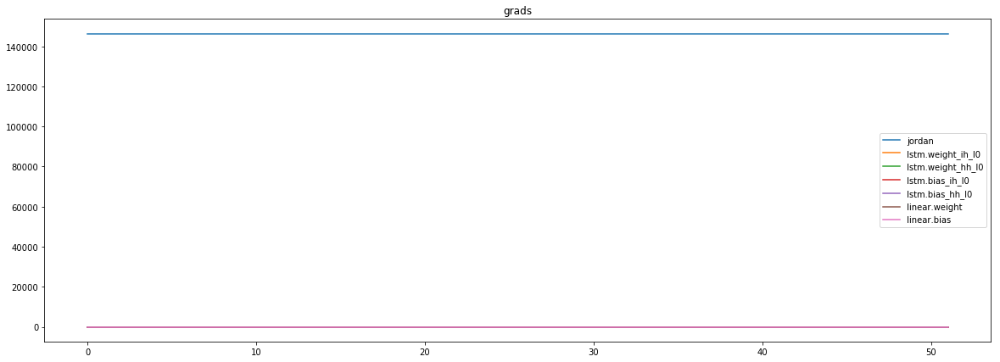

mean_p1 : -3050.788330078125
mean_p2 : 147932.296875
mean_p3 : 1485.635498046875


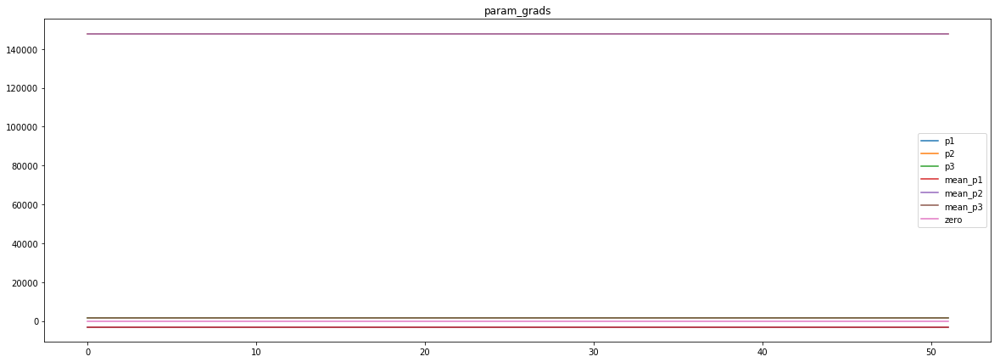

loss rate [0.3612894969707342]
Epoch [66] 
     train_loss[743.0074548721313] 
     eval_train[0.568766764150216] 
     eval_test[0.5661370022730394]



aux preds: 0.44639772176742554           1.0001615285873413           9.977572441101074
main loss 0.0
aux loss 31.448858591226433
jord loss 776.9452567467323
combined loss 808.3941153379587 



Parameter containing:
tensor([[0.4464, 1.0002, 9.9776]], requires_grad=True)


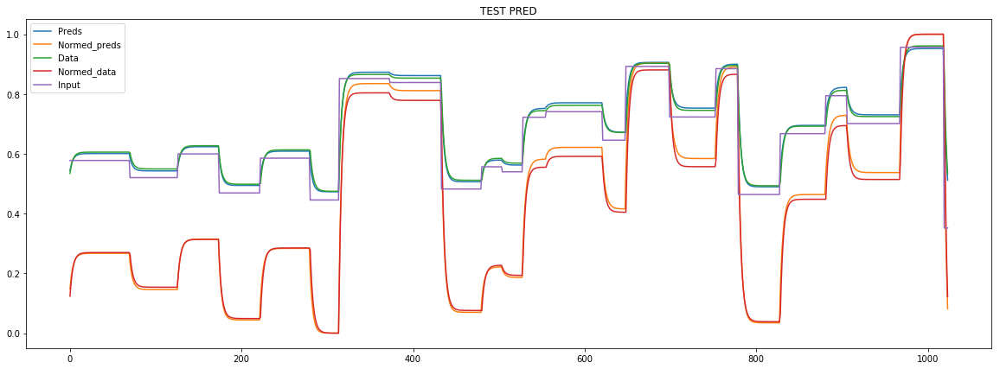

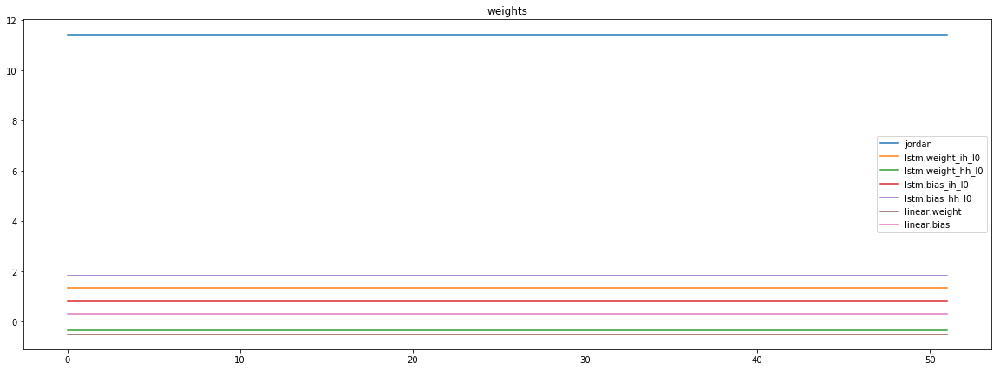

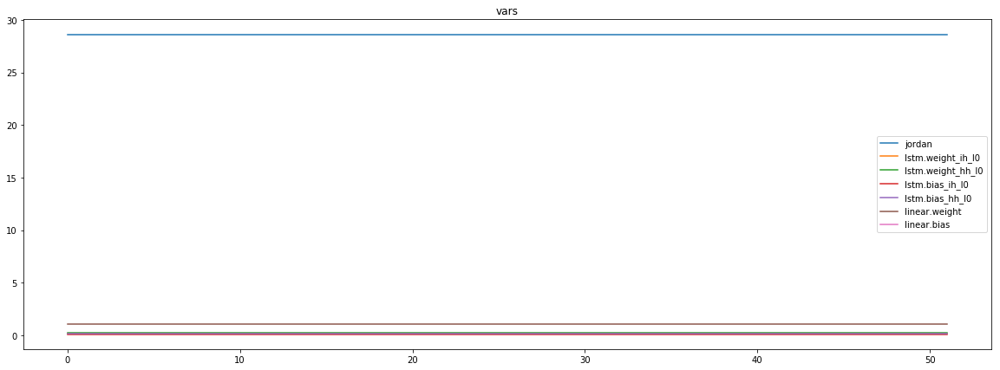

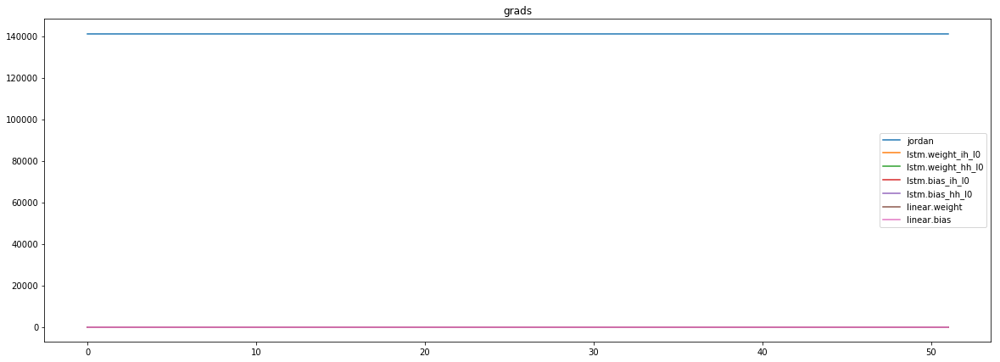

mean_p1 : -4102.7822265625
mean_p2 : 143875.953125
mean_p3 : 1442.306640625


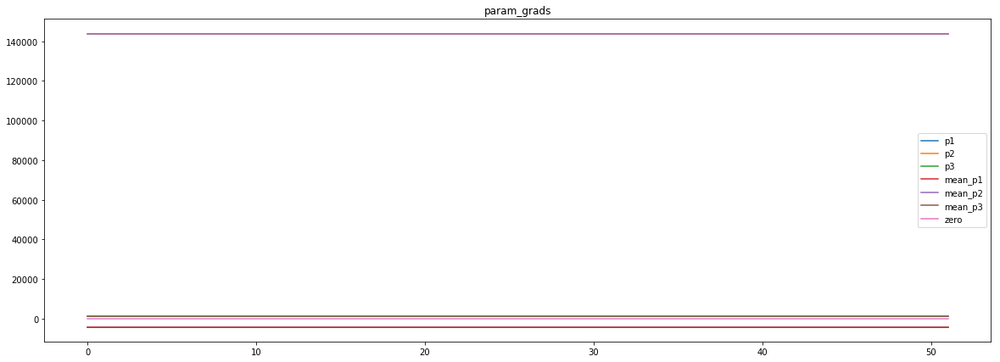

loss rate [0.28445230896738816]
Epoch [67] 
     train_loss[808.3941153379587] 
     eval_train[0.5613088384270668] 
     eval_test[0.5451716455546293]



aux preds: 0.4495271146297455           0.9994215965270996           9.979825019836426
main loss 0.0
aux loss 30.90731716156006
jord loss 802.7017481877253
combined loss 833.6090653492854 



Parameter containing:
tensor([[0.4495, 0.9994, 9.9798]], requires_grad=True)


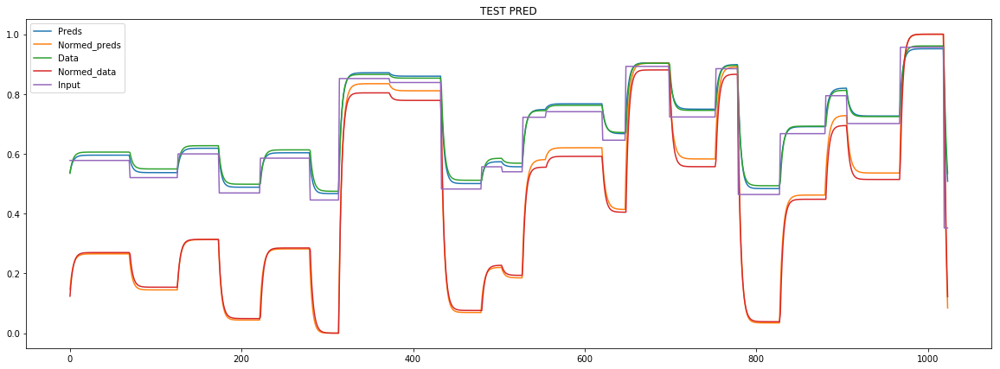

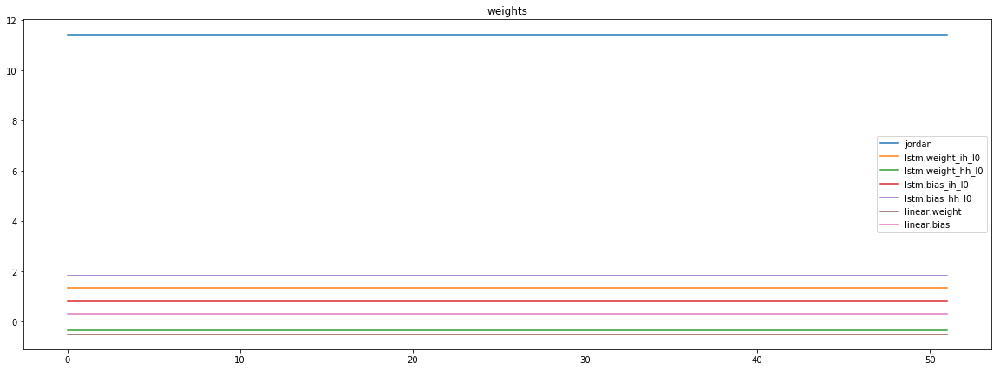

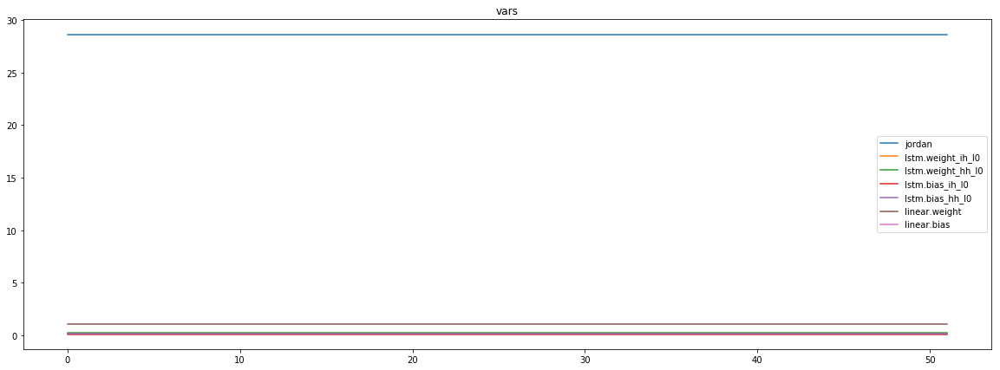

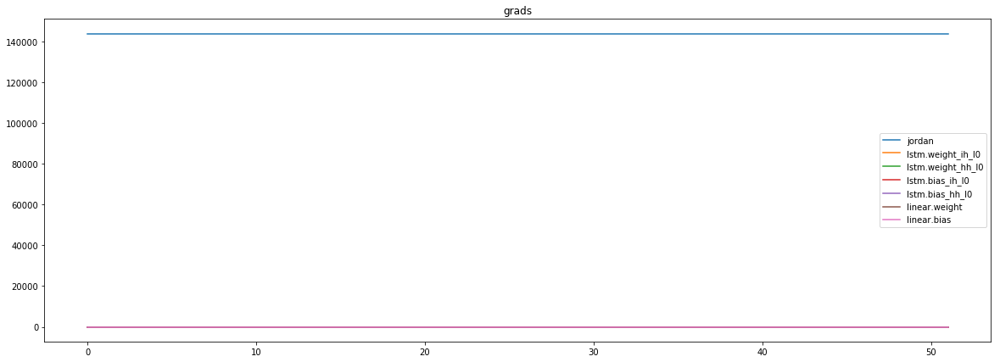

mean_p1 : 756.0924072265625
mean_p2 : 141669.4375
mean_p3 : 1429.3814697265625


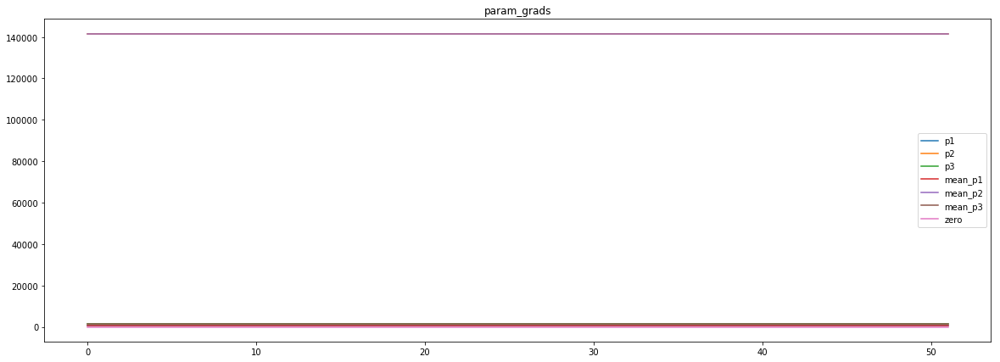

loss rate [0.23230933119731634]
Epoch [68] 
     train_loss[833.6090653492854] 
     eval_train[0.5783622081463153] 
     eval_test[0.5796547057953748]



aux preds: 0.44590622186660767           1.0028162002563477           9.981281280517578
main loss 0.0
aux loss 31.367200668041523
jord loss 760.7279979999249
combined loss 792.0951986679664 



Parameter containing:
tensor([[0.4459, 1.0028, 9.9813]], requires_grad=True)


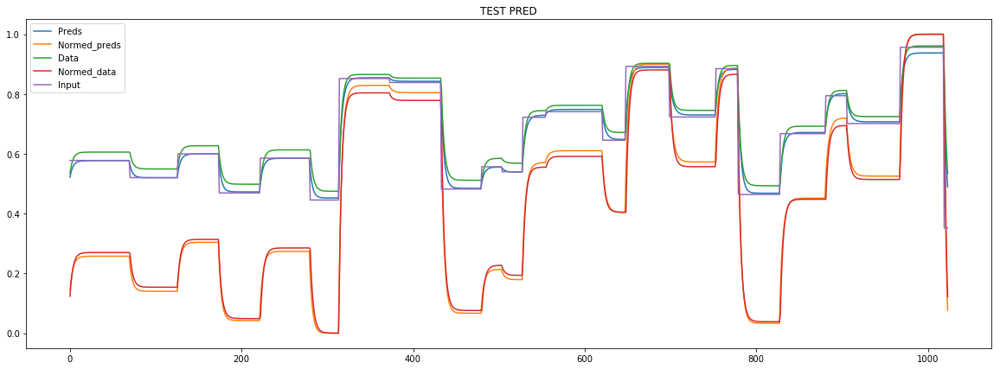

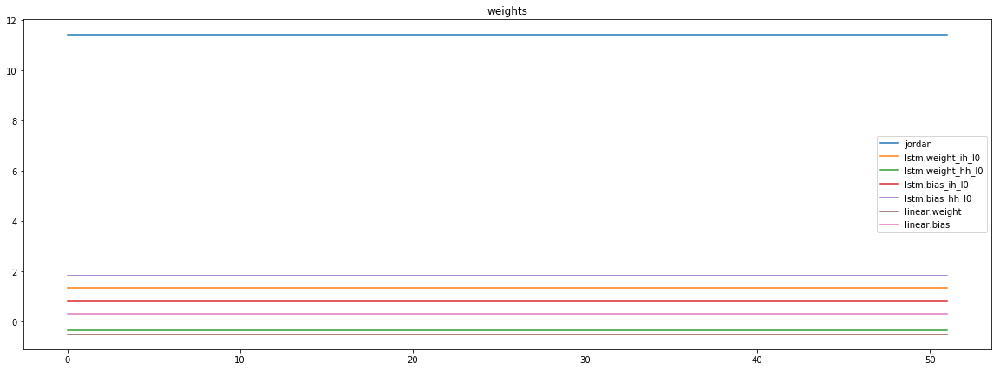

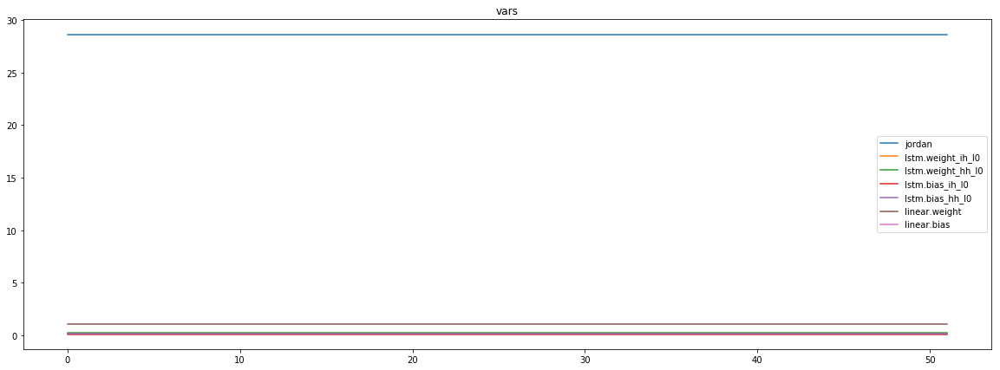

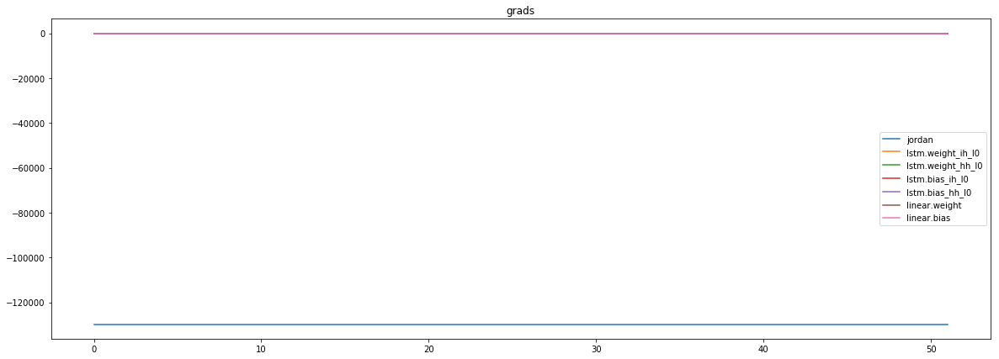

mean_p1 : 3564.849853515625
mean_p2 : -131974.453125
mean_p3 : -1336.1942138671875


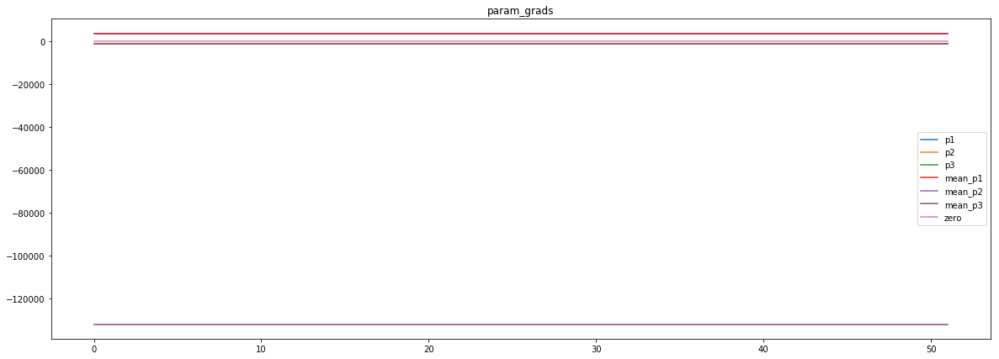

loss rate [-1.5236820773063346]
Epoch [69] 
     train_loss[792.0951986679664] 
     eval_train[1.3903941030685718] 
     eval_test[1.4224846363067627]



aux preds: 0.44919353723526           0.9992495775222778           9.977008819580078
main loss 0.0
aux loss 34.89026594161987
jord loss 786.2914704542893
combined loss 821.1817363959092 



Parameter containing:
tensor([[0.4492, 0.9992, 9.9770]], requires_grad=True)


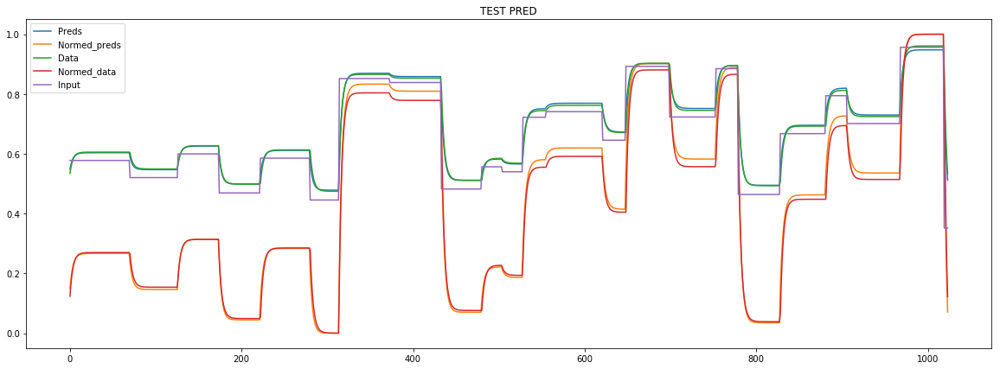

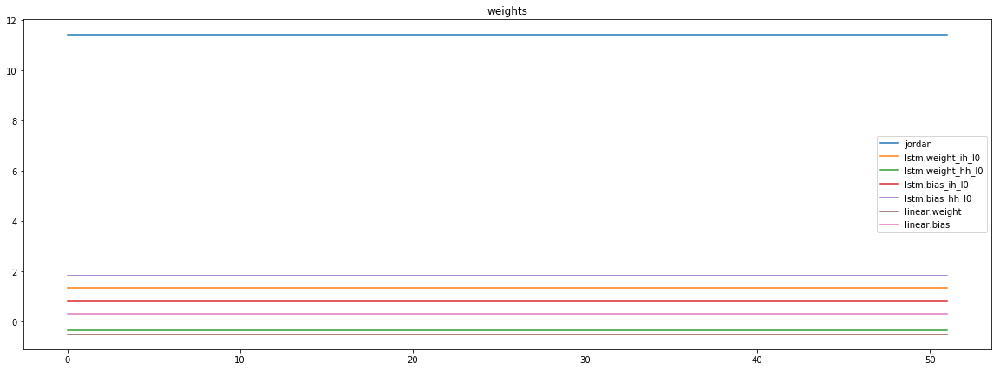

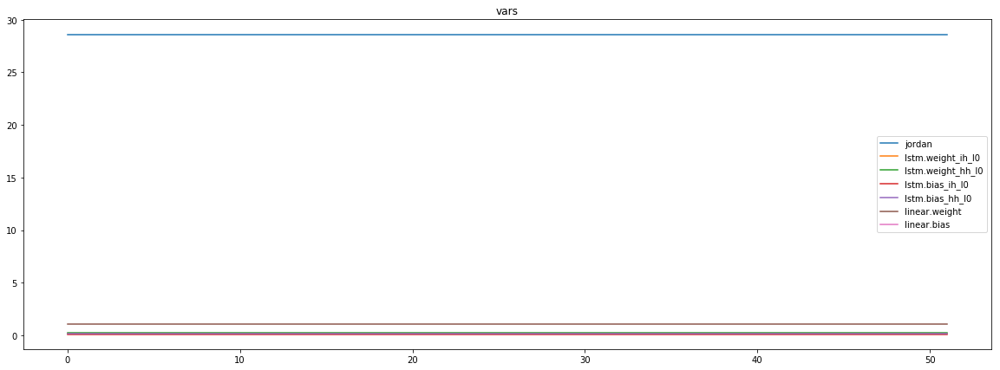

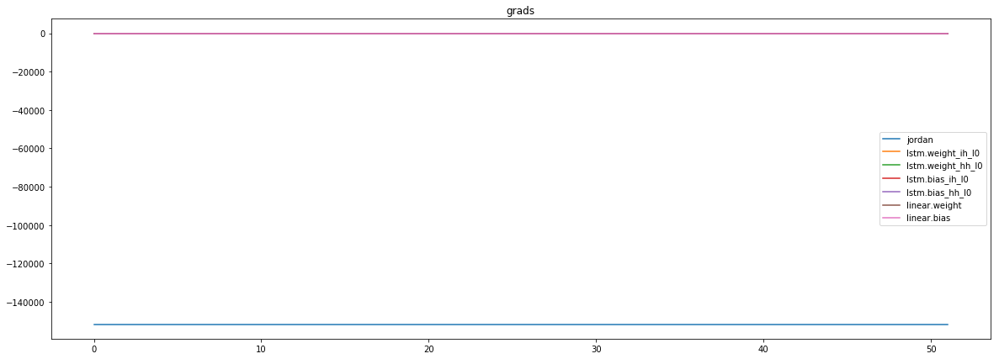

mean_p1 : -5371.10009765625
mean_p2 : -144855.546875
mean_p3 : -1443.7684326171875


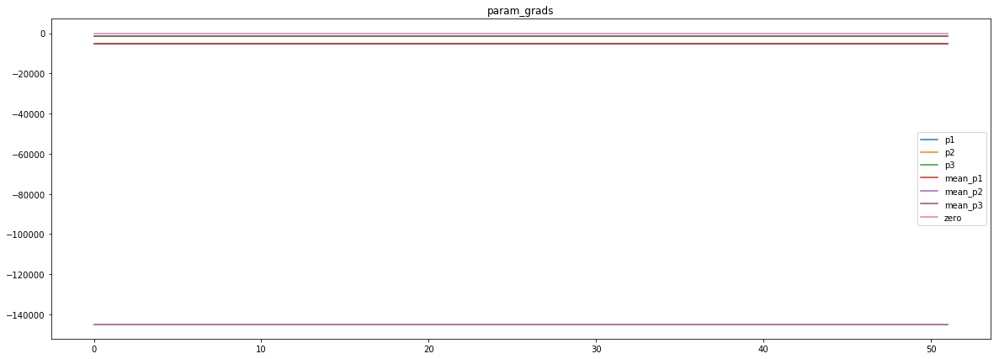

loss rate [0.37206985463932973]
Epoch [70] 
     train_loss[821.1817363959092] 
     eval_train[0.5703215553210332] 
     eval_test[0.5331777862527154]



aux preds: 0.44779619574546814           1.0012692213058472           9.980963706970215
main loss 0.0
aux loss 34.351806530585655
jord loss 767.8908110398513
combined loss 802.242617570437 



Parameter containing:
tensor([[0.4478, 1.0013, 9.9810]], requires_grad=True)


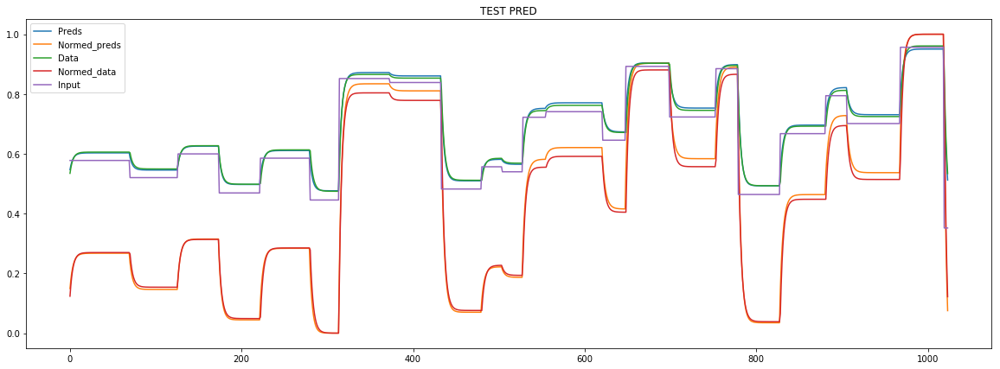

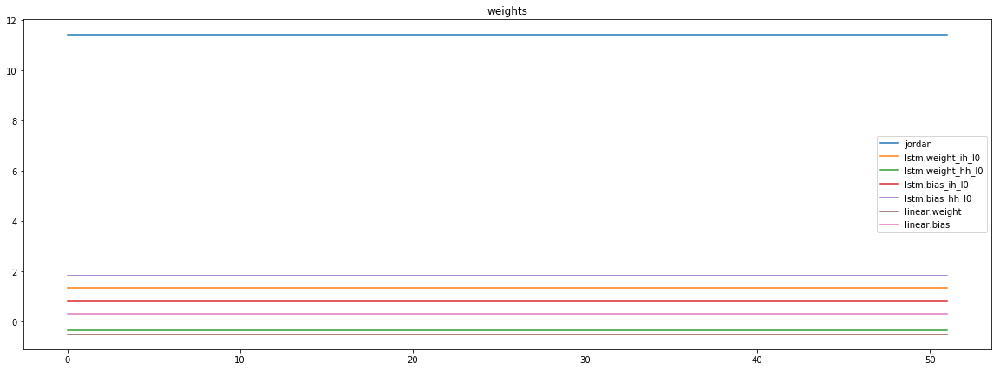

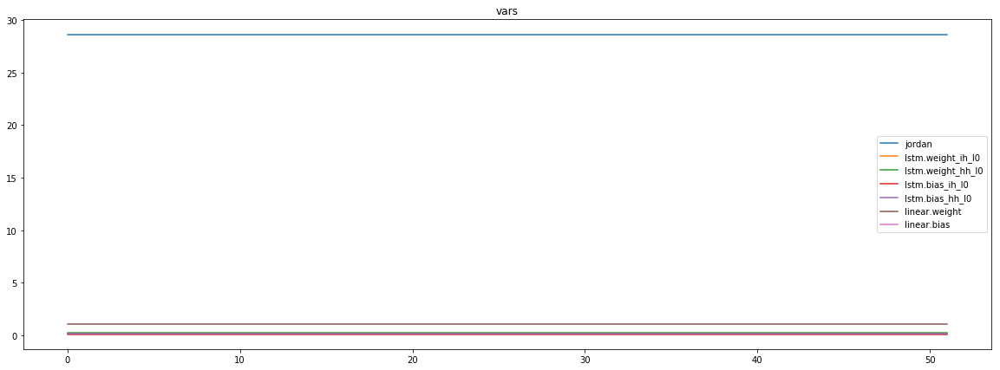

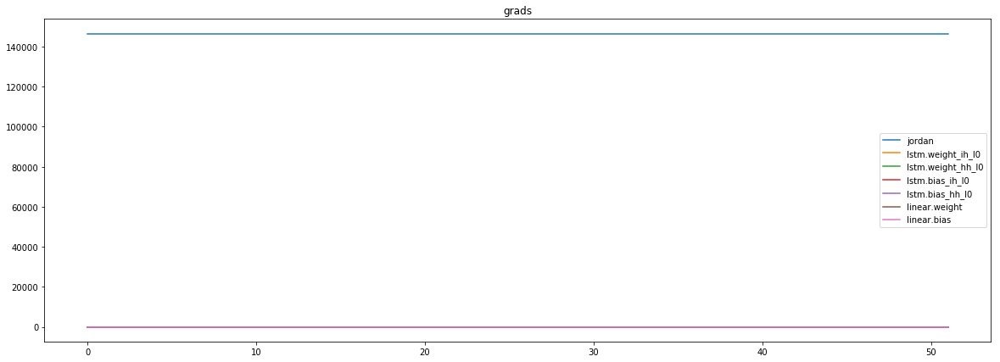

mean_p1 : -2597.22998046875
mean_p2 : 147610.0
mean_p3 : 1483.3546142578125


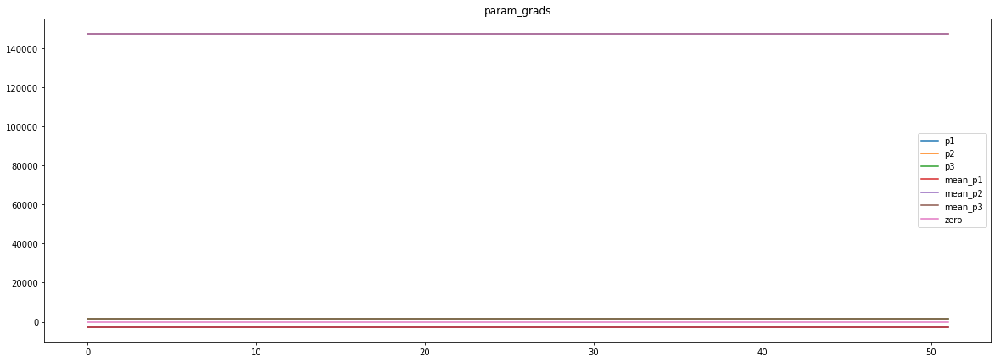

loss rate [0.3635880717173746]
Epoch [71] 
     train_loss[802.242617570437] 
     eval_train[0.5694360102598484] 
     eval_test[0.5378353541547601]



aux preds: 0.4490460455417633           1.000848650932312           9.976265907287598
main loss 0.0
aux loss 34.77404084572425
jord loss 808.4957668597882
combined loss 843.2698077055124 



Parameter containing:
tensor([[0.4490, 1.0008, 9.9763]], requires_grad=True)


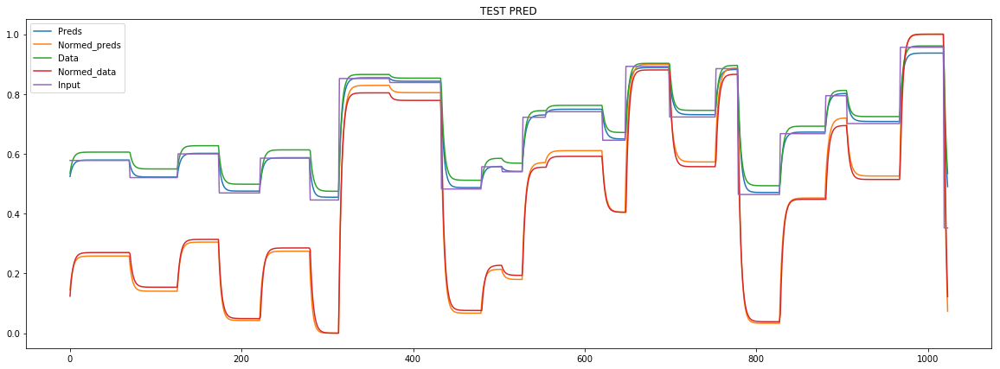

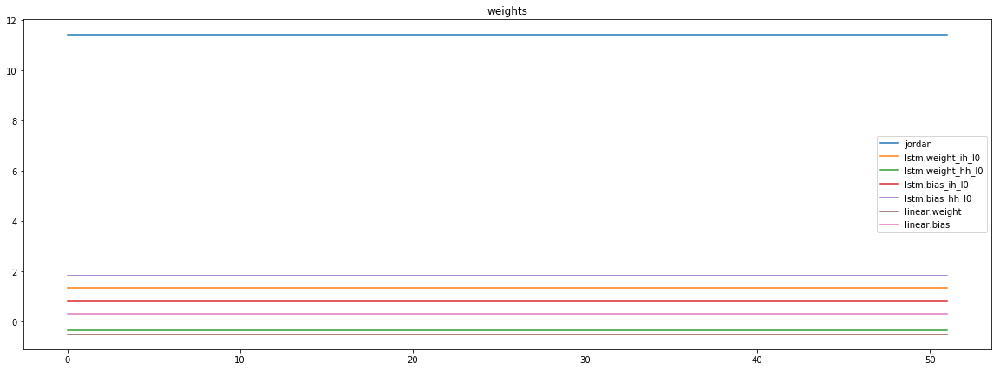

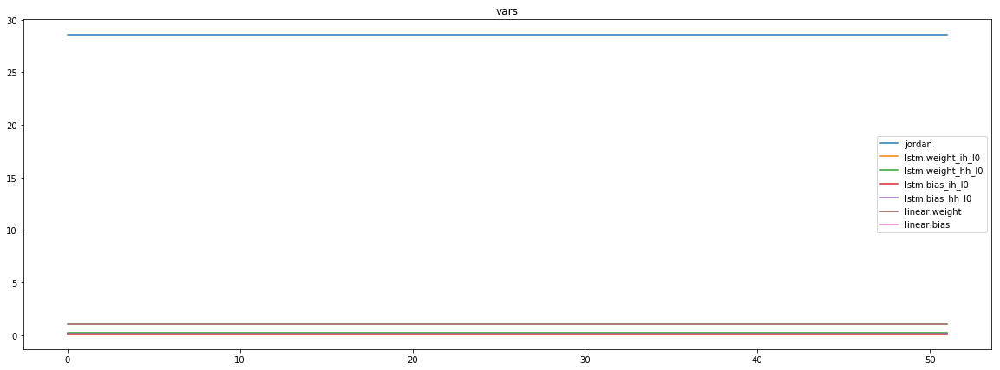

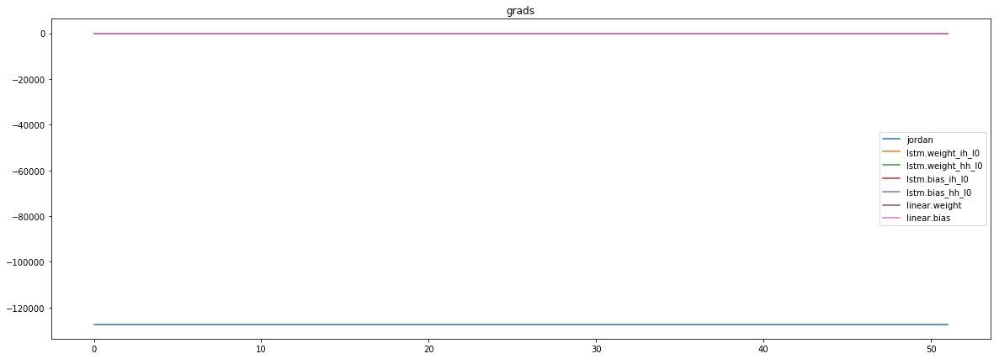

mean_p1 : 3890.30859375
mean_p2 : -129839.7265625
mean_p3 : -1311.1007080078125


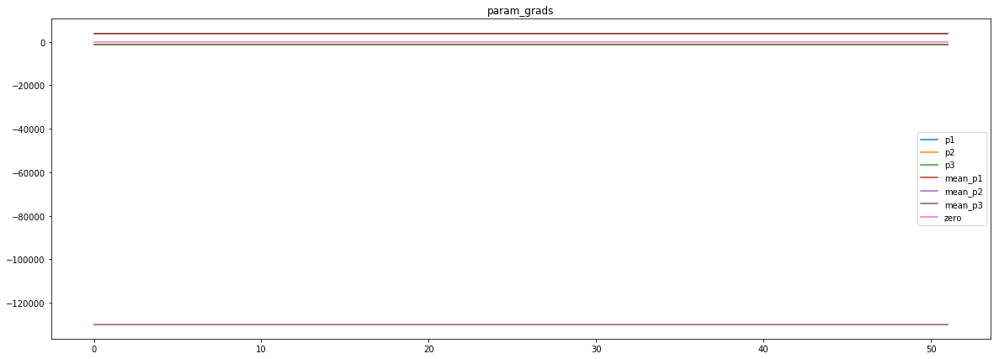

loss rate [-0.6162884643985347]
Epoch [72] 
     train_loss[843.2698077055124] 
     eval_train[1.3109562190679402] 
     eval_test[1.3434038975022056]



aux preds: 0.4477819800376892           1.001172423362732           9.979585647583008
main loss 0.0
aux loss 30.746240505805382
jord loss 727.9112008901743
combined loss 758.6574413959797 



Parameter containing:
tensor([[0.4478, 1.0012, 9.9796]], requires_grad=True)


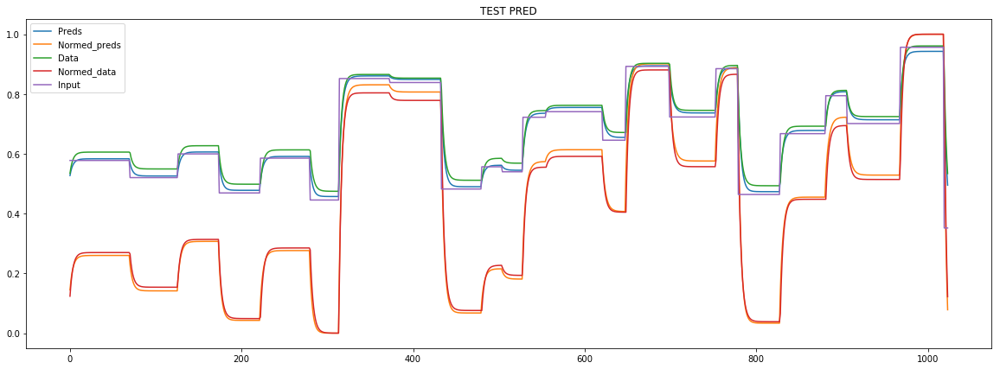

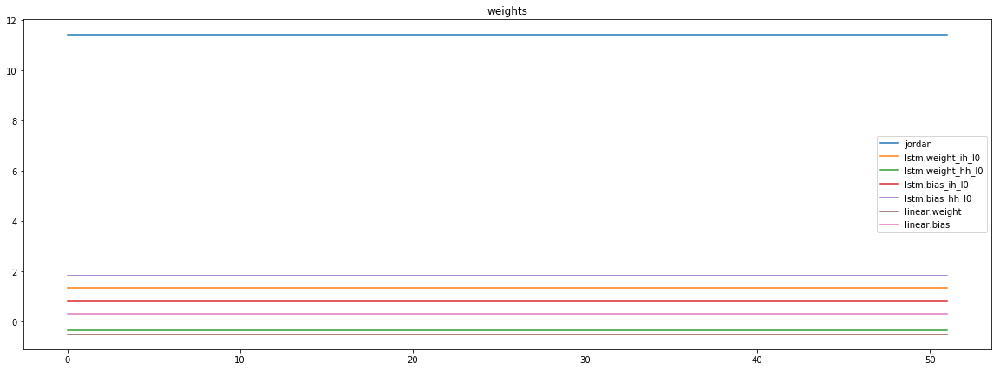

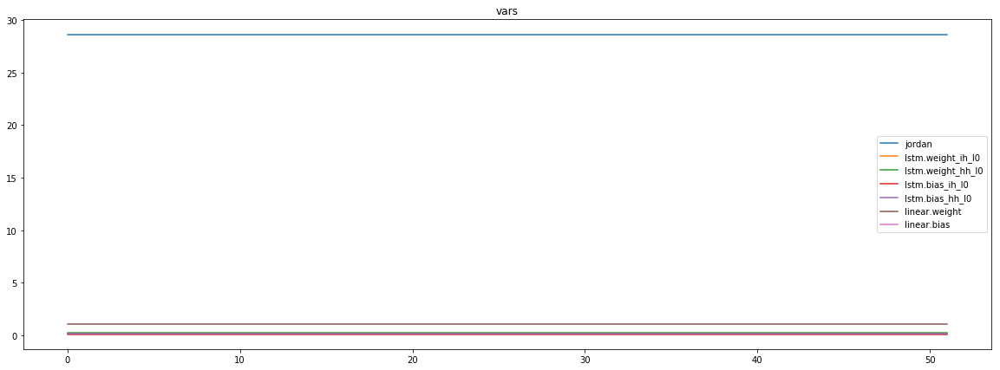

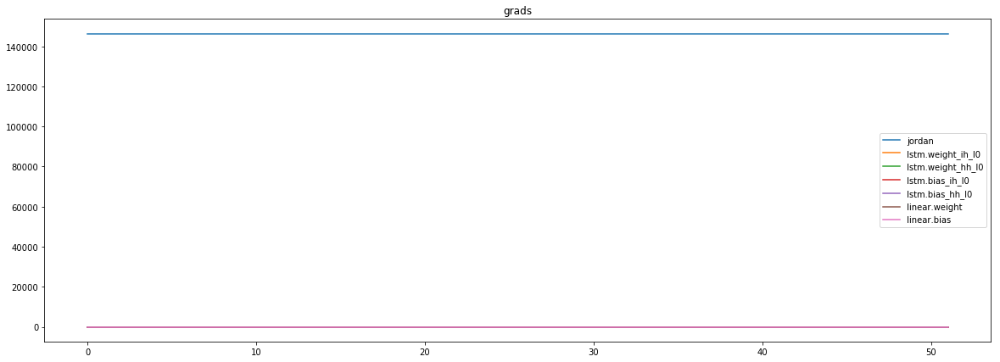

mean_p1 : -2503.9169921875
mean_p2 : 147389.34375
mean_p3 : 1481.904541015625


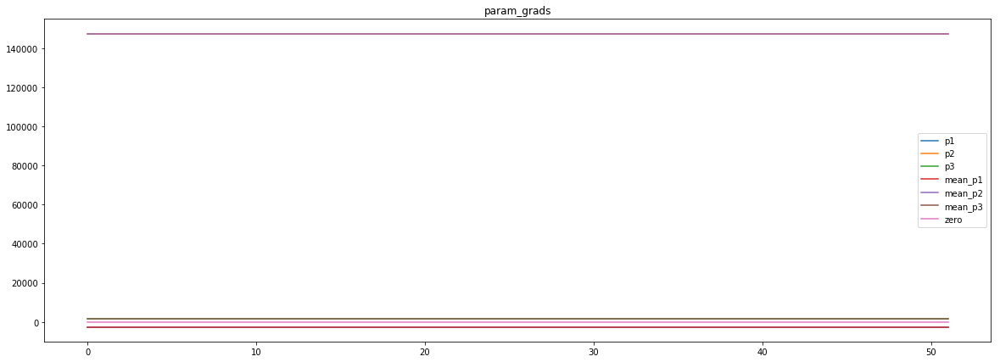

loss rate [-0.28684007774373943]
Epoch [73] 
     train_loss[758.6574413959797] 
     eval_train[1.0139673363703947] 
     eval_test[1.0356562029231677]



aux preds: 0.4530414342880249           1.0000072717666626           9.974397659301758
main loss 0.0
aux loss 36.043864250183105
jord loss 810.1780970646785
combined loss 846.2219613148616 



Parameter containing:
tensor([[0.4530, 1.0000, 9.9744]], requires_grad=True)


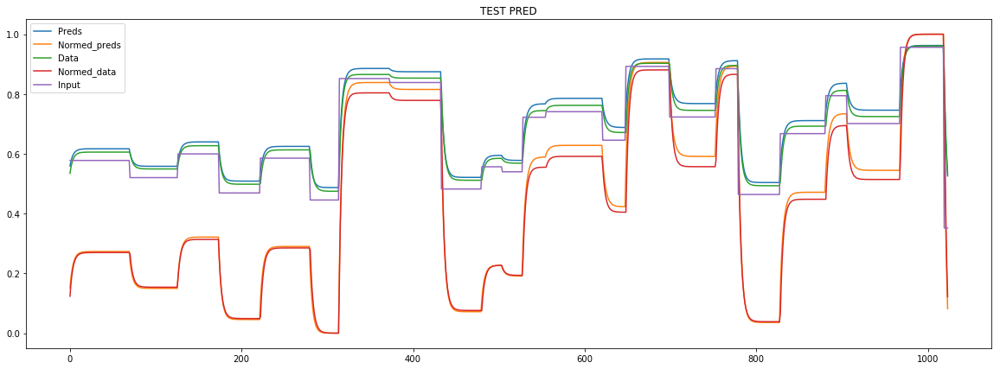

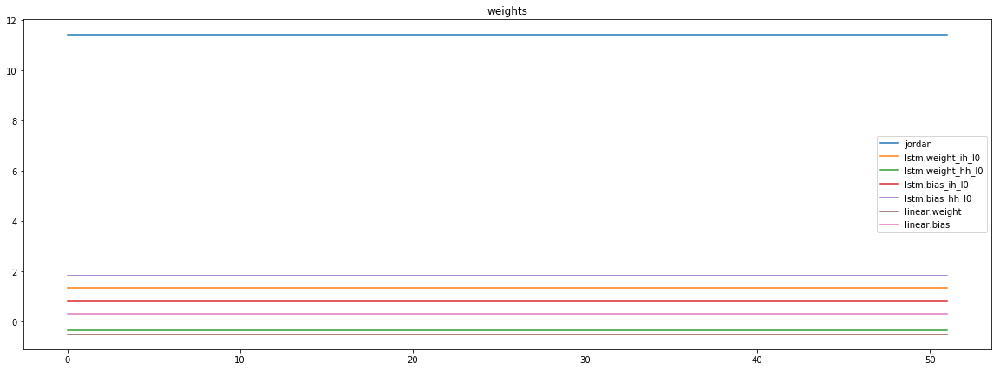

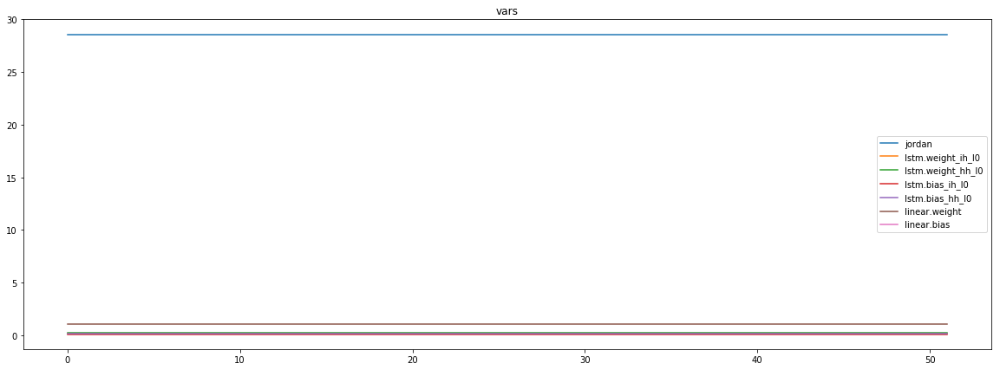

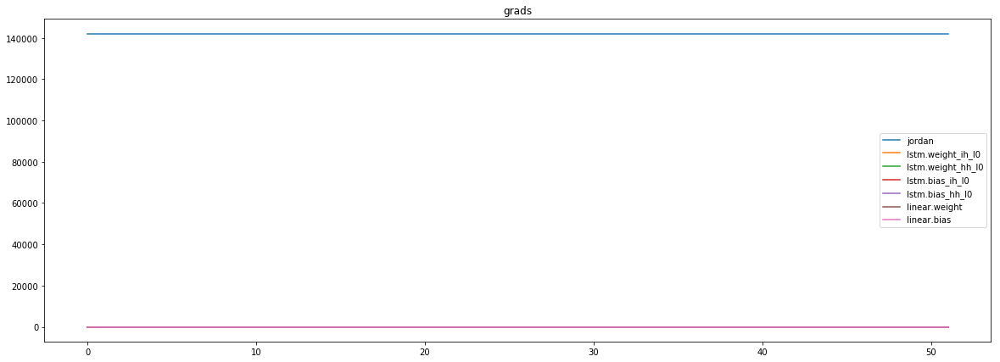

mean_p1 : 2187.092041015625
mean_p2 : 138523.5625
mean_p3 : 1403.82861328125


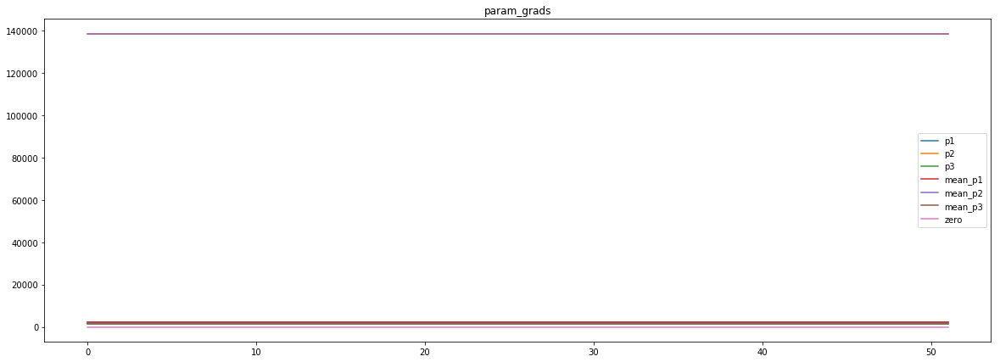

loss rate [-0.24492460621795376]
Epoch [74] 
     train_loss[846.2219613148616] 
     eval_train[1.2477121009276464] 
     eval_test[1.210438308390704]



aux preds: 0.4456232786178589           1.0007729530334473           9.976483345031738
main loss 0.0
aux loss 33.95025466038631
jord loss 743.0370301466721
combined loss 776.9872848070585 



Parameter containing:
tensor([[0.4456, 1.0008, 9.9765]], requires_grad=True)


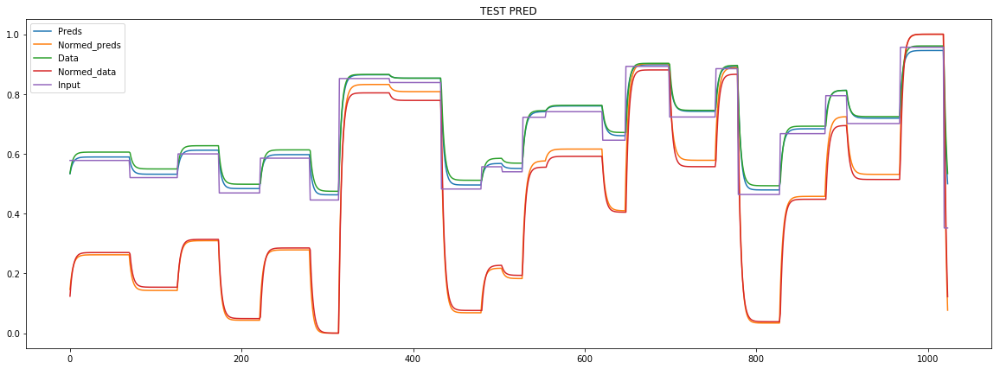

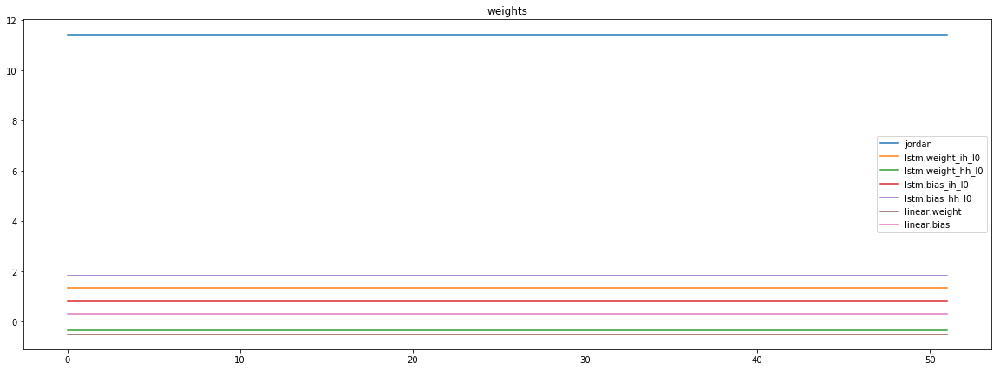

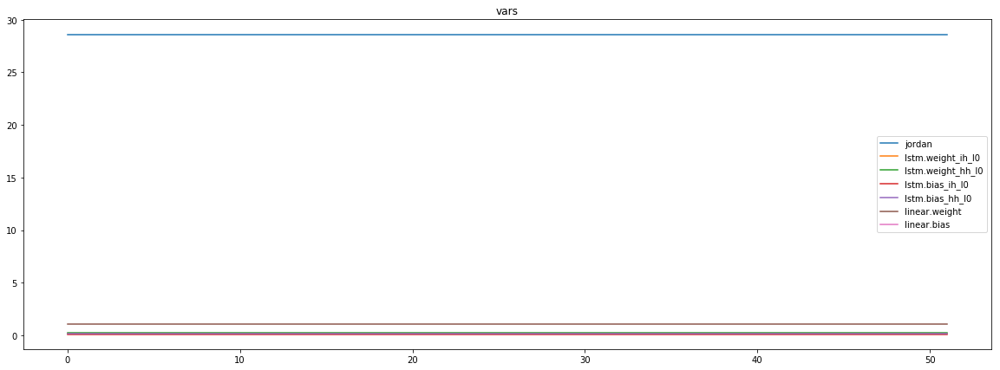

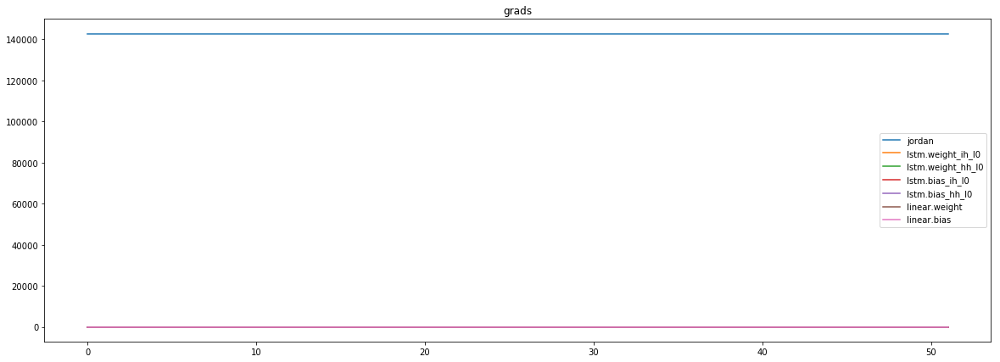

mean_p1 : 2095.289794921875
mean_p2 : 139311.5625
mean_p3 : 1413.0098876953125


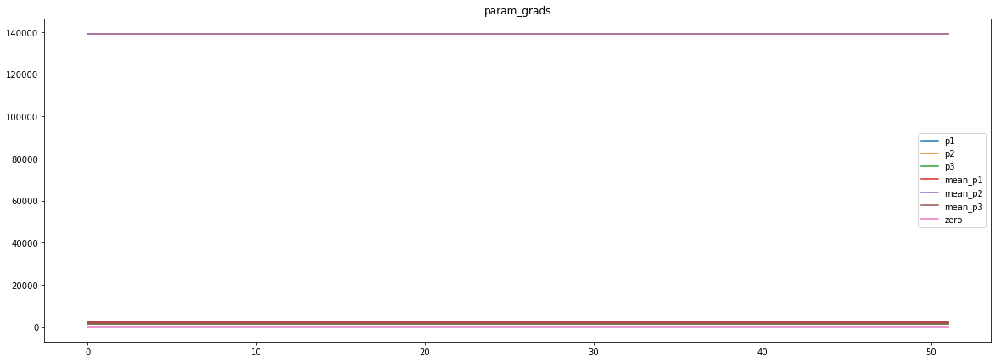

loss rate [0.384513834645429]
Epoch [75] 
     train_loss[776.9872848070585] 
     eval_train[0.7266299695922778] 
     eval_test[0.7364288703961805]



aux preds: 0.4518340229988098           0.9983264207839966           9.977184295654297
main loss 0.0
aux loss 35.006745741917534
jord loss 761.6662521362305
combined loss 796.672997878148 



Parameter containing:
tensor([[0.4518, 0.9983, 9.9772]], requires_grad=True)


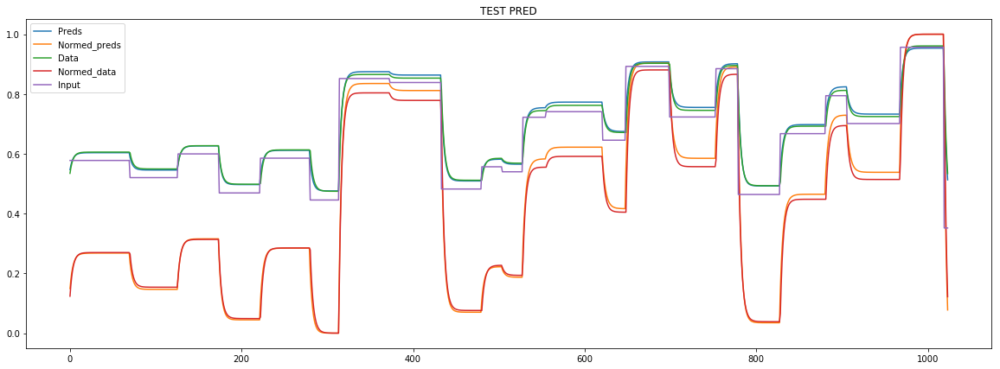

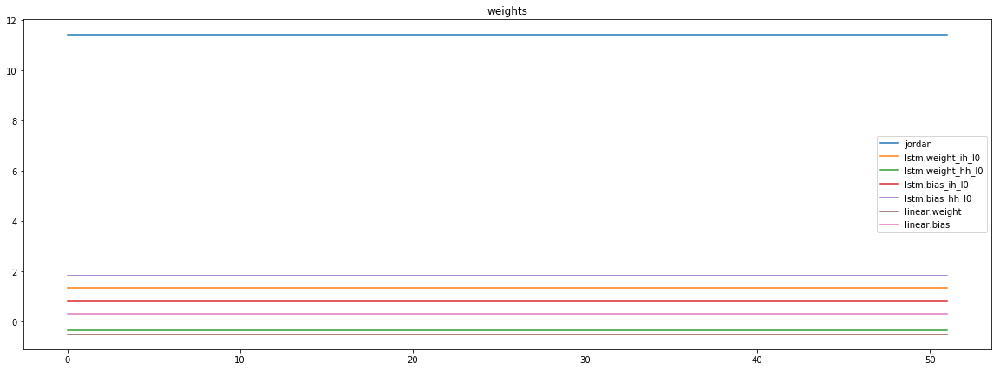

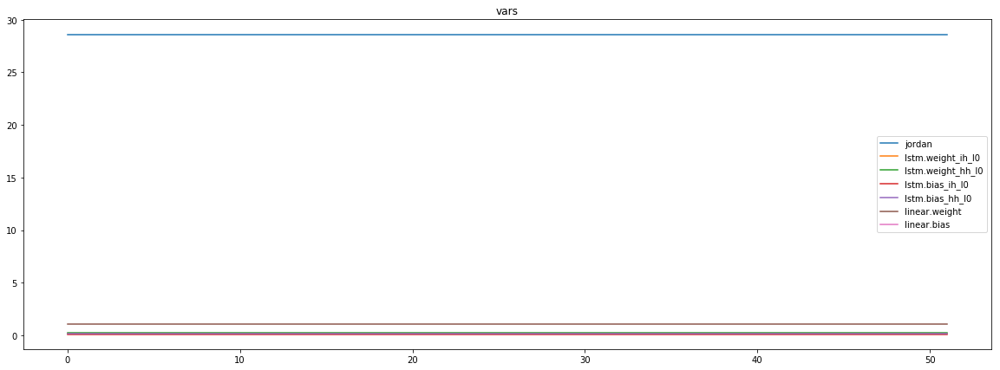

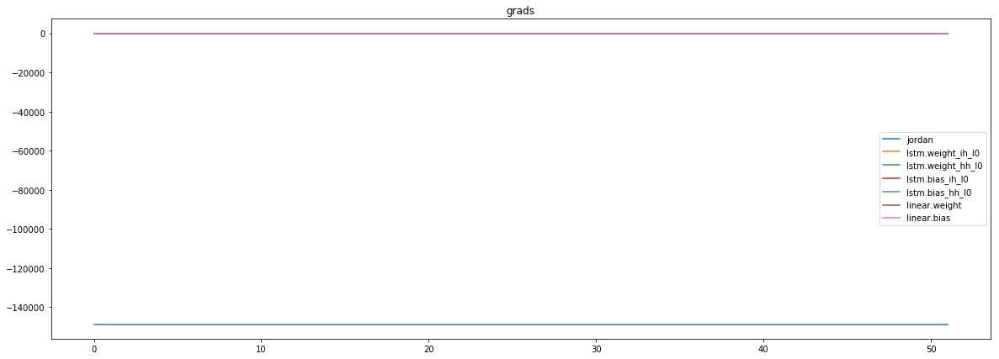

mean_p1 : -2303.36962890625
mean_p2 : -144977.59375
mean_p3 : -1450.95068359375


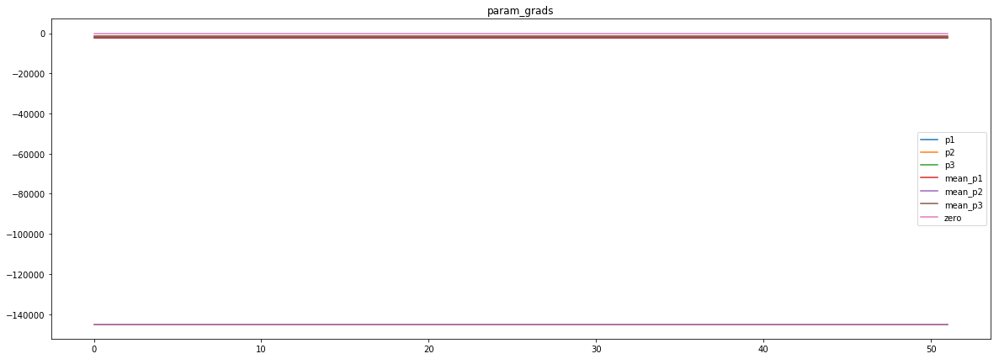

loss rate [0.4218406164617855]
Epoch [76] 
     train_loss[796.672997878148] 
     eval_train[0.6056583162683707] 
     eval_test[0.5747912932525981]



aux preds: 0.4484640061855316           0.9986276030540466           9.979801177978516
main loss 0.0
aux loss 29.692145347595215
jord loss 752.1562411968524
combined loss 781.8483865444476 



Parameter containing:
tensor([[0.4485, 0.9986, 9.9798]], requires_grad=True)


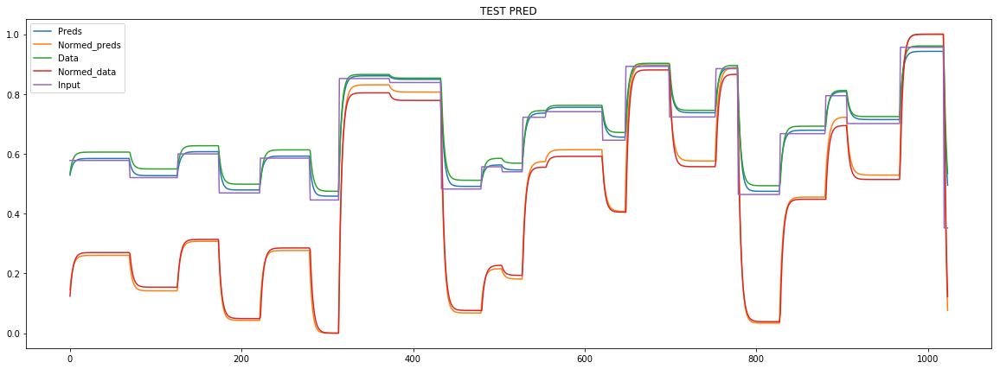

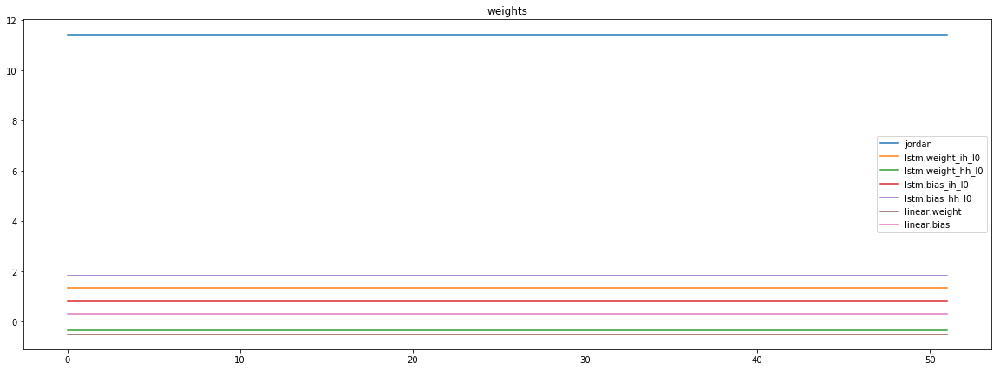

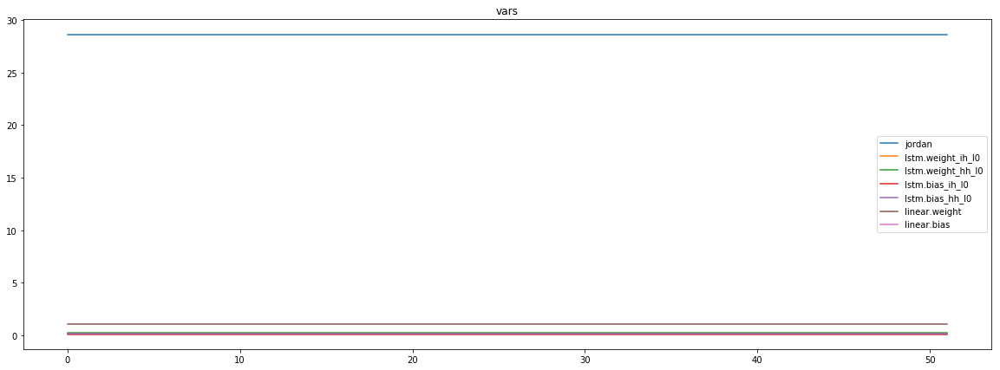

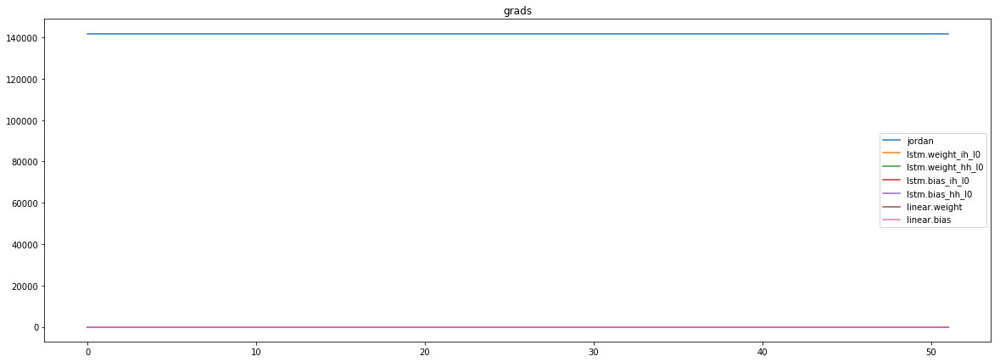

mean_p1 : -3105.680908203125
mean_p2 : 143555.59375
mean_p3 : 1443.7060546875


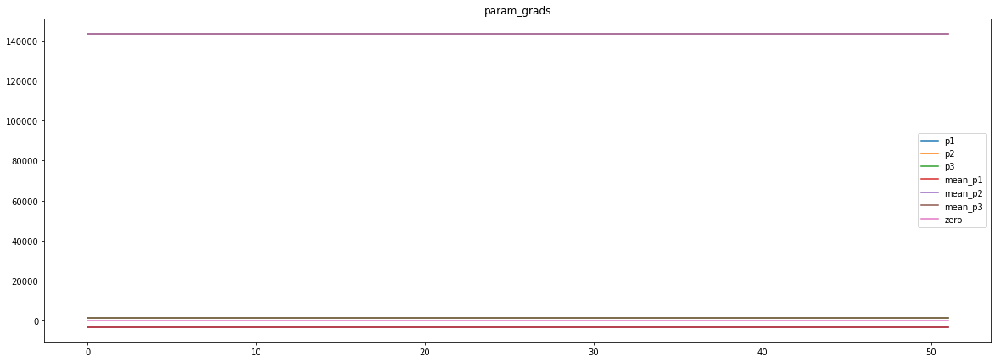

loss rate [-0.18151839653307644]
Epoch [77] 
     train_loss[781.8483865444476] 
     eval_train[0.9728352530644491] 
     eval_test[0.993128624829379]



aux preds: 0.44929787516593933           1.000299096107483           9.980319023132324
main loss 0.0
aux loss 31.374884091890774
jord loss 722.1587354219877
combined loss 753.5336195138784 



Parameter containing:
tensor([[0.4493, 1.0003, 9.9803]], requires_grad=True)


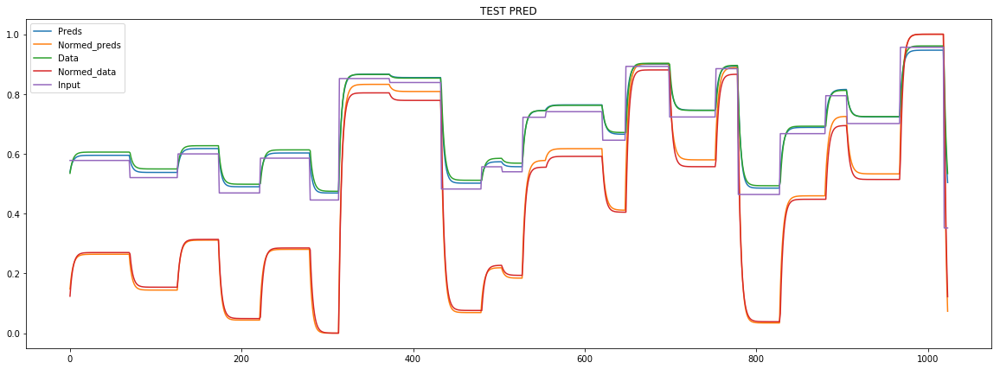

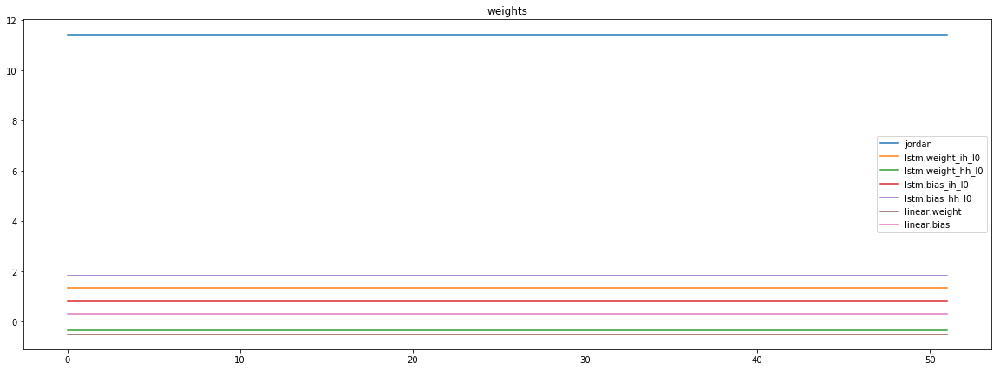

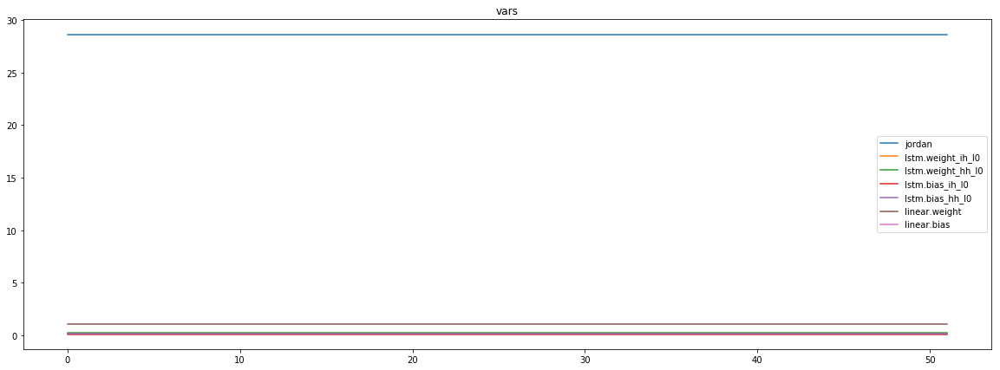

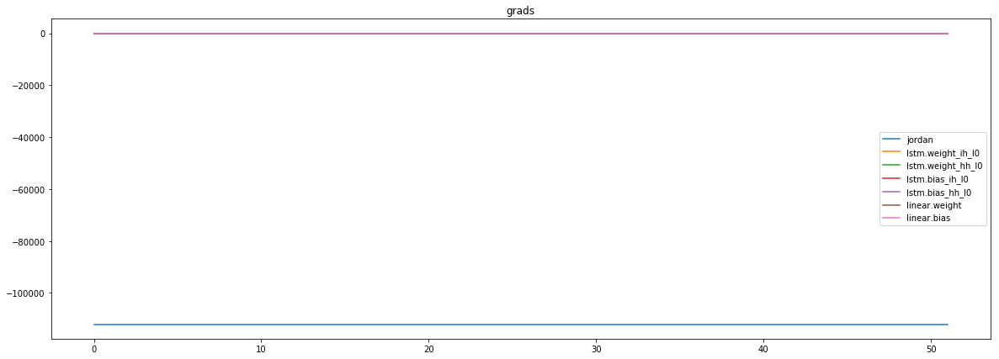

mean_p1 : 5337.548828125
mean_p2 : -116159.7578125
mean_p3 : -1180.6339111328125


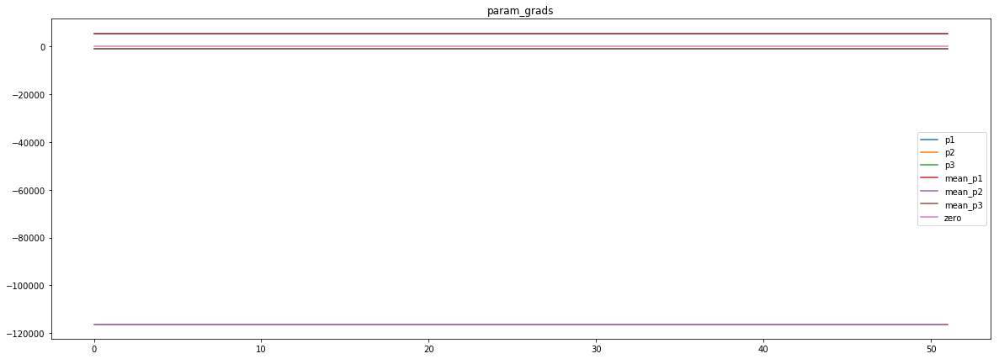

loss rate [0.2524692714125404]
Epoch [78] 
     train_loss[753.5336195138784] 
     eval_train[0.5776272926193017] 
     eval_test[0.5741905095902357]



aux preds: 0.4471014440059662           0.9993808269500732           9.975642204284668
main loss 0.0
aux loss 30.366786663348858
jord loss 718.1866572453425
combined loss 748.5534439086914 



Parameter containing:
tensor([[0.4471, 0.9994, 9.9756]], requires_grad=True)


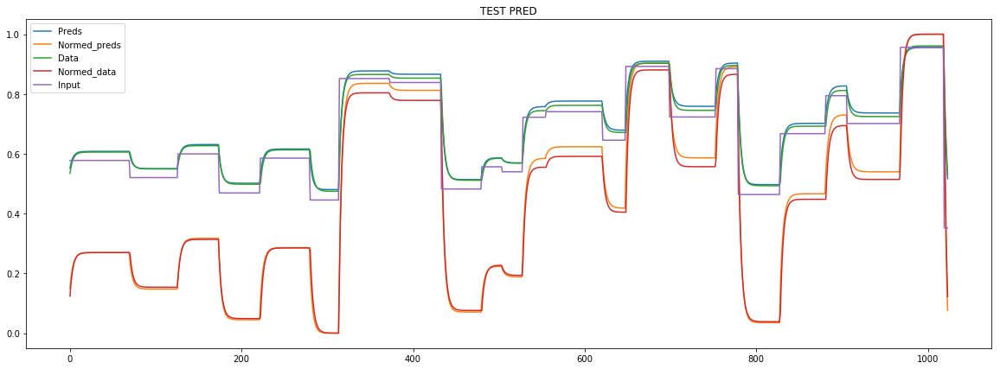

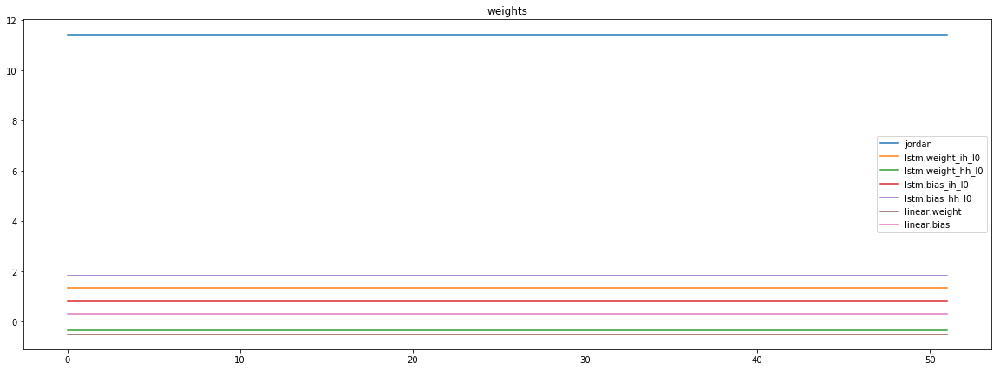

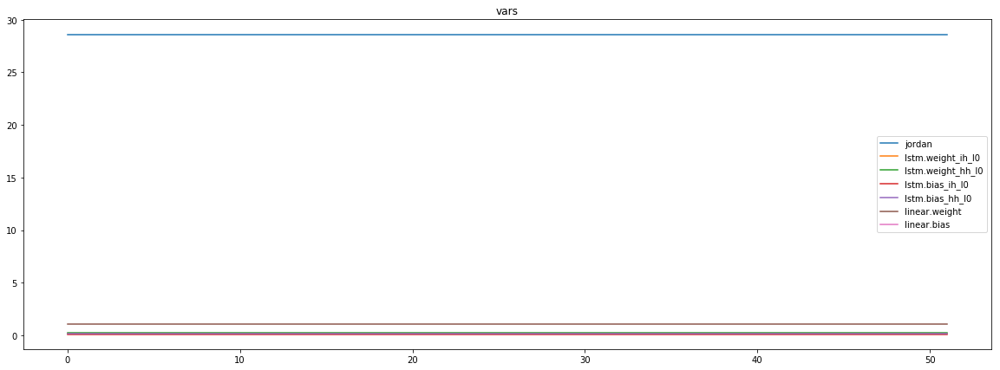

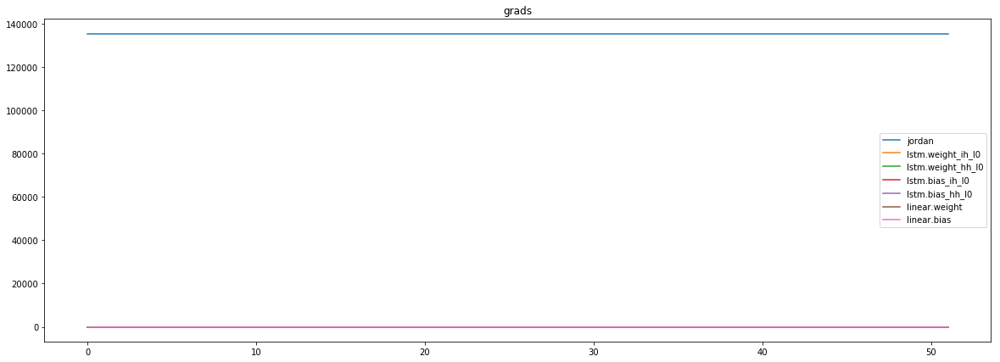

mean_p1 : 2323.634033203125
mean_p2 : 131764.796875
mean_p3 : 1347.37353515625


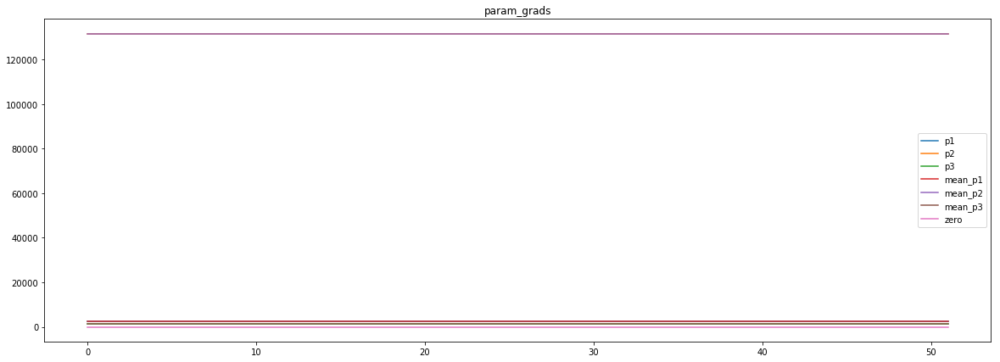

loss rate [-0.008602692144351165]
Epoch [79] 
     train_loss[748.5534439086914] 
     eval_train[0.761729536148218] 
     eval_test[0.7201794480735605]


In [21]:
logging.info("Training process STARTED")

model.hidden = model.init_hidden()


for t in range(num_epochs):
    
    batch_local_hist = hist["train"]["batches"]
    long_term_hist = hist["train"]["epochs"]
    
    for i, data in enumerate(tqdm(train_dl)):
        
        model.hidden = model.init_hidden()
        
        y_pred, jordan = batch_iteration(
            iter_index=i,
            model=model,
            optimizer=optimizer,
            batch_data=data,
            backprop=True,
            hist_part=batch_local_hist
        )
        
    hist['mean_params_sample']['1'][t] = jordan[:, 0].item()
    hist['mean_params_sample']['2'][t] = jordan[:, 1].item()
    hist['mean_params_sample']['3'][t] = jordan[:, 2].item()
    
    print(f"aux preds: {hist['mean_params_sample']['1'][t]} \
          {hist['mean_params_sample']['2'][t]} \
          {hist['mean_params_sample']['3'][t]}")
    
    mean_losses = update_long_term_hist(batches_hist=batch_local_hist,
                                                            long_term_hist=long_term_hist)
    mean_main, mean_aux, mean_jord = mean_losses
    # TODO add w8 decay
    print(f"main loss {mean_main}")
    print(f"aux loss {mean_aux}")
    print(f"jord loss {mean_jord}")
    print(f"combined loss {sum(mean_losses)} ")
    
    # VISUALISE TRAINING PROGRESS
#     x_batch, y_batch, indexes = data
#     plot_shared_scale([
#         (y_pred[:, 0].detach().numpy(),"Preds" ),
#          (y_batch[:, 0].detach().numpy(), "Data"),
#          (x_batch[-1].detach().numpy(), "Input")
#         ],
#         title="TRAIN PREDICT")
          
#     residuals = y_batch[:, 0] - y_pred[:, 0]
#     plot_multiscale([
#         (residuals.detach().numpy(), "Red"),
#         (y_batch[:, 0].detach().numpy(), "Green"),
#         (y_pred[:, 0].detach().numpy(), "Brown")
#     ],
#         title="TRAIN RESID"
#     ) 
    # /VISUALISE TRAINING PROGRESS

    # EVAL
    with torch.no_grad():
          
          model = model.eval()
          
          for i, data in enumerate(tqdm(train_dl)):
              batch_local_hist = hist['eval_train']['batches']
              long_term_hist=hist["eval_train"]["epochs"]
              y_pred, jordan = batch_iteration(
                iter_index=i,
                model=model,
                optimizer=optimizer,
                batch_data=data,
                backprop=False,
                hist_part=batch_local_hist
              )
          
          update_long_term_hist(batches_hist=batch_local_hist,
                                long_term_hist=long_term_hist)
          
          
          for i, data in enumerate(tqdm(test_dl)):
              batch_local_hist = hist['eval_test']['batches']
              long_term_hist=hist["eval_test"]["epochs"]
          
              y_pred_test, jordan = batch_iteration(
                iter_index=i,
                model=model,
                optimizer=optimizer,
                batch_data=data,
                backprop=False,
                hist_part=batch_local_hist
              )
          
          update_long_term_hist(batches_hist=batch_local_hist,
                                long_term_hist=long_term_hist)
          
          model = model.train()
    # /EVAL
          
    # VISUALISE ITERATION PRED
    x_batch_test, y_batch_test, indexes = data
    print(jordan)
          
    sample_y_pred_test = y_pred_test[:, 0].detach().numpy().copy()
    sample_y_pred_test -= np.min(sample_y_pred_test)
    sample_y_pred_test /= (np.max(sample_y_pred_test) - np.min(sample_y_pred_test))
    normed_data = y_batch_test[:, 0].detach().numpy().copy()
    normed_data -= np.min(normed_data)
    normed_data /= (np.max(normed_data) - np.min(normed_data))
    plot_shared_scale([
            (y_pred_test[:, 0].detach().numpy(), "Preds"),
            (sample_y_pred_test,"Normed_preds" ),
             (y_batch_test[:, 0].detach().numpy(), "Data"),
             (normed_data, "Normed_data"),
             (x_batch_test[-1].detach().numpy(), "Input")
    ],
        title = 'TEST PRED'
    )
    
#           print(y_pred.detach().numpy() == y_batch().detach().numpy())
#     plt.plot(y_pred.detach().numpy())
#     plt.show()
    
          # /VISUALISE ITERATION PRED
   
               
    plot_shared_scale([(v,k)for k, v in hist['weights']['batches'].items()], title='weights')
    plot_shared_scale([(v,k)for k, v in hist['vars']['batches'].items()], title='vars')
    plot_shared_scale([(v,k)for k, v in hist['grads']['batches'].items()], title='grads')
    
    param_grads = [(v,k) for k, v in hist['param_grads']['batches'].items()]
    param_grads_means = [ (np.full(v.shape, np.mean(v)), 'mean_' + k ) for v,k in param_grads]
    for par_gr_mean, name in param_grads_means:
          print(f"{name} : {par_gr_mean[0]}")
    plot_shared_scale(param_grads + param_grads_means +
                      [(np.zeros(len(train_dl)), 'zero')], title='param_grads')
          
    visualise_resid = False
    if visualise_resid:
        residuals = y_batch_test[:, 0] - y_pred_test[:, 0]
        plot_multiscale(
                [
                 (residuals.detach().numpy(), "Red"), 
                 (y_batch_test[:, 0].detach().numpy(),"Green")
                ],
            title = 'TEST RESID'
        )
    
    
    # UPDATE LR
    val_loss = slice_loss_sum(hist['eval_test']['epochs'], t)
    scheduler.step(val_loss)
    hist['weights_sum'][t] = torch.as_tensor([p.sum() for p in model.parameters(recurse=True)]).sum().item()
    hist['weights_var'][t] = torch.as_tensor([p.var() for p in model.parameters(recurse=True)]).sum().item()
    
    for name, parameter in model.named_parameters():
          hist['grads']['epochs'][name][t] = np.mean(hist['grads']['batches'][name])
          hist['weights']['epochs'][name][t] = np.mean(hist['weights']['batches'][name])
          hist['vars']['epochs'][name][t] = np.mean(hist['vars']['batches'][name])
    hist['param_grads']['epochs']['p1'][t] = np.mean(hist['param_grads']['batches']['p1'])
    hist['param_grads']['epochs']['p2'][t] = np.mean(hist['param_grads']['batches']['p2'])

    hist['param_grads']['epochs']['p3'][t] = np.mean(hist['param_grads']['batches']['p3'])
          
          
    
    hist['lr'][t] = scheduler.optimizer.param_groups[0]['lr']
#     if hist['lr'][t] <= 10**p_sched['early_stop_order'] * 1.0001: # 1+eps 
#           print("Loss critically low, EARLY STOPPING")
#           break
          
    if t > 3:
          h = hist["eval_test"]["epochs"]
          loss_rate = 1 - slice_loss_sum(h, t) / np.mean([slice_loss_sum(h, k) for k in range(t-3,t)])          
          hist['loss_rate'][t] = loss_rate              
          print(f"loss rate [{loss_rate}]")
    # /UPDATE LR
                       
    # FINAL PROGRESS LOGGING
    msg = "Epoch [{t}] \n \
    train_loss[{train_loss}] \n \
    eval_train[{eval_train}] \n \
    eval_test[{eval_test}]".format(t=t,
                                train_loss=sum([val[t] for val in hist['train']['epochs'].values()]), 
                                eval_train=sum([val[t] for val in hist['eval_train']['epochs'].values()]),
                                eval_test=sum([val[t] for val in hist['eval_test']['epochs'].values()])
                               )
    print(msg)
    logging.info(msg)
                       
    # /FINAL PROGRESS LOGGING

In [22]:
timestamp = datetime.datetime.now().strftime("%d_%B_%I_%M%p")
specifier = f"{p_net['jordan_nodes']}_{p_net['num_layers']}l_{p_net['hidden_size']}n_{int(p_net['bias'])}b"
print(specifier)
print(timestamp)
specifier = f"{p_net['num_layers']}l {p_net['hidden_size']}h {int(p_net['bias'])}b"
filename = f'jordan_full_blind_par_004_output_weights_with_grads_{specifier}_{timestamp}.pt'
torch.save(model, filename)
filename

3_1l_2n_1b
19_May_01_29AM


'jordan_full_blind_par_004_output_weights_1l 2h 1b_19_May_01_29AM.pt'

In [23]:

filename

'jordan_full_blind_par_004_output_weights_1l 2h 1b_19_May_01_29AM.pt'

In [24]:
def get_size(dicts):
    acc = 0
    for key, val in dicts.items():
        if type(val) == dict:
            print(key)
            acc += get_size(val)            
        else:
            acc+=sys.getsizeof(val)
    return acc

In [25]:

get_size(hist) / 1024

train
batches
epochs
eval_train
batches
epochs
eval_test
batches
epochs
mean_params_sample
grads
batches
epochs
weights
batches
epochs
vars
batches
epochs
param_grads
batches
epochs
grad_global


328.515625

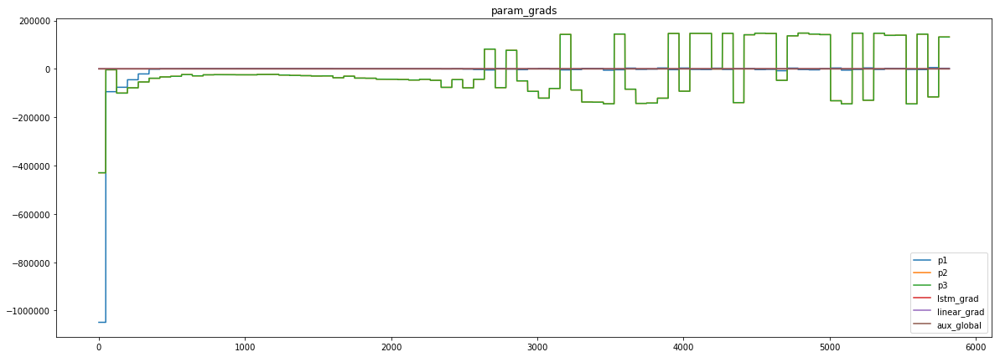

In [26]:
s = 100
e = -1
plot_shared_scale([
    (hist['grad_global']['p1'][s:e], 'p1'),
    (hist['grad_global']['p2'][s:e], 'p2'),
    (hist['grad_global']['p2'][s:e], 'p3'),
    (hist['grad_global']['lstm'][s:e], 'lstm_grad'),
    (hist['grad_global']['linear'][s:e], 'linear_grad'),
    (hist['aux_global'][s:e], 'aux_global')
], title="param_grads")
s =  10
e = -1

In [27]:
s, e = 0, t

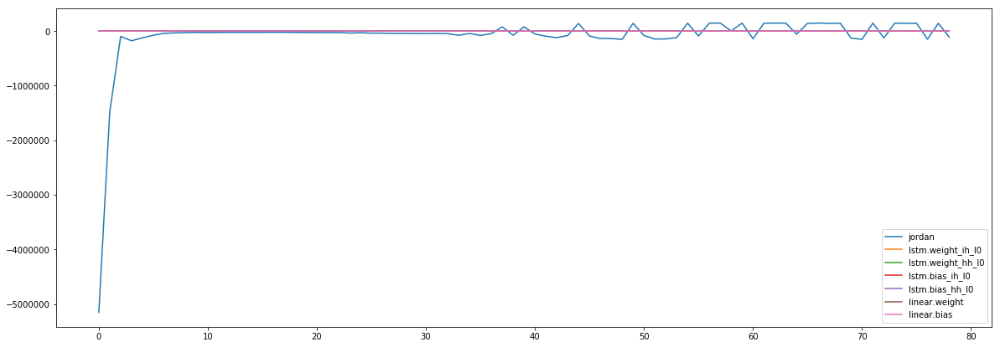

In [28]:
plot_shared_scale([(v[s:e],k)for k, v in hist['grads']['epochs'].items()])

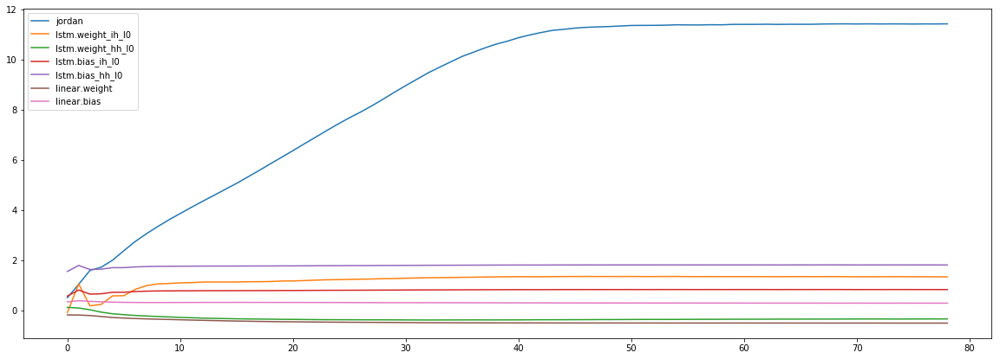

In [29]:
plot_shared_scale([(v[s:e],k)for k, v in hist['weights']['epochs'].items()])

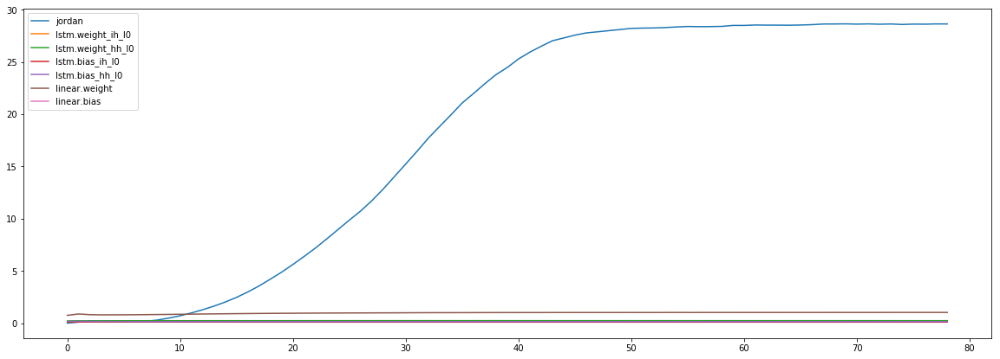

In [30]:
plot_shared_scale([(v[s:e],k)for k, v in hist['vars']['epochs'].items()])

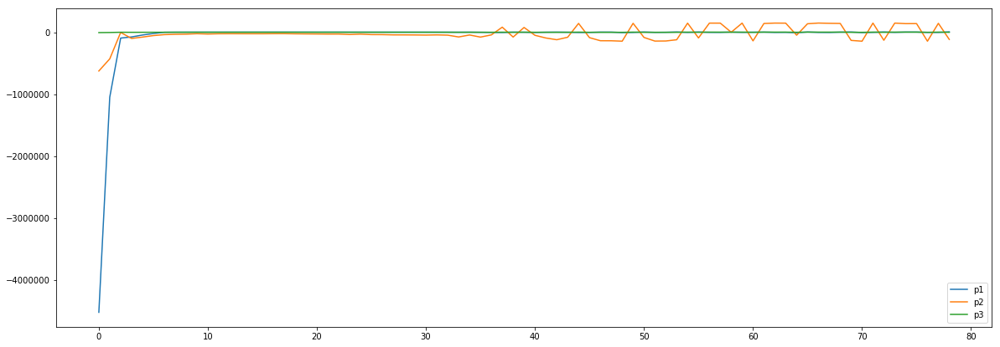

In [31]:
s = 0
plot_shared_scale([(v[s:e],k)for k, v in hist['param_grads']['epochs'].items()])

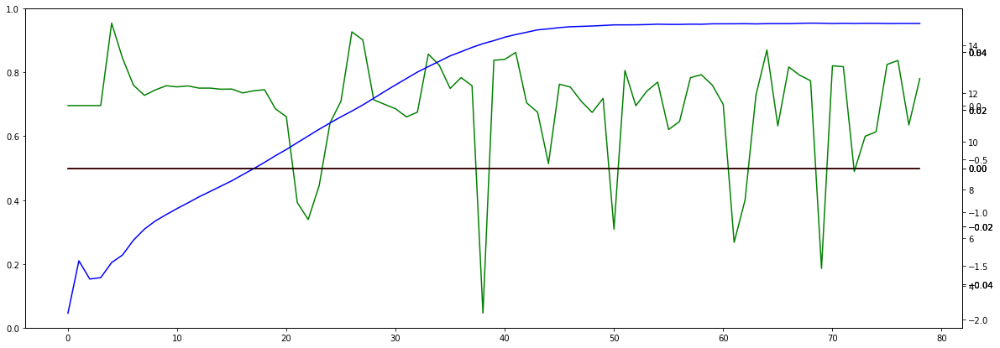

In [32]:
s, e = 0, t
plot_multiscale([
    (hist['lr'][s:e],"Red" ),
    (hist['loss_rate'][s:e], "Green"),
    (hist['weights_sum'][s:e], "Blue"),
    (hist['weights_var'][s:e], "Yellow"),
    (hist['eval_test']['epochs']['aux'][s:e], "Black")
])

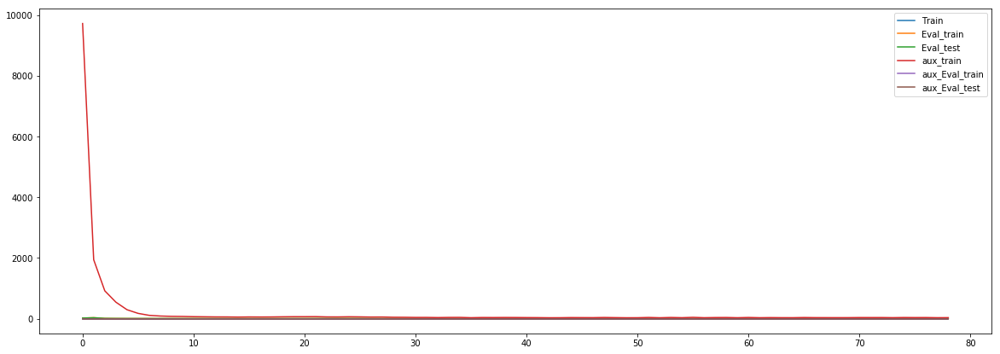

In [33]:
plot_shared_scale([
    (hist['train']["epochs"]['main'][s:e],"Train" ),
    (hist['eval_train']["epochs"]['main'][s:e], "Eval_train"),
    (hist['eval_test']["epochs"]['main'][s:e], "Eval_test"),
    (hist['train']["epochs"]['aux'][s:e], "aux_train"),
    (hist['eval_train']['epochs']['aux'][s:e], "aux_Eval_train"),
    (hist['eval_test']['epochs']['aux'][s:e], "aux_Eval_test")
])

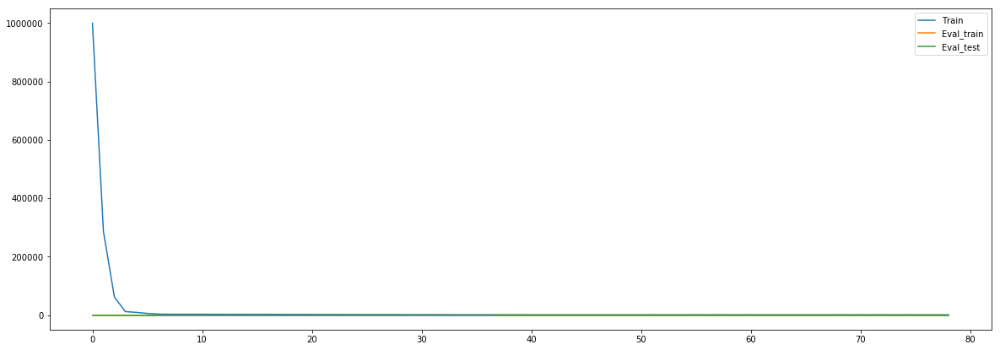

In [34]:
plot_shared_scale([
    (hist['train']["epochs"]['jordan'][s:e],"Train" ),
    (hist['eval_train']["epochs"]['jordan'][s:e], "Eval_train"),
    (hist['eval_test']["epochs"]['jordan'][s:e], "Eval_test"),
#     (hist['train']["epochs"]['aux'][s:e], "aux_train"),
#     (hist['eval_train']['epochs']['aux'][s:e], "aux_Eval_train"),
#     (hist['eval_test']['epochs']['aux'][s:e], "aux_Eval_test")
])

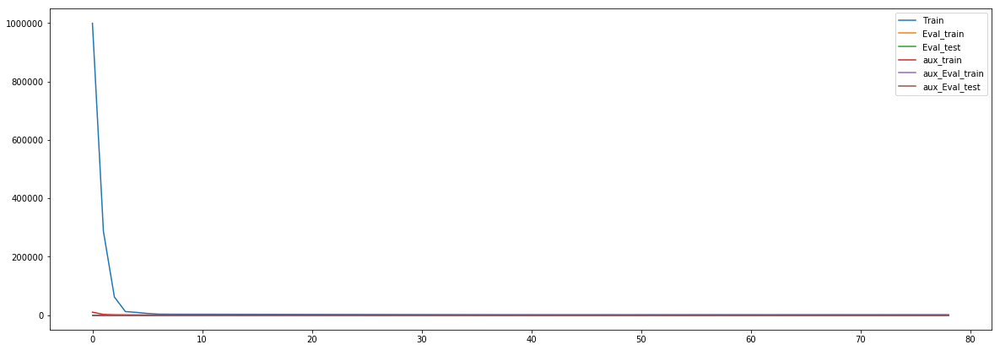

In [35]:
plot_shared_scale([
    (hist['train']["epochs"]['jordan'][s:e],"Train" ),
    (hist['eval_train']["epochs"]['jordan'][s:e], "Eval_train"),
    (hist['eval_test']["epochs"]['jordan'][s:e], "Eval_test"),
    (hist['train']["epochs"]['aux'][s:e], "aux_train"),
    (hist['eval_train']['epochs']['aux'][s:e], "aux_Eval_train"),
    (hist['eval_test']['epochs']['aux'][s:e], "aux_Eval_test")
])

In [36]:
# To the prove of faster convergence

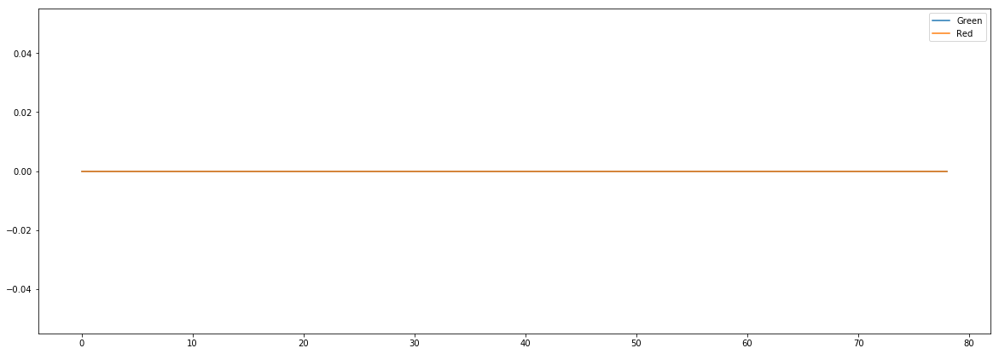

In [37]:
plot_shared_scale(
[
    (hist['eval_test']["epochs"]['jordan'][s:e], 'Green'),
    
    (hist['eval_test']["epochs"]['aux'][s:e], 'Red'),
]
)

In [38]:
for n, v in model.named_parameters():
    print(n, "\t", v.shape, "\t", v.sum())

jordan 	 torch.Size([1, 3]) 	 tensor(11.4221, grad_fn=<SumBackward0>)
lstm.weight_ih_l0 	 torch.Size([8, 4]) 	 tensor(1.3469, grad_fn=<SumBackward0>)
lstm.weight_hh_l0 	 torch.Size([8, 2]) 	 tensor(-0.3318, grad_fn=<SumBackward0>)
lstm.bias_ih_l0 	 torch.Size([8]) 	 tensor(0.8387, grad_fn=<SumBackward0>)
lstm.bias_hh_l0 	 torch.Size([8]) 	 tensor(1.8198, grad_fn=<SumBackward0>)
linear.weight 	 torch.Size([1, 2]) 	 tensor(-0.4990, grad_fn=<SumBackward0>)
linear.bias 	 torch.Size([1]) 	 tensor(0.2967, grad_fn=<SumBackward0>)


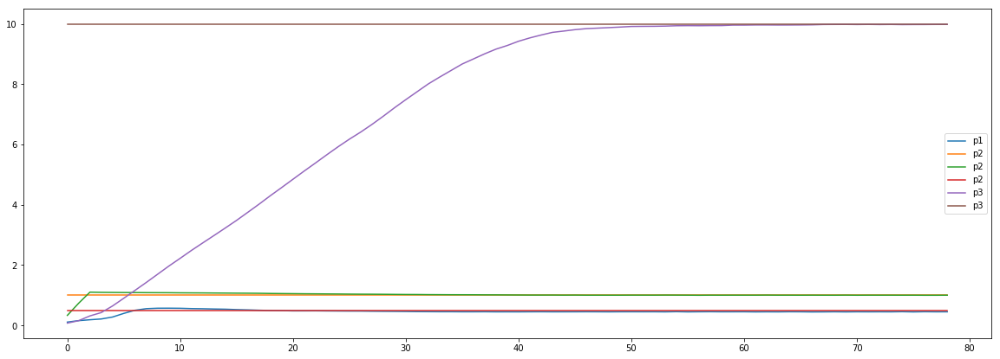

In [39]:
plot_shared_scale([
                  (hist['mean_params_sample']['1'][s:e], "p1"),
                  ((hist['mean_params_sample']['2']*0 + 1)[s:e], "p2"),
                  (hist['mean_params_sample']['2'][s:e], "p2"),
                  ((hist['mean_params_sample']['2']*0 + 0.5)[s:e], "p2"),
    (hist['mean_params_sample']['3'][s:e], "p3"),
                  ((hist['mean_params_sample']['2']*0 + 10)[s:e], "p3")
])

In [40]:
model.buffers

<bound method Module.buffers of LSTM_jordan(
  (lstm): LSTM(4, 2)
  (linear): Linear(in_features=2, out_features=1, bias=True)
)>

In [41]:
logging.info("Training process END")